In [1]:
import torch
from torch import nn
from torch.nn import functional as F
from torchvision import datasets
from torch.optim.lr_scheduler import StepLR
from torch.utils.tensorboard import SummaryWriter
from torchvision import datasets, transforms
import torch.utils.data as data_utils
from torch.autograd import Variable
import pickle
from sklearn.model_selection import train_test_split
import math
import os           
import re
from collections import Counter
from functools import partial
from torch import optim
from torchsummary import summary
from efficientnet import EfficientNet
from Radam import RAdam
import random
import numpy as np
from sklearn.model_selection import KFold
import matplotlib.pyplot as plt

In [2]:
torch.cuda.is_available()

/home/geonwon/anaconda3/envs/base2/lib/python3.9/site-packages/torch/cuda/__init__.py:52: UserWarning: CUDA initialization: Unexpected error from cudaGetDeviceCount(). Did you run some cuda functions before calling NumCudaDevices() that might have already set an error? Error 804: forward compatibility was attempted on non supported HW (Triggered internally at  ../c10/cuda/CUDAFunctions.cpp:109.)
  return torch._C._cuda_getDeviceCount() > 0


False

In [3]:
allele = 'phospho-B-15'
model = EfficientNet.from_name(f'efficientnet-{allele}')

efficientnet-phospho-B-15


In [4]:
model

EfficientNet(
  (_conv_stem): Conv2dStaticSamePadding(
    1, 8, kernel_size=(3, 3), stride=(2, 2), bias=False
    (static_padding): ZeroPad2d(padding=(1, 1, 0, 1), value=0.0)
  )
  (_bn0): BatchNorm2d(8, eps=0.001, momentum=0.010000000000000009, affine=True, track_running_stats=True)
  (_blocks): ModuleList(
    (0): MBConvBlock(
      (_depthwise_conv): Conv2dStaticSamePadding(
        8, 8, kernel_size=(3, 3), stride=[1, 1], groups=8, bias=False
        (static_padding): ZeroPad2d(padding=(1, 1, 1, 1), value=0.0)
      )
      (_bn1): BatchNorm2d(8, eps=0.001, momentum=0.010000000000000009, affine=True, track_running_stats=True)
      (_se_reduce): Conv2dStaticSamePadding(
        8, 2, kernel_size=(3, 3), stride=(1, 1)
        (static_padding): ZeroPad2d(padding=(1, 1, 1, 1), value=0.0)
      )
      (_se_expand): Conv2dStaticSamePadding(
        2, 8, kernel_size=(3, 3), stride=(1, 1)
        (static_padding): ZeroPad2d(padding=(1, 1, 1, 1), value=0.0)
      )
      (_project_conv

In [5]:
def precision_recall(y_true, y_pred):
    '''Calculate F1 score. Can work with gpu tensors
    
    The original implmentation is written by Michal Haltuf on Kaggle.
    
    Returns
    -------
    torch.Tensor
        `ndim` == 1. epsilon <= val <= 1
    
    Reference
    ---------
    - https://www.kaggle.com/rejpalcz/best-loss-function-for-f1-score-metric
    - https://scikit-learn.org/stable/modules/generated/sklearn.metrics.f1_score.html#sklearn.metrics.f1_score
    - https://discuss.pytorch.org/t/calculating-precision-recall-and-f1-score-in-case-of-multi-label-classification/28265/6
    - http://www.ryanzhang.info/python/writing-your-own-loss-function-module-for-pytorch/
    '''


    tp = (y_true * y_pred).sum().to(torch.float32)
    tn = ((1 - y_true) * (1 - y_pred)).sum().to(torch.float32)
    fp = ((1 - y_true) * y_pred).sum().to(torch.float32)
    fn = (y_true * (1 - y_pred)).sum().to(torch.float32)
    
    epsilon = 1e-7
    
    precision = tp / (tp + fp + epsilon)
    recall = tp / (tp + fn + epsilon)
    specificity = tn / (tn + fp + epsilon)
    
    f1 = 2 * (precision*recall) / (precision + recall + epsilon)

    return precision, recall, f1

In [6]:
def get_tpr(y_true,y_scores,threshold):
    predict_positive_num = len(y_scores[y_scores >= threshold]) 
    tp = len([x for x in y_true[:predict_positive_num] if x == 1])
    ground_truth = len(y_true[y_true==1]) 
    tpr =  tp / ground_truth
    return tpr
    
def get_fpr(y_true,y_scores,threshold):
    predict_positive_num = len(y_scores[y_scores >= threshold] )
    fp = len([x for x in y_true[:predict_positive_num] if x == 0 ])
    ground_negative = len(y_true[y_true==0])
    fpr = fp / ground_negative
    return fpr

In [7]:
from sklearn.metrics import accuracy_score, roc_curve, roc_auc_score, f1_score
from tqdm import tqdm_notebook
from tqdm.notebook import tnrange, tqdm
import time
import scikitplot as skplt



def train_model(model, optimizer, scheduler, num_epochs):
    global best_acc
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    since = time.time()

    best_model_wts = model.state_dict()
    best_loss = 1000.0
    best_acc = 0

    
    if torch.cuda.device_count() > 1:
        print("Training on ", torch.cuda.device_count(), "GPUs!")
        model = nn.DataParallel(model)

    model.to(device)
    #criterion.to(device)
    for epoch in tqdm(range(num_epochs)):
        print('-' * 60)
        print('Epoch {}/{}'.format(epoch+1, num_epochs))
        
        # training step
        global Trainfprs, Traintprs, Trainthresholds, TrainTruedata, TrainScoredata, TrainLossdata
        optimizer.step()
        scheduler.step()
        model.train(True)
        training_loss = 0.0
        training_corrects = 0.0
        training_precision, training_recall, training_f1 = 0.0, 0.0, 0.0
        TrainTruedata, TrainScoredata, TrainLossdata  = [],[],[]
        Trainfprs, Traintprs, Trainthresholds = 0.0, 0.0, 0.0
        

        for data in tqdm(dataloaders['train']):
             # get the inputs
            inputs, labels = data
#            inputs = Variable(inputs.to(device, dtype=torch.float))
#            labels = Variable(labels.to(device))
            inputs = inputs.to(device, dtype=torch.float32).clone().detach()
            labels = labels.to(device).clone().detach()
        
            # zero the parameter gradients
            optimizer.zero_grad()

            # forward
            outputs = model(inputs)
            preds = (outputs>=0.5).float()
            precision, recall, f1 = precision_recall(labels.float().view(-1,1).cpu(), preds.cpu())
            loss = criterion(outputs, labels.float().view(-1,1)).to(device)

            #train_output += list(outputs.cpu().detach().numpy())
            #backward + optimize only if in training phase
            
            loss.backward()
            optimizer.step()

            # statistics
            training_loss += loss.data
            training_precision += precision.data
            training_recall += recall.data
            training_f1 += f1.data
            
            

            training_corrects += accuracy_score(labels.cpu(), preds.cpu())
            TrainTruedata.extend(labels.cpu().numpy())
            TrainScoredata.extend(outputs.detach().cpu().numpy())

        #Trainfprs, Traintprs, Trainthresholds = roc_curve(TrainTruedata, TrainScoredata)
        Trainfprs, Traintprs, Trainthresholds = roc_curve(TrainTruedata, TrainScoredata) 
        #[0]는 batchsize28353일때 batchsize줄이면 extend()활용필요
        Train_auc_score = roc_auc_score(TrainTruedata, TrainScoredata)
        
        

        
        epoch_train_loss = training_loss / dataset_sizes['train']
        epoch_train_precision = training_precision / dataset_sizes['train']
        epoch_train_recall = training_recall / dataset_sizes['train']
        epoch_train_f1 = training_f1 / dataset_sizes['train']
        epoch_train_acc = training_corrects / dataset_sizes['train']
        TrainLossdata.append(epoch_train_loss)

        
        print('{} Loss: {:.4f} Acc: {:.4f} Recall: {:.4f} AUC: {:.4f}'.format(
            'train', epoch_train_loss, epoch_train_acc, epoch_train_recall, Train_auc_score))

        
        # Validation step
        global Validfprs, Validtprs, Validthresholds,ValidTruedata, ValidScoredata, ValidLossdata
        model.train(False)
        val_loss = 0.0
        val_corrects = 0.0
        val_precision, val_recall, val_f1 = 0.0, 0.0, 0.0
        ValidTruedata, ValidScoredata ,ValidLossdata = [],[],[]
        Validfprs, Validtprs, Validthresholds = 0.0, 0.0, 0.0

        
        for data in tqdm(dataloaders['valid']):
             # get the inputs
            inputs, labels = data
            #inputs = Variable(inputs.to(device, dtype=torch.float))
            #labels = Variable(labels.to(device))
            inputs = inputs.to(device, dtype=torch.float32).clone().detach()
            labels = labels.to(device).clone().detach()

            # zero the parameter gradients
            optimizer.zero_grad()

            # forward
            outputs = model(inputs)
            preds = (outputs>=0.5).float()
            #_, preds = torch.max(outputs.data, 1)
            #loss = F.binary_cross_entropy(outputs, labels.float().view(-1,1)).to(device)
            #loss = F1_Loss(labels.float().view(-1,1).cpu(), outputs.cpu())
            precision, recall, f1 = precision_recall(labels.float().view(-1,1).cpu(), preds.cpu())
            loss = criterion(outputs, labels.float().view(-1,1)).to(device)

            

            # statistics
            val_loss += loss.data
            val_precision += precision.data
            val_recall += recall.data
            val_f1 += f1.data
            

            val_corrects += accuracy_score(labels.cpu(), preds.cpu())
            #valreport = classification_report(labels.cpu(), preds.cpu())
            ValidTruedata.extend(labels.cpu().numpy())
            ValidScoredata.extend(outputs.detach().cpu().numpy())

        Validfprs, Validtprs, Validthresholds = roc_curve(ValidTruedata, ValidScoredata)
        Valid_auc_score = roc_auc_score(ValidTruedata, ValidScoredata)
        
            
        
        epoch_val_loss = val_loss / dataset_sizes['valid']
        epoch_val_precision = val_precision / dataset_sizes['valid']
        epoch_val_recall = val_recall / dataset_sizes['valid']
        epoch_val_f1 = val_f1 / dataset_sizes['valid']
        epoch_val_acc = val_corrects / dataset_sizes['valid']


        writer.add_scalars('Loss' , {'train':epoch_train_loss, 'validation':epoch_val_loss}, epoch)
        writer.add_scalars('Accuracy' , {'train':epoch_train_acc, 'validation':epoch_val_acc},  epoch)
        writer.add_scalars('F1' , {'train':epoch_train_f1, 'validation':epoch_val_f1},  epoch)
        writer.add_scalars('precision' , {'train':epoch_train_precision, 'validation':epoch_val_precision},  epoch)
        writer.add_scalars('recall' , {'train':epoch_train_recall, 'validation':epoch_val_recall},  epoch)


        print('{} Loss: {:.4f} Acc: {:.4f} recall: {:.4f} AUC: {:.4f}'.format(
            'validation', epoch_val_loss, epoch_val_acc ,epoch_val_recall, Valid_auc_score ))

        # deep copy the model
        if  epoch_val_loss < best_loss:
            best_loss = epoch_val_loss
            best_model_wts = model.state_dict()
            # save
            checkpoint = {'model': model,
                      #'state_dict': model.module.state_dict(),
                          'state_dict': model.state_dict(),
                      'optimizer' : optimizer.state_dict()}

            savePath = "{}/best_{}.pth".format(save_dir, epoch+1)
            torch.save(checkpoint, savePath)
        else:
            # save
            checkpoint = {'model': model,
                      #'state_dict': model.module.state_dict(),
                          'state_dict': model.state_dict(),
                      'optimizer' : optimizer.state_dict()}

            savePath = "{}/{}.pth".format(save_dir, epoch+1)
            torch.save(checkpoint, savePath)


        print('-' * 60)
        print()         
        #cf
        if epoch_val_acc > best_acc:
            best_acc = epoch_val_acc
        

    time_elapsed = time.time() - since

    print('Training complete in {:.0f}m {:.0f}s'.format(
        time_elapsed // 60, time_elapsed % 60))
    print('Best val Loss: {:4f}'.format(best_loss))
    print('Best val Acc: {:2f}'.format(best_acc))


    
    # load best model weights
    model.load_state_dict(best_model_wts)
    

    

    return model

In [8]:
#아래는 dfspsphmm_ratiorandom data로
with open( "./Database/dfpsphmmkinsub.pickle", "rb" ) as file:
    df6 = pickle.load(file)

In [9]:
len(df6)

4166073

In [10]:
import pandas as pd
df7 = pd.DataFrame(df6,columns=['KINseq','SITE_+/-7_AA','type',
                                'matrix'])

In [11]:
df7

,KINseq,SITE_+/-7_AA,type,matrix
0,SRKDLIGHGAFAVVFKGRHREKHDLEVAVKCINKKNLAKSQTLLGK...,STTRPWRSAPPSPPP,S,"[[[1.114, 1.018, 1.018, 0.881, 0.818, 1.004, 0..."
1,SRKDLIGHGAFAVVFKGRHREKHDLEVAVKCINKKNLAKSQTLLGK...,GTENSFPSPKAIPNG,S,"[[[1.013, 1.018, 0.822, 0.976, 1.114, 1.079, 0..."
2,SRKDLIGHGAFAVVFKGRHREKHDLEVAVKCINKKNLAKSQTLLGK...,EPHAKKKSKISASRK,S,"[[[0.822, 0.818, 0.9688, 1.031, 0.837, 0.837, ..."
3,SRKDLIGHGAFAVVFKGRHREKHDLEVAVKCINKKNLAKSQTLLGK...,CHKTKLKSILEILSK,S,"[[[1.211, 0.9688, 0.837, 1.018, 0.837, 0.98, 0..."
4,SRKDLIGHGAFAVVFKGRHREKHDLEVAVKCINKKNLAKSQTLLGK...,TTSTRTYSLGSALRP,S,"[[[1.018, 1.018, 1.114, 1.018, 0.881, 1.018, 1..."
...,...,...,...,...
4166068,GKPLGEGCFGQVVMAEAIGIDKDRAAKPVTVAVKMLKDDATDKDLS...,SPAFDNLYYWDQNSS,Y,"[[[1.013, 0.935, 1.11, 1.02, 0.872, 0.953, 0.9..."
4166069,GKPLGEGCFGQVVMAEAIGIDKDRAAKPVTVAVKMLKDDATDKDLS...,QDHYETDYTTGGESC,Y,"[[[0.8745, 0.872, 1.006, 0.981, 0.7866, 1.027,..."
4166070,GKPLGEGCFGQVVMAEAIGIDKDRAAKPVTVAVKMLKDDATDKDLS...,LKTPSAAYLWVGTGA,Y,"[[[0.912, 0.836, 1.027, 0.935, 1.013, 1.11, 1...."
4166071,GKPLGEGCFGQVVMAEAIGIDKDRAAKPVTVAVKMLKDDATDKDLS...,LQNASPHYQNIKENC,Y,"[[[0.912, 0.8745, 0.953, 1.11, 1.013, 0.935, 1..."


In [12]:
# with open( "/home/geonwon/Code/databasetocuration/dfdepodhmm_ratiorandomver2.pickle", "rb" ) as file:
#     df5 = pickle.load(file)
with open( "./Database/dfpsphmm_ratiorandomver3.pickle", "rb" ) as file:
    df6 = pickle.load(file)

In [13]:
df6 = pd.DataFrame(df6,columns=['GENE','KINASE','KIN_ACC_ID','KIN_ORGANISM','SUBSTRATE',
                                'SUB_GENE_ID','SUB_ACC_ID','SUB_GENE','SUB_ORGANISM','SUB_MOD_RSD','SITE_GRP_ID',
                                'SITE_+/-7_AA','DOMAIN','IN_VIVO_RXN','IN_VITRO_RXN','CST_CAT#','KINseq',
                                'Length','answer','matrix'])

In [14]:
df6 = df6[['KINseq','SITE_+/-7_AA','matrix']]
df7 = df7[['KINseq','SITE_+/-7_AA','matrix']]

In [15]:
df6

,KINseq,SITE_+/-7_AA,matrix
0,YEVLKVIGKGSFGQVVKAYDHKVHQHVALKMVRNEKRFHRQAAEEI...,LGSSRPSSAPGMLPL,"[[[1.152, 0.981, 1.023, 1.023, 1.062, 0.886, 1..."
1,YTRYEKIGQGASGTVFTATDVALGQEVAIKQINLQKQPKKELIINE...,RTPGRPLSSYGMDSR,"[[[1.062, 1.027, 0.886, 0.981, 1.062, 0.886, 1..."
2,YTRYEKIGQGASGTVFTATDVALGQEVAIKQINLQKQPKKELIINE...,GVRRRRLSNVSLTGL,"[[[0.981, 1.165, 1.062, 1.062, 1.062, 1.062, 1..."
3,YTRYEKIGQGASGTVFTATDVALGQEVAIKQINLQKQPKKELIINE...,IRCLRRDSHKVDNYL,"[[[1.1875, 1.062, 1.37, 1.152, 1.062, 1.062, 0..."
4,YTRYEKIGQGASGTVFTATDVALGQEVAIKQINLQKQPKKELIINE...,LHCLRRDSHKIDNYL,"[[[1.152, 1.063, 1.37, 1.152, 1.062, 1.062, 0...."
...,...,...,...
16626,YSKRDLVGHGAFAVVFRGRHRQKTDWEVAIKSINKKNLSKSQILLG...,QRVLDTSSLTQSAPA,"[[[1.003, 1.062, 1.165, 1.152, 0.8477, 1.027, ..."
16627,YSKRDLVGHGAFAVVFRGRHRQKTDWEVAIKSINKKNLSKSQILLG...,DTSSLTQSAPASPTN,"[[[0.8477, 1.027, 1.023, 1.023, 1.152, 1.027, ..."
16628,YSKRDLVGHGAFAVVFRGRHRQKTDWEVAIKSINKKNLSKSQILLG...,LAQPINFSVSLSNSH,"[[[1.152, 1.124, 1.003, 0.886, 1.1875, 1.003, ..."
16629,YSKRDLVGHGAFAVVFRGRHRQKTDWEVAIKSINKKNLSKSQILLG...,ESSPILTSFELVKVP,"[[[0.865, 1.023, 1.023, 0.886, 1.1875, 1.152, ..."


In [16]:
df6['type'] = df6['SITE_+/-7_AA'].apply(lambda x:x[7])

In [17]:
df6['type'].value_counts()

S    10682
T     3479
Y     2467
R        2
I        1
Name: type, dtype: int64

In [18]:
df6['answer'] = 1

In [19]:
df7['answer'] = 0

In [20]:
df7['type'] = df7['SITE_+/-7_AA'].apply(lambda x:x[7])

In [21]:
random_state=1004
df8 = df7[df7['type']=='S'].sample(n=10683,random_state=random_state)

df9 = df7[df7['type']=='T'].sample(n=3480,random_state=random_state)

df10 = df7[df7['type']=='Y'].sample(n=2468,random_state=random_state)

df11 = pd.concat([df6,df8,df9,df10])
df11

,KINseq,SITE_+/-7_AA,matrix,type,answer
0,YEVLKVIGKGSFGQVVKAYDHKVHQHVALKMVRNEKRFHRQAAEEI...,LGSSRPSSAPGMLPL,"[[[1.152, 0.981, 1.023, 1.023, 1.062, 0.886, 1...",S,1
1,YTRYEKIGQGASGTVFTATDVALGQEVAIKQINLQKQPKKELIINE...,RTPGRPLSSYGMDSR,"[[[1.062, 1.027, 0.886, 0.981, 1.062, 0.886, 1...",S,1
2,YTRYEKIGQGASGTVFTATDVALGQEVAIKQINLQKQPKKELIINE...,GVRRRRLSNVSLTGL,"[[[0.981, 1.165, 1.062, 1.062, 1.062, 1.062, 1...",S,1
3,YTRYEKIGQGASGTVFTATDVALGQEVAIKQINLQKQPKKELIINE...,IRCLRRDSHKVDNYL,"[[[1.1875, 1.062, 1.37, 1.152, 1.062, 1.062, 0...",S,1
4,YTRYEKIGQGASGTVFTATDVALGQEVAIKQINLQKQPKKELIINE...,LHCLRRDSHKIDNYL,"[[[1.152, 1.063, 1.37, 1.152, 1.062, 1.062, 0....",S,1
...,...,...,...,...,...
4122520,RVKVLGSGAFGTVYKGIWVPEGETVKIPVAIKILNETTGPKANVEF...,RLSSFTSYENPT___,"[[[0.98, 1.097, 0.881, 0.881, 0.942, 0.8774, 0...",Y,0
4154545,LVKKLGAGQFGEVWMGYYNNSTKVAVKTLKPGTMSVQAFLEEANLM...,EEYQLPYYNMVPSDP,"[[[0.984, 0.984, 1.152, 1.08, 1.315, 0.7827, 1...",Y,0
3929180,EVKLGQGCFGEVWMGTWNGTTRVAIKTLKPGTMSPEAFLQEAQVMK...,EQFEYTAYIIHAQKD,"[[[0.8345, 0.8994, 0.88, 0.8345, 0.865, 0.8745...",Y,0
4117819,NLGEMGSGTCGQVWKMRFRKTGHVIAVKQMRRSGNKEENKRILMDL...,NHQVDRNYDAVKTQP,"[[[1.228, 0.8755, 0.948, 0.87, 0.965, 0.8115, ...",Y,0


In [22]:
dfr2 = []
dfl2 = []
for i in df11['matrix']:
    dfr2.append(i)
for i in df11['answer']:
    dfl2.append(i)
dfr2 ,dfl2= np.array(dfr2),np.array(dfl2)
dfl2 = dfl2.reshape(len(df11),1)
print(dfr2.shape)
dfl2.shape

(33262, 1, 336, 15)


(33262, 1)

In [23]:
kf2 = KFold(n_splits = 5, random_state = 42, shuffle = True) 
data_indexgen2 = kf2.split(dfr2)

In [24]:
data_index2 = []
for i in data_indexgen2:
    data_index2.append(i)

In [25]:
dfr_temp2 = []
dfl_temp2 = []
for tr_idx, val_idx in kf2.split(dfr2):
    dfr_temp2.append(tr_idx)
    dfl_temp2.append(val_idx)

In [26]:
len(dfr_temp2[0])

26609

In [27]:
len(dfl_temp2[0])

6653

In [28]:
criterion = nn.BCELoss()
optimizer = RAdam(model.parameters())
scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=100, gamma=0.1)#step_size,gamma는 lr에 영향을 미치므로 확인

In [29]:
#Writer will output to ./runs/ directory by default
save_dir = f'saved_modeltemp/Efficientnet_0_kernel_3_ms_only_same_ratio'
writer = SummaryWriter(save_dir)

In [ ]:
#batch_size=1인경우

best_acc_sum = 0
for fold, (tr_idx, val_idx) in enumerate(kf2.split(dfr2)):
    
    print('Fold: {:d}'.format(fold))
    BATCH_SIZE = 1

    train_set = data_utils.TensorDataset(torch.tensor(dfr2[tr_idx]), torch.tensor(dfl2[tr_idx]))
    valid_set = data_utils.TensorDataset(torch.tensor(dfr2[val_idx]),torch.tensor(dfl2[val_idx]))

    train_loader = data_utils.DataLoader(train_set, batch_size=BATCH_SIZE, pin_memory=False, shuffle=True)
    valid_loader = data_utils.DataLoader(valid_set, batch_size=BATCH_SIZE, shuffle=True)


    dataloaders = {'train':train_loader,'valid':valid_loader}
    dataset_sizes = {x: len(dataloaders[x]) for x in ['train', 'valid']}
    
    model = train_model(model, optimizer, scheduler, 30)
    
    plt.figure(figsize=[10,10],dpi = 300)
    plt.plot([0,1],[0,1])
    plt.plot(Trainfprs, Traintprs, label= 'Train')
    plt.plot(Validfprs, Validtprs, label= 'Valid')
    plt.legend()
    plt.xlim()
    plt.ylim(0,1)
    plt.xlabel("1-specificity", fontsize =10)
    plt.ylabel("sensitivity", fontsize =10)
    plt.show()
    best_acc_sum += best_acc
    del model
    allele = 'phospho-B-15'
    model = EfficientNet.from_name(f'efficientnet-{allele}')
    criterion = nn.BCELoss()
    optimizer = RAdam(model.parameters())
    scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=100, gamma=0.1)
    
    save_dir = f'saved_modeltemp/Efficientnet_{fold+1}_kernel_3_ms_only_same_ratio'
    writer = SummaryWriter(save_dir)
    
    if fold == 4:
        print('Kfold_cv_mean: {:2f}'.format(best_acc_sum/(fold+1)))

Fold: 0
Training on  4 GPUs!


  0%|          | 0/20 [00:00<?, ?it/s]

------------------------------------------------------------
Epoch 1/20


  0%|          | 0/28353 [00:00<?, ?it/s]

/home/geonwon/Code/Radam.py:60: UserWarning: This overload of addcmul_ is deprecated:
	addcmul_(Number value, Tensor tensor1, Tensor tensor2)
Consider using one of the following signatures instead:
	addcmul_(Tensor tensor1, Tensor tensor2, *, Number value) (Triggered internally at  /pytorch/torch/csrc/utils/python_arg_parser.cpp:1005.)
  exp_avg_sq.mul_(beta2).addcmul_(1 - beta2, grad, grad)


In [30]:
#batch_size=32인경우
save_dir = f'Weight/batch_50_SYTratiodata_randomstate{random_state}/saved_model2/Efficientnet_0_kernel_3_ms_only_same_ratio'
writer = SummaryWriter(save_dir)

Fold: 0
Training on  4 GPUs!


  0%|          | 0/50 [00:00<?, ?it/s]

------------------------------------------------------------
Epoch 1/50


  0%|          | 0/832 [00:00<?, ?it/s]

/home/geonwon/Code/Radam.py:60: UserWarning: This overload of addcmul_ is deprecated:
	addcmul_(Number value, Tensor tensor1, Tensor tensor2)
Consider using one of the following signatures instead:
	addcmul_(Tensor tensor1, Tensor tensor2, *, Number value) (Triggered internally at  ../torch/csrc/utils/python_arg_parser.cpp:1005.)
  exp_avg_sq.mul_(beta2).addcmul_(1 - beta2, grad, grad)


train Loss: 0.6137 Acc: 0.6676 Recall: 0.6655 AUC: 0.7270


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.5522 Acc: 0.7329 recall: 0.6981 AUC: 0.7966
------------------------------------------------------------

------------------------------------------------------------
Epoch 2/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.5267 Acc: 0.7494 Recall: 0.7228 AUC: 0.8169


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.5045 Acc: 0.7613 recall: 0.7469 AUC: 0.8360
------------------------------------------------------------

------------------------------------------------------------
Epoch 3/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.4899 Acc: 0.7722 Recall: 0.7557 AUC: 0.8452


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4868 Acc: 0.7721 recall: 0.7917 AUC: 0.8481
------------------------------------------------------------

------------------------------------------------------------
Epoch 4/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.4685 Acc: 0.7828 Recall: 0.7693 AUC: 0.8593


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4721 Acc: 0.7796 recall: 0.7970 AUC: 0.8578
------------------------------------------------------------

------------------------------------------------------------
Epoch 5/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.4558 Acc: 0.7906 Recall: 0.7802 AUC: 0.8676


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4631 Acc: 0.7873 recall: 0.7790 AUC: 0.8630
------------------------------------------------------------

------------------------------------------------------------
Epoch 6/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.4421 Acc: 0.7994 Recall: 0.7894 AUC: 0.8762


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4733 Acc: 0.7786 recall: 0.7051 AUC: 0.8625
------------------------------------------------------------

------------------------------------------------------------
Epoch 7/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.4321 Acc: 0.8049 Recall: 0.7959 AUC: 0.8822


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4611 Acc: 0.7894 recall: 0.7517 AUC: 0.8659
------------------------------------------------------------

------------------------------------------------------------
Epoch 8/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.4246 Acc: 0.8074 Recall: 0.7987 AUC: 0.8865


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4638 Acc: 0.7875 recall: 0.8355 AUC: 0.8681
------------------------------------------------------------

------------------------------------------------------------
Epoch 9/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.4164 Acc: 0.8139 Recall: 0.8058 AUC: 0.8913


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4553 Acc: 0.7960 recall: 0.7720 AUC: 0.8686
------------------------------------------------------------

------------------------------------------------------------
Epoch 10/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.4102 Acc: 0.8175 Recall: 0.8081 AUC: 0.8945


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4524 Acc: 0.7969 recall: 0.8209 AUC: 0.8716
------------------------------------------------------------

------------------------------------------------------------
Epoch 11/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.4074 Acc: 0.8186 Recall: 0.8111 AUC: 0.8961


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4556 Acc: 0.7955 recall: 0.7653 AUC: 0.8698
------------------------------------------------------------

------------------------------------------------------------
Epoch 12/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.4031 Acc: 0.8219 Recall: 0.8141 AUC: 0.8985


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4528 Acc: 0.7954 recall: 0.8007 AUC: 0.8704
------------------------------------------------------------

------------------------------------------------------------
Epoch 13/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3978 Acc: 0.8244 Recall: 0.8174 AUC: 0.9014


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4542 Acc: 0.7933 recall: 0.8212 AUC: 0.8712
------------------------------------------------------------

------------------------------------------------------------
Epoch 14/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3940 Acc: 0.8273 Recall: 0.8207 AUC: 0.9034


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4514 Acc: 0.7936 recall: 0.8116 AUC: 0.8720
------------------------------------------------------------

------------------------------------------------------------
Epoch 15/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3910 Acc: 0.8281 Recall: 0.8211 AUC: 0.9048


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4484 Acc: 0.8000 recall: 0.7945 AUC: 0.8731
------------------------------------------------------------

------------------------------------------------------------
Epoch 16/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3863 Acc: 0.8298 Recall: 0.8221 AUC: 0.9072


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4566 Acc: 0.7882 recall: 0.8327 AUC: 0.8719
------------------------------------------------------------

------------------------------------------------------------
Epoch 17/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3846 Acc: 0.8317 Recall: 0.8254 AUC: 0.9080


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4501 Acc: 0.8022 recall: 0.7883 AUC: 0.8732
------------------------------------------------------------

------------------------------------------------------------
Epoch 18/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3774 Acc: 0.8356 Recall: 0.8304 AUC: 0.9119


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4514 Acc: 0.8021 recall: 0.7757 AUC: 0.8729
------------------------------------------------------------

------------------------------------------------------------
Epoch 19/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3782 Acc: 0.8352 Recall: 0.8297 AUC: 0.9113


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4504 Acc: 0.8037 recall: 0.7849 AUC: 0.8737
------------------------------------------------------------

------------------------------------------------------------
Epoch 20/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3748 Acc: 0.8382 Recall: 0.8318 AUC: 0.9129


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4522 Acc: 0.7991 recall: 0.7822 AUC: 0.8737
------------------------------------------------------------

------------------------------------------------------------
Epoch 21/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3743 Acc: 0.8372 Recall: 0.8319 AUC: 0.9135


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4523 Acc: 0.8039 recall: 0.7869 AUC: 0.8736
------------------------------------------------------------

------------------------------------------------------------
Epoch 22/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3680 Acc: 0.8397 Recall: 0.8342 AUC: 0.9164


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4535 Acc: 0.7969 recall: 0.8017 AUC: 0.8722
------------------------------------------------------------

------------------------------------------------------------
Epoch 23/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3699 Acc: 0.8373 Recall: 0.8308 AUC: 0.9154


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4549 Acc: 0.7983 recall: 0.7711 AUC: 0.8728
------------------------------------------------------------

------------------------------------------------------------
Epoch 24/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3697 Acc: 0.8386 Recall: 0.8333 AUC: 0.9155


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4516 Acc: 0.8034 recall: 0.7890 AUC: 0.8736
------------------------------------------------------------

------------------------------------------------------------
Epoch 25/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3642 Acc: 0.8412 Recall: 0.8361 AUC: 0.9181


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4584 Acc: 0.7954 recall: 0.8268 AUC: 0.8730
------------------------------------------------------------

------------------------------------------------------------
Epoch 26/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3624 Acc: 0.8424 Recall: 0.8369 AUC: 0.9190


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4551 Acc: 0.7986 recall: 0.7925 AUC: 0.8724
------------------------------------------------------------

------------------------------------------------------------
Epoch 27/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3596 Acc: 0.8452 Recall: 0.8388 AUC: 0.9203


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4625 Acc: 0.7979 recall: 0.7465 AUC: 0.8737
------------------------------------------------------------

------------------------------------------------------------
Epoch 28/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3589 Acc: 0.8460 Recall: 0.8403 AUC: 0.9206


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4565 Acc: 0.8000 recall: 0.8274 AUC: 0.8744
------------------------------------------------------------

------------------------------------------------------------
Epoch 29/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3582 Acc: 0.8453 Recall: 0.8406 AUC: 0.9208


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4575 Acc: 0.8031 recall: 0.7716 AUC: 0.8735
------------------------------------------------------------

------------------------------------------------------------
Epoch 30/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3536 Acc: 0.8472 Recall: 0.8431 AUC: 0.9231


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4551 Acc: 0.8003 recall: 0.7852 AUC: 0.8736
------------------------------------------------------------

------------------------------------------------------------
Epoch 31/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3514 Acc: 0.8512 Recall: 0.8439 AUC: 0.9241


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4590 Acc: 0.8010 recall: 0.7979 AUC: 0.8720
------------------------------------------------------------

------------------------------------------------------------
Epoch 32/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3523 Acc: 0.8465 Recall: 0.8427 AUC: 0.9236


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4586 Acc: 0.7995 recall: 0.8105 AUC: 0.8739
------------------------------------------------------------

------------------------------------------------------------
Epoch 33/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3507 Acc: 0.8460 Recall: 0.8422 AUC: 0.9242


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4599 Acc: 0.7989 recall: 0.7675 AUC: 0.8730
------------------------------------------------------------

------------------------------------------------------------
Epoch 34/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3467 Acc: 0.8519 Recall: 0.8459 AUC: 0.9261


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4612 Acc: 0.7980 recall: 0.7894 AUC: 0.8717
------------------------------------------------------------

------------------------------------------------------------
Epoch 35/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3472 Acc: 0.8494 Recall: 0.8444 AUC: 0.9258


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4644 Acc: 0.7924 recall: 0.8284 AUC: 0.8723
------------------------------------------------------------

------------------------------------------------------------
Epoch 36/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3445 Acc: 0.8522 Recall: 0.8485 AUC: 0.9272


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4596 Acc: 0.7979 recall: 0.8087 AUC: 0.8741
------------------------------------------------------------

------------------------------------------------------------
Epoch 37/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3440 Acc: 0.8519 Recall: 0.8494 AUC: 0.9272


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4623 Acc: 0.7984 recall: 0.7779 AUC: 0.8708
------------------------------------------------------------

------------------------------------------------------------
Epoch 38/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3412 Acc: 0.8544 Recall: 0.8495 AUC: 0.9286


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4638 Acc: 0.7930 recall: 0.7645 AUC: 0.8715
------------------------------------------------------------

------------------------------------------------------------
Epoch 39/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3410 Acc: 0.8534 Recall: 0.8471 AUC: 0.9285


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4611 Acc: 0.7954 recall: 0.7885 AUC: 0.8720
------------------------------------------------------------

------------------------------------------------------------
Epoch 40/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3391 Acc: 0.8527 Recall: 0.8511 AUC: 0.9296


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4633 Acc: 0.7972 recall: 0.8030 AUC: 0.8730
------------------------------------------------------------

------------------------------------------------------------
Epoch 41/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3378 Acc: 0.8539 Recall: 0.8498 AUC: 0.9301


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4687 Acc: 0.7977 recall: 0.7680 AUC: 0.8714
------------------------------------------------------------

------------------------------------------------------------
Epoch 42/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3390 Acc: 0.8548 Recall: 0.8529 AUC: 0.9294


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4650 Acc: 0.7966 recall: 0.7780 AUC: 0.8718
------------------------------------------------------------

------------------------------------------------------------
Epoch 43/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3346 Acc: 0.8558 Recall: 0.8520 AUC: 0.9313


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4656 Acc: 0.7954 recall: 0.8139 AUC: 0.8727
------------------------------------------------------------

------------------------------------------------------------
Epoch 44/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3324 Acc: 0.8558 Recall: 0.8539 AUC: 0.9322


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4665 Acc: 0.7968 recall: 0.7820 AUC: 0.8713
------------------------------------------------------------

------------------------------------------------------------
Epoch 45/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3328 Acc: 0.8566 Recall: 0.8535 AUC: 0.9321


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4660 Acc: 0.7986 recall: 0.7944 AUC: 0.8725
------------------------------------------------------------

------------------------------------------------------------
Epoch 46/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3311 Acc: 0.8580 Recall: 0.8545 AUC: 0.9330


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4696 Acc: 0.7953 recall: 0.7874 AUC: 0.8702
------------------------------------------------------------

------------------------------------------------------------
Epoch 47/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3297 Acc: 0.8576 Recall: 0.8507 AUC: 0.9334


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4682 Acc: 0.7919 recall: 0.8200 AUC: 0.8727
------------------------------------------------------------

------------------------------------------------------------
Epoch 48/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3292 Acc: 0.8588 Recall: 0.8556 AUC: 0.9337


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4716 Acc: 0.7972 recall: 0.7954 AUC: 0.8711
------------------------------------------------------------

------------------------------------------------------------
Epoch 49/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3248 Acc: 0.8627 Recall: 0.8601 AUC: 0.9355


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4694 Acc: 0.7930 recall: 0.8118 AUC: 0.8719
------------------------------------------------------------

------------------------------------------------------------
Epoch 50/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3275 Acc: 0.8606 Recall: 0.8559 AUC: 0.9343


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4726 Acc: 0.7905 recall: 0.8000 AUC: 0.8699
------------------------------------------------------------

Training complete in 9m 8s
Best val Loss: 0.448422
Best val Acc: 0.803890


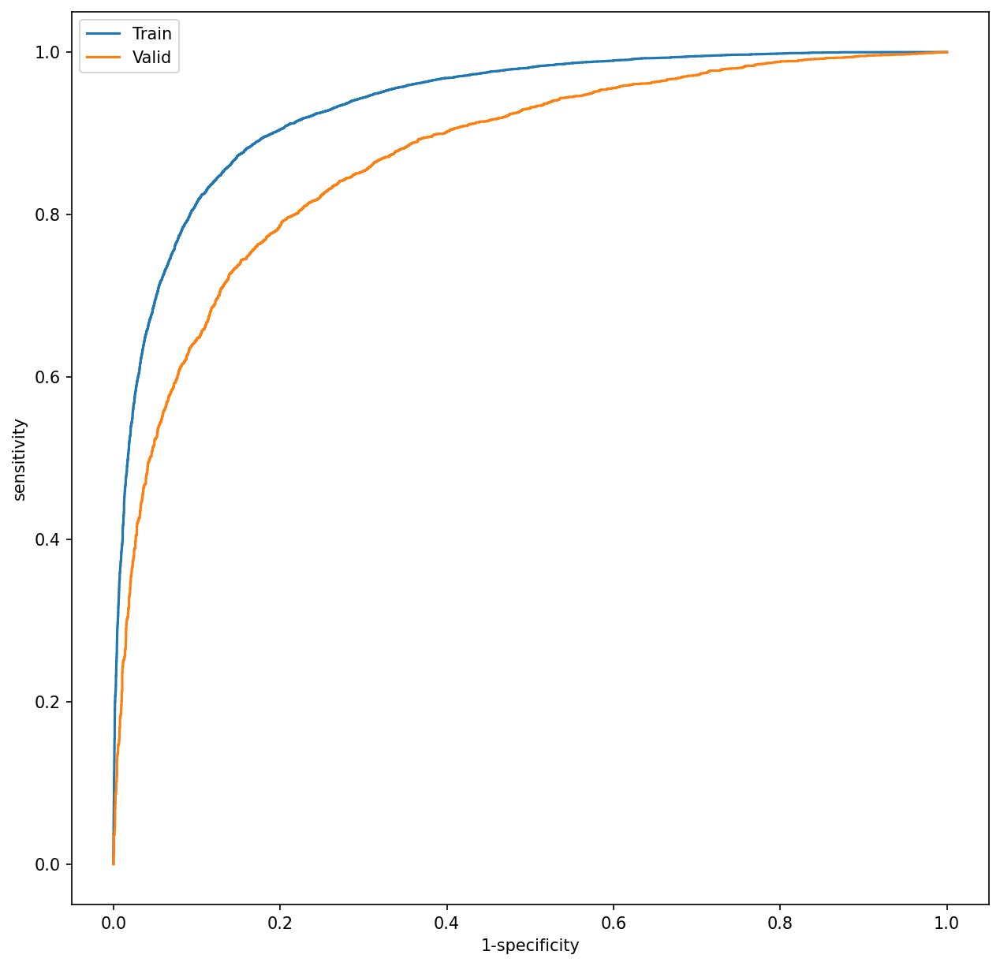

efficientnet-phospho-B-15
Fold: 1
Training on  4 GPUs!


  0%|          | 0/50 [00:00<?, ?it/s]

------------------------------------------------------------
Epoch 1/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.6161 Acc: 0.6639 Recall: 0.6596 AUC: 0.7234


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.5520 Acc: 0.7387 recall: 0.7370 AUC: 0.7969
------------------------------------------------------------

------------------------------------------------------------
Epoch 2/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.5272 Acc: 0.7531 Recall: 0.7355 AUC: 0.8170


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.5224 Acc: 0.7505 recall: 0.6501 AUC: 0.8287
------------------------------------------------------------

------------------------------------------------------------
Epoch 3/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.4896 Acc: 0.7767 Recall: 0.7561 AUC: 0.8459


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4948 Acc: 0.7697 recall: 0.8121 AUC: 0.8476
------------------------------------------------------------

------------------------------------------------------------
Epoch 4/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.4624 Acc: 0.7889 Recall: 0.7736 AUC: 0.8645


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4729 Acc: 0.7806 recall: 0.7725 AUC: 0.8564
------------------------------------------------------------

------------------------------------------------------------
Epoch 5/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.4454 Acc: 0.7985 Recall: 0.7813 AUC: 0.8751


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4646 Acc: 0.7873 recall: 0.7511 AUC: 0.8618
------------------------------------------------------------

------------------------------------------------------------
Epoch 6/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.4316 Acc: 0.8100 Recall: 0.7964 AUC: 0.8833


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4583 Acc: 0.7912 recall: 0.7697 AUC: 0.8654
------------------------------------------------------------

------------------------------------------------------------
Epoch 7/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.4190 Acc: 0.8148 Recall: 0.8026 AUC: 0.8905


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4532 Acc: 0.7952 recall: 0.7697 AUC: 0.8690
------------------------------------------------------------

------------------------------------------------------------
Epoch 8/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.4120 Acc: 0.8164 Recall: 0.8054 AUC: 0.8945


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4532 Acc: 0.7946 recall: 0.8072 AUC: 0.8701
------------------------------------------------------------

------------------------------------------------------------
Epoch 9/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.4034 Acc: 0.8217 Recall: 0.8132 AUC: 0.8990


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4502 Acc: 0.7942 recall: 0.7574 AUC: 0.8720
------------------------------------------------------------

------------------------------------------------------------
Epoch 10/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3956 Acc: 0.8284 Recall: 0.8170 AUC: 0.9032


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4511 Acc: 0.7951 recall: 0.8051 AUC: 0.8713
------------------------------------------------------------

------------------------------------------------------------
Epoch 11/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3881 Acc: 0.8295 Recall: 0.8201 AUC: 0.9071


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4445 Acc: 0.8028 recall: 0.7882 AUC: 0.8749
------------------------------------------------------------

------------------------------------------------------------
Epoch 12/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3827 Acc: 0.8312 Recall: 0.8243 AUC: 0.9098


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4454 Acc: 0.7991 recall: 0.8006 AUC: 0.8752
------------------------------------------------------------

------------------------------------------------------------
Epoch 13/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3803 Acc: 0.8352 Recall: 0.8266 AUC: 0.9107


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4439 Acc: 0.8024 recall: 0.8122 AUC: 0.8759
------------------------------------------------------------

------------------------------------------------------------
Epoch 14/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3776 Acc: 0.8328 Recall: 0.8236 AUC: 0.9122


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4563 Acc: 0.7929 recall: 0.8498 AUC: 0.8758
------------------------------------------------------------

------------------------------------------------------------
Epoch 15/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3736 Acc: 0.8375 Recall: 0.8310 AUC: 0.9140


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4483 Acc: 0.7994 recall: 0.7937 AUC: 0.8736
------------------------------------------------------------

------------------------------------------------------------
Epoch 16/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3682 Acc: 0.8400 Recall: 0.8328 AUC: 0.9168


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4540 Acc: 0.7924 recall: 0.8362 AUC: 0.8765
------------------------------------------------------------

------------------------------------------------------------
Epoch 17/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3670 Acc: 0.8386 Recall: 0.8327 AUC: 0.9172


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4465 Acc: 0.8000 recall: 0.8064 AUC: 0.8765
------------------------------------------------------------

------------------------------------------------------------
Epoch 18/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3605 Acc: 0.8425 Recall: 0.8357 AUC: 0.9203


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4460 Acc: 0.8008 recall: 0.8074 AUC: 0.8770
------------------------------------------------------------

------------------------------------------------------------
Epoch 19/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3589 Acc: 0.8438 Recall: 0.8388 AUC: 0.9210


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4488 Acc: 0.8021 recall: 0.7887 AUC: 0.8756
------------------------------------------------------------

------------------------------------------------------------
Epoch 20/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3576 Acc: 0.8453 Recall: 0.8399 AUC: 0.9217


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4531 Acc: 0.7978 recall: 0.7967 AUC: 0.8745
------------------------------------------------------------

------------------------------------------------------------
Epoch 21/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3545 Acc: 0.8462 Recall: 0.8400 AUC: 0.9228


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4460 Acc: 0.8031 recall: 0.7829 AUC: 0.8774
------------------------------------------------------------

------------------------------------------------------------
Epoch 22/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3501 Acc: 0.8494 Recall: 0.8433 AUC: 0.9249


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4483 Acc: 0.8067 recall: 0.7889 AUC: 0.8769
------------------------------------------------------------

------------------------------------------------------------
Epoch 23/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3491 Acc: 0.8485 Recall: 0.8434 AUC: 0.9253


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4523 Acc: 0.7983 recall: 0.8119 AUC: 0.8762
------------------------------------------------------------

------------------------------------------------------------
Epoch 24/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3498 Acc: 0.8473 Recall: 0.8414 AUC: 0.9249


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4521 Acc: 0.8011 recall: 0.8119 AUC: 0.8758
------------------------------------------------------------

------------------------------------------------------------
Epoch 25/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3439 Acc: 0.8517 Recall: 0.8474 AUC: 0.9276


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4484 Acc: 0.8031 recall: 0.7836 AUC: 0.8774
------------------------------------------------------------

------------------------------------------------------------
Epoch 26/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3451 Acc: 0.8522 Recall: 0.8464 AUC: 0.9270


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4504 Acc: 0.8007 recall: 0.7914 AUC: 0.8764
------------------------------------------------------------

------------------------------------------------------------
Epoch 27/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3438 Acc: 0.8521 Recall: 0.8469 AUC: 0.9277


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4556 Acc: 0.7976 recall: 0.8244 AUC: 0.8764
------------------------------------------------------------

------------------------------------------------------------
Epoch 28/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3393 Acc: 0.8532 Recall: 0.8508 AUC: 0.9297


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4532 Acc: 0.8014 recall: 0.8027 AUC: 0.8755
------------------------------------------------------------

------------------------------------------------------------
Epoch 29/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3370 Acc: 0.8528 Recall: 0.8485 AUC: 0.9304


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4527 Acc: 0.8024 recall: 0.8013 AUC: 0.8765
------------------------------------------------------------

------------------------------------------------------------
Epoch 30/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3352 Acc: 0.8552 Recall: 0.8507 AUC: 0.9314


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4590 Acc: 0.8012 recall: 0.7936 AUC: 0.8747
------------------------------------------------------------

------------------------------------------------------------
Epoch 31/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3318 Acc: 0.8577 Recall: 0.8538 AUC: 0.9328


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4592 Acc: 0.8028 recall: 0.7795 AUC: 0.8754
------------------------------------------------------------

------------------------------------------------------------
Epoch 32/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3301 Acc: 0.8580 Recall: 0.8553 AUC: 0.9335


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4625 Acc: 0.7998 recall: 0.8144 AUC: 0.8761
------------------------------------------------------------

------------------------------------------------------------
Epoch 33/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3327 Acc: 0.8564 Recall: 0.8538 AUC: 0.9323


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4585 Acc: 0.8004 recall: 0.8113 AUC: 0.8755
------------------------------------------------------------

------------------------------------------------------------
Epoch 34/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3298 Acc: 0.8601 Recall: 0.8577 AUC: 0.9336


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4604 Acc: 0.8025 recall: 0.7878 AUC: 0.8762
------------------------------------------------------------

------------------------------------------------------------
Epoch 35/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3265 Acc: 0.8605 Recall: 0.8576 AUC: 0.9349


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4624 Acc: 0.7991 recall: 0.8172 AUC: 0.8754
------------------------------------------------------------

------------------------------------------------------------
Epoch 36/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3227 Acc: 0.8611 Recall: 0.8595 AUC: 0.9364


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4569 Acc: 0.8049 recall: 0.7872 AUC: 0.8769
------------------------------------------------------------

------------------------------------------------------------
Epoch 37/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3247 Acc: 0.8616 Recall: 0.8597 AUC: 0.9357


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4617 Acc: 0.8004 recall: 0.8277 AUC: 0.8766
------------------------------------------------------------

------------------------------------------------------------
Epoch 38/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3227 Acc: 0.8630 Recall: 0.8623 AUC: 0.9364


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4614 Acc: 0.8054 recall: 0.7918 AUC: 0.8758
------------------------------------------------------------

------------------------------------------------------------
Epoch 39/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3223 Acc: 0.8603 Recall: 0.8590 AUC: 0.9367


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4650 Acc: 0.8024 recall: 0.7930 AUC: 0.8752
------------------------------------------------------------

------------------------------------------------------------
Epoch 40/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3223 Acc: 0.8620 Recall: 0.8583 AUC: 0.9366


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4678 Acc: 0.7971 recall: 0.8087 AUC: 0.8742
------------------------------------------------------------

------------------------------------------------------------
Epoch 41/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3184 Acc: 0.8635 Recall: 0.8613 AUC: 0.9381


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4633 Acc: 0.8037 recall: 0.8010 AUC: 0.8758
------------------------------------------------------------

------------------------------------------------------------
Epoch 42/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3171 Acc: 0.8642 Recall: 0.8619 AUC: 0.9387


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4696 Acc: 0.8009 recall: 0.7703 AUC: 0.8755
------------------------------------------------------------

------------------------------------------------------------
Epoch 43/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3158 Acc: 0.8646 Recall: 0.8628 AUC: 0.9391


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4678 Acc: 0.7977 recall: 0.8091 AUC: 0.8743
------------------------------------------------------------

------------------------------------------------------------
Epoch 44/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3174 Acc: 0.8643 Recall: 0.8632 AUC: 0.9385


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4667 Acc: 0.7975 recall: 0.8087 AUC: 0.8750
------------------------------------------------------------

------------------------------------------------------------
Epoch 45/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3182 Acc: 0.8642 Recall: 0.8617 AUC: 0.9382


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4662 Acc: 0.7995 recall: 0.8143 AUC: 0.8756
------------------------------------------------------------

------------------------------------------------------------
Epoch 46/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3136 Acc: 0.8656 Recall: 0.8626 AUC: 0.9400


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4672 Acc: 0.7999 recall: 0.8041 AUC: 0.8757
------------------------------------------------------------

------------------------------------------------------------
Epoch 47/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3157 Acc: 0.8659 Recall: 0.8622 AUC: 0.9391


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4699 Acc: 0.7995 recall: 0.8016 AUC: 0.8738
------------------------------------------------------------

------------------------------------------------------------
Epoch 48/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3119 Acc: 0.8651 Recall: 0.8634 AUC: 0.9405


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4687 Acc: 0.8007 recall: 0.7956 AUC: 0.8754
------------------------------------------------------------

------------------------------------------------------------
Epoch 49/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3069 Acc: 0.8672 Recall: 0.8676 AUC: 0.9427


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4692 Acc: 0.7983 recall: 0.7915 AUC: 0.8741
------------------------------------------------------------

------------------------------------------------------------
Epoch 50/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3106 Acc: 0.8687 Recall: 0.8667 AUC: 0.9412


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4701 Acc: 0.7959 recall: 0.8088 AUC: 0.8748
------------------------------------------------------------

Training complete in 9m 3s
Best val Loss: 0.443885
Best val Acc: 0.806651


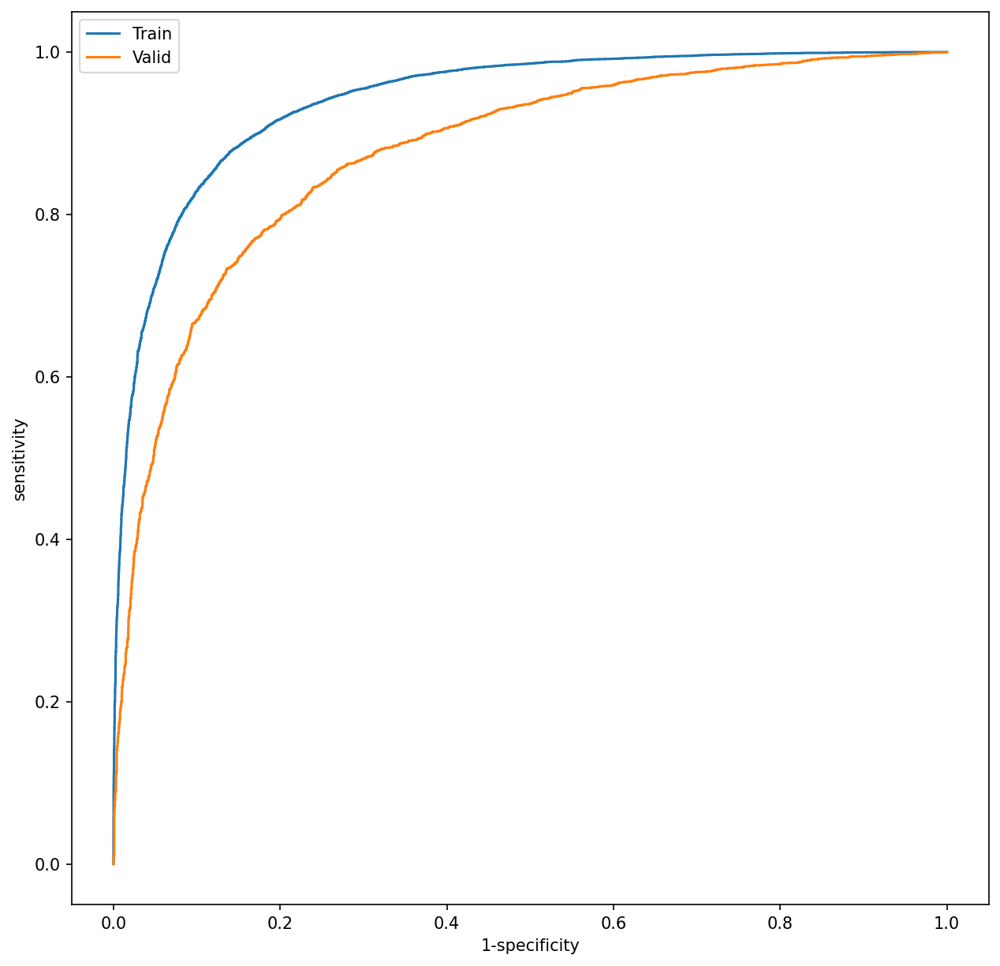

efficientnet-phospho-B-15
Fold: 2
Training on  4 GPUs!


  0%|          | 0/50 [00:00<?, ?it/s]

------------------------------------------------------------
Epoch 1/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.6148 Acc: 0.6620 Recall: 0.6353 AUC: 0.7223


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.5454 Acc: 0.7353 recall: 0.7048 AUC: 0.8027
------------------------------------------------------------

------------------------------------------------------------
Epoch 2/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.5205 Acc: 0.7547 Recall: 0.7212 AUC: 0.8213


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4921 Acc: 0.7737 recall: 0.7431 AUC: 0.8449
------------------------------------------------------------

------------------------------------------------------------
Epoch 3/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.4774 Acc: 0.7809 Recall: 0.7629 AUC: 0.8540


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4694 Acc: 0.7861 recall: 0.7486 AUC: 0.8614
------------------------------------------------------------

------------------------------------------------------------
Epoch 4/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.4553 Acc: 0.7920 Recall: 0.7762 AUC: 0.8686


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4575 Acc: 0.7912 recall: 0.7749 AUC: 0.8667
------------------------------------------------------------

------------------------------------------------------------
Epoch 5/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.4402 Acc: 0.8021 Recall: 0.7840 AUC: 0.8778


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4553 Acc: 0.7917 recall: 0.8183 AUC: 0.8702
------------------------------------------------------------

------------------------------------------------------------
Epoch 6/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.4269 Acc: 0.8090 Recall: 0.7957 AUC: 0.8859


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4521 Acc: 0.7948 recall: 0.7413 AUC: 0.8721
------------------------------------------------------------

------------------------------------------------------------
Epoch 7/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.4170 Acc: 0.8173 Recall: 0.8054 AUC: 0.8914


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4476 Acc: 0.7985 recall: 0.7589 AUC: 0.8748
------------------------------------------------------------

------------------------------------------------------------
Epoch 8/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.4118 Acc: 0.8162 Recall: 0.8041 AUC: 0.8941


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4429 Acc: 0.8009 recall: 0.7662 AUC: 0.8771
------------------------------------------------------------

------------------------------------------------------------
Epoch 9/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.4052 Acc: 0.8220 Recall: 0.8092 AUC: 0.8977


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4433 Acc: 0.8003 recall: 0.8172 AUC: 0.8767
------------------------------------------------------------

------------------------------------------------------------
Epoch 10/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3981 Acc: 0.8238 Recall: 0.8138 AUC: 0.9015


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4400 Acc: 0.8046 recall: 0.7890 AUC: 0.8777
------------------------------------------------------------

------------------------------------------------------------
Epoch 11/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3922 Acc: 0.8282 Recall: 0.8202 AUC: 0.9049


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4390 Acc: 0.8040 recall: 0.8006 AUC: 0.8785
------------------------------------------------------------

------------------------------------------------------------
Epoch 12/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3849 Acc: 0.8315 Recall: 0.8214 AUC: 0.9086


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4391 Acc: 0.8049 recall: 0.7920 AUC: 0.8791
------------------------------------------------------------

------------------------------------------------------------
Epoch 13/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3848 Acc: 0.8324 Recall: 0.8234 AUC: 0.9085


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4406 Acc: 0.8051 recall: 0.8049 AUC: 0.8786
------------------------------------------------------------

------------------------------------------------------------
Epoch 14/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3805 Acc: 0.8316 Recall: 0.8226 AUC: 0.9107


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4395 Acc: 0.8069 recall: 0.8029 AUC: 0.8790
------------------------------------------------------------

------------------------------------------------------------
Epoch 15/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3749 Acc: 0.8359 Recall: 0.8277 AUC: 0.9134


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4438 Acc: 0.8041 recall: 0.7576 AUC: 0.8797
------------------------------------------------------------

------------------------------------------------------------
Epoch 16/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3710 Acc: 0.8385 Recall: 0.8295 AUC: 0.9150


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4387 Acc: 0.8039 recall: 0.8219 AUC: 0.8811
------------------------------------------------------------

------------------------------------------------------------
Epoch 17/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3698 Acc: 0.8382 Recall: 0.8326 AUC: 0.9157


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4377 Acc: 0.8072 recall: 0.7958 AUC: 0.8811
------------------------------------------------------------

------------------------------------------------------------
Epoch 18/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3652 Acc: 0.8409 Recall: 0.8343 AUC: 0.9177


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4467 Acc: 0.8016 recall: 0.7540 AUC: 0.8799
------------------------------------------------------------

------------------------------------------------------------
Epoch 19/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3637 Acc: 0.8416 Recall: 0.8353 AUC: 0.9186


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4472 Acc: 0.8022 recall: 0.7509 AUC: 0.8807
------------------------------------------------------------

------------------------------------------------------------
Epoch 20/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3586 Acc: 0.8432 Recall: 0.8379 AUC: 0.9212


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4467 Acc: 0.8035 recall: 0.8253 AUC: 0.8799
------------------------------------------------------------

------------------------------------------------------------
Epoch 21/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3558 Acc: 0.8421 Recall: 0.8371 AUC: 0.9222


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4420 Acc: 0.8075 recall: 0.7945 AUC: 0.8806
------------------------------------------------------------

------------------------------------------------------------
Epoch 22/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3556 Acc: 0.8454 Recall: 0.8411 AUC: 0.9224


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4471 Acc: 0.8007 recall: 0.8295 AUC: 0.8796
------------------------------------------------------------

------------------------------------------------------------
Epoch 23/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3523 Acc: 0.8471 Recall: 0.8393 AUC: 0.9239


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4389 Acc: 0.8083 recall: 0.8081 AUC: 0.8808
------------------------------------------------------------

------------------------------------------------------------
Epoch 24/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3502 Acc: 0.8467 Recall: 0.8397 AUC: 0.9248


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4455 Acc: 0.8023 recall: 0.8258 AUC: 0.8806
------------------------------------------------------------

------------------------------------------------------------
Epoch 25/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3470 Acc: 0.8468 Recall: 0.8411 AUC: 0.9263


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4424 Acc: 0.8095 recall: 0.7996 AUC: 0.8809
------------------------------------------------------------

------------------------------------------------------------
Epoch 26/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3459 Acc: 0.8498 Recall: 0.8451 AUC: 0.9267


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4492 Acc: 0.8035 recall: 0.7752 AUC: 0.8790
------------------------------------------------------------

------------------------------------------------------------
Epoch 27/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3445 Acc: 0.8502 Recall: 0.8454 AUC: 0.9273


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4484 Acc: 0.8062 recall: 0.7756 AUC: 0.8797
------------------------------------------------------------

------------------------------------------------------------
Epoch 28/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3405 Acc: 0.8560 Recall: 0.8508 AUC: 0.9292


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4502 Acc: 0.8057 recall: 0.7690 AUC: 0.8796
------------------------------------------------------------

------------------------------------------------------------
Epoch 29/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3391 Acc: 0.8532 Recall: 0.8462 AUC: 0.9297


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4497 Acc: 0.8048 recall: 0.8239 AUC: 0.8796
------------------------------------------------------------

------------------------------------------------------------
Epoch 30/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3373 Acc: 0.8551 Recall: 0.8506 AUC: 0.9304


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4536 Acc: 0.8048 recall: 0.7871 AUC: 0.8774
------------------------------------------------------------

------------------------------------------------------------
Epoch 31/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3347 Acc: 0.8558 Recall: 0.8500 AUC: 0.9314


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4523 Acc: 0.8058 recall: 0.7801 AUC: 0.8793
------------------------------------------------------------

------------------------------------------------------------
Epoch 32/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3321 Acc: 0.8568 Recall: 0.8545 AUC: 0.9326


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4523 Acc: 0.8048 recall: 0.8104 AUC: 0.8776
------------------------------------------------------------

------------------------------------------------------------
Epoch 33/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3359 Acc: 0.8537 Recall: 0.8482 AUC: 0.9309


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4531 Acc: 0.8032 recall: 0.7972 AUC: 0.8782
------------------------------------------------------------

------------------------------------------------------------
Epoch 34/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3333 Acc: 0.8571 Recall: 0.8526 AUC: 0.9319


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4528 Acc: 0.8042 recall: 0.7989 AUC: 0.8791
------------------------------------------------------------

------------------------------------------------------------
Epoch 35/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3298 Acc: 0.8611 Recall: 0.8554 AUC: 0.9333


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4505 Acc: 0.8041 recall: 0.8184 AUC: 0.8793
------------------------------------------------------------

------------------------------------------------------------
Epoch 36/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3317 Acc: 0.8558 Recall: 0.8528 AUC: 0.9326


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4573 Acc: 0.8058 recall: 0.7743 AUC: 0.8772
------------------------------------------------------------

------------------------------------------------------------
Epoch 37/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3255 Acc: 0.8606 Recall: 0.8574 AUC: 0.9353


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4572 Acc: 0.8007 recall: 0.8045 AUC: 0.8769
------------------------------------------------------------

------------------------------------------------------------
Epoch 38/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3266 Acc: 0.8612 Recall: 0.8580 AUC: 0.9349


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4602 Acc: 0.8052 recall: 0.7723 AUC: 0.8778
------------------------------------------------------------

------------------------------------------------------------
Epoch 39/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3262 Acc: 0.8613 Recall: 0.8579 AUC: 0.9351


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4592 Acc: 0.8032 recall: 0.7733 AUC: 0.8785
------------------------------------------------------------

------------------------------------------------------------
Epoch 40/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3219 Acc: 0.8606 Recall: 0.8543 AUC: 0.9367


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4574 Acc: 0.8027 recall: 0.8047 AUC: 0.8789
------------------------------------------------------------

------------------------------------------------------------
Epoch 41/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3243 Acc: 0.8600 Recall: 0.8581 AUC: 0.9355


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4560 Acc: 0.8028 recall: 0.7904 AUC: 0.8787
------------------------------------------------------------

------------------------------------------------------------
Epoch 42/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3216 Acc: 0.8635 Recall: 0.8583 AUC: 0.9367


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4589 Acc: 0.8020 recall: 0.8035 AUC: 0.8776
------------------------------------------------------------

------------------------------------------------------------
Epoch 43/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3201 Acc: 0.8651 Recall: 0.8612 AUC: 0.9375


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4571 Acc: 0.8023 recall: 0.8030 AUC: 0.8791
------------------------------------------------------------

------------------------------------------------------------
Epoch 44/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3182 Acc: 0.8618 Recall: 0.8585 AUC: 0.9382


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4606 Acc: 0.8019 recall: 0.8042 AUC: 0.8781
------------------------------------------------------------

------------------------------------------------------------
Epoch 45/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3150 Acc: 0.8640 Recall: 0.8610 AUC: 0.9393


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4707 Acc: 0.8031 recall: 0.7544 AUC: 0.8783
------------------------------------------------------------

------------------------------------------------------------
Epoch 46/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3165 Acc: 0.8645 Recall: 0.8617 AUC: 0.9388


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4634 Acc: 0.8039 recall: 0.7673 AUC: 0.8787
------------------------------------------------------------

------------------------------------------------------------
Epoch 47/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3172 Acc: 0.8661 Recall: 0.8612 AUC: 0.9386


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4641 Acc: 0.8020 recall: 0.7929 AUC: 0.8760
------------------------------------------------------------

------------------------------------------------------------
Epoch 48/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3156 Acc: 0.8656 Recall: 0.8628 AUC: 0.9394


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4632 Acc: 0.8001 recall: 0.8184 AUC: 0.8774
------------------------------------------------------------

------------------------------------------------------------
Epoch 49/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3141 Acc: 0.8653 Recall: 0.8632 AUC: 0.9397


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4665 Acc: 0.8042 recall: 0.7776 AUC: 0.8777
------------------------------------------------------------

------------------------------------------------------------
Epoch 50/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3122 Acc: 0.8668 Recall: 0.8640 AUC: 0.9405


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4679 Acc: 0.8035 recall: 0.8085 AUC: 0.8768
------------------------------------------------------------

Training complete in 9m 11s
Best val Loss: 0.437733
Best val Acc: 0.809517


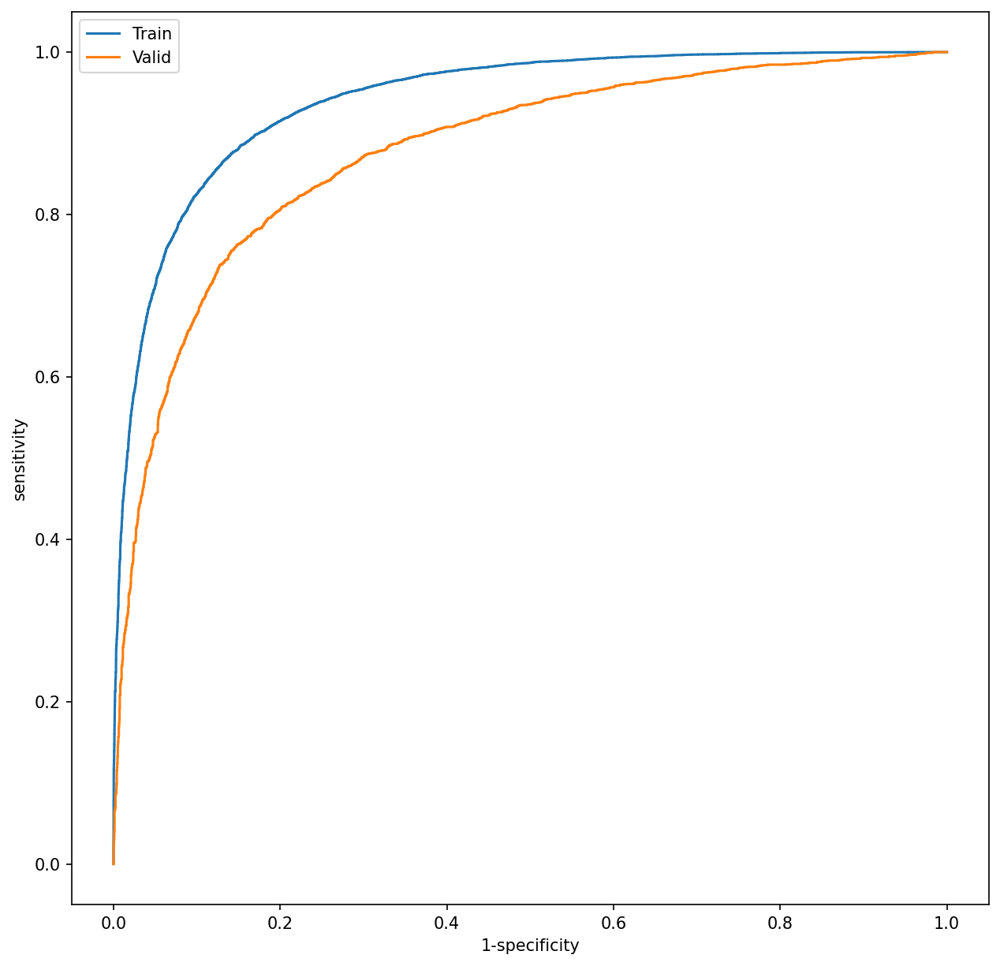

efficientnet-phospho-B-15
Fold: 3
Training on  4 GPUs!


  0%|          | 0/50 [00:00<?, ?it/s]

------------------------------------------------------------
Epoch 1/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.6138 Acc: 0.6633 Recall: 0.6481 AUC: 0.7241


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.5491 Acc: 0.7391 recall: 0.7451 AUC: 0.7999
------------------------------------------------------------

------------------------------------------------------------
Epoch 2/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.5240 Acc: 0.7527 Recall: 0.7283 AUC: 0.8186


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.5089 Acc: 0.7654 recall: 0.7898 AUC: 0.8328
------------------------------------------------------------

------------------------------------------------------------
Epoch 3/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.4841 Acc: 0.7798 Recall: 0.7665 AUC: 0.8497


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4864 Acc: 0.7778 recall: 0.7848 AUC: 0.8478
------------------------------------------------------------

------------------------------------------------------------
Epoch 4/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.4595 Acc: 0.7935 Recall: 0.7777 AUC: 0.8660


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4736 Acc: 0.7880 recall: 0.7796 AUC: 0.8560
------------------------------------------------------------

------------------------------------------------------------
Epoch 5/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.4439 Acc: 0.8020 Recall: 0.7895 AUC: 0.8757


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4673 Acc: 0.7881 recall: 0.7694 AUC: 0.8602
------------------------------------------------------------

------------------------------------------------------------
Epoch 6/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.4309 Acc: 0.8080 Recall: 0.7985 AUC: 0.8834


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4652 Acc: 0.7900 recall: 0.7550 AUC: 0.8636
------------------------------------------------------------

------------------------------------------------------------
Epoch 7/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.4193 Acc: 0.8144 Recall: 0.8033 AUC: 0.8900


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4598 Acc: 0.7920 recall: 0.8112 AUC: 0.8677
------------------------------------------------------------

------------------------------------------------------------
Epoch 8/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.4132 Acc: 0.8180 Recall: 0.8073 AUC: 0.8934


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4596 Acc: 0.7936 recall: 0.7532 AUC: 0.8683
------------------------------------------------------------

------------------------------------------------------------
Epoch 9/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.4045 Acc: 0.8224 Recall: 0.8133 AUC: 0.8981


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4549 Acc: 0.7983 recall: 0.7704 AUC: 0.8709
------------------------------------------------------------

------------------------------------------------------------
Epoch 10/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3961 Acc: 0.8261 Recall: 0.8189 AUC: 0.9025


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4598 Acc: 0.7915 recall: 0.7494 AUC: 0.8689
------------------------------------------------------------

------------------------------------------------------------
Epoch 11/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3934 Acc: 0.8285 Recall: 0.8200 AUC: 0.9041


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4517 Acc: 0.7992 recall: 0.7950 AUC: 0.8720
------------------------------------------------------------

------------------------------------------------------------
Epoch 12/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3863 Acc: 0.8323 Recall: 0.8224 AUC: 0.9075


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4536 Acc: 0.8016 recall: 0.7849 AUC: 0.8721
------------------------------------------------------------

------------------------------------------------------------
Epoch 13/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3815 Acc: 0.8316 Recall: 0.8250 AUC: 0.9101


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4611 Acc: 0.7926 recall: 0.8473 AUC: 0.8743
------------------------------------------------------------

------------------------------------------------------------
Epoch 14/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3768 Acc: 0.8376 Recall: 0.8326 AUC: 0.9124


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4497 Acc: 0.8017 recall: 0.8063 AUC: 0.8745
------------------------------------------------------------

------------------------------------------------------------
Epoch 15/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3749 Acc: 0.8372 Recall: 0.8311 AUC: 0.9132


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4525 Acc: 0.7965 recall: 0.8100 AUC: 0.8749
------------------------------------------------------------

------------------------------------------------------------
Epoch 16/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3687 Acc: 0.8409 Recall: 0.8348 AUC: 0.9162


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4490 Acc: 0.8039 recall: 0.7962 AUC: 0.8758
------------------------------------------------------------

------------------------------------------------------------
Epoch 17/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3674 Acc: 0.8387 Recall: 0.8325 AUC: 0.9169


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4550 Acc: 0.7988 recall: 0.8294 AUC: 0.8758
------------------------------------------------------------

------------------------------------------------------------
Epoch 18/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3614 Acc: 0.8422 Recall: 0.8373 AUC: 0.9196


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4512 Acc: 0.8033 recall: 0.7864 AUC: 0.8760
------------------------------------------------------------

------------------------------------------------------------
Epoch 19/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3608 Acc: 0.8451 Recall: 0.8402 AUC: 0.9199


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4522 Acc: 0.8013 recall: 0.8104 AUC: 0.8766
------------------------------------------------------------

------------------------------------------------------------
Epoch 20/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3576 Acc: 0.8448 Recall: 0.8389 AUC: 0.9212


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4533 Acc: 0.8039 recall: 0.7870 AUC: 0.8753
------------------------------------------------------------

------------------------------------------------------------
Epoch 21/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3543 Acc: 0.8466 Recall: 0.8394 AUC: 0.9227


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4524 Acc: 0.8037 recall: 0.8159 AUC: 0.8761
------------------------------------------------------------

------------------------------------------------------------
Epoch 22/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3524 Acc: 0.8486 Recall: 0.8412 AUC: 0.9237


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4544 Acc: 0.8021 recall: 0.8125 AUC: 0.8766
------------------------------------------------------------

------------------------------------------------------------
Epoch 23/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3514 Acc: 0.8484 Recall: 0.8421 AUC: 0.9241


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4533 Acc: 0.8042 recall: 0.8009 AUC: 0.8761
------------------------------------------------------------

------------------------------------------------------------
Epoch 24/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3478 Acc: 0.8493 Recall: 0.8435 AUC: 0.9257


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4557 Acc: 0.8011 recall: 0.8126 AUC: 0.8763
------------------------------------------------------------

------------------------------------------------------------
Epoch 25/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3437 Acc: 0.8522 Recall: 0.8477 AUC: 0.9274


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4521 Acc: 0.8033 recall: 0.8083 AUC: 0.8774
------------------------------------------------------------

------------------------------------------------------------
Epoch 26/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3450 Acc: 0.8492 Recall: 0.8458 AUC: 0.9268


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4556 Acc: 0.8016 recall: 0.8056 AUC: 0.8762
------------------------------------------------------------

------------------------------------------------------------
Epoch 27/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3417 Acc: 0.8515 Recall: 0.8475 AUC: 0.9283


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4574 Acc: 0.8036 recall: 0.7977 AUC: 0.8762
------------------------------------------------------------

------------------------------------------------------------
Epoch 28/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3401 Acc: 0.8523 Recall: 0.8449 AUC: 0.9288


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4594 Acc: 0.8009 recall: 0.8134 AUC: 0.8761
------------------------------------------------------------

------------------------------------------------------------
Epoch 29/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3368 Acc: 0.8537 Recall: 0.8498 AUC: 0.9305


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4611 Acc: 0.8004 recall: 0.7935 AUC: 0.8748
------------------------------------------------------------

------------------------------------------------------------
Epoch 30/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3372 Acc: 0.8545 Recall: 0.8487 AUC: 0.9301


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4567 Acc: 0.8014 recall: 0.8118 AUC: 0.8758
------------------------------------------------------------

------------------------------------------------------------
Epoch 31/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3345 Acc: 0.8563 Recall: 0.8525 AUC: 0.9316


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4605 Acc: 0.8022 recall: 0.7877 AUC: 0.8773
------------------------------------------------------------

------------------------------------------------------------
Epoch 32/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3309 Acc: 0.8582 Recall: 0.8564 AUC: 0.9329


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4629 Acc: 0.8026 recall: 0.7965 AUC: 0.8764
------------------------------------------------------------

------------------------------------------------------------
Epoch 33/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3284 Acc: 0.8591 Recall: 0.8525 AUC: 0.9341


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4618 Acc: 0.7986 recall: 0.8215 AUC: 0.8766
------------------------------------------------------------

------------------------------------------------------------
Epoch 34/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3301 Acc: 0.8593 Recall: 0.8551 AUC: 0.9332


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4595 Acc: 0.8016 recall: 0.8184 AUC: 0.8775
------------------------------------------------------------

------------------------------------------------------------
Epoch 35/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3281 Acc: 0.8588 Recall: 0.8533 AUC: 0.9340


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4619 Acc: 0.8034 recall: 0.8014 AUC: 0.8772
------------------------------------------------------------

------------------------------------------------------------
Epoch 36/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3282 Acc: 0.8586 Recall: 0.8543 AUC: 0.9339


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4661 Acc: 0.8034 recall: 0.8209 AUC: 0.8762
------------------------------------------------------------

------------------------------------------------------------
Epoch 37/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3247 Acc: 0.8619 Recall: 0.8587 AUC: 0.9354


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4656 Acc: 0.8016 recall: 0.7884 AUC: 0.8766
------------------------------------------------------------

------------------------------------------------------------
Epoch 38/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3222 Acc: 0.8620 Recall: 0.8583 AUC: 0.9365


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4696 Acc: 0.7990 recall: 0.8174 AUC: 0.8760
------------------------------------------------------------

------------------------------------------------------------
Epoch 39/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3193 Acc: 0.8654 Recall: 0.8628 AUC: 0.9378


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4692 Acc: 0.8040 recall: 0.7881 AUC: 0.8755
------------------------------------------------------------

------------------------------------------------------------
Epoch 40/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3188 Acc: 0.8653 Recall: 0.8612 AUC: 0.9378


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4657 Acc: 0.8018 recall: 0.8150 AUC: 0.8760
------------------------------------------------------------

------------------------------------------------------------
Epoch 41/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3214 Acc: 0.8613 Recall: 0.8585 AUC: 0.9367


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4720 Acc: 0.8012 recall: 0.8162 AUC: 0.8759
------------------------------------------------------------

------------------------------------------------------------
Epoch 42/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3188 Acc: 0.8636 Recall: 0.8610 AUC: 0.9379


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4709 Acc: 0.7971 recall: 0.8167 AUC: 0.8750
------------------------------------------------------------

------------------------------------------------------------
Epoch 43/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3169 Acc: 0.8631 Recall: 0.8604 AUC: 0.9385


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4760 Acc: 0.8031 recall: 0.7765 AUC: 0.8740
------------------------------------------------------------

------------------------------------------------------------
Epoch 44/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3139 Acc: 0.8652 Recall: 0.8624 AUC: 0.9397


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4703 Acc: 0.8019 recall: 0.8054 AUC: 0.8748
------------------------------------------------------------

------------------------------------------------------------
Epoch 45/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3140 Acc: 0.8669 Recall: 0.8637 AUC: 0.9397


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4726 Acc: 0.8054 recall: 0.7965 AUC: 0.8749
------------------------------------------------------------

------------------------------------------------------------
Epoch 46/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3126 Acc: 0.8664 Recall: 0.8652 AUC: 0.9404


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4749 Acc: 0.8032 recall: 0.7796 AUC: 0.8746
------------------------------------------------------------

------------------------------------------------------------
Epoch 47/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3115 Acc: 0.8663 Recall: 0.8631 AUC: 0.9407


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4733 Acc: 0.8036 recall: 0.8043 AUC: 0.8760
------------------------------------------------------------

------------------------------------------------------------
Epoch 48/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3103 Acc: 0.8683 Recall: 0.8668 AUC: 0.9413


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4745 Acc: 0.8007 recall: 0.7836 AUC: 0.8748
------------------------------------------------------------

------------------------------------------------------------
Epoch 49/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3066 Acc: 0.8677 Recall: 0.8650 AUC: 0.9426


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4834 Acc: 0.7998 recall: 0.7980 AUC: 0.8740
------------------------------------------------------------

------------------------------------------------------------
Epoch 50/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3062 Acc: 0.8690 Recall: 0.8652 AUC: 0.9427


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4847 Acc: 0.7948 recall: 0.8269 AUC: 0.8718
------------------------------------------------------------

Training complete in 9m 7s
Best val Loss: 0.449031
Best val Acc: 0.805439


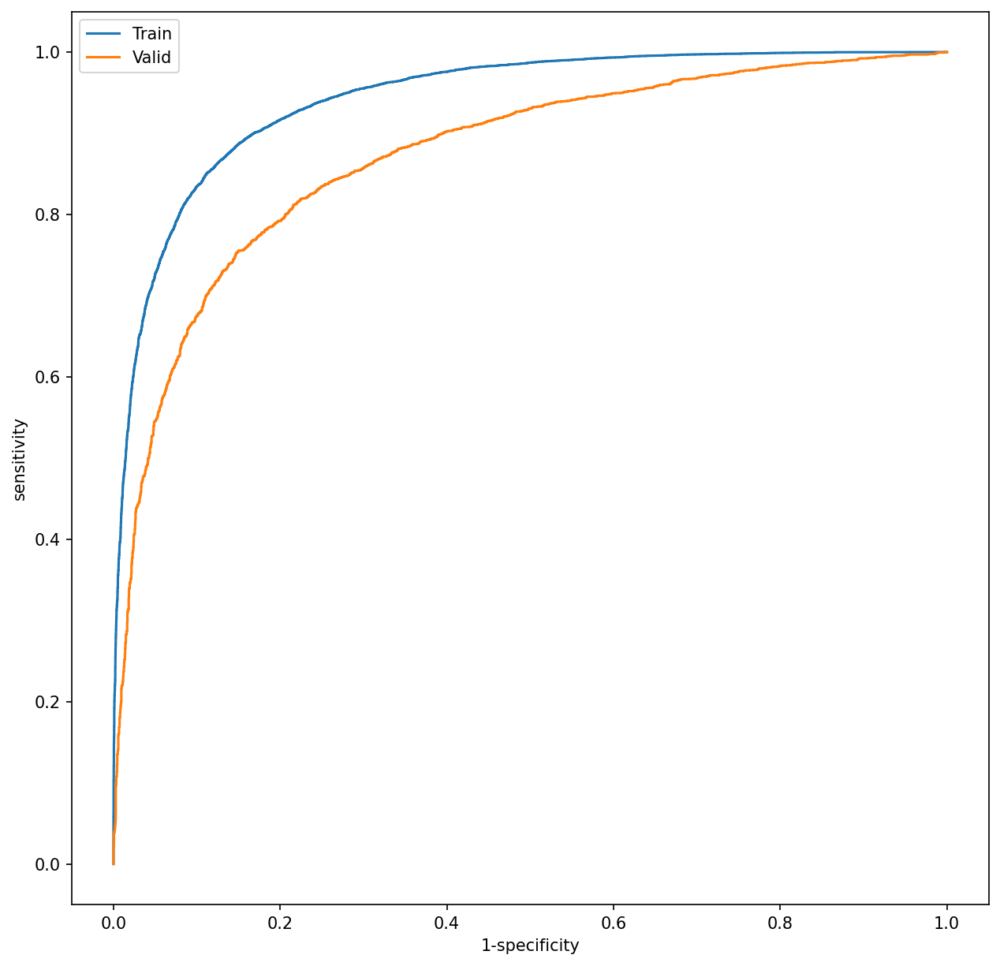

efficientnet-phospho-B-15
Fold: 4
Training on  4 GPUs!


  0%|          | 0/50 [00:00<?, ?it/s]

------------------------------------------------------------
Epoch 1/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.6191 Acc: 0.6609 Recall: 0.6463 AUC: 0.7195


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.5520 Acc: 0.7449 recall: 0.7473 AUC: 0.8014
------------------------------------------------------------

------------------------------------------------------------
Epoch 2/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.5204 Acc: 0.7598 Recall: 0.7407 AUC: 0.8232


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.5048 Acc: 0.7667 recall: 0.7873 AUC: 0.8394
------------------------------------------------------------

------------------------------------------------------------
Epoch 3/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.4824 Acc: 0.7792 Recall: 0.7673 AUC: 0.8512


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4774 Acc: 0.7806 recall: 0.7705 AUC: 0.8545
------------------------------------------------------------

------------------------------------------------------------
Epoch 4/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.4597 Acc: 0.7912 Recall: 0.7829 AUC: 0.8661


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4673 Acc: 0.7898 recall: 0.8001 AUC: 0.8623
------------------------------------------------------------

------------------------------------------------------------
Epoch 5/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.4428 Acc: 0.8003 Recall: 0.7927 AUC: 0.8766


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4568 Acc: 0.7944 recall: 0.7799 AUC: 0.8669
------------------------------------------------------------

------------------------------------------------------------
Epoch 6/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.4293 Acc: 0.8071 Recall: 0.7980 AUC: 0.8847


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4557 Acc: 0.7933 recall: 0.7889 AUC: 0.8676
------------------------------------------------------------

------------------------------------------------------------
Epoch 7/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.4207 Acc: 0.8119 Recall: 0.8031 AUC: 0.8897


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4476 Acc: 0.7981 recall: 0.7788 AUC: 0.8722
------------------------------------------------------------

------------------------------------------------------------
Epoch 8/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.4126 Acc: 0.8168 Recall: 0.8105 AUC: 0.8940


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4473 Acc: 0.7967 recall: 0.7989 AUC: 0.8738
------------------------------------------------------------

------------------------------------------------------------
Epoch 9/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.4022 Acc: 0.8208 Recall: 0.8119 AUC: 0.8998


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4425 Acc: 0.8014 recall: 0.7631 AUC: 0.8762
------------------------------------------------------------

------------------------------------------------------------
Epoch 10/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3981 Acc: 0.8225 Recall: 0.8144 AUC: 0.9018


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4404 Acc: 0.8019 recall: 0.7744 AUC: 0.8771
------------------------------------------------------------

------------------------------------------------------------
Epoch 11/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3913 Acc: 0.8266 Recall: 0.8196 AUC: 0.9051


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4453 Acc: 0.7982 recall: 0.8198 AUC: 0.8781
------------------------------------------------------------

------------------------------------------------------------
Epoch 12/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3891 Acc: 0.8288 Recall: 0.8255 AUC: 0.9065


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4395 Acc: 0.8045 recall: 0.7862 AUC: 0.8782
------------------------------------------------------------

------------------------------------------------------------
Epoch 13/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3819 Acc: 0.8310 Recall: 0.8225 AUC: 0.9099


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4390 Acc: 0.8050 recall: 0.7960 AUC: 0.8788
------------------------------------------------------------

------------------------------------------------------------
Epoch 14/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3778 Acc: 0.8358 Recall: 0.8312 AUC: 0.9119


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4364 Acc: 0.8039 recall: 0.7877 AUC: 0.8805
------------------------------------------------------------

------------------------------------------------------------
Epoch 15/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3755 Acc: 0.8342 Recall: 0.8306 AUC: 0.9129


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4396 Acc: 0.8051 recall: 0.7996 AUC: 0.8796
------------------------------------------------------------

------------------------------------------------------------
Epoch 16/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3722 Acc: 0.8381 Recall: 0.8331 AUC: 0.9146


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4353 Acc: 0.8067 recall: 0.7911 AUC: 0.8814
------------------------------------------------------------

------------------------------------------------------------
Epoch 17/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3679 Acc: 0.8394 Recall: 0.8323 AUC: 0.9166


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4373 Acc: 0.8070 recall: 0.7683 AUC: 0.8815
------------------------------------------------------------

------------------------------------------------------------
Epoch 18/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3626 Acc: 0.8431 Recall: 0.8389 AUC: 0.9194


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4384 Acc: 0.8076 recall: 0.8087 AUC: 0.8806
------------------------------------------------------------

------------------------------------------------------------
Epoch 19/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3632 Acc: 0.8425 Recall: 0.8393 AUC: 0.9190


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4390 Acc: 0.8087 recall: 0.7903 AUC: 0.8801
------------------------------------------------------------

------------------------------------------------------------
Epoch 20/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3596 Acc: 0.8446 Recall: 0.8409 AUC: 0.9205


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4464 Acc: 0.8046 recall: 0.8282 AUC: 0.8801
------------------------------------------------------------

------------------------------------------------------------
Epoch 21/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3561 Acc: 0.8447 Recall: 0.8406 AUC: 0.9220


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4383 Acc: 0.8105 recall: 0.7976 AUC: 0.8815
------------------------------------------------------------

------------------------------------------------------------
Epoch 22/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3541 Acc: 0.8466 Recall: 0.8432 AUC: 0.9229


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4400 Acc: 0.8079 recall: 0.8011 AUC: 0.8809
------------------------------------------------------------

------------------------------------------------------------
Epoch 23/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3533 Acc: 0.8469 Recall: 0.8436 AUC: 0.9235


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4440 Acc: 0.8077 recall: 0.8086 AUC: 0.8799
------------------------------------------------------------

------------------------------------------------------------
Epoch 24/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3511 Acc: 0.8494 Recall: 0.8462 AUC: 0.9242


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4462 Acc: 0.8036 recall: 0.8043 AUC: 0.8794
------------------------------------------------------------

------------------------------------------------------------
Epoch 25/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3494 Acc: 0.8469 Recall: 0.8423 AUC: 0.9250


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4434 Acc: 0.8069 recall: 0.8184 AUC: 0.8813
------------------------------------------------------------

------------------------------------------------------------
Epoch 26/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3456 Acc: 0.8490 Recall: 0.8457 AUC: 0.9267


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4486 Acc: 0.8007 recall: 0.8194 AUC: 0.8787
------------------------------------------------------------

------------------------------------------------------------
Epoch 27/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3454 Acc: 0.8485 Recall: 0.8450 AUC: 0.9268


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4452 Acc: 0.8078 recall: 0.8071 AUC: 0.8801
------------------------------------------------------------

------------------------------------------------------------
Epoch 28/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3416 Acc: 0.8528 Recall: 0.8488 AUC: 0.9285


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4437 Acc: 0.8084 recall: 0.7893 AUC: 0.8805
------------------------------------------------------------

------------------------------------------------------------
Epoch 29/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3436 Acc: 0.8515 Recall: 0.8500 AUC: 0.9276


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4497 Acc: 0.8061 recall: 0.7935 AUC: 0.8789
------------------------------------------------------------

------------------------------------------------------------
Epoch 30/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3381 Acc: 0.8552 Recall: 0.8530 AUC: 0.9300


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4449 Acc: 0.8112 recall: 0.7873 AUC: 0.8809
------------------------------------------------------------

------------------------------------------------------------
Epoch 31/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3373 Acc: 0.8550 Recall: 0.8524 AUC: 0.9302


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4460 Acc: 0.8080 recall: 0.7924 AUC: 0.8811
------------------------------------------------------------

------------------------------------------------------------
Epoch 32/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3344 Acc: 0.8565 Recall: 0.8538 AUC: 0.9314


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4471 Acc: 0.8114 recall: 0.8013 AUC: 0.8801
------------------------------------------------------------

------------------------------------------------------------
Epoch 33/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3302 Acc: 0.8571 Recall: 0.8545 AUC: 0.9333


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4474 Acc: 0.8100 recall: 0.8030 AUC: 0.8810
------------------------------------------------------------

------------------------------------------------------------
Epoch 34/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3305 Acc: 0.8542 Recall: 0.8535 AUC: 0.9330


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4477 Acc: 0.8092 recall: 0.7871 AUC: 0.8798
------------------------------------------------------------

------------------------------------------------------------
Epoch 35/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3291 Acc: 0.8587 Recall: 0.8571 AUC: 0.9339


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4513 Acc: 0.8089 recall: 0.7841 AUC: 0.8795
------------------------------------------------------------

------------------------------------------------------------
Epoch 36/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3282 Acc: 0.8592 Recall: 0.8582 AUC: 0.9340


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4519 Acc: 0.8082 recall: 0.7806 AUC: 0.8797
------------------------------------------------------------

------------------------------------------------------------
Epoch 37/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3273 Acc: 0.8596 Recall: 0.8582 AUC: 0.9344


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4500 Acc: 0.8068 recall: 0.8262 AUC: 0.8808
------------------------------------------------------------

------------------------------------------------------------
Epoch 38/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3228 Acc: 0.8593 Recall: 0.8618 AUC: 0.9363


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4575 Acc: 0.8075 recall: 0.7709 AUC: 0.8786
------------------------------------------------------------

------------------------------------------------------------
Epoch 39/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3249 Acc: 0.8611 Recall: 0.8561 AUC: 0.9355


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4508 Acc: 0.8099 recall: 0.7884 AUC: 0.8796
------------------------------------------------------------

------------------------------------------------------------
Epoch 40/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3198 Acc: 0.8616 Recall: 0.8608 AUC: 0.9375


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4591 Acc: 0.8062 recall: 0.7834 AUC: 0.8776
------------------------------------------------------------

------------------------------------------------------------
Epoch 41/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3216 Acc: 0.8607 Recall: 0.8602 AUC: 0.9368


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4532 Acc: 0.8075 recall: 0.7912 AUC: 0.8791
------------------------------------------------------------

------------------------------------------------------------
Epoch 42/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3196 Acc: 0.8636 Recall: 0.8620 AUC: 0.9374


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4552 Acc: 0.8056 recall: 0.8161 AUC: 0.8786
------------------------------------------------------------

------------------------------------------------------------
Epoch 43/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3161 Acc: 0.8645 Recall: 0.8628 AUC: 0.9392


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4585 Acc: 0.8095 recall: 0.8034 AUC: 0.8789
------------------------------------------------------------

------------------------------------------------------------
Epoch 44/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3170 Acc: 0.8647 Recall: 0.8644 AUC: 0.9386


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4605 Acc: 0.8052 recall: 0.7742 AUC: 0.8779
------------------------------------------------------------

------------------------------------------------------------
Epoch 45/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3193 Acc: 0.8639 Recall: 0.8627 AUC: 0.9376


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4576 Acc: 0.8103 recall: 0.7883 AUC: 0.8786
------------------------------------------------------------

------------------------------------------------------------
Epoch 46/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3131 Acc: 0.8661 Recall: 0.8699 AUC: 0.9401


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4589 Acc: 0.8081 recall: 0.7696 AUC: 0.8790
------------------------------------------------------------

------------------------------------------------------------
Epoch 47/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3140 Acc: 0.8643 Recall: 0.8640 AUC: 0.9397


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4618 Acc: 0.8065 recall: 0.7620 AUC: 0.8792
------------------------------------------------------------

------------------------------------------------------------
Epoch 48/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3170 Acc: 0.8634 Recall: 0.8628 AUC: 0.9386


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4584 Acc: 0.8063 recall: 0.8133 AUC: 0.8778
------------------------------------------------------------

------------------------------------------------------------
Epoch 49/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3115 Acc: 0.8669 Recall: 0.8665 AUC: 0.9408


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4573 Acc: 0.8095 recall: 0.7898 AUC: 0.8798
------------------------------------------------------------

------------------------------------------------------------
Epoch 50/50


  0%|          | 0/832 [00:00<?, ?it/s]

train Loss: 0.3089 Acc: 0.8685 Recall: 0.8675 AUC: 0.9418


  0%|          | 0/208 [00:00<?, ?it/s]

validation Loss: 0.4637 Acc: 0.8065 recall: 0.8115 AUC: 0.8776
------------------------------------------------------------

Training complete in 9m 13s
Best val Loss: 0.435344
Best val Acc: 0.811384


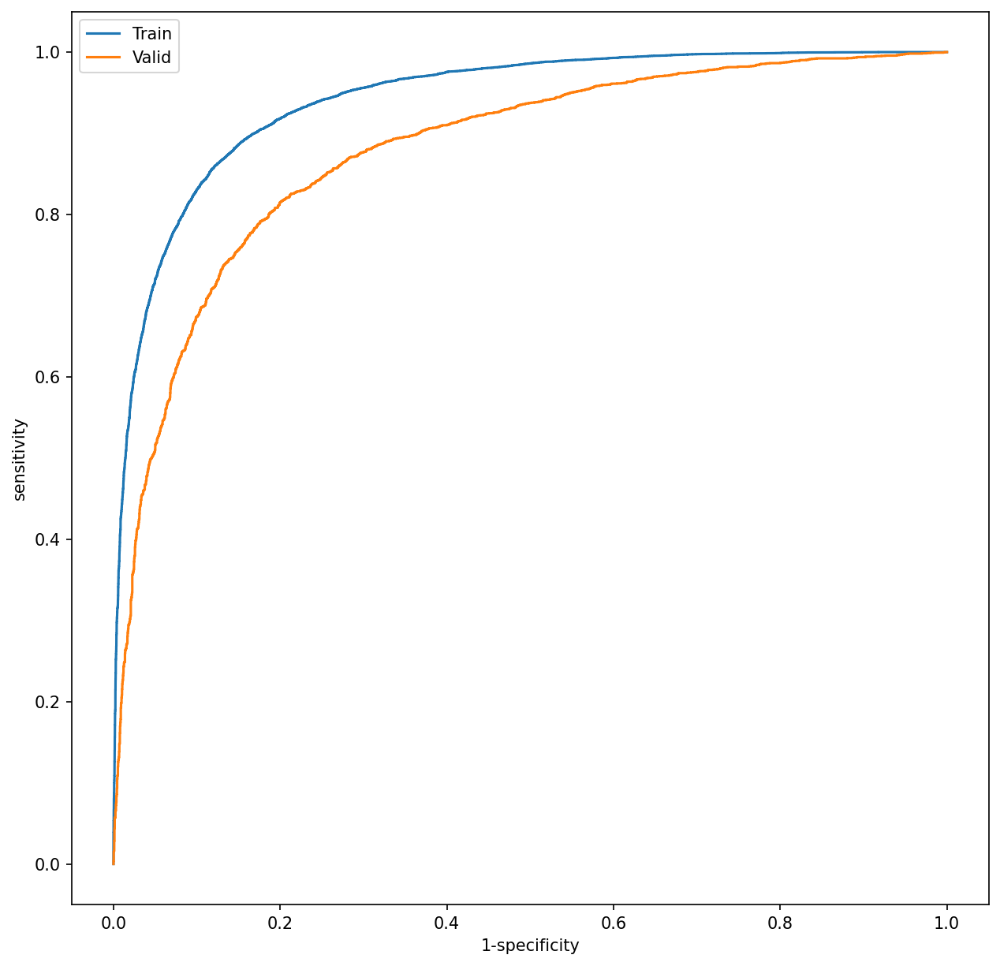

efficientnet-phospho-B-15
Kfold_cv_mean: 0.807376


In [31]:
best_acc_sum = 0
for fold, (tr_idx, val_idx) in enumerate(kf2.split(dfr2)):
    
    print('Fold: {:d}'.format(fold))
    BATCH_SIZE = 32

    train_set = data_utils.TensorDataset(torch.tensor(dfr2[tr_idx]), torch.tensor(dfl2[tr_idx]))
    valid_set = data_utils.TensorDataset(torch.tensor(dfr2[val_idx]),torch.tensor(dfl2[val_idx]))


    train_loader = data_utils.DataLoader(train_set, batch_size=BATCH_SIZE, pin_memory=True, shuffle=True)
    valid_loader = data_utils.DataLoader(valid_set, batch_size=BATCH_SIZE, shuffle=True)


    dataloaders = {'train':train_loader,'valid':valid_loader}
    dataset_sizes = {x: len(dataloaders[x]) for x in ['train', 'valid']}
    
    model = train_model(model, optimizer, scheduler, 50)
    
    plt.figure(figsize=[10,10],dpi = 150)
    plt.plot(Trainfprs, Traintprs, label= 'Train')
    plt.plot(Validfprs, Validtprs, label= 'Valid')
    #plt.plot(TrainLossdata, label= 'Train', color='lightcoral', linewidth = 4)
    plt.xlabel("1-specificity",fontsize =10)
    plt.ylabel("sensitivity",fontsize =10)
    plt.legend(fontsize = 10)
    plt.xlim()
    plt.ylim()
    plt.show()
    best_acc_sum += best_acc
    del model
    allele = 'phospho-B-15'
    model = EfficientNet.from_name(f'efficientnet-{allele}')
    criterion = nn.BCELoss()
    optimizer = RAdam(model.parameters())
    scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=100, gamma=0.1)
    
    save_dir = f'Weight/batch_50_SYTratiodata_randomstate{random_state}/saved_model2/Efficientnet_{fold+1}_kernel_3_ms_only_same_ratio'
    writer = SummaryWriter(save_dir)
    
    if fold == 4:
        print('Kfold_cv_mean: {:2f}'.format(best_acc_sum/(fold+1)))

In [17]:
#batch = 32 #mse계산용
best_acc_sum = 0
for fold, (tr_idx, val_idx) in enumerate(kf2.split(dfr2)):
    
    print('Fold: {:d}'.format(fold))
    BATCH_SIZE = 32

    train_set = data_utils.TensorDataset(torch.tensor(dfr2[tr_idx]), torch.tensor(dfl2[tr_idx]))
    valid_set = data_utils.TensorDataset(torch.tensor(dfr2[val_idx]),torch.tensor(dfl2[val_idx]))


    train_loader = data_utils.DataLoader(train_set, batch_size=BATCH_SIZE, pin_memory=True, shuffle=True)
    valid_loader = data_utils.DataLoader(valid_set, batch_size=BATCH_SIZE, shuffle=True)


    dataloaders = {'train':train_loader,'valid':valid_loader}
    dataset_sizes = {x: len(dataloaders[x]) for x in ['train', 'valid']}
    
    model = train_model(model, optimizer, scheduler, 20)
    
    plt.figure(figsize=[30,30],dpi = 600)
    #plt.plot(Trainfprs, Traintprs, label= 'Train')
    plt.plot(TrainLossdata, label= 'Train', color='lightcoral', linewidth = 4)
    plt.xlabel("epoch",fontsize =40)
    plt.ylabel("MSE",fontsize =40)
    plt.legend(fontsize = 40)
    plt.xlim()
    plt.ylim()
    plt.savefig("High resoltion.png",dpi=600)
    plt.show()
    best_acc_sum += best_acc
    del model
    allele = 'phospho-B-15'
    model = EfficientNet.from_name(f'efficientnet-{allele}')
    criterion = nn.MSELoss()
    optimizer = RAdam(model.parameters())
    scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=100, gamma=0.1)
    
    save_dir = f'saved_model2/Efficientnet_{fold+1}_kernel_3_ms_only_same_ratio'
    writer = SummaryWriter(save_dir)
    
    if fold == 4:
        print('Kfold_cv_mean: {:2f}'.format(best_acc_sum/(fold+1)))

Fold: 0
Training on  4 GPUs!


  0%|          | 0/30 [00:00<?, ?it/s]

------------------------------------------------------------
Epoch 1/30


  0%|          | 0/887 [00:00<?, ?it/s]

/home/geonwon/Code/Radam2.py:60: UserWarning: This overload of addcmul_ is deprecated:
	addcmul_(Number value, Tensor tensor1, Tensor tensor2)
Consider using one of the following signatures instead:
	addcmul_(Tensor tensor1, Tensor tensor2, *, Number value) (Triggered internally at  /pytorch/torch/csrc/utils/python_arg_parser.cpp:1005.)
  exp_avg_sq.mul_(beta2).addcmul_(1 - beta2, grad, grad)


train Loss: 0.0666 Acc: 0.9125 F1: 0.8314 Recall: 0.8551 AUC: 0.9124


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0150 Acc: 0.9806 F1: 0.9600 recall: 0.9384 AUC: 0.9995
------------------------------------------------------------

------------------------------------------------------------
Epoch 2/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0123 Acc: 0.9860 F1: 0.9546 Recall: 0.9654 AUC: 0.9860


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0043 Acc: 0.9944 F1: 0.9823 recall: 0.9810 AUC: 0.9999
------------------------------------------------------------

------------------------------------------------------------
Epoch 3/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0045 Acc: 0.9950 F1: 0.9771 Recall: 0.9859 AUC: 0.9960


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0020 Acc: 0.9975 F1: 0.9895 recall: 0.9910 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 4/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0021 Acc: 0.9977 F1: 0.9865 Recall: 0.9927 AUC: 0.9977


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0013 Acc: 0.9985 F1: 0.9908 recall: 0.9944 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 5/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0012 Acc: 0.9989 F1: 0.9902 Recall: 0.9961 AUC: 0.9989


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0007 Acc: 0.9992 F1: 0.9937 recall: 0.9970 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 6/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0009 Acc: 0.9992 F1: 0.9918 Recall: 0.9962 AUC: 0.9992


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0005 Acc: 0.9996 F1: 0.9960 recall: 0.9976 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 7/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0006 Acc: 0.9995 F1: 0.9944 Recall: 0.9980 AUC: 0.9995


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0003 Acc: 0.9997 F1: 0.9964 recall: 0.9989 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 8/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0004 Acc: 0.9997 F1: 0.9949 Recall: 0.9977 AUC: 0.9997


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0002 Acc: 0.9997 F1: 0.9975 recall: 0.9990 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 9/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0004 Acc: 0.9996 F1: 0.9960 Recall: 0.9989 AUC: 0.9996


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0002 Acc: 0.9999 F1: 0.9982 recall: 0.9992 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 10/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0002 Acc: 0.9998 F1: 0.9976 Recall: 0.9993 AUC: 0.9998


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0002 Acc: 0.9999 F1: 0.9952 recall: 0.9996 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 11/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0002 Acc: 0.9998 F1: 0.9967 Recall: 0.9982 AUC: 0.9998


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0002 Acc: 0.9999 F1: 0.9978 recall: 0.9996 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 12/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0002 Acc: 0.9998 F1: 0.9973 Recall: 0.9983 AUC: 0.9998


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0002 Acc: 0.9999 F1: 0.9987 recall: 0.9995 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 13/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0002 Acc: 0.9998 F1: 0.9975 Recall: 0.9984 AUC: 0.9998


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0001 Acc: 0.9999 F1: 0.9988 recall: 0.9994 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 14/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0001 Acc: 0.9999 F1: 0.9990 Recall: 0.9996 AUC: 0.9999


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0001 Acc: 0.9999 F1: 0.9992 recall: 0.9995 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 15/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0001 Acc: 0.9999 F1: 0.9991 Recall: 0.9996 AUC: 0.9999


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0002 Acc: 0.9999 F1: 0.9994 recall: 0.9994 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 16/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0001 Acc: 0.9999 F1: 0.9982 Recall: 0.9985 AUC: 0.9999


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0001 Acc: 0.9999 F1: 0.9993 recall: 0.9996 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 17/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0001 Acc: 0.9999 F1: 0.9994 Recall: 0.9997 AUC: 0.9999


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0001 Acc: 0.9999 F1: 0.9992 recall: 0.9997 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 18/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0001 Acc: 0.9999 F1: 0.9995 Recall: 0.9997 AUC: 0.9999


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0001 Acc: 0.9999 F1: 0.9995 recall: 0.9997 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 19/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0002 Acc: 0.9998 F1: 0.9982 Recall: 0.9984 AUC: 0.9998


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0001 Acc: 0.9999 F1: 0.9991 recall: 0.9997 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 20/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0001 Acc: 0.9999 F1: 0.9984 Recall: 0.9986 AUC: 0.9999


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0001 Acc: 0.9999 F1: 0.9995 recall: 0.9997 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 21/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0001 Acc: 0.9999 F1: 0.9996 Recall: 0.9997 AUC: 0.9999


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0001 Acc: 0.9999 F1: 0.9996 recall: 0.9996 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 22/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0001 Acc: 0.9998 F1: 0.9994 Recall: 0.9997 AUC: 0.9998


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0001 Acc: 0.9999 F1: 0.9996 recall: 0.9997 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 23/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0001 Acc: 0.9999 F1: 0.9996 Recall: 0.9998 AUC: 0.9999


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0001 Acc: 0.9999 F1: 0.9993 recall: 0.9997 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 24/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0001 Acc: 0.9999 F1: 0.9983 Recall: 0.9986 AUC: 0.9999


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0002 Acc: 0.9999 F1: 0.9976 recall: 0.9998 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 25/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0000 Acc: 1.0000 F1: 0.9996 Recall: 0.9999 AUC: 1.0000


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0001 Acc: 0.9999 F1: 0.9995 recall: 0.9997 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 26/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0000 Acc: 1.0000 F1: 0.9997 Recall: 0.9999 AUC: 1.0000


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0001 Acc: 0.9999 F1: 0.9994 recall: 0.9998 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 27/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0000 Acc: 1.0000 F1: 0.9998 Recall: 0.9999 AUC: 1.0000


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0001 Acc: 0.9999 F1: 0.9996 recall: 0.9997 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 28/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0001 Acc: 0.9999 F1: 0.9996 Recall: 0.9998 AUC: 0.9999


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0001 Acc: 0.9999 F1: 0.9996 recall: 0.9997 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 29/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0000 Acc: 1.0000 F1: 0.9987 Recall: 0.9988 AUC: 1.0000


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0001 Acc: 0.9999 F1: 0.9997 recall: 0.9997 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 30/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0000 Acc: 1.0000 F1: 0.9987 Recall: 0.9988 AUC: 1.0000


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0001 Acc: 0.9999 F1: 0.9997 recall: 0.9997 AUC: 1.0000
------------------------------------------------------------

Training complete in 23m 38s
Best val Loss: 0.000122
Best val Acc: 0.999859


efficientnet-phospho-B-15
Fold: 1
Training on  4 GPUs!


  0%|          | 0/30 [00:00<?, ?it/s]

------------------------------------------------------------
Epoch 1/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0754 Acc: 0.9050 F1: 0.8063 Recall: 0.8230 AUC: 0.9049


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0124 Acc: 0.9851 F1: 0.9571 recall: 0.9433 AUC: 0.9981
------------------------------------------------------------

------------------------------------------------------------
Epoch 2/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0135 Acc: 0.9845 F1: 0.9498 Recall: 0.9588 AUC: 0.9844


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0048 Acc: 0.9948 F1: 0.9793 recall: 0.9744 AUC: 0.9999
------------------------------------------------------------

------------------------------------------------------------
Epoch 3/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0046 Acc: 0.9955 F1: 0.9759 Recall: 0.9835 AUC: 0.9955


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0019 Acc: 0.9980 F1: 0.9886 recall: 0.9904 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 4/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0020 Acc: 0.9981 F1: 0.9861 Recall: 0.9920 AUC: 0.9981


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0010 Acc: 0.9989 F1: 0.9928 recall: 0.9947 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 5/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0011 Acc: 0.9989 F1: 0.9896 Recall: 0.9946 AUC: 0.9989


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0007 Acc: 0.9992 F1: 0.9951 recall: 0.9964 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 6/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0007 Acc: 0.9993 F1: 0.9932 Recall: 0.9974 AUC: 0.9993


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0004 Acc: 0.9996 F1: 0.9943 recall: 0.9981 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 7/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0004 Acc: 0.9996 F1: 0.9949 Recall: 0.9984 AUC: 0.9996


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0003 Acc: 0.9999 F1: 0.9955 recall: 0.9990 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 8/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0003 Acc: 0.9997 F1: 0.9952 Recall: 0.9978 AUC: 0.9997


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0003 Acc: 0.9999 F1: 0.9943 recall: 0.9994 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 9/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0003 Acc: 0.9998 F1: 0.9969 Recall: 0.9991 AUC: 0.9998


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0002 Acc: 0.9999 F1: 0.9986 recall: 0.9992 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 10/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0001 Acc: 0.9999 F1: 0.9976 Recall: 0.9994 AUC: 0.9999


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0002 Acc: 0.9999 F1: 0.9985 recall: 0.9994 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 11/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0001 Acc: 0.9999 F1: 0.9971 Recall: 0.9984 AUC: 0.9999


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0002 Acc: 0.9999 F1: 0.9987 recall: 0.9991 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 12/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0001 Acc: 0.9998 F1: 0.9984 Recall: 0.9995 AUC: 0.9998


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0002 Acc: 0.9999 F1: 0.9991 recall: 0.9995 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 13/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0001 Acc: 1.0000 F1: 0.9978 Recall: 0.9986 AUC: 1.0000


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0002 Acc: 0.9999 F1: 0.9976 recall: 0.9997 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 14/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0001 Acc: 1.0000 F1: 0.9980 Recall: 0.9986 AUC: 1.0000


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0002 Acc: 0.9999 F1: 0.9992 recall: 0.9996 AUC: 0.9999
------------------------------------------------------------

------------------------------------------------------------
Epoch 15/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0001 Acc: 0.9999 F1: 0.9991 Recall: 0.9997 AUC: 0.9999


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0002 Acc: 0.9999 F1: 0.9988 recall: 0.9992 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 16/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0001 Acc: 1.0000 F1: 0.9980 Recall: 0.9986 AUC: 1.0000


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0001 Acc: 0.9999 F1: 0.9995 recall: 0.9996 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 17/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0000 Acc: 1.0000 F1: 0.9984 Recall: 0.9987 AUC: 1.0000


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0001 Acc: 0.9999 F1: 0.9995 recall: 0.9997 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 18/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0001 Acc: 1.0000 F1: 0.9982 Recall: 0.9987 AUC: 1.0000


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0001 Acc: 0.9999 F1: 0.9993 recall: 0.9997 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 19/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0000 Acc: 1.0000 F1: 0.9984 Recall: 0.9987 AUC: 1.0000


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0002 Acc: 0.9999 F1: 0.9997 recall: 0.9996 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 20/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0000 Acc: 1.0000 F1: 0.9983 Recall: 0.9987 AUC: 1.0000


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0001 Acc: 0.9999 F1: 0.9996 recall: 0.9996 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 21/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0000 Acc: 1.0000 F1: 0.9995 Recall: 0.9999 AUC: 1.0000


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0002 Acc: 0.9997 F1: 0.9995 recall: 0.9995 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 22/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0000 Acc: 1.0000 F1: 0.9985 Recall: 0.9988 AUC: 1.0000


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0002 Acc: 0.9999 F1: 0.9997 recall: 0.9996 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 23/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0000 Acc: 1.0000 F1: 0.9996 Recall: 0.9999 AUC: 1.0000


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0001 Acc: 0.9999 F1: 0.9993 recall: 0.9997 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 24/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0000 Acc: 1.0000 F1: 0.9984 Recall: 0.9988 AUC: 1.0000


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0002 Acc: 0.9997 F1: 0.9995 recall: 0.9996 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 25/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0000 Acc: 1.0000 F1: 0.9997 Recall: 0.9999 AUC: 1.0000


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0002 Acc: 0.9999 F1: 0.9995 recall: 0.9995 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 26/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0000 Acc: 1.0000 F1: 0.9998 Recall: 1.0000 AUC: 1.0000


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0002 Acc: 0.9999 F1: 0.9992 recall: 0.9996 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 27/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0000 Acc: 1.0000 F1: 0.9987 Recall: 0.9988 AUC: 1.0000


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0001 Acc: 0.9999 F1: 0.9997 recall: 0.9996 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 28/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0000 Acc: 1.0000 F1: 0.9999 Recall: 1.0000 AUC: 1.0000


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0002 Acc: 0.9999 F1: 0.9997 recall: 0.9996 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 29/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0000 Acc: 1.0000 F1: 0.9988 Recall: 0.9989 AUC: 1.0000


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0002 Acc: 0.9999 F1: 0.9998 recall: 0.9996 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 30/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0000 Acc: 1.0000 F1: 0.9999 Recall: 1.0000 AUC: 1.0000


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0002 Acc: 0.9999 F1: 0.9997 recall: 0.9995 AUC: 1.0000
------------------------------------------------------------

Training complete in 17m 38s
Best val Loss: 0.000143
Best val Acc: 0.999859


efficientnet-phospho-B-15
Fold: 2
Training on  4 GPUs!


  0%|          | 0/30 [00:00<?, ?it/s]

------------------------------------------------------------
Epoch 1/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0582 Acc: 0.9315 F1: 0.8490 Recall: 0.8679 AUC: 0.9314


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0076 Acc: 0.9907 F1: 0.9739 recall: 0.9603 AUC: 0.9998
------------------------------------------------------------

------------------------------------------------------------
Epoch 2/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0086 Acc: 0.9903 F1: 0.9678 Recall: 0.9760 AUC: 0.9904


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0018 Acc: 0.9976 F1: 0.9888 recall: 0.9903 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 3/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0031 Acc: 0.9964 F1: 0.9830 Recall: 0.9909 AUC: 0.9970


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0008 Acc: 0.9990 F1: 0.9916 recall: 0.9955 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 4/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0013 Acc: 0.9987 F1: 0.9886 Recall: 0.9941 AUC: 0.9987


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0004 Acc: 0.9994 F1: 0.9945 recall: 0.9980 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 5/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0007 Acc: 0.9993 F1: 0.9928 Recall: 0.9975 AUC: 0.9993


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0003 Acc: 0.9997 F1: 0.9956 recall: 0.9986 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 6/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0005 Acc: 0.9995 F1: 0.9948 Recall: 0.9983 AUC: 0.9995


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0002 Acc: 1.0000 F1: 0.9946 recall: 0.9995 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 7/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0004 Acc: 0.9996 F1: 0.9946 Recall: 0.9977 AUC: 0.9996


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0001 Acc: 1.0000 F1: 0.9975 recall: 0.9994 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 8/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0003 Acc: 0.9997 F1: 0.9967 Recall: 0.9990 AUC: 0.9997


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0001 Acc: 1.0000 F1: 0.9961 recall: 0.9997 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 9/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0002 Acc: 0.9998 F1: 0.9974 Recall: 0.9993 AUC: 0.9998


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0001 Acc: 1.0000 F1: 0.9990 recall: 0.9996 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 10/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0002 Acc: 0.9998 F1: 0.9980 Recall: 0.9994 AUC: 0.9998


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0001 Acc: 1.0000 F1: 0.9961 recall: 0.9999 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 11/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0002 Acc: 0.9999 F1: 0.9986 Recall: 0.9995 AUC: 0.9999


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0000 Acc: 1.0000 F1: 0.9991 recall: 0.9998 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 12/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0001 Acc: 0.9999 F1: 0.9988 Recall: 0.9996 AUC: 0.9999


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0000 Acc: 1.0000 F1: 0.9992 recall: 0.9998 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 13/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0001 Acc: 0.9999 F1: 0.9981 Recall: 0.9986 AUC: 0.9999


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0000 Acc: 1.0000 F1: 0.9994 recall: 0.9999 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 14/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0001 Acc: 0.9999 F1: 0.9991 Recall: 0.9996 AUC: 0.9999


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0000 Acc: 1.0000 F1: 0.9996 recall: 0.9999 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 15/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0001 Acc: 0.9999 F1: 0.9994 Recall: 0.9997 AUC: 0.9999


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0000 Acc: 1.0000 F1: 0.9997 recall: 0.9999 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 16/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0001 Acc: 0.9999 F1: 0.9994 Recall: 0.9997 AUC: 0.9999


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0000 Acc: 1.0000 F1: 0.9996 recall: 0.9999 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 17/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0001 Acc: 0.9999 F1: 0.9996 Recall: 0.9998 AUC: 0.9999


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0000 Acc: 1.0000 F1: 0.9997 recall: 0.9998 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 18/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0001 Acc: 0.9999 F1: 0.9997 Recall: 0.9998 AUC: 0.9999


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0000 Acc: 1.0000 F1: 0.9998 recall: 0.9999 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 19/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0001 Acc: 0.9999 F1: 0.9997 Recall: 0.9998 AUC: 0.9999


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0000 Acc: 1.0000 F1: 0.9998 recall: 0.9999 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 20/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0001 Acc: 0.9999 F1: 0.9996 Recall: 0.9998 AUC: 0.9999


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0000 Acc: 1.0000 F1: 0.9996 recall: 1.0000 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 21/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0001 Acc: 0.9999 F1: 0.9985 Recall: 0.9987 AUC: 0.9999


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0000 Acc: 1.0000 F1: 0.9998 recall: 1.0000 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 22/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0001 Acc: 0.9999 F1: 0.9998 Recall: 0.9998 AUC: 0.9999


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0000 Acc: 1.0000 F1: 0.9994 recall: 1.0000 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 23/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0001 Acc: 0.9999 F1: 0.9997 Recall: 0.9998 AUC: 0.9999


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0000 Acc: 1.0000 F1: 0.9998 recall: 1.0000 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 24/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0001 Acc: 0.9999 F1: 0.9997 Recall: 0.9998 AUC: 0.9999


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0000 Acc: 1.0000 F1: 0.9999 recall: 1.0000 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 25/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0001 Acc: 0.9999 F1: 0.9998 Recall: 0.9998 AUC: 0.9999


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0000 Acc: 1.0000 F1: 0.9998 recall: 1.0000 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 26/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0001 Acc: 0.9999 F1: 0.9998 Recall: 0.9998 AUC: 0.9999


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0000 Acc: 1.0000 F1: 0.9999 recall: 1.0000 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 27/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0001 Acc: 0.9999 F1: 0.9998 Recall: 0.9998 AUC: 0.9999


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0000 Acc: 1.0000 F1: 0.9999 recall: 1.0000 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 28/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0001 Acc: 0.9999 F1: 0.9998 Recall: 0.9999 AUC: 0.9999


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0000 Acc: 1.0000 F1: 0.9999 recall: 1.0000 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 29/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0001 Acc: 0.9999 F1: 0.9998 Recall: 0.9998 AUC: 0.9999


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0000 Acc: 1.0000 F1: 0.9999 recall: 1.0000 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 30/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0001 Acc: 0.9999 F1: 0.9998 Recall: 0.9998 AUC: 0.9999


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0000 Acc: 1.0000 F1: 0.9999 recall: 1.0000 AUC: 1.0000
------------------------------------------------------------

Training complete in 14m 6s
Best val Loss: 0.000000
Best val Acc: 1.000000


efficientnet-phospho-B-15
Fold: 3
Training on  4 GPUs!


  0%|          | 0/30 [00:00<?, ?it/s]

------------------------------------------------------------
Epoch 1/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0795 Acc: 0.8997 F1: 0.7938 Recall: 0.8145 AUC: 0.9001


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0108 Acc: 0.9883 F1: 0.9518 recall: 0.9480 AUC: 0.9994
------------------------------------------------------------

------------------------------------------------------------
Epoch 2/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0083 Acc: 0.9921 F1: 0.9612 Recall: 0.9717 AUC: 0.9921


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0028 Acc: 0.9972 F1: 0.9830 recall: 0.9884 AUC: 0.9998
------------------------------------------------------------

------------------------------------------------------------
Epoch 3/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0029 Acc: 0.9974 F1: 0.9810 Recall: 0.9883 AUC: 0.9973


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0020 Acc: 0.9977 F1: 0.9891 recall: 0.9929 AUC: 0.9999
------------------------------------------------------------

------------------------------------------------------------
Epoch 4/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0015 Acc: 0.9986 F1: 0.9888 Recall: 0.9947 AUC: 0.9985


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0015 Acc: 0.9983 F1: 0.9918 recall: 0.9956 AUC: 0.9999
------------------------------------------------------------

------------------------------------------------------------
Epoch 5/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0010 Acc: 0.9991 F1: 0.9909 Recall: 0.9952 AUC: 0.9991


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0014 Acc: 0.9985 F1: 0.9939 recall: 0.9958 AUC: 0.9999
------------------------------------------------------------

------------------------------------------------------------
Epoch 6/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0007 Acc: 0.9993 F1: 0.9925 Recall: 0.9963 AUC: 0.9993


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0011 Acc: 0.9985 F1: 0.9949 recall: 0.9966 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 7/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0005 Acc: 0.9995 F1: 0.9952 Recall: 0.9979 AUC: 0.9995


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0009 Acc: 0.9989 F1: 0.9956 recall: 0.9973 AUC: 0.9999
------------------------------------------------------------

------------------------------------------------------------
Epoch 8/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0004 Acc: 0.9997 F1: 0.9946 Recall: 0.9976 AUC: 0.9997


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0007 Acc: 0.9992 F1: 0.9965 recall: 0.9981 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 9/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0003 Acc: 0.9997 F1: 0.9967 Recall: 0.9991 AUC: 0.9997


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0007 Acc: 0.9992 F1: 0.9968 recall: 0.9980 AUC: 0.9999
------------------------------------------------------------

------------------------------------------------------------
Epoch 10/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0003 Acc: 0.9998 F1: 0.9971 Recall: 0.9991 AUC: 0.9998


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0008 Acc: 0.9989 F1: 0.9979 recall: 0.9976 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 11/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0002 Acc: 0.9999 F1: 0.9980 Recall: 0.9993 AUC: 0.9999


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0006 Acc: 0.9992 F1: 0.9978 recall: 0.9984 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 12/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0002 Acc: 0.9998 F1: 0.9968 Recall: 0.9983 AUC: 0.9998


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0006 Acc: 0.9993 F1: 0.9981 recall: 0.9982 AUC: 0.9999
------------------------------------------------------------

------------------------------------------------------------
Epoch 13/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0002 Acc: 0.9999 F1: 0.9985 Recall: 0.9996 AUC: 0.9999


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0005 Acc: 0.9994 F1: 0.9985 recall: 0.9986 AUC: 0.9999
------------------------------------------------------------

------------------------------------------------------------
Epoch 14/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0001 Acc: 0.9999 F1: 0.9989 Recall: 0.9997 AUC: 0.9999


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0005 Acc: 0.9994 F1: 0.9985 recall: 0.9986 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 15/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0001 Acc: 0.9999 F1: 0.9989 Recall: 0.9996 AUC: 0.9999


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0006 Acc: 0.9993 F1: 0.9989 recall: 0.9984 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 16/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0001 Acc: 0.9999 F1: 0.9991 Recall: 0.9996 AUC: 0.9999


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0005 Acc: 0.9994 F1: 0.9988 recall: 0.9986 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 17/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0001 Acc: 0.9999 F1: 0.9994 Recall: 0.9998 AUC: 0.9999


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0005 Acc: 0.9994 F1: 0.9991 recall: 0.9988 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 18/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0001 Acc: 0.9999 F1: 0.9984 Recall: 0.9986 AUC: 0.9999


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0004 Acc: 0.9994 F1: 0.9985 recall: 0.9990 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 19/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0001 Acc: 0.9999 F1: 0.9994 Recall: 0.9998 AUC: 0.9999


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0005 Acc: 0.9994 F1: 0.9989 recall: 0.9985 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 20/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0001 Acc: 0.9999 F1: 0.9996 Recall: 0.9998 AUC: 0.9999


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0006 Acc: 0.9993 F1: 0.9991 recall: 0.9984 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 21/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0001 Acc: 0.9999 F1: 0.9995 Recall: 0.9998 AUC: 0.9999


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0005 Acc: 0.9994 F1: 0.9990 recall: 0.9989 AUC: 0.9999
------------------------------------------------------------

------------------------------------------------------------
Epoch 22/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0001 Acc: 0.9999 F1: 0.9981 Recall: 0.9986 AUC: 0.9999


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0005 Acc: 0.9994 F1: 0.9991 recall: 0.9988 AUC: 0.9999
------------------------------------------------------------

------------------------------------------------------------
Epoch 23/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0000 Acc: 1.0000 F1: 0.9984 Recall: 0.9987 AUC: 1.0000


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0005 Acc: 0.9994 F1: 0.9989 recall: 0.9986 AUC: 0.9999
------------------------------------------------------------

------------------------------------------------------------
Epoch 24/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0000 Acc: 1.0000 F1: 0.9996 Recall: 0.9999 AUC: 1.0000


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0005 Acc: 0.9994 F1: 0.9992 recall: 0.9988 AUC: 0.9999
------------------------------------------------------------

------------------------------------------------------------
Epoch 25/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0000 Acc: 1.0000 F1: 0.9996 Recall: 0.9999 AUC: 1.0000


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0005 Acc: 0.9994 F1: 0.9990 recall: 0.9989 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 26/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0000 Acc: 1.0000 F1: 0.9996 Recall: 0.9999 AUC: 1.0000


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0004 Acc: 0.9994 F1: 0.9990 recall: 0.9990 AUC: 0.9999
------------------------------------------------------------

------------------------------------------------------------
Epoch 27/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0001 Acc: 0.9999 F1: 0.9995 Recall: 0.9998 AUC: 0.9999


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0005 Acc: 0.9993 F1: 0.9991 recall: 0.9987 AUC: 0.9999
------------------------------------------------------------

------------------------------------------------------------
Epoch 28/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0000 Acc: 1.0000 F1: 0.9984 Recall: 0.9987 AUC: 1.0000


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0005 Acc: 0.9997 F1: 0.9957 recall: 0.9995 AUC: 0.9999
------------------------------------------------------------

------------------------------------------------------------
Epoch 29/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0000 Acc: 1.0000 F1: 0.9996 Recall: 0.9999 AUC: 1.0000


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0005 Acc: 0.9994 F1: 0.9992 recall: 0.9989 AUC: 0.9999
------------------------------------------------------------

------------------------------------------------------------
Epoch 30/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0000 Acc: 1.0000 F1: 0.9997 Recall: 0.9999 AUC: 1.0000


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0005 Acc: 0.9994 F1: 0.9992 recall: 0.9989 AUC: 0.9999
------------------------------------------------------------

Training complete in 13m 9s
Best val Loss: 0.000429
Best val Acc: 0.999718


efficientnet-phospho-B-15
Fold: 4
Training on  4 GPUs!


  0%|          | 0/30 [00:00<?, ?it/s]

------------------------------------------------------------
Epoch 1/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0767 Acc: 0.8961 F1: 0.8111 Recall: 0.8345 AUC: 0.8960


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0120 Acc: 0.9840 F1: 0.9619 recall: 0.9482 AUC: 0.9992
------------------------------------------------------------

------------------------------------------------------------
Epoch 2/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0123 Acc: 0.9853 F1: 0.9576 Recall: 0.9676 AUC: 0.9864


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0037 Acc: 0.9952 F1: 0.9839 recall: 0.9839 AUC: 0.9999
------------------------------------------------------------

------------------------------------------------------------
Epoch 3/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0045 Acc: 0.9952 F1: 0.9775 Recall: 0.9850 AUC: 0.9952


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0019 Acc: 0.9977 F1: 0.9891 recall: 0.9919 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 4/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0019 Acc: 0.9984 F1: 0.9859 Recall: 0.9933 AUC: 0.9984


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0013 Acc: 0.9982 F1: 0.9924 recall: 0.9945 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 5/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0010 Acc: 0.9988 F1: 0.9907 Recall: 0.9960 AUC: 0.9988


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0010 Acc: 0.9987 F1: 0.9938 recall: 0.9961 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 6/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0006 Acc: 0.9995 F1: 0.9932 Recall: 0.9977 AUC: 0.9995


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0006 Acc: 0.9993 F1: 0.9941 recall: 0.9979 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 7/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0004 Acc: 0.9997 F1: 0.9950 Recall: 0.9985 AUC: 0.9997


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0005 Acc: 0.9994 F1: 0.9945 recall: 0.9985 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 8/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0003 Acc: 0.9998 F1: 0.9952 Recall: 0.9978 AUC: 0.9998


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0005 Acc: 0.9993 F1: 0.9973 recall: 0.9982 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 9/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0002 Acc: 0.9998 F1: 0.9969 Recall: 0.9993 AUC: 0.9998


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0004 Acc: 0.9996 F1: 0.9974 recall: 0.9987 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 10/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0001 Acc: 0.9999 F1: 0.9979 Recall: 0.9994 AUC: 0.9999


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0003 Acc: 0.9997 F1: 0.9970 recall: 0.9990 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 11/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0001 Acc: 0.9999 F1: 0.9983 Recall: 0.9996 AUC: 0.9999


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0003 Acc: 0.9997 F1: 0.9983 recall: 0.9990 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 12/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0001 Acc: 0.9999 F1: 0.9986 Recall: 0.9996 AUC: 0.9999


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0004 Acc: 0.9996 F1: 0.9988 recall: 0.9988 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 13/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0001 Acc: 0.9999 F1: 0.9980 Recall: 0.9986 AUC: 0.9999


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0002 Acc: 0.9997 F1: 0.9983 recall: 0.9993 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 14/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0001 Acc: 0.9999 F1: 0.9991 Recall: 0.9997 AUC: 0.9999


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0003 Acc: 0.9997 F1: 0.9992 recall: 0.9992 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 15/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0001 Acc: 1.0000 F1: 0.9982 Recall: 0.9987 AUC: 1.0000


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0003 Acc: 0.9997 F1: 0.9992 recall: 0.9991 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 16/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0001 Acc: 0.9999 F1: 0.9992 Recall: 0.9997 AUC: 0.9999


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0002 Acc: 0.9997 F1: 0.9988 recall: 0.9994 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 17/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0001 Acc: 0.9999 F1: 0.9983 Recall: 0.9987 AUC: 0.9999


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0002 Acc: 0.9997 F1: 0.9991 recall: 0.9991 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 18/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0000 Acc: 1.0000 F1: 0.9995 Recall: 0.9998 AUC: 1.0000


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0003 Acc: 0.9997 F1: 0.9992 recall: 0.9990 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 19/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0001 Acc: 0.9999 F1: 0.9995 Recall: 0.9997 AUC: 0.9999


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0003 Acc: 0.9997 F1: 0.9992 recall: 0.9991 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 20/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0000 Acc: 1.0000 F1: 0.9997 Recall: 0.9999 AUC: 1.0000


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0002 Acc: 0.9997 F1: 0.9992 recall: 0.9993 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 21/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0000 Acc: 1.0000 F1: 0.9996 Recall: 0.9999 AUC: 1.0000


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0002 Acc: 0.9997 F1: 0.9994 recall: 0.9993 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 22/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0000 Acc: 1.0000 F1: 0.9997 Recall: 0.9999 AUC: 1.0000


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0002 Acc: 0.9997 F1: 0.9995 recall: 0.9993 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 23/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0000 Acc: 1.0000 F1: 0.9996 Recall: 0.9999 AUC: 1.0000


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0002 Acc: 0.9997 F1: 0.9995 recall: 0.9994 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 24/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0000 Acc: 1.0000 F1: 0.9996 Recall: 0.9998 AUC: 1.0000


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0002 Acc: 0.9997 F1: 0.9992 recall: 0.9994 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 25/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0000 Acc: 1.0000 F1: 0.9985 Recall: 0.9988 AUC: 1.0000


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0002 Acc: 0.9997 F1: 0.9995 recall: 0.9994 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 26/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0000 Acc: 1.0000 F1: 0.9987 Recall: 0.9988 AUC: 1.0000


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0002 Acc: 0.9997 F1: 0.9994 recall: 0.9993 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 27/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0000 Acc: 1.0000 F1: 0.9998 Recall: 1.0000 AUC: 1.0000


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0002 Acc: 0.9997 F1: 0.9995 recall: 0.9993 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 28/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0000 Acc: 1.0000 F1: 0.9999 Recall: 1.0000 AUC: 1.0000


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0002 Acc: 0.9997 F1: 0.9995 recall: 0.9994 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 29/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0000 Acc: 1.0000 F1: 0.9999 Recall: 1.0000 AUC: 1.0000


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0002 Acc: 0.9997 F1: 0.9995 recall: 0.9992 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 30/30


  0%|          | 0/887 [00:00<?, ?it/s]

train Loss: 0.0000 Acc: 1.0000 F1: 0.9998 Recall: 1.0000 AUC: 1.0000


  0%|          | 0/222 [00:00<?, ?it/s]

validation Loss: 0.0002 Acc: 0.9997 F1: 0.9993 recall: 0.9993 AUC: 1.0000
------------------------------------------------------------

Training complete in 12m 59s
Best val Loss: 0.000206
Best val Acc: 0.999718


efficientnet-phospho-B-15
Kfold_cv_mean: 0.999831


In [32]:
#batch_size=128인경우
save_dir = f'Weight/batch_50_SYTratiodata_randomstate{random_state}/saved_model3/Efficientnet_0_kernel_3_ms_only_same_ratio'
writer = SummaryWriter(save_dir)

Fold: 0
Training on  4 GPUs!


  0%|          | 0/50 [00:00<?, ?it/s]

------------------------------------------------------------
Epoch 1/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.6784 Acc: 0.5639 Recall: 0.5611 AUC: 0.5961


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.6839 Acc: 0.6337 recall: 0.6889 AUC: 0.6969
------------------------------------------------------------

------------------------------------------------------------
Epoch 2/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.6097 Acc: 0.6837 Recall: 0.6507 AUC: 0.7444


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.6133 Acc: 0.7074 recall: 0.7263 AUC: 0.7760
------------------------------------------------------------

------------------------------------------------------------
Epoch 3/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.5581 Acc: 0.7342 Recall: 0.6918 AUC: 0.7938


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.5479 Acc: 0.7492 recall: 0.7241 AUC: 0.8046
------------------------------------------------------------

------------------------------------------------------------
Epoch 4/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.5274 Acc: 0.7561 Recall: 0.7240 AUC: 0.8176


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.5228 Acc: 0.7559 recall: 0.7228 AUC: 0.8208
------------------------------------------------------------

------------------------------------------------------------
Epoch 5/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.5045 Acc: 0.7675 Recall: 0.7439 AUC: 0.8354


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.5086 Acc: 0.7637 recall: 0.7320 AUC: 0.8308
------------------------------------------------------------

------------------------------------------------------------
Epoch 6/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.4845 Acc: 0.7782 Recall: 0.7560 AUC: 0.8502


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.5063 Acc: 0.7661 recall: 0.6808 AUC: 0.8394
------------------------------------------------------------

------------------------------------------------------------
Epoch 7/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.4712 Acc: 0.7873 Recall: 0.7657 AUC: 0.8590


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4893 Acc: 0.7789 recall: 0.7489 AUC: 0.8461
------------------------------------------------------------

------------------------------------------------------------
Epoch 8/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.4579 Acc: 0.7911 Recall: 0.7740 AUC: 0.8682


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4821 Acc: 0.7798 recall: 0.7720 AUC: 0.8508
------------------------------------------------------------

------------------------------------------------------------
Epoch 9/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.4480 Acc: 0.7963 Recall: 0.7776 AUC: 0.8741


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4774 Acc: 0.7818 recall: 0.7776 AUC: 0.8540
------------------------------------------------------------

------------------------------------------------------------
Epoch 10/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.4407 Acc: 0.8019 Recall: 0.7899 AUC: 0.8783


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4731 Acc: 0.7825 recall: 0.7738 AUC: 0.8569
------------------------------------------------------------

------------------------------------------------------------
Epoch 11/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.4317 Acc: 0.8063 Recall: 0.7927 AUC: 0.8838


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4721 Acc: 0.7828 recall: 0.7936 AUC: 0.8583
------------------------------------------------------------

------------------------------------------------------------
Epoch 12/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.4258 Acc: 0.8084 Recall: 0.7976 AUC: 0.8871


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4678 Acc: 0.7867 recall: 0.7789 AUC: 0.8603
------------------------------------------------------------

------------------------------------------------------------
Epoch 13/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.4197 Acc: 0.8127 Recall: 0.8012 AUC: 0.8904


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4657 Acc: 0.7861 recall: 0.7884 AUC: 0.8619
------------------------------------------------------------

------------------------------------------------------------
Epoch 14/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.4140 Acc: 0.8155 Recall: 0.8035 AUC: 0.8934


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4625 Acc: 0.7893 recall: 0.7962 AUC: 0.8643
------------------------------------------------------------

------------------------------------------------------------
Epoch 15/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.4101 Acc: 0.8196 Recall: 0.8077 AUC: 0.8957


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4621 Acc: 0.7873 recall: 0.7887 AUC: 0.8644
------------------------------------------------------------

------------------------------------------------------------
Epoch 16/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.4042 Acc: 0.8213 Recall: 0.8122 AUC: 0.8990


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4604 Acc: 0.7897 recall: 0.7818 AUC: 0.8653
------------------------------------------------------------

------------------------------------------------------------
Epoch 17/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.4004 Acc: 0.8217 Recall: 0.8120 AUC: 0.9009


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4601 Acc: 0.7887 recall: 0.7746 AUC: 0.8657
------------------------------------------------------------

------------------------------------------------------------
Epoch 18/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3952 Acc: 0.8263 Recall: 0.8173 AUC: 0.9036


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4578 Acc: 0.7903 recall: 0.7830 AUC: 0.8671
------------------------------------------------------------

------------------------------------------------------------
Epoch 19/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3925 Acc: 0.8257 Recall: 0.8173 AUC: 0.9049


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4598 Acc: 0.7870 recall: 0.7430 AUC: 0.8677
------------------------------------------------------------

------------------------------------------------------------
Epoch 20/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3874 Acc: 0.8285 Recall: 0.8189 AUC: 0.9076


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4603 Acc: 0.7861 recall: 0.7982 AUC: 0.8667
------------------------------------------------------------

------------------------------------------------------------
Epoch 21/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3858 Acc: 0.8317 Recall: 0.8229 AUC: 0.9085


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4579 Acc: 0.7926 recall: 0.7747 AUC: 0.8678
------------------------------------------------------------

------------------------------------------------------------
Epoch 22/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3816 Acc: 0.8335 Recall: 0.8251 AUC: 0.9106


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4584 Acc: 0.7933 recall: 0.7663 AUC: 0.8684
------------------------------------------------------------

------------------------------------------------------------
Epoch 23/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3788 Acc: 0.8340 Recall: 0.8240 AUC: 0.9119


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4571 Acc: 0.7927 recall: 0.7838 AUC: 0.8684
------------------------------------------------------------

------------------------------------------------------------
Epoch 24/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3756 Acc: 0.8346 Recall: 0.8260 AUC: 0.9133


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4579 Acc: 0.7917 recall: 0.7780 AUC: 0.8684
------------------------------------------------------------

------------------------------------------------------------
Epoch 25/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3748 Acc: 0.8362 Recall: 0.8263 AUC: 0.9137


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4612 Acc: 0.7918 recall: 0.8022 AUC: 0.8678
------------------------------------------------------------

------------------------------------------------------------
Epoch 26/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3709 Acc: 0.8372 Recall: 0.8257 AUC: 0.9157


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4579 Acc: 0.7924 recall: 0.7873 AUC: 0.8688
------------------------------------------------------------

------------------------------------------------------------
Epoch 27/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3707 Acc: 0.8363 Recall: 0.8301 AUC: 0.9155


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4600 Acc: 0.7924 recall: 0.7571 AUC: 0.8689
------------------------------------------------------------

------------------------------------------------------------
Epoch 28/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3679 Acc: 0.8397 Recall: 0.8301 AUC: 0.9170


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4606 Acc: 0.7923 recall: 0.7564 AUC: 0.8690
------------------------------------------------------------

------------------------------------------------------------
Epoch 29/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3634 Acc: 0.8430 Recall: 0.8360 AUC: 0.9191


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4605 Acc: 0.7948 recall: 0.7617 AUC: 0.8688
------------------------------------------------------------

------------------------------------------------------------
Epoch 30/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3631 Acc: 0.8419 Recall: 0.8322 AUC: 0.9193


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4640 Acc: 0.7926 recall: 0.7455 AUC: 0.8690
------------------------------------------------------------

------------------------------------------------------------
Epoch 31/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3625 Acc: 0.8423 Recall: 0.8359 AUC: 0.9195


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4594 Acc: 0.7944 recall: 0.7978 AUC: 0.8693
------------------------------------------------------------

------------------------------------------------------------
Epoch 32/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3563 Acc: 0.8453 Recall: 0.8394 AUC: 0.9225


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4628 Acc: 0.7912 recall: 0.7976 AUC: 0.8686
------------------------------------------------------------

------------------------------------------------------------
Epoch 33/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3559 Acc: 0.8430 Recall: 0.8369 AUC: 0.9226


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4620 Acc: 0.7953 recall: 0.7630 AUC: 0.8697
------------------------------------------------------------

------------------------------------------------------------
Epoch 34/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3545 Acc: 0.8442 Recall: 0.8369 AUC: 0.9231


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4602 Acc: 0.7950 recall: 0.7722 AUC: 0.8698
------------------------------------------------------------

------------------------------------------------------------
Epoch 35/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3529 Acc: 0.8468 Recall: 0.8421 AUC: 0.9238


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4630 Acc: 0.7911 recall: 0.7820 AUC: 0.8686
------------------------------------------------------------

------------------------------------------------------------
Epoch 36/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3521 Acc: 0.8470 Recall: 0.8415 AUC: 0.9242


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4614 Acc: 0.7932 recall: 0.7717 AUC: 0.8696
------------------------------------------------------------

------------------------------------------------------------
Epoch 37/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3514 Acc: 0.8488 Recall: 0.8427 AUC: 0.9244


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4645 Acc: 0.7947 recall: 0.7578 AUC: 0.8692
------------------------------------------------------------

------------------------------------------------------------
Epoch 38/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3504 Acc: 0.8478 Recall: 0.8445 AUC: 0.9249


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4670 Acc: 0.7932 recall: 0.7502 AUC: 0.8690
------------------------------------------------------------

------------------------------------------------------------
Epoch 39/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3470 Acc: 0.8512 Recall: 0.8437 AUC: 0.9265


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4626 Acc: 0.7919 recall: 0.7939 AUC: 0.8702
------------------------------------------------------------

------------------------------------------------------------
Epoch 40/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3456 Acc: 0.8496 Recall: 0.8446 AUC: 0.9271


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4651 Acc: 0.7920 recall: 0.7558 AUC: 0.8694
------------------------------------------------------------

------------------------------------------------------------
Epoch 41/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3469 Acc: 0.8493 Recall: 0.8427 AUC: 0.9264


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4654 Acc: 0.7929 recall: 0.7725 AUC: 0.8688
------------------------------------------------------------

------------------------------------------------------------
Epoch 42/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3444 Acc: 0.8516 Recall: 0.8445 AUC: 0.9275


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4630 Acc: 0.7915 recall: 0.7993 AUC: 0.8700
------------------------------------------------------------

------------------------------------------------------------
Epoch 43/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3431 Acc: 0.8516 Recall: 0.8454 AUC: 0.9282


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4643 Acc: 0.7939 recall: 0.7796 AUC: 0.8693
------------------------------------------------------------

------------------------------------------------------------
Epoch 44/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3423 Acc: 0.8522 Recall: 0.8459 AUC: 0.9284


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4659 Acc: 0.7933 recall: 0.7678 AUC: 0.8693
------------------------------------------------------------

------------------------------------------------------------
Epoch 45/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3419 Acc: 0.8519 Recall: 0.8458 AUC: 0.9284


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4646 Acc: 0.7906 recall: 0.7848 AUC: 0.8696
------------------------------------------------------------

------------------------------------------------------------
Epoch 46/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3393 Acc: 0.8551 Recall: 0.8506 AUC: 0.9300


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4675 Acc: 0.7887 recall: 0.7827 AUC: 0.8686
------------------------------------------------------------

------------------------------------------------------------
Epoch 47/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3373 Acc: 0.8563 Recall: 0.8513 AUC: 0.9305


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4680 Acc: 0.7932 recall: 0.7760 AUC: 0.8685
------------------------------------------------------------

------------------------------------------------------------
Epoch 48/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3348 Acc: 0.8569 Recall: 0.8536 AUC: 0.9318


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4735 Acc: 0.7905 recall: 0.7590 AUC: 0.8681
------------------------------------------------------------

------------------------------------------------------------
Epoch 49/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3343 Acc: 0.8548 Recall: 0.8487 AUC: 0.9319


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4705 Acc: 0.7897 recall: 0.7807 AUC: 0.8681
------------------------------------------------------------

------------------------------------------------------------
Epoch 50/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3324 Acc: 0.8584 Recall: 0.8552 AUC: 0.9327


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4697 Acc: 0.7905 recall: 0.7700 AUC: 0.8688
------------------------------------------------------------

Training complete in 2m 43s
Best val Loss: 0.457108
Best val Acc: 0.795279


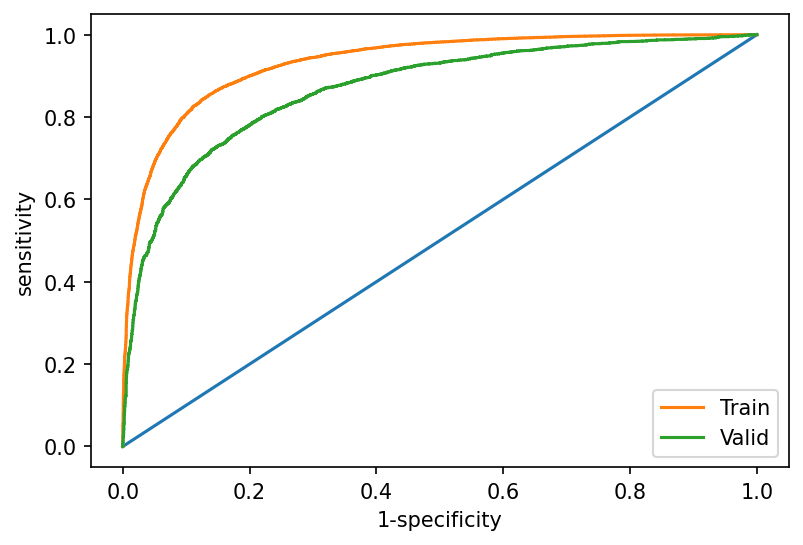

efficientnet-phospho-B-15
Fold: 1
Training on  4 GPUs!


  0%|          | 0/50 [00:00<?, ?it/s]

------------------------------------------------------------
Epoch 1/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.6874 Acc: 0.5421 Recall: 0.5595 AUC: 0.5663


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.6874 Acc: 0.5706 recall: 0.9153 AUC: 0.7060
------------------------------------------------------------

------------------------------------------------------------
Epoch 2/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.6126 Acc: 0.6809 Recall: 0.6579 AUC: 0.7382


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.6221 Acc: 0.6877 recall: 0.7965 AUC: 0.7696
------------------------------------------------------------

------------------------------------------------------------
Epoch 3/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.5588 Acc: 0.7303 Recall: 0.6956 AUC: 0.7905


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.5548 Acc: 0.7415 recall: 0.6879 AUC: 0.7969
------------------------------------------------------------

------------------------------------------------------------
Epoch 4/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.5278 Acc: 0.7505 Recall: 0.7164 AUC: 0.8163


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.5290 Acc: 0.7554 recall: 0.7062 AUC: 0.8170
------------------------------------------------------------

------------------------------------------------------------
Epoch 5/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.5048 Acc: 0.7685 Recall: 0.7430 AUC: 0.8358


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.5131 Acc: 0.7635 recall: 0.7149 AUC: 0.8287
------------------------------------------------------------

------------------------------------------------------------
Epoch 6/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.4877 Acc: 0.7738 Recall: 0.7541 AUC: 0.8486


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.5008 Acc: 0.7697 recall: 0.7295 AUC: 0.8370
------------------------------------------------------------

------------------------------------------------------------
Epoch 7/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.4714 Acc: 0.7849 Recall: 0.7639 AUC: 0.8597


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4923 Acc: 0.7705 recall: 0.7173 AUC: 0.8440
------------------------------------------------------------

------------------------------------------------------------
Epoch 8/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.4636 Acc: 0.7899 Recall: 0.7737 AUC: 0.8643


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4845 Acc: 0.7788 recall: 0.7642 AUC: 0.8483
------------------------------------------------------------

------------------------------------------------------------
Epoch 9/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.4530 Acc: 0.7946 Recall: 0.7760 AUC: 0.8713


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4793 Acc: 0.7788 recall: 0.7447 AUC: 0.8519
------------------------------------------------------------

------------------------------------------------------------
Epoch 10/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.4439 Acc: 0.7990 Recall: 0.7829 AUC: 0.8770


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4745 Acc: 0.7837 recall: 0.7744 AUC: 0.8550
------------------------------------------------------------

------------------------------------------------------------
Epoch 11/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.4361 Acc: 0.8061 Recall: 0.7929 AUC: 0.8816


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4718 Acc: 0.7825 recall: 0.7703 AUC: 0.8567
------------------------------------------------------------

------------------------------------------------------------
Epoch 12/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.4303 Acc: 0.8060 Recall: 0.7935 AUC: 0.8848


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4695 Acc: 0.7851 recall: 0.7514 AUC: 0.8585
------------------------------------------------------------

------------------------------------------------------------
Epoch 13/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.4224 Acc: 0.8123 Recall: 0.7982 AUC: 0.8897


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4658 Acc: 0.7870 recall: 0.7747 AUC: 0.8607
------------------------------------------------------------

------------------------------------------------------------
Epoch 14/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.4205 Acc: 0.8113 Recall: 0.7991 AUC: 0.8900


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4650 Acc: 0.7856 recall: 0.7709 AUC: 0.8612
------------------------------------------------------------

------------------------------------------------------------
Epoch 15/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.4150 Acc: 0.8145 Recall: 0.8013 AUC: 0.8931


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4654 Acc: 0.7902 recall: 0.7700 AUC: 0.8612
------------------------------------------------------------

------------------------------------------------------------
Epoch 16/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.4113 Acc: 0.8181 Recall: 0.8059 AUC: 0.8952


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4619 Acc: 0.7897 recall: 0.7542 AUC: 0.8641
------------------------------------------------------------

------------------------------------------------------------
Epoch 17/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.4046 Acc: 0.8204 Recall: 0.8092 AUC: 0.8991


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4589 Acc: 0.7921 recall: 0.7693 AUC: 0.8655
------------------------------------------------------------

------------------------------------------------------------
Epoch 18/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.4012 Acc: 0.8232 Recall: 0.8111 AUC: 0.9008


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4592 Acc: 0.7896 recall: 0.7866 AUC: 0.8656
------------------------------------------------------------

------------------------------------------------------------
Epoch 19/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3968 Acc: 0.8263 Recall: 0.8151 AUC: 0.9031


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4592 Acc: 0.7888 recall: 0.7713 AUC: 0.8657
------------------------------------------------------------

------------------------------------------------------------
Epoch 20/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3930 Acc: 0.8272 Recall: 0.8174 AUC: 0.9048


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4585 Acc: 0.7923 recall: 0.7875 AUC: 0.8665
------------------------------------------------------------

------------------------------------------------------------
Epoch 21/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3921 Acc: 0.8283 Recall: 0.8182 AUC: 0.9054


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4583 Acc: 0.7927 recall: 0.7677 AUC: 0.8668
------------------------------------------------------------

------------------------------------------------------------
Epoch 22/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3904 Acc: 0.8294 Recall: 0.8212 AUC: 0.9062


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4612 Acc: 0.7923 recall: 0.7383 AUC: 0.8683
------------------------------------------------------------

------------------------------------------------------------
Epoch 23/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3878 Acc: 0.8288 Recall: 0.8205 AUC: 0.9072


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4601 Acc: 0.7912 recall: 0.7449 AUC: 0.8685
------------------------------------------------------------

------------------------------------------------------------
Epoch 24/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3815 Acc: 0.8314 Recall: 0.8245 AUC: 0.9107


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4568 Acc: 0.7903 recall: 0.7856 AUC: 0.8683
------------------------------------------------------------

------------------------------------------------------------
Epoch 25/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3811 Acc: 0.8318 Recall: 0.8227 AUC: 0.9107


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4548 Acc: 0.7930 recall: 0.7850 AUC: 0.8694
------------------------------------------------------------

------------------------------------------------------------
Epoch 26/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3776 Acc: 0.8374 Recall: 0.8300 AUC: 0.9126


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4565 Acc: 0.7945 recall: 0.7685 AUC: 0.8691
------------------------------------------------------------

------------------------------------------------------------
Epoch 27/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3745 Acc: 0.8381 Recall: 0.8289 AUC: 0.9142


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4645 Acc: 0.7893 recall: 0.8263 AUC: 0.8677
------------------------------------------------------------

------------------------------------------------------------
Epoch 28/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3736 Acc: 0.8379 Recall: 0.8313 AUC: 0.9145


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4571 Acc: 0.7905 recall: 0.8093 AUC: 0.8696
------------------------------------------------------------

------------------------------------------------------------
Epoch 29/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3723 Acc: 0.8386 Recall: 0.8299 AUC: 0.9150


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4534 Acc: 0.7938 recall: 0.7900 AUC: 0.8708
------------------------------------------------------------

------------------------------------------------------------
Epoch 30/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3684 Acc: 0.8385 Recall: 0.8297 AUC: 0.9169


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4585 Acc: 0.7932 recall: 0.7620 AUC: 0.8697
------------------------------------------------------------

------------------------------------------------------------
Epoch 31/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3682 Acc: 0.8394 Recall: 0.8320 AUC: 0.9170


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4543 Acc: 0.7926 recall: 0.7910 AUC: 0.8711
------------------------------------------------------------

------------------------------------------------------------
Epoch 32/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3653 Acc: 0.8422 Recall: 0.8348 AUC: 0.9185


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4541 Acc: 0.7950 recall: 0.7787 AUC: 0.8710
------------------------------------------------------------

------------------------------------------------------------
Epoch 33/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3620 Acc: 0.8442 Recall: 0.8353 AUC: 0.9200


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4555 Acc: 0.7909 recall: 0.7770 AUC: 0.8706
------------------------------------------------------------

------------------------------------------------------------
Epoch 34/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3636 Acc: 0.8407 Recall: 0.8350 AUC: 0.9188


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4559 Acc: 0.7947 recall: 0.8114 AUC: 0.8717
------------------------------------------------------------

------------------------------------------------------------
Epoch 35/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3576 Acc: 0.8445 Recall: 0.8381 AUC: 0.9219


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4544 Acc: 0.7948 recall: 0.7872 AUC: 0.8722
------------------------------------------------------------

------------------------------------------------------------
Epoch 36/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3592 Acc: 0.8464 Recall: 0.8418 AUC: 0.9211


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4560 Acc: 0.7954 recall: 0.8081 AUC: 0.8713
------------------------------------------------------------

------------------------------------------------------------
Epoch 37/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3587 Acc: 0.8446 Recall: 0.8404 AUC: 0.9212


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4538 Acc: 0.7932 recall: 0.8025 AUC: 0.8728
------------------------------------------------------------

------------------------------------------------------------
Epoch 38/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3544 Acc: 0.8489 Recall: 0.8434 AUC: 0.9233


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4552 Acc: 0.7945 recall: 0.7988 AUC: 0.8720
------------------------------------------------------------

------------------------------------------------------------
Epoch 39/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3526 Acc: 0.8461 Recall: 0.8419 AUC: 0.9242


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4563 Acc: 0.7954 recall: 0.7755 AUC: 0.8721
------------------------------------------------------------

------------------------------------------------------------
Epoch 40/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3519 Acc: 0.8486 Recall: 0.8433 AUC: 0.9245


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4555 Acc: 0.7950 recall: 0.8043 AUC: 0.8731
------------------------------------------------------------

------------------------------------------------------------
Epoch 41/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3509 Acc: 0.8479 Recall: 0.8415 AUC: 0.9248


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4571 Acc: 0.7936 recall: 0.7813 AUC: 0.8724
------------------------------------------------------------

------------------------------------------------------------
Epoch 42/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3485 Acc: 0.8497 Recall: 0.8436 AUC: 0.9259


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4555 Acc: 0.7971 recall: 0.7673 AUC: 0.8735
------------------------------------------------------------

------------------------------------------------------------
Epoch 43/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3482 Acc: 0.8476 Recall: 0.8437 AUC: 0.9258


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4564 Acc: 0.7962 recall: 0.7812 AUC: 0.8729
------------------------------------------------------------

------------------------------------------------------------
Epoch 44/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3476 Acc: 0.8493 Recall: 0.8441 AUC: 0.9262


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4563 Acc: 0.7944 recall: 0.7826 AUC: 0.8733
------------------------------------------------------------

------------------------------------------------------------
Epoch 45/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3481 Acc: 0.8494 Recall: 0.8443 AUC: 0.9258


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4578 Acc: 0.7955 recall: 0.8143 AUC: 0.8737
------------------------------------------------------------

------------------------------------------------------------
Epoch 46/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3448 Acc: 0.8510 Recall: 0.8474 AUC: 0.9274


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4565 Acc: 0.7974 recall: 0.7896 AUC: 0.8734
------------------------------------------------------------

------------------------------------------------------------
Epoch 47/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3405 Acc: 0.8555 Recall: 0.8506 AUC: 0.9293


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4580 Acc: 0.7972 recall: 0.7745 AUC: 0.8731
------------------------------------------------------------

------------------------------------------------------------
Epoch 48/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3421 Acc: 0.8518 Recall: 0.8457 AUC: 0.9286


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4725 Acc: 0.7882 recall: 0.8494 AUC: 0.8726
------------------------------------------------------------

------------------------------------------------------------
Epoch 49/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3428 Acc: 0.8508 Recall: 0.8465 AUC: 0.9281


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4575 Acc: 0.7920 recall: 0.7814 AUC: 0.8729
------------------------------------------------------------

------------------------------------------------------------
Epoch 50/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3389 Acc: 0.8531 Recall: 0.8483 AUC: 0.9300


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4563 Acc: 0.7962 recall: 0.7971 AUC: 0.8736
------------------------------------------------------------

Training complete in 2m 42s
Best val Loss: 0.453414
Best val Acc: 0.797389


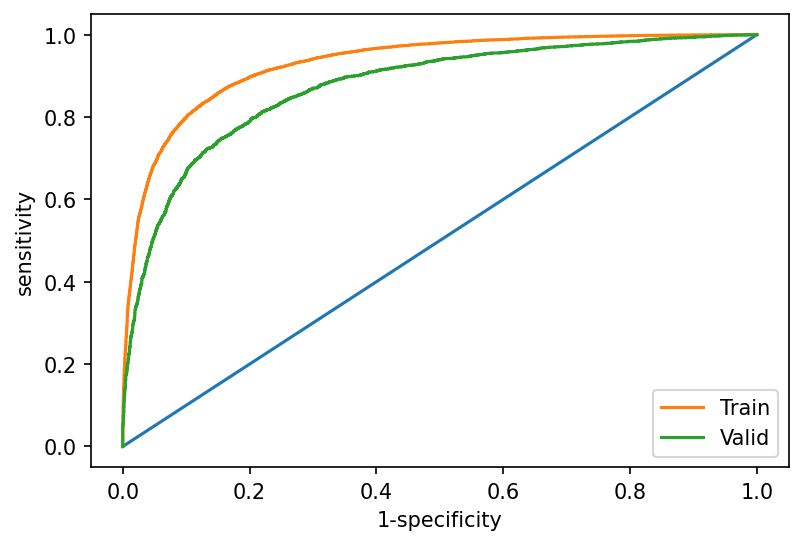

efficientnet-phospho-B-15
Fold: 2
Training on  4 GPUs!


  0%|          | 0/50 [00:00<?, ?it/s]

------------------------------------------------------------
Epoch 1/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.6743 Acc: 0.5802 Recall: 0.5637 AUC: 0.6109


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.6854 Acc: 0.5129 recall: 0.9947 AUC: 0.6907
------------------------------------------------------------

------------------------------------------------------------
Epoch 2/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.6064 Acc: 0.6812 Recall: 0.6384 AUC: 0.7388


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.6136 Acc: 0.6786 recall: 0.7925 AUC: 0.7685
------------------------------------------------------------

------------------------------------------------------------
Epoch 3/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.5614 Acc: 0.7236 Recall: 0.6749 AUC: 0.7861


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.5501 Acc: 0.7373 recall: 0.7327 AUC: 0.8037
------------------------------------------------------------

------------------------------------------------------------
Epoch 4/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.5319 Acc: 0.7508 Recall: 0.7173 AUC: 0.8131


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.5241 Acc: 0.7589 recall: 0.7054 AUC: 0.8229
------------------------------------------------------------

------------------------------------------------------------
Epoch 5/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.5110 Acc: 0.7629 Recall: 0.7362 AUC: 0.8303


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.5055 Acc: 0.7697 recall: 0.7493 AUC: 0.8354
------------------------------------------------------------

------------------------------------------------------------
Epoch 6/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.4909 Acc: 0.7750 Recall: 0.7541 AUC: 0.8459


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4910 Acc: 0.7759 recall: 0.7584 AUC: 0.8463
------------------------------------------------------------

------------------------------------------------------------
Epoch 7/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.4764 Acc: 0.7822 Recall: 0.7623 AUC: 0.8560


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4825 Acc: 0.7783 recall: 0.7954 AUC: 0.8528
------------------------------------------------------------

------------------------------------------------------------
Epoch 8/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.4641 Acc: 0.7883 Recall: 0.7727 AUC: 0.8640


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4745 Acc: 0.7859 recall: 0.7786 AUC: 0.8576
------------------------------------------------------------

------------------------------------------------------------
Epoch 9/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.4552 Acc: 0.7944 Recall: 0.7792 AUC: 0.8696


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4690 Acc: 0.7868 recall: 0.7523 AUC: 0.8614
------------------------------------------------------------

------------------------------------------------------------
Epoch 10/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.4453 Acc: 0.7989 Recall: 0.7854 AUC: 0.8762


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4622 Acc: 0.7889 recall: 0.7582 AUC: 0.8648
------------------------------------------------------------

------------------------------------------------------------
Epoch 11/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.4383 Acc: 0.8032 Recall: 0.7881 AUC: 0.8800


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4593 Acc: 0.7905 recall: 0.7628 AUC: 0.8671
------------------------------------------------------------

------------------------------------------------------------
Epoch 12/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.4319 Acc: 0.8061 Recall: 0.7937 AUC: 0.8841


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4557 Acc: 0.7924 recall: 0.7773 AUC: 0.8683
------------------------------------------------------------

------------------------------------------------------------
Epoch 13/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.4269 Acc: 0.8080 Recall: 0.7945 AUC: 0.8866


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4539 Acc: 0.7933 recall: 0.7749 AUC: 0.8695
------------------------------------------------------------

------------------------------------------------------------
Epoch 14/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.4215 Acc: 0.8126 Recall: 0.8006 AUC: 0.8898


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4515 Acc: 0.7975 recall: 0.7992 AUC: 0.8714
------------------------------------------------------------

------------------------------------------------------------
Epoch 15/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.4156 Acc: 0.8146 Recall: 0.8031 AUC: 0.8930


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4514 Acc: 0.7976 recall: 0.7601 AUC: 0.8728
------------------------------------------------------------

------------------------------------------------------------
Epoch 16/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.4114 Acc: 0.8191 Recall: 0.8085 AUC: 0.8954


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4464 Acc: 0.7986 recall: 0.7904 AUC: 0.8743
------------------------------------------------------------

------------------------------------------------------------
Epoch 17/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.4072 Acc: 0.8200 Recall: 0.8093 AUC: 0.8976


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4456 Acc: 0.7993 recall: 0.7923 AUC: 0.8749
------------------------------------------------------------

------------------------------------------------------------
Epoch 18/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.4034 Acc: 0.8234 Recall: 0.8130 AUC: 0.8994


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4476 Acc: 0.7992 recall: 0.8121 AUC: 0.8746
------------------------------------------------------------

------------------------------------------------------------
Epoch 19/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3977 Acc: 0.8257 Recall: 0.8186 AUC: 0.9025


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4460 Acc: 0.7990 recall: 0.7916 AUC: 0.8747
------------------------------------------------------------

------------------------------------------------------------
Epoch 20/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3958 Acc: 0.8278 Recall: 0.8181 AUC: 0.9035


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4467 Acc: 0.7983 recall: 0.7645 AUC: 0.8751
------------------------------------------------------------

------------------------------------------------------------
Epoch 21/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3932 Acc: 0.8283 Recall: 0.8193 AUC: 0.9045


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4467 Acc: 0.8010 recall: 0.7672 AUC: 0.8761
------------------------------------------------------------

------------------------------------------------------------
Epoch 22/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3897 Acc: 0.8287 Recall: 0.8217 AUC: 0.9068


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4464 Acc: 0.8018 recall: 0.7677 AUC: 0.8762
------------------------------------------------------------

------------------------------------------------------------
Epoch 23/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3870 Acc: 0.8300 Recall: 0.8197 AUC: 0.9081


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4457 Acc: 0.8029 recall: 0.7644 AUC: 0.8774
------------------------------------------------------------

------------------------------------------------------------
Epoch 24/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3824 Acc: 0.8319 Recall: 0.8239 AUC: 0.9101


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4435 Acc: 0.8035 recall: 0.8010 AUC: 0.8770
------------------------------------------------------------

------------------------------------------------------------
Epoch 25/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3794 Acc: 0.8330 Recall: 0.8248 AUC: 0.9116


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4434 Acc: 0.8006 recall: 0.7988 AUC: 0.8770
------------------------------------------------------------

------------------------------------------------------------
Epoch 26/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3779 Acc: 0.8362 Recall: 0.8273 AUC: 0.9124


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4441 Acc: 0.8025 recall: 0.8099 AUC: 0.8771
------------------------------------------------------------

------------------------------------------------------------
Epoch 27/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3757 Acc: 0.8348 Recall: 0.8264 AUC: 0.9134


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4430 Acc: 0.8050 recall: 0.7986 AUC: 0.8775
------------------------------------------------------------

------------------------------------------------------------
Epoch 28/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3747 Acc: 0.8376 Recall: 0.8312 AUC: 0.9138


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4450 Acc: 0.8048 recall: 0.7934 AUC: 0.8768
------------------------------------------------------------

------------------------------------------------------------
Epoch 29/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3708 Acc: 0.8396 Recall: 0.8308 AUC: 0.9157


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4462 Acc: 0.8026 recall: 0.8244 AUC: 0.8773
------------------------------------------------------------

------------------------------------------------------------
Epoch 30/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3684 Acc: 0.8397 Recall: 0.8322 AUC: 0.9168


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4444 Acc: 0.8056 recall: 0.7909 AUC: 0.8777
------------------------------------------------------------

------------------------------------------------------------
Epoch 31/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3673 Acc: 0.8419 Recall: 0.8354 AUC: 0.9174


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4436 Acc: 0.8095 recall: 0.7961 AUC: 0.8781
------------------------------------------------------------

------------------------------------------------------------
Epoch 32/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3655 Acc: 0.8405 Recall: 0.8324 AUC: 0.9183


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4453 Acc: 0.8064 recall: 0.7904 AUC: 0.8779
------------------------------------------------------------

------------------------------------------------------------
Epoch 33/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3615 Acc: 0.8464 Recall: 0.8379 AUC: 0.9202


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4451 Acc: 0.8047 recall: 0.7842 AUC: 0.8784
------------------------------------------------------------

------------------------------------------------------------
Epoch 34/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3617 Acc: 0.8442 Recall: 0.8384 AUC: 0.9201


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4466 Acc: 0.8052 recall: 0.8174 AUC: 0.8781
------------------------------------------------------------

------------------------------------------------------------
Epoch 35/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3599 Acc: 0.8456 Recall: 0.8374 AUC: 0.9208


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4455 Acc: 0.8076 recall: 0.8054 AUC: 0.8778
------------------------------------------------------------

------------------------------------------------------------
Epoch 36/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3561 Acc: 0.8472 Recall: 0.8401 AUC: 0.9226


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4478 Acc: 0.8061 recall: 0.8073 AUC: 0.8768
------------------------------------------------------------

------------------------------------------------------------
Epoch 37/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3550 Acc: 0.8449 Recall: 0.8406 AUC: 0.9230


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4488 Acc: 0.8032 recall: 0.8198 AUC: 0.8767
------------------------------------------------------------

------------------------------------------------------------
Epoch 38/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3535 Acc: 0.8496 Recall: 0.8434 AUC: 0.9238


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4486 Acc: 0.8085 recall: 0.7871 AUC: 0.8777
------------------------------------------------------------

------------------------------------------------------------
Epoch 39/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3519 Acc: 0.8494 Recall: 0.8443 AUC: 0.9244


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4503 Acc: 0.8050 recall: 0.7723 AUC: 0.8770
------------------------------------------------------------

------------------------------------------------------------
Epoch 40/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3472 Acc: 0.8510 Recall: 0.8457 AUC: 0.9267


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4494 Acc: 0.8061 recall: 0.7961 AUC: 0.8772
------------------------------------------------------------

------------------------------------------------------------
Epoch 41/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3486 Acc: 0.8497 Recall: 0.8463 AUC: 0.9257


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4485 Acc: 0.8053 recall: 0.7971 AUC: 0.8776
------------------------------------------------------------

------------------------------------------------------------
Epoch 42/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3501 Acc: 0.8490 Recall: 0.8412 AUC: 0.9250


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4499 Acc: 0.8053 recall: 0.8164 AUC: 0.8768
------------------------------------------------------------

------------------------------------------------------------
Epoch 43/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3471 Acc: 0.8501 Recall: 0.8459 AUC: 0.9266


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4502 Acc: 0.8065 recall: 0.7929 AUC: 0.8770
------------------------------------------------------------

------------------------------------------------------------
Epoch 44/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3459 Acc: 0.8533 Recall: 0.8477 AUC: 0.9269


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4524 Acc: 0.8050 recall: 0.8044 AUC: 0.8758
------------------------------------------------------------

------------------------------------------------------------
Epoch 45/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3429 Acc: 0.8535 Recall: 0.8488 AUC: 0.9283


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4522 Acc: 0.8059 recall: 0.8158 AUC: 0.8764
------------------------------------------------------------

------------------------------------------------------------
Epoch 46/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3417 Acc: 0.8535 Recall: 0.8496 AUC: 0.9287


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4529 Acc: 0.8056 recall: 0.8023 AUC: 0.8762
------------------------------------------------------------

------------------------------------------------------------
Epoch 47/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3423 Acc: 0.8504 Recall: 0.8426 AUC: 0.9285


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4537 Acc: 0.8049 recall: 0.8129 AUC: 0.8762
------------------------------------------------------------

------------------------------------------------------------
Epoch 48/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3388 Acc: 0.8541 Recall: 0.8500 AUC: 0.9301


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4515 Acc: 0.8067 recall: 0.8031 AUC: 0.8770
------------------------------------------------------------

------------------------------------------------------------
Epoch 49/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3364 Acc: 0.8566 Recall: 0.8520 AUC: 0.9312


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4557 Acc: 0.8044 recall: 0.8220 AUC: 0.8765
------------------------------------------------------------

------------------------------------------------------------
Epoch 50/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3359 Acc: 0.8549 Recall: 0.8501 AUC: 0.9312


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4598 Acc: 0.8026 recall: 0.8322 AUC: 0.8761
------------------------------------------------------------

Training complete in 2m 41s
Best val Loss: 0.443023
Best val Acc: 0.809485


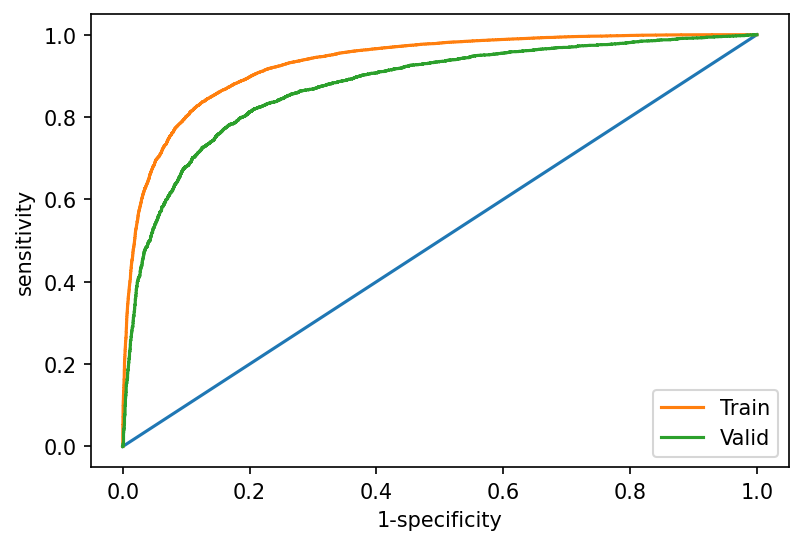

efficientnet-phospho-B-15
Fold: 3
Training on  4 GPUs!


  0%|          | 0/50 [00:00<?, ?it/s]

------------------------------------------------------------
Epoch 1/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.6747 Acc: 0.5795 Recall: 0.5436 AUC: 0.6093


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.6825 Acc: 0.5563 recall: 0.9515 AUC: 0.7215
------------------------------------------------------------

------------------------------------------------------------
Epoch 2/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.6038 Acc: 0.6927 Recall: 0.6748 AUC: 0.7488


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.6040 Acc: 0.7222 recall: 0.7840 AUC: 0.7888
------------------------------------------------------------

------------------------------------------------------------
Epoch 3/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.5540 Acc: 0.7342 Recall: 0.7060 AUC: 0.7966


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.5441 Acc: 0.7524 recall: 0.7741 AUC: 0.8112
------------------------------------------------------------

------------------------------------------------------------
Epoch 4/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.5225 Acc: 0.7569 Recall: 0.7278 AUC: 0.8229


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.5197 Acc: 0.7677 recall: 0.7594 AUC: 0.8253
------------------------------------------------------------

------------------------------------------------------------
Epoch 5/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.5017 Acc: 0.7675 Recall: 0.7450 AUC: 0.8379


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.5059 Acc: 0.7700 recall: 0.7798 AUC: 0.8356
------------------------------------------------------------

------------------------------------------------------------
Epoch 6/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.4842 Acc: 0.7779 Recall: 0.7576 AUC: 0.8509


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4940 Acc: 0.7787 recall: 0.7639 AUC: 0.8432
------------------------------------------------------------

------------------------------------------------------------
Epoch 7/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.4699 Acc: 0.7864 Recall: 0.7713 AUC: 0.8606


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4857 Acc: 0.7802 recall: 0.7893 AUC: 0.8499
------------------------------------------------------------

------------------------------------------------------------
Epoch 8/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.4578 Acc: 0.7939 Recall: 0.7799 AUC: 0.8684


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4791 Acc: 0.7841 recall: 0.7903 AUC: 0.8542
------------------------------------------------------------

------------------------------------------------------------
Epoch 9/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.4482 Acc: 0.7998 Recall: 0.7873 AUC: 0.8743


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4737 Acc: 0.7879 recall: 0.7838 AUC: 0.8571
------------------------------------------------------------

------------------------------------------------------------
Epoch 10/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.4392 Acc: 0.8044 Recall: 0.7898 AUC: 0.8796


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4693 Acc: 0.7880 recall: 0.7883 AUC: 0.8600
------------------------------------------------------------

------------------------------------------------------------
Epoch 11/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.4325 Acc: 0.8072 Recall: 0.7944 AUC: 0.8835


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4678 Acc: 0.7915 recall: 0.7733 AUC: 0.8612
------------------------------------------------------------

------------------------------------------------------------
Epoch 12/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.4255 Acc: 0.8096 Recall: 0.7970 AUC: 0.8871


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4643 Acc: 0.7906 recall: 0.7920 AUC: 0.8633
------------------------------------------------------------

------------------------------------------------------------
Epoch 13/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.4199 Acc: 0.8155 Recall: 0.8052 AUC: 0.8905


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4632 Acc: 0.7910 recall: 0.8112 AUC: 0.8659
------------------------------------------------------------

------------------------------------------------------------
Epoch 14/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.4151 Acc: 0.8172 Recall: 0.8043 AUC: 0.8930


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4624 Acc: 0.7917 recall: 0.8089 AUC: 0.8656
------------------------------------------------------------

------------------------------------------------------------
Epoch 15/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.4106 Acc: 0.8194 Recall: 0.8103 AUC: 0.8955


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4578 Acc: 0.7956 recall: 0.7684 AUC: 0.8687
------------------------------------------------------------

------------------------------------------------------------
Epoch 16/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.4064 Acc: 0.8213 Recall: 0.8121 AUC: 0.8975


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4562 Acc: 0.7978 recall: 0.7875 AUC: 0.8687
------------------------------------------------------------

------------------------------------------------------------
Epoch 17/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.4020 Acc: 0.8232 Recall: 0.8121 AUC: 0.9000


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4560 Acc: 0.7971 recall: 0.7825 AUC: 0.8695
------------------------------------------------------------

------------------------------------------------------------
Epoch 18/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3968 Acc: 0.8259 Recall: 0.8140 AUC: 0.9029


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4550 Acc: 0.7977 recall: 0.7751 AUC: 0.8704
------------------------------------------------------------

------------------------------------------------------------
Epoch 19/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3934 Acc: 0.8267 Recall: 0.8164 AUC: 0.9046


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4596 Acc: 0.7941 recall: 0.8210 AUC: 0.8699
------------------------------------------------------------

------------------------------------------------------------
Epoch 20/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3917 Acc: 0.8268 Recall: 0.8137 AUC: 0.9053


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4539 Acc: 0.7986 recall: 0.8107 AUC: 0.8722
------------------------------------------------------------

------------------------------------------------------------
Epoch 21/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3891 Acc: 0.8306 Recall: 0.8226 AUC: 0.9067


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4568 Acc: 0.7989 recall: 0.7573 AUC: 0.8723
------------------------------------------------------------

------------------------------------------------------------
Epoch 22/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3832 Acc: 0.8347 Recall: 0.8253 AUC: 0.9098


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4517 Acc: 0.8014 recall: 0.7801 AUC: 0.8735
------------------------------------------------------------

------------------------------------------------------------
Epoch 23/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3831 Acc: 0.8322 Recall: 0.8219 AUC: 0.9096


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4533 Acc: 0.7998 recall: 0.8161 AUC: 0.8733
------------------------------------------------------------

------------------------------------------------------------
Epoch 24/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3810 Acc: 0.8329 Recall: 0.8247 AUC: 0.9106


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4544 Acc: 0.7992 recall: 0.8286 AUC: 0.8740
------------------------------------------------------------

------------------------------------------------------------
Epoch 25/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3776 Acc: 0.8348 Recall: 0.8265 AUC: 0.9123


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4533 Acc: 0.8034 recall: 0.7755 AUC: 0.8740
------------------------------------------------------------

------------------------------------------------------------
Epoch 26/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3778 Acc: 0.8356 Recall: 0.8292 AUC: 0.9124


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4526 Acc: 0.8007 recall: 0.8111 AUC: 0.8735
------------------------------------------------------------

------------------------------------------------------------
Epoch 27/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3735 Acc: 0.8390 Recall: 0.8306 AUC: 0.9144


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4507 Acc: 0.7997 recall: 0.7897 AUC: 0.8744
------------------------------------------------------------

------------------------------------------------------------
Epoch 28/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3706 Acc: 0.8398 Recall: 0.8346 AUC: 0.9156


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4480 Acc: 0.8058 recall: 0.8101 AUC: 0.8763
------------------------------------------------------------

------------------------------------------------------------
Epoch 29/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3692 Acc: 0.8403 Recall: 0.8306 AUC: 0.9164


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4505 Acc: 0.8032 recall: 0.8076 AUC: 0.8755
------------------------------------------------------------

------------------------------------------------------------
Epoch 30/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3658 Acc: 0.8410 Recall: 0.8350 AUC: 0.9179


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4570 Acc: 0.8025 recall: 0.7525 AUC: 0.8760
------------------------------------------------------------

------------------------------------------------------------
Epoch 31/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3644 Acc: 0.8405 Recall: 0.8291 AUC: 0.9185


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4507 Acc: 0.8052 recall: 0.8161 AUC: 0.8761
------------------------------------------------------------

------------------------------------------------------------
Epoch 32/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3647 Acc: 0.8413 Recall: 0.8320 AUC: 0.9185


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4504 Acc: 0.8053 recall: 0.8034 AUC: 0.8761
------------------------------------------------------------

------------------------------------------------------------
Epoch 33/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3629 Acc: 0.8434 Recall: 0.8350 AUC: 0.9192


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4501 Acc: 0.8061 recall: 0.8139 AUC: 0.8766
------------------------------------------------------------

------------------------------------------------------------
Epoch 34/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3595 Acc: 0.8448 Recall: 0.8367 AUC: 0.9208


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4520 Acc: 0.8056 recall: 0.7816 AUC: 0.8763
------------------------------------------------------------

------------------------------------------------------------
Epoch 35/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3566 Acc: 0.8464 Recall: 0.8369 AUC: 0.9223


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4515 Acc: 0.8045 recall: 0.7980 AUC: 0.8761
------------------------------------------------------------

------------------------------------------------------------
Epoch 36/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3572 Acc: 0.8449 Recall: 0.8388 AUC: 0.9218


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4519 Acc: 0.8055 recall: 0.7963 AUC: 0.8764
------------------------------------------------------------

------------------------------------------------------------
Epoch 37/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3563 Acc: 0.8469 Recall: 0.8404 AUC: 0.9222


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4541 Acc: 0.8073 recall: 0.7902 AUC: 0.8752
------------------------------------------------------------

------------------------------------------------------------
Epoch 38/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3526 Acc: 0.8454 Recall: 0.8382 AUC: 0.9242


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4518 Acc: 0.8070 recall: 0.8001 AUC: 0.8767
------------------------------------------------------------

------------------------------------------------------------
Epoch 39/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3519 Acc: 0.8483 Recall: 0.8399 AUC: 0.9242


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4516 Acc: 0.8049 recall: 0.8038 AUC: 0.8767
------------------------------------------------------------

------------------------------------------------------------
Epoch 40/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3487 Acc: 0.8503 Recall: 0.8440 AUC: 0.9258


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4519 Acc: 0.8071 recall: 0.8060 AUC: 0.8769
------------------------------------------------------------

------------------------------------------------------------
Epoch 41/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3496 Acc: 0.8511 Recall: 0.8445 AUC: 0.9253


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4556 Acc: 0.8053 recall: 0.7721 AUC: 0.8768
------------------------------------------------------------

------------------------------------------------------------
Epoch 42/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3457 Acc: 0.8527 Recall: 0.8492 AUC: 0.9271


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4513 Acc: 0.8059 recall: 0.8046 AUC: 0.8777
------------------------------------------------------------

------------------------------------------------------------
Epoch 43/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3462 Acc: 0.8503 Recall: 0.8441 AUC: 0.9266


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4508 Acc: 0.8090 recall: 0.8069 AUC: 0.8783
------------------------------------------------------------

------------------------------------------------------------
Epoch 44/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3458 Acc: 0.8492 Recall: 0.8449 AUC: 0.9268


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4537 Acc: 0.8062 recall: 0.7982 AUC: 0.8775
------------------------------------------------------------

------------------------------------------------------------
Epoch 45/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3422 Acc: 0.8530 Recall: 0.8471 AUC: 0.9286


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4575 Acc: 0.8062 recall: 0.7712 AUC: 0.8780
------------------------------------------------------------

------------------------------------------------------------
Epoch 46/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3423 Acc: 0.8525 Recall: 0.8477 AUC: 0.9286


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4546 Acc: 0.8073 recall: 0.7888 AUC: 0.8776
------------------------------------------------------------

------------------------------------------------------------
Epoch 47/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3408 Acc: 0.8543 Recall: 0.8492 AUC: 0.9291


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4559 Acc: 0.8076 recall: 0.7862 AUC: 0.8766
------------------------------------------------------------

------------------------------------------------------------
Epoch 48/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3388 Acc: 0.8552 Recall: 0.8490 AUC: 0.9299


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4559 Acc: 0.8033 recall: 0.8246 AUC: 0.8777
------------------------------------------------------------

------------------------------------------------------------
Epoch 49/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3383 Acc: 0.8523 Recall: 0.8463 AUC: 0.9300


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4552 Acc: 0.8050 recall: 0.8120 AUC: 0.8772
------------------------------------------------------------

------------------------------------------------------------
Epoch 50/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3340 Acc: 0.8569 Recall: 0.8520 AUC: 0.9321


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4563 Acc: 0.8047 recall: 0.7956 AUC: 0.8769
------------------------------------------------------------

Training complete in 2m 41s
Best val Loss: 0.448032
Best val Acc: 0.809049


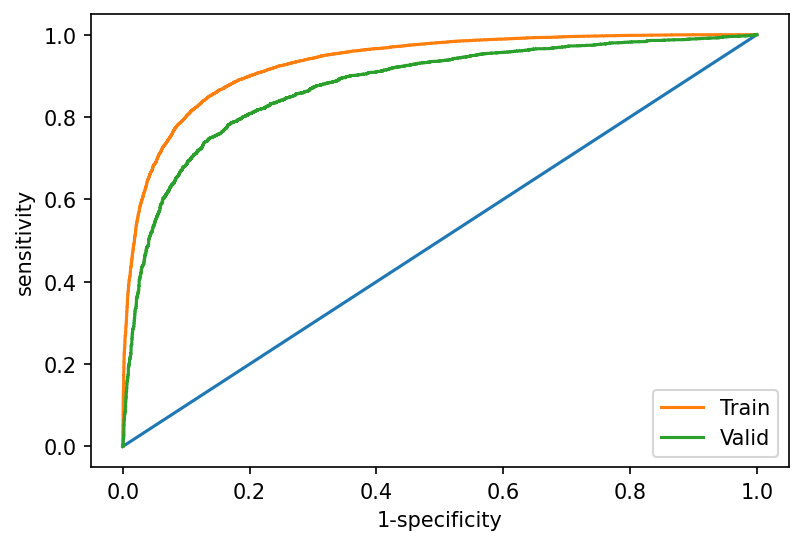

efficientnet-phospho-B-15
Fold: 4
Training on  4 GPUs!


  0%|          | 0/50 [00:00<?, ?it/s]

------------------------------------------------------------
Epoch 1/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.6739 Acc: 0.5761 Recall: 0.5884 AUC: 0.6106


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.6835 Acc: 0.5168 recall: 0.9680 AUC: 0.7093
------------------------------------------------------------

------------------------------------------------------------
Epoch 2/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.6055 Acc: 0.6861 Recall: 0.6676 AUC: 0.7449


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.6042 Acc: 0.7219 recall: 0.7183 AUC: 0.7798
------------------------------------------------------------

------------------------------------------------------------
Epoch 3/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.5606 Acc: 0.7302 Recall: 0.6998 AUC: 0.7900


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.5461 Acc: 0.7447 recall: 0.6722 AUC: 0.8058
------------------------------------------------------------

------------------------------------------------------------
Epoch 4/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.5299 Acc: 0.7493 Recall: 0.7219 AUC: 0.8159


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.5206 Acc: 0.7551 recall: 0.7072 AUC: 0.8227
------------------------------------------------------------

------------------------------------------------------------
Epoch 5/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.5080 Acc: 0.7633 Recall: 0.7385 AUC: 0.8327


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.5053 Acc: 0.7626 recall: 0.7169 AUC: 0.8336
------------------------------------------------------------

------------------------------------------------------------
Epoch 6/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.4907 Acc: 0.7745 Recall: 0.7499 AUC: 0.8456


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4950 Acc: 0.7708 recall: 0.7780 AUC: 0.8440
------------------------------------------------------------

------------------------------------------------------------
Epoch 7/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.4768 Acc: 0.7795 Recall: 0.7596 AUC: 0.8550


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4806 Acc: 0.7762 recall: 0.7432 AUC: 0.8519
------------------------------------------------------------

------------------------------------------------------------
Epoch 8/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.4657 Acc: 0.7865 Recall: 0.7719 AUC: 0.8627


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4792 Acc: 0.7788 recall: 0.7981 AUC: 0.8555
------------------------------------------------------------

------------------------------------------------------------
Epoch 9/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.4553 Acc: 0.7930 Recall: 0.7773 AUC: 0.8695


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4689 Acc: 0.7850 recall: 0.7739 AUC: 0.8597
------------------------------------------------------------

------------------------------------------------------------
Epoch 10/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.4462 Acc: 0.7984 Recall: 0.7850 AUC: 0.8751


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4636 Acc: 0.7865 recall: 0.7603 AUC: 0.8627
------------------------------------------------------------

------------------------------------------------------------
Epoch 11/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.4392 Acc: 0.8047 Recall: 0.7903 AUC: 0.8794


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4597 Acc: 0.7886 recall: 0.7629 AUC: 0.8650
------------------------------------------------------------

------------------------------------------------------------
Epoch 12/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.4331 Acc: 0.8049 Recall: 0.7935 AUC: 0.8825


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4566 Acc: 0.7925 recall: 0.7748 AUC: 0.8675
------------------------------------------------------------

------------------------------------------------------------
Epoch 13/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.4281 Acc: 0.8075 Recall: 0.7968 AUC: 0.8855


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4552 Acc: 0.7963 recall: 0.7850 AUC: 0.8684
------------------------------------------------------------

------------------------------------------------------------
Epoch 14/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.4223 Acc: 0.8106 Recall: 0.7968 AUC: 0.8891


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4556 Acc: 0.7954 recall: 0.8058 AUC: 0.8691
------------------------------------------------------------

------------------------------------------------------------
Epoch 15/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.4161 Acc: 0.8159 Recall: 0.8052 AUC: 0.8925


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4509 Acc: 0.7966 recall: 0.7637 AUC: 0.8710
------------------------------------------------------------

------------------------------------------------------------
Epoch 16/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.4113 Acc: 0.8162 Recall: 0.8068 AUC: 0.8951


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4483 Acc: 0.7981 recall: 0.7825 AUC: 0.8724
------------------------------------------------------------

------------------------------------------------------------
Epoch 17/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.4075 Acc: 0.8190 Recall: 0.8124 AUC: 0.8973


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4488 Acc: 0.7983 recall: 0.7963 AUC: 0.8727
------------------------------------------------------------

------------------------------------------------------------
Epoch 18/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.4036 Acc: 0.8209 Recall: 0.8124 AUC: 0.8993


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4491 Acc: 0.7998 recall: 0.7831 AUC: 0.8718
------------------------------------------------------------

------------------------------------------------------------
Epoch 19/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3993 Acc: 0.8227 Recall: 0.8136 AUC: 0.9016


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4463 Acc: 0.8016 recall: 0.7818 AUC: 0.8739
------------------------------------------------------------

------------------------------------------------------------
Epoch 20/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3974 Acc: 0.8248 Recall: 0.8160 AUC: 0.9024


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4449 Acc: 0.8016 recall: 0.7733 AUC: 0.8750
------------------------------------------------------------

------------------------------------------------------------
Epoch 21/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3924 Acc: 0.8266 Recall: 0.8171 AUC: 0.9052


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4444 Acc: 0.8031 recall: 0.7795 AUC: 0.8753
------------------------------------------------------------

------------------------------------------------------------
Epoch 22/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3913 Acc: 0.8280 Recall: 0.8202 AUC: 0.9056


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4451 Acc: 0.8008 recall: 0.7902 AUC: 0.8749
------------------------------------------------------------

------------------------------------------------------------
Epoch 23/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3874 Acc: 0.8284 Recall: 0.8216 AUC: 0.9076


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4461 Acc: 0.8002 recall: 0.7794 AUC: 0.8744
------------------------------------------------------------

------------------------------------------------------------
Epoch 24/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3833 Acc: 0.8318 Recall: 0.8234 AUC: 0.9099


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4456 Acc: 0.8033 recall: 0.8119 AUC: 0.8762
------------------------------------------------------------

------------------------------------------------------------
Epoch 25/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3811 Acc: 0.8322 Recall: 0.8247 AUC: 0.9109


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4495 Acc: 0.8002 recall: 0.8149 AUC: 0.8749
------------------------------------------------------------

------------------------------------------------------------
Epoch 26/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3773 Acc: 0.8368 Recall: 0.8317 AUC: 0.9128


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4480 Acc: 0.8011 recall: 0.7859 AUC: 0.8740
------------------------------------------------------------

------------------------------------------------------------
Epoch 27/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3760 Acc: 0.8368 Recall: 0.8280 AUC: 0.9134


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4480 Acc: 0.7999 recall: 0.8118 AUC: 0.8762
------------------------------------------------------------

------------------------------------------------------------
Epoch 28/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3745 Acc: 0.8363 Recall: 0.8307 AUC: 0.9140


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4452 Acc: 0.8052 recall: 0.7945 AUC: 0.8758
------------------------------------------------------------

------------------------------------------------------------
Epoch 29/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3712 Acc: 0.8376 Recall: 0.8319 AUC: 0.9156


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4444 Acc: 0.8026 recall: 0.7904 AUC: 0.8764
------------------------------------------------------------

------------------------------------------------------------
Epoch 30/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3709 Acc: 0.8382 Recall: 0.8335 AUC: 0.9157


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4494 Acc: 0.7978 recall: 0.7570 AUC: 0.8750
------------------------------------------------------------

------------------------------------------------------------
Epoch 31/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3675 Acc: 0.8401 Recall: 0.8354 AUC: 0.9173


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4483 Acc: 0.7990 recall: 0.8156 AUC: 0.8766
------------------------------------------------------------

------------------------------------------------------------
Epoch 32/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3653 Acc: 0.8406 Recall: 0.8354 AUC: 0.9183


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4509 Acc: 0.8027 recall: 0.7482 AUC: 0.8759
------------------------------------------------------------

------------------------------------------------------------
Epoch 33/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3647 Acc: 0.8406 Recall: 0.8349 AUC: 0.9184


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4484 Acc: 0.8004 recall: 0.8136 AUC: 0.8762
------------------------------------------------------------

------------------------------------------------------------
Epoch 34/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3617 Acc: 0.8417 Recall: 0.8379 AUC: 0.9200


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4467 Acc: 0.8022 recall: 0.7600 AUC: 0.8770
------------------------------------------------------------

------------------------------------------------------------
Epoch 35/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3617 Acc: 0.8435 Recall: 0.8393 AUC: 0.9199


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4459 Acc: 0.8001 recall: 0.7903 AUC: 0.8768
------------------------------------------------------------

------------------------------------------------------------
Epoch 36/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3590 Acc: 0.8437 Recall: 0.8401 AUC: 0.9211


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4491 Acc: 0.8002 recall: 0.7743 AUC: 0.8756
------------------------------------------------------------

------------------------------------------------------------
Epoch 37/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3591 Acc: 0.8432 Recall: 0.8403 AUC: 0.9210


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4473 Acc: 0.8019 recall: 0.7893 AUC: 0.8766
------------------------------------------------------------

------------------------------------------------------------
Epoch 38/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3536 Acc: 0.8468 Recall: 0.8421 AUC: 0.9236


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4483 Acc: 0.8011 recall: 0.7797 AUC: 0.8761
------------------------------------------------------------

------------------------------------------------------------
Epoch 39/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3527 Acc: 0.8462 Recall: 0.8429 AUC: 0.9239


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4461 Acc: 0.8032 recall: 0.7830 AUC: 0.8766
------------------------------------------------------------

------------------------------------------------------------
Epoch 40/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3518 Acc: 0.8472 Recall: 0.8409 AUC: 0.9244


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4498 Acc: 0.7994 recall: 0.7991 AUC: 0.8761
------------------------------------------------------------

------------------------------------------------------------
Epoch 41/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3519 Acc: 0.8460 Recall: 0.8433 AUC: 0.9243


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4486 Acc: 0.8011 recall: 0.8047 AUC: 0.8767
------------------------------------------------------------

------------------------------------------------------------
Epoch 42/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3521 Acc: 0.8457 Recall: 0.8423 AUC: 0.9242


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4490 Acc: 0.8015 recall: 0.7985 AUC: 0.8764
------------------------------------------------------------

------------------------------------------------------------
Epoch 43/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3467 Acc: 0.8483 Recall: 0.8448 AUC: 0.9268


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4525 Acc: 0.7986 recall: 0.8041 AUC: 0.8755
------------------------------------------------------------

------------------------------------------------------------
Epoch 44/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3476 Acc: 0.8489 Recall: 0.8442 AUC: 0.9260


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4509 Acc: 0.8008 recall: 0.8102 AUC: 0.8770
------------------------------------------------------------

------------------------------------------------------------
Epoch 45/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3467 Acc: 0.8485 Recall: 0.8438 AUC: 0.9266


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4569 Acc: 0.7986 recall: 0.8221 AUC: 0.8759
------------------------------------------------------------

------------------------------------------------------------
Epoch 46/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3456 Acc: 0.8492 Recall: 0.8461 AUC: 0.9270


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4530 Acc: 0.7996 recall: 0.8156 AUC: 0.8768
------------------------------------------------------------

------------------------------------------------------------
Epoch 47/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3423 Acc: 0.8518 Recall: 0.8492 AUC: 0.9285


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4490 Acc: 0.8012 recall: 0.7929 AUC: 0.8774
------------------------------------------------------------

------------------------------------------------------------
Epoch 48/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3405 Acc: 0.8537 Recall: 0.8521 AUC: 0.9293


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4560 Acc: 0.7986 recall: 0.8167 AUC: 0.8756
------------------------------------------------------------

------------------------------------------------------------
Epoch 49/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3419 Acc: 0.8541 Recall: 0.8527 AUC: 0.9287


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4523 Acc: 0.8019 recall: 0.7991 AUC: 0.8766
------------------------------------------------------------

------------------------------------------------------------
Epoch 50/50


  0%|          | 0/208 [00:00<?, ?it/s]

train Loss: 0.3388 Acc: 0.8544 Recall: 0.8521 AUC: 0.9301


  0%|          | 0/52 [00:00<?, ?it/s]

validation Loss: 0.4515 Acc: 0.8021 recall: 0.7834 AUC: 0.8765
------------------------------------------------------------

Training complete in 2m 40s
Best val Loss: 0.444380
Best val Acc: 0.805225


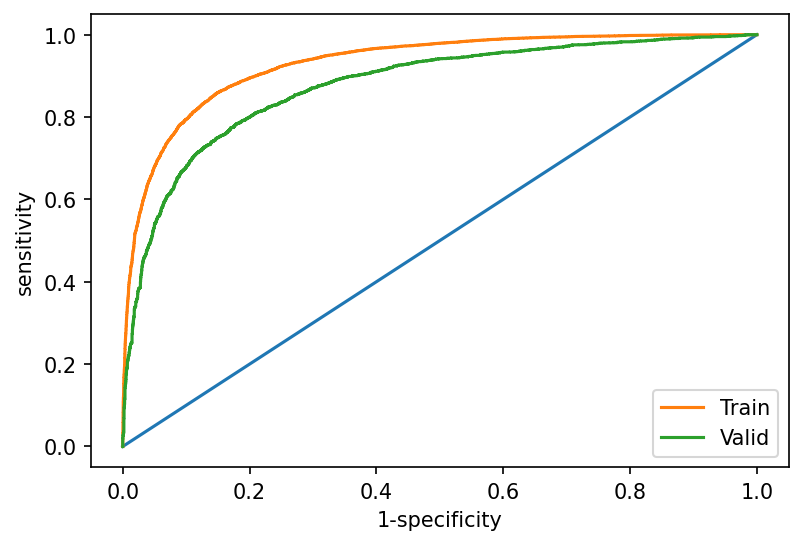

efficientnet-phospho-B-15
Kfold_cv_mean: 0.803286


In [33]:
best_acc_sum = 0
for fold, (tr_idx, val_idx) in enumerate(kf2.split(dfr2)):
    
    print('Fold: {:d}'.format(fold))
    BATCH_SIZE = 128

    train_set = data_utils.TensorDataset(torch.tensor(dfr2[tr_idx]), torch.tensor(dfl2[tr_idx]))
    valid_set = data_utils.TensorDataset(torch.tensor(dfr2[val_idx]),torch.tensor(dfl2[val_idx]))


    train_loader = data_utils.DataLoader(train_set, batch_size=BATCH_SIZE, pin_memory=True, shuffle=True)
    valid_loader = data_utils.DataLoader(valid_set, batch_size=BATCH_SIZE, shuffle=True)


    dataloaders = {'train':train_loader,'valid':valid_loader}
    dataset_sizes = {x: len(dataloaders[x]) for x in ['train', 'valid']}
    
    model = train_model(model, optimizer, scheduler, 50)
    
    plt.figure(dpi = 150)
    plt.plot([0,1],[0,1])
    plt.plot(Trainfprs, Traintprs, label= 'Train')
    plt.plot(Validfprs, Validtprs, label= 'Valid')
    plt.legend()
    plt.xlabel("1-specificity",fontsize =10)
    plt.ylabel("sensitivity",fontsize =10)
    plt.legend(fontsize = 10)
    plt.xlim()
    plt.ylim()
    plt.show()
    best_acc_sum += best_acc
    del model
    allele = 'phospho-B-15'
    model = EfficientNet.from_name(f'efficientnet-{allele}')
    criterion = nn.BCELoss()
    optimizer = RAdam(model.parameters())
    scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=100, gamma=0.1)
    
    save_dir = f'Weight/batch_50_SYTratiodata_randomstate{random_state}/saved_model3/Efficientnet_{fold+1}_kernel_3_ms_only_same_ratio'
    writer = SummaryWriter(save_dir)
    
    if fold == 4:
        print('Kfold_cv_mean: {:2f}'.format(best_acc_sum/(fold+1)))

In [18]:
#batch = 128 #mse계산용
best_acc_sum = 0
for fold, (tr_idx, val_idx) in enumerate(kf2.split(dfr2)):
    
    print('Fold: {:d}'.format(fold))
    BATCH_SIZE = 128

    train_set = data_utils.TensorDataset(torch.tensor(dfr2[tr_idx]), torch.tensor(dfl2[tr_idx]))
    valid_set = data_utils.TensorDataset(torch.tensor(dfr2[val_idx]),torch.tensor(dfl2[val_idx]))


    train_loader = data_utils.DataLoader(train_set, batch_size=BATCH_SIZE, pin_memory=True, shuffle=True)
    valid_loader = data_utils.DataLoader(valid_set, batch_size=BATCH_SIZE, shuffle=True)


    dataloaders = {'train':train_loader,'valid':valid_loader}
    dataset_sizes = {x: len(dataloaders[x]) for x in ['train', 'valid']}
    
    model = train_model(model, optimizer, scheduler, 30)
    
    plt.figure(figsize=[30,30],dpi = 600)
    #plt.plot(Trainfprs, Traintprs, label= 'Train')
    plt.plot(TrainLossdata, label= 'Train', color='lightcoral', linewidth = 4)
    plt.xlabel("epoch",fontsize =40)
    plt.ylabel("MSE",fontsize =40)
    plt.legend(fontsize = 40)
    plt.xlim()
    plt.ylim()
    plt.savefig("High resoltion.png",dpi=600)
    plt.show()
    best_acc_sum += best_acc
    del model
    allele = 'phospho-B-15'
    model = EfficientNet.from_name(f'efficientnet-{allele}')
    criterion = nn.MSELoss()
    optimizer = RAdam(model.parameters())
    scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=50, gamma=0.1)
    
    save_dir = f'saved_model2/Efficientnet_{fold+1}_kernel_3_ms_only_same_ratio'
    writer = SummaryWriter(save_dir)
    
    if fold == 4:
        print('Kfold_cv_mean: {:2f}'.format(best_acc_sum/(fold+1)))

Fold: 0
Training on  4 GPUs!


  0%|          | 0/30 [00:00<?, ?it/s]

------------------------------------------------------------
Epoch 1/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.1415 Acc: 0.8059 F1: 0.6789 Recall: 0.7028 AUC: 0.8058


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.3369 Acc: 0.5010 F1: 0.2873 recall: 0.1989 AUC: 0.9215
------------------------------------------------------------

------------------------------------------------------------
Epoch 2/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0363 Acc: 0.9658 F1: 0.8777 Recall: 0.8899 AUC: 0.9658


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.2852 Acc: 0.5894 F1: 0.4315 recall: 0.2818 AUC: 0.9974
------------------------------------------------------------

------------------------------------------------------------
Epoch 3/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0145 Acc: 0.9865 F1: 0.9411 Recall: 0.9516 AUC: 0.9865


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0186 Acc: 0.9759 F1: 0.9445 recall: 0.9175 AUC: 0.9996
------------------------------------------------------------

------------------------------------------------------------
Epoch 4/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0085 Acc: 0.9913 F1: 0.9625 Recall: 0.9721 AUC: 0.9913


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0059 Acc: 0.9933 F1: 0.9748 recall: 0.9758 AUC: 0.9998
------------------------------------------------------------

------------------------------------------------------------
Epoch 5/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0062 Acc: 0.9935 F1: 0.9715 Recall: 0.9806 AUC: 0.9935


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0038 Acc: 0.9951 F1: 0.9808 recall: 0.9854 AUC: 0.9999
------------------------------------------------------------

------------------------------------------------------------
Epoch 6/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0047 Acc: 0.9950 F1: 0.9777 Recall: 0.9856 AUC: 0.9950


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0027 Acc: 0.9968 F1: 0.9836 recall: 0.9901 AUC: 0.9999
------------------------------------------------------------

------------------------------------------------------------
Epoch 7/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0035 Acc: 0.9963 F1: 0.9822 Recall: 0.9890 AUC: 0.9963


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0022 Acc: 0.9973 F1: 0.9869 recall: 0.9917 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 8/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0029 Acc: 0.9971 F1: 0.9846 Recall: 0.9912 AUC: 0.9971


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0019 Acc: 0.9982 F1: 0.9895 recall: 0.9926 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 9/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0024 Acc: 0.9976 F1: 0.9867 Recall: 0.9928 AUC: 0.9976


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0014 Acc: 0.9987 F1: 0.9900 recall: 0.9948 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 10/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0020 Acc: 0.9980 F1: 0.9885 Recall: 0.9940 AUC: 0.9980


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0014 Acc: 0.9985 F1: 0.9926 recall: 0.9944 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 11/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0016 Acc: 0.9984 F1: 0.9898 Recall: 0.9951 AUC: 0.9984


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0012 Acc: 0.9987 F1: 0.9930 recall: 0.9949 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 12/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0016 Acc: 0.9982 F1: 0.9903 Recall: 0.9954 AUC: 0.9982


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0008 Acc: 0.9990 F1: 0.9926 recall: 0.9971 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 13/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0012 Acc: 0.9988 F1: 0.9917 Recall: 0.9962 AUC: 0.9988


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0008 Acc: 0.9990 F1: 0.9922 recall: 0.9974 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 14/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0012 Acc: 0.9989 F1: 0.9921 Recall: 0.9966 AUC: 0.9989


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0008 Acc: 0.9990 F1: 0.9946 recall: 0.9966 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 15/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0010 Acc: 0.9989 F1: 0.9924 Recall: 0.9971 AUC: 0.9989


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0006 Acc: 0.9992 F1: 0.9950 recall: 0.9976 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 16/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0008 Acc: 0.9992 F1: 0.9939 Recall: 0.9975 AUC: 0.9992


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0006 Acc: 0.9990 F1: 0.9954 recall: 0.9977 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 17/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0007 Acc: 0.9993 F1: 0.9942 Recall: 0.9978 AUC: 0.9993


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0006 Acc: 0.9991 F1: 0.9952 recall: 0.9979 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 18/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0006 Acc: 0.9994 F1: 0.9946 Recall: 0.9980 AUC: 0.9994


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0005 Acc: 0.9992 F1: 0.9963 recall: 0.9978 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 19/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0005 Acc: 0.9996 F1: 0.9954 Recall: 0.9983 AUC: 0.9996


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0005 Acc: 0.9992 F1: 0.9962 recall: 0.9982 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 20/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0006 Acc: 0.9995 F1: 0.9948 Recall: 0.9983 AUC: 0.9995


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0004 Acc: 0.9997 F1: 0.9952 recall: 0.9987 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 21/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0005 Acc: 0.9996 F1: 0.9957 Recall: 0.9986 AUC: 0.9996


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0004 Acc: 0.9994 F1: 0.9974 recall: 0.9984 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 22/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0004 Acc: 0.9996 F1: 0.9959 Recall: 0.9986 AUC: 0.9996


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0006 Acc: 0.9989 F1: 0.9971 recall: 0.9980 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 23/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0004 Acc: 0.9997 F1: 0.9963 Recall: 0.9989 AUC: 0.9997


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0005 Acc: 0.9992 F1: 0.9975 recall: 0.9982 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 24/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0003 Acc: 0.9997 F1: 0.9967 Recall: 0.9989 AUC: 0.9997


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0003 Acc: 0.9999 F1: 0.9968 recall: 0.9987 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 25/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0003 Acc: 0.9998 F1: 0.9972 Recall: 0.9991 AUC: 0.9998


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0004 Acc: 0.9994 F1: 0.9975 recall: 0.9986 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 26/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0003 Acc: 0.9997 F1: 0.9971 Recall: 0.9991 AUC: 0.9997


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0004 Acc: 0.9993 F1: 0.9977 recall: 0.9985 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 27/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0003 Acc: 0.9998 F1: 0.9971 Recall: 0.9991 AUC: 0.9998


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0005 Acc: 0.9994 F1: 0.9978 recall: 0.9984 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 28/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0003 Acc: 0.9998 F1: 0.9975 Recall: 0.9992 AUC: 0.9998


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0003 Acc: 0.9997 F1: 0.9974 recall: 0.9988 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 29/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0002 Acc: 0.9998 F1: 0.9978 Recall: 0.9993 AUC: 0.9998


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0003 Acc: 0.9997 F1: 0.9981 recall: 0.9988 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 30/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0002 Acc: 0.9998 F1: 0.9980 Recall: 0.9993 AUC: 0.9998


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0003 Acc: 0.9997 F1: 0.9982 recall: 0.9988 AUC: 1.0000
------------------------------------------------------------

Training complete in 3m 54s
Best val Loss: 0.000288
Best val Acc: 0.999860


efficientnet-phospho-B-15
Fold: 1
Training on  4 GPUs!


  0%|          | 0/30 [00:00<?, ?it/s]

------------------------------------------------------------
Epoch 1/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.1408 Acc: 0.8206 F1: 0.6674 Recall: 0.6792 AUC: 0.8202


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.4197 Acc: 0.4985 F1: 0.1518 recall: 0.0890 AUC: 0.8360
------------------------------------------------------------

------------------------------------------------------------
Epoch 2/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0296 Acc: 0.9742 F1: 0.8897 Recall: 0.9010 AUC: 0.9742


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.4111 Acc: 0.5072 F1: 0.1820 recall: 0.1012 AUC: 0.9831
------------------------------------------------------------

------------------------------------------------------------
Epoch 3/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0112 Acc: 0.9899 F1: 0.9484 Recall: 0.9597 AUC: 0.9899


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0178 Acc: 0.9767 F1: 0.9488 recall: 0.9209 AUC: 0.9995
------------------------------------------------------------

------------------------------------------------------------
Epoch 4/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0065 Acc: 0.9931 F1: 0.9680 Recall: 0.9768 AUC: 0.9931


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0044 Acc: 0.9953 F1: 0.9769 recall: 0.9802 AUC: 0.9997
------------------------------------------------------------

------------------------------------------------------------
Epoch 5/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0045 Acc: 0.9957 F1: 0.9762 Recall: 0.9848 AUC: 0.9957


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0026 Acc: 0.9972 F1: 0.9838 recall: 0.9885 AUC: 0.9997
------------------------------------------------------------

------------------------------------------------------------
Epoch 6/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0033 Acc: 0.9965 F1: 0.9825 Recall: 0.9893 AUC: 0.9965


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0023 Acc: 0.9973 F1: 0.9881 recall: 0.9897 AUC: 0.9997
------------------------------------------------------------

------------------------------------------------------------
Epoch 7/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0030 Acc: 0.9967 F1: 0.9851 Recall: 0.9912 AUC: 0.9967


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0017 Acc: 0.9979 F1: 0.9911 recall: 0.9922 AUC: 0.9997
------------------------------------------------------------

------------------------------------------------------------
Epoch 8/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0025 Acc: 0.9971 F1: 0.9877 Recall: 0.9926 AUC: 0.9971


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0012 Acc: 0.9983 F1: 0.9926 recall: 0.9943 AUC: 0.9998
------------------------------------------------------------

------------------------------------------------------------
Epoch 9/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0017 Acc: 0.9985 F1: 0.9899 Recall: 0.9946 AUC: 0.9985


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0010 Acc: 0.9986 F1: 0.9937 recall: 0.9954 AUC: 0.9998
------------------------------------------------------------

------------------------------------------------------------
Epoch 10/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0014 Acc: 0.9984 F1: 0.9904 Recall: 0.9955 AUC: 0.9984


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0008 Acc: 0.9990 F1: 0.9948 recall: 0.9965 AUC: 0.9998
------------------------------------------------------------

------------------------------------------------------------
Epoch 11/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0014 Acc: 0.9985 F1: 0.9915 Recall: 0.9959 AUC: 0.9985


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0007 Acc: 0.9993 F1: 0.9950 recall: 0.9971 AUC: 0.9998
------------------------------------------------------------

------------------------------------------------------------
Epoch 12/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0011 Acc: 0.9989 F1: 0.9928 Recall: 0.9968 AUC: 0.9989


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0007 Acc: 0.9990 F1: 0.9959 recall: 0.9970 AUC: 0.9998
------------------------------------------------------------

------------------------------------------------------------
Epoch 13/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0009 Acc: 0.9991 F1: 0.9940 Recall: 0.9972 AUC: 0.9991


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0006 Acc: 0.9993 F1: 0.9966 recall: 0.9973 AUC: 0.9998
------------------------------------------------------------

------------------------------------------------------------
Epoch 14/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0010 Acc: 0.9989 F1: 0.9940 Recall: 0.9972 AUC: 0.9989


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0005 Acc: 0.9994 F1: 0.9962 recall: 0.9980 AUC: 0.9998
------------------------------------------------------------

------------------------------------------------------------
Epoch 15/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0007 Acc: 0.9994 F1: 0.9948 Recall: 0.9980 AUC: 0.9994


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0004 Acc: 0.9996 F1: 0.9972 recall: 0.9982 AUC: 0.9999
------------------------------------------------------------

------------------------------------------------------------
Epoch 16/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0008 Acc: 0.9992 F1: 0.9952 Recall: 0.9979 AUC: 0.9992


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0003 Acc: 0.9997 F1: 0.9961 recall: 0.9987 AUC: 0.9999
------------------------------------------------------------

------------------------------------------------------------
Epoch 17/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0007 Acc: 0.9994 F1: 0.9953 Recall: 0.9981 AUC: 0.9994


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0004 Acc: 0.9997 F1: 0.9973 recall: 0.9986 AUC: 0.9999
------------------------------------------------------------

------------------------------------------------------------
Epoch 18/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0006 Acc: 0.9994 F1: 0.9960 Recall: 0.9984 AUC: 0.9994


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0004 Acc: 0.9997 F1: 0.9979 recall: 0.9985 AUC: 0.9999
------------------------------------------------------------

------------------------------------------------------------
Epoch 19/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0005 Acc: 0.9995 F1: 0.9962 Recall: 0.9985 AUC: 0.9995


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0004 Acc: 0.9997 F1: 0.9979 recall: 0.9986 AUC: 0.9998
------------------------------------------------------------

------------------------------------------------------------
Epoch 20/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0005 Acc: 0.9995 F1: 0.9965 Recall: 0.9987 AUC: 0.9995


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0003 Acc: 0.9997 F1: 0.9969 recall: 0.9991 AUC: 0.9999
------------------------------------------------------------

------------------------------------------------------------
Epoch 21/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0004 Acc: 0.9996 F1: 0.9964 Recall: 0.9988 AUC: 0.9996


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0003 Acc: 0.9997 F1: 0.9977 recall: 0.9991 AUC: 0.9999
------------------------------------------------------------

------------------------------------------------------------
Epoch 22/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0004 Acc: 0.9996 F1: 0.9966 Recall: 0.9989 AUC: 0.9996


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0002 Acc: 0.9997 F1: 0.9978 recall: 0.9991 AUC: 0.9999
------------------------------------------------------------

------------------------------------------------------------
Epoch 23/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0003 Acc: 0.9997 F1: 0.9972 Recall: 0.9990 AUC: 0.9997


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0002 Acc: 0.9997 F1: 0.9982 recall: 0.9991 AUC: 0.9999
------------------------------------------------------------

------------------------------------------------------------
Epoch 24/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0003 Acc: 0.9996 F1: 0.9970 Recall: 0.9990 AUC: 0.9996


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0002 Acc: 0.9999 F1: 0.9970 recall: 0.9993 AUC: 0.9999
------------------------------------------------------------

------------------------------------------------------------
Epoch 25/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0003 Acc: 0.9998 F1: 0.9969 Recall: 0.9992 AUC: 0.9998


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0002 Acc: 0.9999 F1: 0.9985 recall: 0.9992 AUC: 0.9999
------------------------------------------------------------

------------------------------------------------------------
Epoch 26/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0003 Acc: 0.9997 F1: 0.9971 Recall: 0.9992 AUC: 0.9997


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0002 Acc: 0.9999 F1: 0.9983 recall: 0.9993 AUC: 0.9999
------------------------------------------------------------

------------------------------------------------------------
Epoch 27/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0003 Acc: 0.9997 F1: 0.9972 Recall: 0.9993 AUC: 0.9997


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0002 Acc: 0.9999 F1: 0.9985 recall: 0.9995 AUC: 0.9999
------------------------------------------------------------

------------------------------------------------------------
Epoch 28/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0002 Acc: 0.9998 F1: 0.9980 Recall: 0.9995 AUC: 0.9998


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0002 Acc: 0.9999 F1: 0.9988 recall: 0.9994 AUC: 0.9999
------------------------------------------------------------

------------------------------------------------------------
Epoch 29/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0002 Acc: 0.9998 F1: 0.9979 Recall: 0.9993 AUC: 0.9998


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0002 Acc: 0.9999 F1: 0.9988 recall: 0.9993 AUC: 0.9999
------------------------------------------------------------

------------------------------------------------------------
Epoch 30/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0002 Acc: 0.9998 F1: 0.9979 Recall: 0.9994 AUC: 0.9998


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0002 Acc: 0.9999 F1: 0.9987 recall: 0.9994 AUC: 0.9999
------------------------------------------------------------

Training complete in 3m 49s
Best val Loss: 0.000160
Best val Acc: 0.999860


efficientnet-phospho-B-15
Fold: 2
Training on  4 GPUs!


  0%|          | 0/30 [00:00<?, ?it/s]

------------------------------------------------------------
Epoch 1/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.1724 Acc: 0.7483 F1: 0.6301 Recall: 0.6482 AUC: 0.7478


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.3402 Acc: 0.5087 F1: 0.2730 recall: 0.1867 AUC: 0.8978
------------------------------------------------------------

------------------------------------------------------------
Epoch 2/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0507 Acc: 0.9532 F1: 0.8400 Recall: 0.8528 AUC: 0.9533


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.3488 Acc: 0.5367 F1: 0.2876 recall: 0.1708 AUC: 0.9979
------------------------------------------------------------

------------------------------------------------------------
Epoch 3/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0176 Acc: 0.9835 F1: 0.9298 Recall: 0.9423 AUC: 0.9836


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0233 Acc: 0.9680 F1: 0.9341 recall: 0.8956 AUC: 0.9993
------------------------------------------------------------

------------------------------------------------------------
Epoch 4/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0113 Acc: 0.9891 F1: 0.9549 Recall: 0.9657 AUC: 0.9892


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0067 Acc: 0.9926 F1: 0.9727 recall: 0.9666 AUC: 0.9995
------------------------------------------------------------

------------------------------------------------------------
Epoch 5/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0077 Acc: 0.9920 F1: 0.9675 Recall: 0.9761 AUC: 0.9920


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0039 Acc: 0.9951 F1: 0.9821 recall: 0.9818 AUC: 0.9997
------------------------------------------------------------

------------------------------------------------------------
Epoch 6/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0063 Acc: 0.9939 F1: 0.9740 Recall: 0.9818 AUC: 0.9939


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0038 Acc: 0.9948 F1: 0.9872 recall: 0.9830 AUC: 0.9997
------------------------------------------------------------

------------------------------------------------------------
Epoch 7/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0050 Acc: 0.9948 F1: 0.9787 Recall: 0.9846 AUC: 0.9948


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0023 Acc: 0.9975 F1: 0.9876 recall: 0.9899 AUC: 0.9998
------------------------------------------------------------

------------------------------------------------------------
Epoch 8/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0040 Acc: 0.9961 F1: 0.9821 Recall: 0.9883 AUC: 0.9961


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0022 Acc: 0.9970 F1: 0.9904 recall: 0.9903 AUC: 0.9998
------------------------------------------------------------

------------------------------------------------------------
Epoch 9/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0033 Acc: 0.9968 F1: 0.9843 Recall: 0.9901 AUC: 0.9968


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0013 Acc: 0.9987 F1: 0.9905 recall: 0.9950 AUC: 0.9998
------------------------------------------------------------

------------------------------------------------------------
Epoch 10/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0026 Acc: 0.9973 F1: 0.9869 Recall: 0.9920 AUC: 0.9973


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0012 Acc: 0.9987 F1: 0.9923 recall: 0.9949 AUC: 0.9999
------------------------------------------------------------

------------------------------------------------------------
Epoch 11/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0024 Acc: 0.9977 F1: 0.9881 Recall: 0.9929 AUC: 0.9977


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0012 Acc: 0.9987 F1: 0.9941 recall: 0.9949 AUC: 0.9999
------------------------------------------------------------

------------------------------------------------------------
Epoch 12/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0021 Acc: 0.9978 F1: 0.9896 Recall: 0.9935 AUC: 0.9978


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0009 Acc: 0.9992 F1: 0.9939 recall: 0.9960 AUC: 0.9999
------------------------------------------------------------

------------------------------------------------------------
Epoch 13/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0018 Acc: 0.9982 F1: 0.9902 Recall: 0.9947 AUC: 0.9982


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0009 Acc: 0.9989 F1: 0.9949 recall: 0.9963 AUC: 0.9999
------------------------------------------------------------

------------------------------------------------------------
Epoch 14/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0015 Acc: 0.9985 F1: 0.9918 Recall: 0.9953 AUC: 0.9985


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0006 Acc: 0.9993 F1: 0.9950 recall: 0.9975 AUC: 0.9999
------------------------------------------------------------

------------------------------------------------------------
Epoch 15/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0017 Acc: 0.9979 F1: 0.9917 Recall: 0.9953 AUC: 0.9979


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0010 Acc: 0.9989 F1: 0.9963 recall: 0.9956 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 16/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0014 Acc: 0.9985 F1: 0.9925 Recall: 0.9958 AUC: 0.9985


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0006 Acc: 0.9990 F1: 0.9960 recall: 0.9975 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 17/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0012 Acc: 0.9989 F1: 0.9930 Recall: 0.9963 AUC: 0.9989


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0005 Acc: 0.9992 F1: 0.9960 recall: 0.9977 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 18/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0011 Acc: 0.9988 F1: 0.9933 Recall: 0.9967 AUC: 0.9988


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0005 Acc: 0.9994 F1: 0.9965 recall: 0.9979 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 19/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0009 Acc: 0.9992 F1: 0.9941 Recall: 0.9972 AUC: 0.9992


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0004 Acc: 0.9996 F1: 0.9964 recall: 0.9984 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 20/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0008 Acc: 0.9993 F1: 0.9949 Recall: 0.9975 AUC: 0.9993


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0004 Acc: 0.9994 F1: 0.9968 recall: 0.9982 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 21/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0007 Acc: 0.9994 F1: 0.9951 Recall: 0.9978 AUC: 0.9994


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0004 Acc: 0.9993 F1: 0.9975 recall: 0.9982 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 22/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0006 Acc: 0.9994 F1: 0.9957 Recall: 0.9979 AUC: 0.9994


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0004 Acc: 0.9994 F1: 0.9973 recall: 0.9985 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 23/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0005 Acc: 0.9996 F1: 0.9955 Recall: 0.9983 AUC: 0.9996


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0003 Acc: 0.9997 F1: 0.9969 recall: 0.9989 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 24/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0007 Acc: 0.9993 F1: 0.9958 Recall: 0.9979 AUC: 0.9993


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0003 Acc: 0.9994 F1: 0.9979 recall: 0.9987 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 25/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0005 Acc: 0.9995 F1: 0.9965 Recall: 0.9985 AUC: 0.9995


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0004 Acc: 0.9994 F1: 0.9981 recall: 0.9982 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 26/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0005 Acc: 0.9995 F1: 0.9962 Recall: 0.9984 AUC: 0.9995


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0003 Acc: 0.9994 F1: 0.9981 recall: 0.9988 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 27/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0004 Acc: 0.9996 F1: 0.9970 Recall: 0.9986 AUC: 0.9996


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0003 Acc: 0.9994 F1: 0.9982 recall: 0.9988 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 28/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0004 Acc: 0.9996 F1: 0.9969 Recall: 0.9986 AUC: 0.9996


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0002 Acc: 0.9999 F1: 0.9980 recall: 0.9990 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 29/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0003 Acc: 0.9997 F1: 0.9974 Recall: 0.9989 AUC: 0.9997


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0003 Acc: 0.9994 F1: 0.9986 recall: 0.9988 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 30/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0003 Acc: 0.9998 F1: 0.9977 Recall: 0.9990 AUC: 0.9998


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0002 Acc: 0.9996 F1: 0.9981 recall: 0.9990 AUC: 1.0000
------------------------------------------------------------

Training complete in 3m 55s
Best val Loss: 0.000248
Best val Acc: 0.999860


efficientnet-phospho-B-15
Fold: 3
Training on  4 GPUs!


  0%|          | 0/30 [00:00<?, ?it/s]

------------------------------------------------------------
Epoch 1/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.1638 Acc: 0.7777 F1: 0.6362 Recall: 0.6615 AUC: 0.7774


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.3193 Acc: 0.4944 F1: 0.3249 recall: 0.2368 AUC: 0.9032
------------------------------------------------------------

------------------------------------------------------------
Epoch 2/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0287 Acc: 0.9795 F1: 0.8856 Recall: 0.9020 AUC: 0.9794


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.3716 Acc: 0.5111 F1: 0.2633 recall: 0.1539 AUC: 0.9982
------------------------------------------------------------

------------------------------------------------------------
Epoch 3/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0108 Acc: 0.9911 F1: 0.9473 Recall: 0.9611 AUC: 0.9911


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0211 Acc: 0.9736 F1: 0.9428 recall: 0.9058 AUC: 0.9995
------------------------------------------------------------

------------------------------------------------------------
Epoch 4/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0066 Acc: 0.9937 F1: 0.9662 Recall: 0.9768 AUC: 0.9937


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0062 Acc: 0.9925 F1: 0.9784 recall: 0.9736 AUC: 0.9997
------------------------------------------------------------

------------------------------------------------------------
Epoch 5/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0043 Acc: 0.9960 F1: 0.9753 Recall: 0.9852 AUC: 0.9960


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0040 Acc: 0.9950 F1: 0.9851 recall: 0.9838 AUC: 0.9998
------------------------------------------------------------

------------------------------------------------------------
Epoch 6/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0030 Acc: 0.9972 F1: 0.9804 Recall: 0.9892 AUC: 0.9972


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0029 Acc: 0.9967 F1: 0.9884 recall: 0.9884 AUC: 0.9999
------------------------------------------------------------

------------------------------------------------------------
Epoch 7/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0025 Acc: 0.9974 F1: 0.9838 Recall: 0.9915 AUC: 0.9974


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0025 Acc: 0.9971 F1: 0.9908 recall: 0.9905 AUC: 0.9999
------------------------------------------------------------

------------------------------------------------------------
Epoch 8/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0019 Acc: 0.9983 F1: 0.9871 Recall: 0.9933 AUC: 0.9983


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0021 Acc: 0.9976 F1: 0.9919 recall: 0.9924 AUC: 0.9999
------------------------------------------------------------

------------------------------------------------------------
Epoch 9/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0015 Acc: 0.9985 F1: 0.9887 Recall: 0.9948 AUC: 0.9985


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0017 Acc: 0.9980 F1: 0.9924 recall: 0.9945 AUC: 0.9999
------------------------------------------------------------

------------------------------------------------------------
Epoch 10/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0012 Acc: 0.9989 F1: 0.9908 Recall: 0.9957 AUC: 0.9989


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0015 Acc: 0.9980 F1: 0.9934 recall: 0.9951 AUC: 0.9999
------------------------------------------------------------

------------------------------------------------------------
Epoch 11/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0009 Acc: 0.9992 F1: 0.9916 Recall: 0.9965 AUC: 0.9992


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0014 Acc: 0.9982 F1: 0.9941 recall: 0.9958 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 12/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0008 Acc: 0.9990 F1: 0.9930 Recall: 0.9970 AUC: 0.9990


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0014 Acc: 0.9982 F1: 0.9949 recall: 0.9956 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 13/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0007 Acc: 0.9994 F1: 0.9936 Recall: 0.9975 AUC: 0.9994


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0013 Acc: 0.9982 F1: 0.9952 recall: 0.9961 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 14/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0006 Acc: 0.9994 F1: 0.9942 Recall: 0.9978 AUC: 0.9994


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0012 Acc: 0.9982 F1: 0.9959 recall: 0.9964 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 15/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0005 Acc: 0.9996 F1: 0.9947 Recall: 0.9981 AUC: 0.9996


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0011 Acc: 0.9983 F1: 0.9965 recall: 0.9969 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 16/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0005 Acc: 0.9995 F1: 0.9951 Recall: 0.9983 AUC: 0.9995


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0011 Acc: 0.9985 F1: 0.9962 recall: 0.9965 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 17/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0004 Acc: 0.9996 F1: 0.9955 Recall: 0.9986 AUC: 0.9996


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0009 Acc: 0.9988 F1: 0.9959 recall: 0.9974 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 18/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0004 Acc: 0.9996 F1: 0.9956 Recall: 0.9986 AUC: 0.9996


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0008 Acc: 0.9989 F1: 0.9966 recall: 0.9976 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 19/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0004 Acc: 0.9997 F1: 0.9962 Recall: 0.9988 AUC: 0.9997


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0007 Acc: 0.9989 F1: 0.9967 recall: 0.9979 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 20/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0003 Acc: 0.9998 F1: 0.9966 Recall: 0.9989 AUC: 0.9998


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0006 Acc: 0.9989 F1: 0.9970 recall: 0.9980 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 21/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0003 Acc: 0.9997 F1: 0.9967 Recall: 0.9991 AUC: 0.9997


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0006 Acc: 0.9990 F1: 0.9973 recall: 0.9981 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 22/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0003 Acc: 0.9998 F1: 0.9967 Recall: 0.9991 AUC: 0.9998


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0008 Acc: 0.9987 F1: 0.9976 recall: 0.9975 AUC: 0.9999
------------------------------------------------------------

------------------------------------------------------------
Epoch 23/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0002 Acc: 0.9999 F1: 0.9974 Recall: 0.9993 AUC: 0.9999


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0006 Acc: 0.9992 F1: 0.9978 recall: 0.9981 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 24/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0002 Acc: 0.9998 F1: 0.9973 Recall: 0.9993 AUC: 0.9998


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0005 Acc: 0.9992 F1: 0.9975 recall: 0.9983 AUC: 0.9999
------------------------------------------------------------

------------------------------------------------------------
Epoch 25/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0002 Acc: 0.9999 F1: 0.9977 Recall: 0.9994 AUC: 0.9999


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0006 Acc: 0.9990 F1: 0.9982 recall: 0.9982 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 26/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0002 Acc: 0.9999 F1: 0.9977 Recall: 0.9994 AUC: 0.9999


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0005 Acc: 0.9993 F1: 0.9975 recall: 0.9985 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 27/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0002 Acc: 0.9999 F1: 0.9978 Recall: 0.9995 AUC: 0.9999


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0005 Acc: 0.9993 F1: 0.9979 recall: 0.9984 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 28/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0001 Acc: 0.9999 F1: 0.9982 Recall: 0.9995 AUC: 0.9999


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0005 Acc: 0.9993 F1: 0.9983 recall: 0.9984 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 29/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0001 Acc: 0.9999 F1: 0.9984 Recall: 0.9995 AUC: 0.9999


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0005 Acc: 0.9993 F1: 0.9983 recall: 0.9985 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 30/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0001 Acc: 0.9999 F1: 0.9985 Recall: 0.9996 AUC: 0.9999


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0005 Acc: 0.9993 F1: 0.9985 recall: 0.9985 AUC: 1.0000
------------------------------------------------------------

Training complete in 3m 52s
Best val Loss: 0.000477
Best val Acc: 0.999302


efficientnet-phospho-B-15
Fold: 4
Training on  4 GPUs!


  0%|          | 0/30 [00:00<?, ?it/s]

------------------------------------------------------------
Epoch 1/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.1319 Acc: 0.8392 F1: 0.6740 Recall: 0.6772 AUC: 0.8389


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.3013 Acc: 0.4999 F1: 0.3477 recall: 0.2598 AUC: 0.8840
------------------------------------------------------------

------------------------------------------------------------
Epoch 2/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0171 Acc: 0.9889 F1: 0.9197 Recall: 0.9312 AUC: 0.9889


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.3358 Acc: 0.5246 F1: 0.3204 recall: 0.1937 AUC: 0.9971
------------------------------------------------------------

------------------------------------------------------------
Epoch 3/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0074 Acc: 0.9938 F1: 0.9602 Recall: 0.9711 AUC: 0.9938


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0240 Acc: 0.9680 F1: 0.9403 recall: 0.8957 AUC: 0.9997
------------------------------------------------------------

------------------------------------------------------------
Epoch 4/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0049 Acc: 0.9956 F1: 0.9735 Recall: 0.9817 AUC: 0.9956


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0042 Acc: 0.9948 F1: 0.9826 recall: 0.9810 AUC: 0.9998
------------------------------------------------------------

------------------------------------------------------------
Epoch 5/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0034 Acc: 0.9967 F1: 0.9803 Recall: 0.9877 AUC: 0.9967


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0031 Acc: 0.9957 F1: 0.9876 recall: 0.9865 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 6/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0029 Acc: 0.9973 F1: 0.9836 Recall: 0.9904 AUC: 0.9973


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0026 Acc: 0.9964 F1: 0.9902 recall: 0.9884 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 7/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0025 Acc: 0.9973 F1: 0.9864 Recall: 0.9918 AUC: 0.9974


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0022 Acc: 0.9973 F1: 0.9918 recall: 0.9912 AUC: 0.9999
------------------------------------------------------------

------------------------------------------------------------
Epoch 8/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0017 Acc: 0.9985 F1: 0.9885 Recall: 0.9942 AUC: 0.9985


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0019 Acc: 0.9975 F1: 0.9935 recall: 0.9918 AUC: 0.9999
------------------------------------------------------------

------------------------------------------------------------
Epoch 9/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0014 Acc: 0.9986 F1: 0.9907 Recall: 0.9951 AUC: 0.9986


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0011 Acc: 0.9986 F1: 0.9935 recall: 0.9955 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 10/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0014 Acc: 0.9988 F1: 0.9912 Recall: 0.9957 AUC: 0.9988


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0010 Acc: 0.9986 F1: 0.9947 recall: 0.9961 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 11/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0010 Acc: 0.9989 F1: 0.9925 Recall: 0.9966 AUC: 0.9989


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0011 Acc: 0.9985 F1: 0.9936 recall: 0.9964 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 12/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0010 Acc: 0.9990 F1: 0.9933 Recall: 0.9969 AUC: 0.9990


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0008 Acc: 0.9987 F1: 0.9949 recall: 0.9972 AUC: 0.9999
------------------------------------------------------------

------------------------------------------------------------
Epoch 13/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0009 Acc: 0.9991 F1: 0.9939 Recall: 0.9974 AUC: 0.9991


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0008 Acc: 0.9987 F1: 0.9960 recall: 0.9972 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 14/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0008 Acc: 0.9993 F1: 0.9948 Recall: 0.9977 AUC: 0.9993


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0010 Acc: 0.9986 F1: 0.9970 recall: 0.9964 AUC: 0.9999
------------------------------------------------------------

------------------------------------------------------------
Epoch 15/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0013 Acc: 0.9984 F1: 0.9950 Recall: 0.9966 AUC: 0.9984


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0010 Acc: 0.9987 F1: 0.9966 recall: 0.9964 AUC: 0.9999
------------------------------------------------------------

------------------------------------------------------------
Epoch 16/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0007 Acc: 0.9994 F1: 0.9950 Recall: 0.9980 AUC: 0.9994


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0008 Acc: 0.9989 F1: 0.9970 recall: 0.9969 AUC: 0.9999
------------------------------------------------------------

------------------------------------------------------------
Epoch 17/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0006 Acc: 0.9994 F1: 0.9957 Recall: 0.9981 AUC: 0.9994


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0008 Acc: 0.9989 F1: 0.9973 recall: 0.9974 AUC: 0.9999
------------------------------------------------------------

------------------------------------------------------------
Epoch 18/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0006 Acc: 0.9995 F1: 0.9956 Recall: 0.9984 AUC: 0.9995


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0007 Acc: 0.9989 F1: 0.9972 recall: 0.9977 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 19/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0005 Acc: 0.9994 F1: 0.9964 Recall: 0.9983 AUC: 0.9994


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0006 Acc: 0.9989 F1: 0.9973 recall: 0.9980 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 20/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0005 Acc: 0.9996 F1: 0.9963 Recall: 0.9985 AUC: 0.9996


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0005 Acc: 0.9994 F1: 0.9971 recall: 0.9984 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 21/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0003 Acc: 0.9996 F1: 0.9968 Recall: 0.9989 AUC: 0.9996


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0004 Acc: 0.9996 F1: 0.9957 recall: 0.9987 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 22/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0003 Acc: 0.9997 F1: 0.9964 Recall: 0.9990 AUC: 0.9997


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0005 Acc: 0.9993 F1: 0.9978 recall: 0.9982 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 23/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0004 Acc: 0.9997 F1: 0.9973 Recall: 0.9989 AUC: 0.9997


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0004 Acc: 0.9996 F1: 0.9960 recall: 0.9988 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 24/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0003 Acc: 0.9997 F1: 0.9968 Recall: 0.9990 AUC: 0.9997


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0004 Acc: 0.9996 F1: 0.9968 recall: 0.9987 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 25/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0002 Acc: 0.9998 F1: 0.9976 Recall: 0.9991 AUC: 0.9998


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0004 Acc: 0.9994 F1: 0.9981 recall: 0.9985 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 26/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0002 Acc: 0.9999 F1: 0.9978 Recall: 0.9993 AUC: 0.9999


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0005 Acc: 0.9993 F1: 0.9984 recall: 0.9982 AUC: 0.9999
------------------------------------------------------------

------------------------------------------------------------
Epoch 27/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0002 Acc: 0.9998 F1: 0.9980 Recall: 0.9993 AUC: 0.9998


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0004 Acc: 0.9996 F1: 0.9978 recall: 0.9988 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 28/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0002 Acc: 0.9999 F1: 0.9978 Recall: 0.9994 AUC: 0.9999


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0004 Acc: 0.9996 F1: 0.9982 recall: 0.9986 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 29/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0002 Acc: 0.9998 F1: 0.9980 Recall: 0.9993 AUC: 0.9998


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0004 Acc: 0.9996 F1: 0.9984 recall: 0.9986 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 30/30


  0%|          | 0/222 [00:00<?, ?it/s]

train Loss: 0.0002 Acc: 0.9999 F1: 0.9983 Recall: 0.9995 AUC: 0.9999


  0%|          | 0/56 [00:00<?, ?it/s]

validation Loss: 0.0003 Acc: 0.9996 F1: 0.9984 recall: 0.9988 AUC: 0.9999
------------------------------------------------------------

Training complete in 3m 54s
Best val Loss: 0.000348
Best val Acc: 0.999581


efficientnet-phospho-B-15
Kfold_cv_mean: 0.999693


In [34]:
#batch_size=256인경우
save_dir = f'Weight/batch_50_SYTratiodata_randomstate{random_state}/saved_model4/Efficientnet_0_kernel_3_ms_only_same_ratio'
writer = SummaryWriter(save_dir)

Fold: 0
Training on  4 GPUs!


  0%|          | 0/50 [00:00<?, ?it/s]

------------------------------------------------------------
Epoch 1/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.6887 Acc: 0.5488 Recall: 0.5493 AUC: 0.5667


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.6921 Acc: 0.5073 recall: 0.9924 AUC: 0.6776
------------------------------------------------------------

------------------------------------------------------------
Epoch 2/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.6367 Acc: 0.6517 Recall: 0.6424 AUC: 0.7057


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.6818 Acc: 0.6555 recall: 0.8301 AUC: 0.7541
------------------------------------------------------------

------------------------------------------------------------
Epoch 3/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.5914 Acc: 0.7124 Recall: 0.6787 AUC: 0.7674


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.6446 Acc: 0.7240 recall: 0.7568 AUC: 0.7841
------------------------------------------------------------

------------------------------------------------------------
Epoch 4/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.5586 Acc: 0.7381 Recall: 0.7023 AUC: 0.7946


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.5875 Acc: 0.7466 recall: 0.7353 AUC: 0.8013
------------------------------------------------------------

------------------------------------------------------------
Epoch 5/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.5349 Acc: 0.7510 Recall: 0.7176 AUC: 0.8128


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.5453 Acc: 0.7550 recall: 0.7058 AUC: 0.8145
------------------------------------------------------------

------------------------------------------------------------
Epoch 6/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.5177 Acc: 0.7615 Recall: 0.7327 AUC: 0.8254


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.5225 Acc: 0.7603 recall: 0.7412 AUC: 0.8252
------------------------------------------------------------

------------------------------------------------------------
Epoch 7/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.5033 Acc: 0.7682 Recall: 0.7416 AUC: 0.8360


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.5090 Acc: 0.7660 recall: 0.7466 AUC: 0.8324
------------------------------------------------------------

------------------------------------------------------------
Epoch 8/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.4898 Acc: 0.7766 Recall: 0.7529 AUC: 0.8468


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.5001 Acc: 0.7711 recall: 0.7559 AUC: 0.8389
------------------------------------------------------------

------------------------------------------------------------
Epoch 9/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.4794 Acc: 0.7830 Recall: 0.7630 AUC: 0.8546


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4934 Acc: 0.7738 recall: 0.7378 AUC: 0.8435
------------------------------------------------------------

------------------------------------------------------------
Epoch 10/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.4697 Acc: 0.7880 Recall: 0.7690 AUC: 0.8610


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4866 Acc: 0.7783 recall: 0.7658 AUC: 0.8478
------------------------------------------------------------

------------------------------------------------------------
Epoch 11/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.4620 Acc: 0.7914 Recall: 0.7757 AUC: 0.8658


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4820 Acc: 0.7804 recall: 0.7579 AUC: 0.8515
------------------------------------------------------------

------------------------------------------------------------
Epoch 12/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.4539 Acc: 0.7948 Recall: 0.7785 AUC: 0.8713


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4783 Acc: 0.7809 recall: 0.7538 AUC: 0.8539
------------------------------------------------------------

------------------------------------------------------------
Epoch 13/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.4472 Acc: 0.7987 Recall: 0.7821 AUC: 0.8752


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4737 Acc: 0.7869 recall: 0.7928 AUC: 0.8570
------------------------------------------------------------

------------------------------------------------------------
Epoch 14/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.4401 Acc: 0.8043 Recall: 0.7918 AUC: 0.8796


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4706 Acc: 0.7879 recall: 0.7817 AUC: 0.8585
------------------------------------------------------------

------------------------------------------------------------
Epoch 15/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.4336 Acc: 0.8077 Recall: 0.7943 AUC: 0.8834


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4683 Acc: 0.7897 recall: 0.7849 AUC: 0.8601
------------------------------------------------------------

------------------------------------------------------------
Epoch 16/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.4295 Acc: 0.8101 Recall: 0.7967 AUC: 0.8855


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4661 Acc: 0.7911 recall: 0.7973 AUC: 0.8619
------------------------------------------------------------

------------------------------------------------------------
Epoch 17/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.4244 Acc: 0.8114 Recall: 0.7997 AUC: 0.8883


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4641 Acc: 0.7900 recall: 0.7884 AUC: 0.8629
------------------------------------------------------------

------------------------------------------------------------
Epoch 18/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.4207 Acc: 0.8148 Recall: 0.8042 AUC: 0.8906


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4626 Acc: 0.7909 recall: 0.7833 AUC: 0.8639
------------------------------------------------------------

------------------------------------------------------------
Epoch 19/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.4170 Acc: 0.8172 Recall: 0.8051 AUC: 0.8925


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4629 Acc: 0.7891 recall: 0.8039 AUC: 0.8646
------------------------------------------------------------

------------------------------------------------------------
Epoch 20/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.4102 Acc: 0.8186 Recall: 0.8115 AUC: 0.8965


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4595 Acc: 0.7927 recall: 0.7759 AUC: 0.8660
------------------------------------------------------------

------------------------------------------------------------
Epoch 21/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.4074 Acc: 0.8197 Recall: 0.8072 AUC: 0.8979


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4585 Acc: 0.7924 recall: 0.7783 AUC: 0.8665
------------------------------------------------------------

------------------------------------------------------------
Epoch 22/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.4057 Acc: 0.8226 Recall: 0.8126 AUC: 0.8985


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4580 Acc: 0.7920 recall: 0.7895 AUC: 0.8670
------------------------------------------------------------

------------------------------------------------------------
Epoch 23/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.4011 Acc: 0.8239 Recall: 0.8138 AUC: 0.9013


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4577 Acc: 0.7941 recall: 0.8024 AUC: 0.8675
------------------------------------------------------------

------------------------------------------------------------
Epoch 24/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3982 Acc: 0.8243 Recall: 0.8148 AUC: 0.9026


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4604 Acc: 0.7948 recall: 0.8232 AUC: 0.8677
------------------------------------------------------------

------------------------------------------------------------
Epoch 25/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3932 Acc: 0.8281 Recall: 0.8204 AUC: 0.9052


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4556 Acc: 0.7941 recall: 0.7847 AUC: 0.8688
------------------------------------------------------------

------------------------------------------------------------
Epoch 26/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3930 Acc: 0.8284 Recall: 0.8187 AUC: 0.9053


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4573 Acc: 0.7951 recall: 0.7628 AUC: 0.8690
------------------------------------------------------------

------------------------------------------------------------
Epoch 27/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3878 Acc: 0.8300 Recall: 0.8199 AUC: 0.9078


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4567 Acc: 0.7948 recall: 0.8038 AUC: 0.8687
------------------------------------------------------------

------------------------------------------------------------
Epoch 28/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3877 Acc: 0.8304 Recall: 0.8214 AUC: 0.9077


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4553 Acc: 0.7947 recall: 0.7764 AUC: 0.8698
------------------------------------------------------------

------------------------------------------------------------
Epoch 29/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3844 Acc: 0.8332 Recall: 0.8262 AUC: 0.9096


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4548 Acc: 0.7929 recall: 0.7872 AUC: 0.8698
------------------------------------------------------------

------------------------------------------------------------
Epoch 30/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3822 Acc: 0.8318 Recall: 0.8235 AUC: 0.9107


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4563 Acc: 0.7915 recall: 0.7826 AUC: 0.8692
------------------------------------------------------------

------------------------------------------------------------
Epoch 31/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3795 Acc: 0.8344 Recall: 0.8255 AUC: 0.9119


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4556 Acc: 0.7948 recall: 0.7885 AUC: 0.8695
------------------------------------------------------------

------------------------------------------------------------
Epoch 32/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3774 Acc: 0.8365 Recall: 0.8305 AUC: 0.9130


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4553 Acc: 0.7908 recall: 0.7802 AUC: 0.8700
------------------------------------------------------------

------------------------------------------------------------
Epoch 33/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3757 Acc: 0.8367 Recall: 0.8298 AUC: 0.9136


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4552 Acc: 0.7956 recall: 0.7771 AUC: 0.8704
------------------------------------------------------------

------------------------------------------------------------
Epoch 34/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3728 Acc: 0.8391 Recall: 0.8306 AUC: 0.9151


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4557 Acc: 0.7953 recall: 0.8009 AUC: 0.8704
------------------------------------------------------------

------------------------------------------------------------
Epoch 35/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3716 Acc: 0.8396 Recall: 0.8308 AUC: 0.9158


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4576 Acc: 0.7952 recall: 0.8221 AUC: 0.8708
------------------------------------------------------------

------------------------------------------------------------
Epoch 36/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3686 Acc: 0.8410 Recall: 0.8358 AUC: 0.9172


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4555 Acc: 0.7969 recall: 0.7837 AUC: 0.8710
------------------------------------------------------------

------------------------------------------------------------
Epoch 37/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3679 Acc: 0.8388 Recall: 0.8303 AUC: 0.9174


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4553 Acc: 0.7942 recall: 0.8070 AUC: 0.8711
------------------------------------------------------------

------------------------------------------------------------
Epoch 38/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3660 Acc: 0.8417 Recall: 0.8358 AUC: 0.9183


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4572 Acc: 0.7950 recall: 0.8194 AUC: 0.8713
------------------------------------------------------------

------------------------------------------------------------
Epoch 39/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3660 Acc: 0.8427 Recall: 0.8365 AUC: 0.9181


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4563 Acc: 0.7955 recall: 0.7984 AUC: 0.8708
------------------------------------------------------------

------------------------------------------------------------
Epoch 40/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3631 Acc: 0.8425 Recall: 0.8373 AUC: 0.9198


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4572 Acc: 0.7951 recall: 0.7690 AUC: 0.8714
------------------------------------------------------------

------------------------------------------------------------
Epoch 41/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3615 Acc: 0.8435 Recall: 0.8378 AUC: 0.9203


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4548 Acc: 0.7992 recall: 0.8005 AUC: 0.8719
------------------------------------------------------------

------------------------------------------------------------
Epoch 42/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3605 Acc: 0.8446 Recall: 0.8383 AUC: 0.9207


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4555 Acc: 0.8002 recall: 0.7995 AUC: 0.8715
------------------------------------------------------------

------------------------------------------------------------
Epoch 43/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3602 Acc: 0.8446 Recall: 0.8367 AUC: 0.9209


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4596 Acc: 0.7963 recall: 0.8284 AUC: 0.8714
------------------------------------------------------------

------------------------------------------------------------
Epoch 44/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3569 Acc: 0.8448 Recall: 0.8414 AUC: 0.9224


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4554 Acc: 0.7992 recall: 0.7899 AUC: 0.8721
------------------------------------------------------------

------------------------------------------------------------
Epoch 45/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3549 Acc: 0.8475 Recall: 0.8422 AUC: 0.9234


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4560 Acc: 0.7993 recall: 0.8093 AUC: 0.8721
------------------------------------------------------------

------------------------------------------------------------
Epoch 46/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3543 Acc: 0.8472 Recall: 0.8417 AUC: 0.9236


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4567 Acc: 0.7977 recall: 0.8039 AUC: 0.8718
------------------------------------------------------------

------------------------------------------------------------
Epoch 47/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3538 Acc: 0.8476 Recall: 0.8432 AUC: 0.9237


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4570 Acc: 0.7963 recall: 0.8055 AUC: 0.8718
------------------------------------------------------------

------------------------------------------------------------
Epoch 48/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3506 Acc: 0.8504 Recall: 0.8450 AUC: 0.9253


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4572 Acc: 0.7980 recall: 0.7815 AUC: 0.8717
------------------------------------------------------------

------------------------------------------------------------
Epoch 49/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3475 Acc: 0.8496 Recall: 0.8422 AUC: 0.9267


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4576 Acc: 0.7969 recall: 0.7832 AUC: 0.8717
------------------------------------------------------------

------------------------------------------------------------
Epoch 50/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3470 Acc: 0.8500 Recall: 0.8455 AUC: 0.9269


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4584 Acc: 0.8001 recall: 0.8072 AUC: 0.8709
------------------------------------------------------------

Training complete in 1m 36s
Best val Loss: 0.454770
Best val Acc: 0.800240


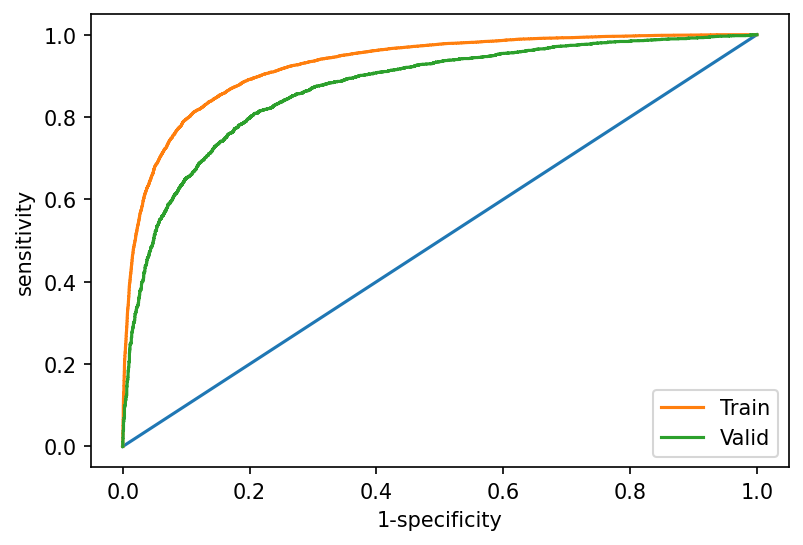

efficientnet-phospho-B-15
Fold: 1
Training on  4 GPUs!


  0%|          | 0/50 [00:00<?, ?it/s]

------------------------------------------------------------
Epoch 1/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.6762 Acc: 0.5805 Recall: 0.6106 AUC: 0.6085


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.6903 Acc: 0.6459 recall: 0.5688 AUC: 0.6946
------------------------------------------------------------

------------------------------------------------------------
Epoch 2/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.6138 Acc: 0.6805 Recall: 0.6386 AUC: 0.7348


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.6734 Acc: 0.6850 recall: 0.7830 AUC: 0.7575
------------------------------------------------------------

------------------------------------------------------------
Epoch 3/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.5713 Acc: 0.7191 Recall: 0.6691 AUC: 0.7785


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.6298 Acc: 0.7044 recall: 0.8215 AUC: 0.7874
------------------------------------------------------------

------------------------------------------------------------
Epoch 4/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.5452 Acc: 0.7408 Recall: 0.7053 AUC: 0.8027


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.5767 Acc: 0.7338 recall: 0.7915 AUC: 0.8045
------------------------------------------------------------

------------------------------------------------------------
Epoch 5/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.5241 Acc: 0.7548 Recall: 0.7303 AUC: 0.8206


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.5382 Acc: 0.7546 recall: 0.7468 AUC: 0.8174
------------------------------------------------------------

------------------------------------------------------------
Epoch 6/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.5082 Acc: 0.7649 Recall: 0.7469 AUC: 0.8333


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.5177 Acc: 0.7631 recall: 0.7308 AUC: 0.8267
------------------------------------------------------------

------------------------------------------------------------
Epoch 7/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.4948 Acc: 0.7713 Recall: 0.7537 AUC: 0.8431


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.5068 Acc: 0.7675 recall: 0.7740 AUC: 0.8349
------------------------------------------------------------

------------------------------------------------------------
Epoch 8/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.4841 Acc: 0.7774 Recall: 0.7639 AUC: 0.8509


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4966 Acc: 0.7696 recall: 0.7302 AUC: 0.8420
------------------------------------------------------------

------------------------------------------------------------
Epoch 9/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.4748 Acc: 0.7818 Recall: 0.7700 AUC: 0.8574


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4878 Acc: 0.7741 recall: 0.7550 AUC: 0.8468
------------------------------------------------------------

------------------------------------------------------------
Epoch 10/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.4661 Acc: 0.7858 Recall: 0.7759 AUC: 0.8629


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4826 Acc: 0.7784 recall: 0.7796 AUC: 0.8509
------------------------------------------------------------

------------------------------------------------------------
Epoch 11/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.4582 Acc: 0.7935 Recall: 0.7819 AUC: 0.8679


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4785 Acc: 0.7820 recall: 0.7916 AUC: 0.8537
------------------------------------------------------------

------------------------------------------------------------
Epoch 12/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.4520 Acc: 0.7962 Recall: 0.7871 AUC: 0.8717


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4718 Acc: 0.7860 recall: 0.7755 AUC: 0.8576
------------------------------------------------------------

------------------------------------------------------------
Epoch 13/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.4463 Acc: 0.7977 Recall: 0.7912 AUC: 0.8754


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4686 Acc: 0.7851 recall: 0.7680 AUC: 0.8596
------------------------------------------------------------

------------------------------------------------------------
Epoch 14/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.4408 Acc: 0.7988 Recall: 0.7875 AUC: 0.8783


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4653 Acc: 0.7884 recall: 0.7837 AUC: 0.8619
------------------------------------------------------------

------------------------------------------------------------
Epoch 15/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.4363 Acc: 0.8047 Recall: 0.7957 AUC: 0.8811


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4628 Acc: 0.7866 recall: 0.7908 AUC: 0.8635
------------------------------------------------------------

------------------------------------------------------------
Epoch 16/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.4312 Acc: 0.8066 Recall: 0.7985 AUC: 0.8840


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4595 Acc: 0.7906 recall: 0.7787 AUC: 0.8651
------------------------------------------------------------

------------------------------------------------------------
Epoch 17/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.4282 Acc: 0.8083 Recall: 0.8008 AUC: 0.8856


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4590 Acc: 0.7900 recall: 0.7809 AUC: 0.8652
------------------------------------------------------------

------------------------------------------------------------
Epoch 18/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.4245 Acc: 0.8093 Recall: 0.8014 AUC: 0.8877


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4566 Acc: 0.7942 recall: 0.7836 AUC: 0.8668
------------------------------------------------------------

------------------------------------------------------------
Epoch 19/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.4199 Acc: 0.8115 Recall: 0.8034 AUC: 0.8904


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4558 Acc: 0.7947 recall: 0.7848 AUC: 0.8671
------------------------------------------------------------

------------------------------------------------------------
Epoch 20/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.4167 Acc: 0.8137 Recall: 0.8058 AUC: 0.8921


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4548 Acc: 0.7965 recall: 0.7890 AUC: 0.8679
------------------------------------------------------------

------------------------------------------------------------
Epoch 21/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.4123 Acc: 0.8169 Recall: 0.8088 AUC: 0.8946


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4538 Acc: 0.7944 recall: 0.7713 AUC: 0.8687
------------------------------------------------------------

------------------------------------------------------------
Epoch 22/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.4115 Acc: 0.8155 Recall: 0.8080 AUC: 0.8948


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4528 Acc: 0.7956 recall: 0.7728 AUC: 0.8694
------------------------------------------------------------

------------------------------------------------------------
Epoch 23/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.4083 Acc: 0.8187 Recall: 0.8126 AUC: 0.8967


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4520 Acc: 0.7987 recall: 0.7939 AUC: 0.8697
------------------------------------------------------------

------------------------------------------------------------
Epoch 24/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.4057 Acc: 0.8193 Recall: 0.8101 AUC: 0.8978


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4524 Acc: 0.7969 recall: 0.8029 AUC: 0.8700
------------------------------------------------------------

------------------------------------------------------------
Epoch 25/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.4024 Acc: 0.8219 Recall: 0.8163 AUC: 0.8998


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4519 Acc: 0.7965 recall: 0.7749 AUC: 0.8704
------------------------------------------------------------

------------------------------------------------------------
Epoch 26/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3995 Acc: 0.8219 Recall: 0.8141 AUC: 0.9012


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4506 Acc: 0.7998 recall: 0.7776 AUC: 0.8711
------------------------------------------------------------

------------------------------------------------------------
Epoch 27/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3980 Acc: 0.8231 Recall: 0.8147 AUC: 0.9021


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4503 Acc: 0.7979 recall: 0.7918 AUC: 0.8710
------------------------------------------------------------

------------------------------------------------------------
Epoch 28/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3940 Acc: 0.8278 Recall: 0.8186 AUC: 0.9041


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4487 Acc: 0.7990 recall: 0.7807 AUC: 0.8720
------------------------------------------------------------

------------------------------------------------------------
Epoch 29/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3908 Acc: 0.8277 Recall: 0.8204 AUC: 0.9059


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4492 Acc: 0.7956 recall: 0.7916 AUC: 0.8718
------------------------------------------------------------

------------------------------------------------------------
Epoch 30/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3912 Acc: 0.8277 Recall: 0.8232 AUC: 0.9056


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4494 Acc: 0.7975 recall: 0.7728 AUC: 0.8722
------------------------------------------------------------

------------------------------------------------------------
Epoch 31/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3889 Acc: 0.8290 Recall: 0.8229 AUC: 0.9067


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4476 Acc: 0.7981 recall: 0.7853 AUC: 0.8728
------------------------------------------------------------

------------------------------------------------------------
Epoch 32/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3859 Acc: 0.8321 Recall: 0.8262 AUC: 0.9083


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4487 Acc: 0.7965 recall: 0.8064 AUC: 0.8730
------------------------------------------------------------

------------------------------------------------------------
Epoch 33/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3856 Acc: 0.8312 Recall: 0.8246 AUC: 0.9084


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4477 Acc: 0.7981 recall: 0.7946 AUC: 0.8730
------------------------------------------------------------

------------------------------------------------------------
Epoch 34/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3812 Acc: 0.8339 Recall: 0.8278 AUC: 0.9108


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4485 Acc: 0.8010 recall: 0.8034 AUC: 0.8730
------------------------------------------------------------

------------------------------------------------------------
Epoch 35/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3812 Acc: 0.8335 Recall: 0.8276 AUC: 0.9107


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4495 Acc: 0.7970 recall: 0.7743 AUC: 0.8725
------------------------------------------------------------

------------------------------------------------------------
Epoch 36/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3800 Acc: 0.8341 Recall: 0.8264 AUC: 0.9112


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4485 Acc: 0.7999 recall: 0.7999 AUC: 0.8729
------------------------------------------------------------

------------------------------------------------------------
Epoch 37/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3788 Acc: 0.8357 Recall: 0.8284 AUC: 0.9118


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4486 Acc: 0.7974 recall: 0.7918 AUC: 0.8731
------------------------------------------------------------

------------------------------------------------------------
Epoch 38/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3780 Acc: 0.8357 Recall: 0.8304 AUC: 0.9122


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4522 Acc: 0.7950 recall: 0.7545 AUC: 0.8729
------------------------------------------------------------

------------------------------------------------------------
Epoch 39/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3738 Acc: 0.8346 Recall: 0.8288 AUC: 0.9143


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4494 Acc: 0.7983 recall: 0.7935 AUC: 0.8730
------------------------------------------------------------

------------------------------------------------------------
Epoch 40/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3729 Acc: 0.8378 Recall: 0.8330 AUC: 0.9147


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4474 Acc: 0.8007 recall: 0.7852 AUC: 0.8737
------------------------------------------------------------

------------------------------------------------------------
Epoch 41/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3729 Acc: 0.8390 Recall: 0.8340 AUC: 0.9146


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4484 Acc: 0.8006 recall: 0.8058 AUC: 0.8737
------------------------------------------------------------

------------------------------------------------------------
Epoch 42/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3711 Acc: 0.8379 Recall: 0.8337 AUC: 0.9154


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4499 Acc: 0.7992 recall: 0.7729 AUC: 0.8735
------------------------------------------------------------

------------------------------------------------------------
Epoch 43/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3693 Acc: 0.8383 Recall: 0.8316 AUC: 0.9161


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4513 Acc: 0.7997 recall: 0.7678 AUC: 0.8731
------------------------------------------------------------

------------------------------------------------------------
Epoch 44/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3680 Acc: 0.8404 Recall: 0.8360 AUC: 0.9170


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4494 Acc: 0.8005 recall: 0.8117 AUC: 0.8741
------------------------------------------------------------

------------------------------------------------------------
Epoch 45/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3657 Acc: 0.8424 Recall: 0.8369 AUC: 0.9180


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4511 Acc: 0.7951 recall: 0.7706 AUC: 0.8733
------------------------------------------------------------

------------------------------------------------------------
Epoch 46/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3658 Acc: 0.8426 Recall: 0.8360 AUC: 0.9180


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4482 Acc: 0.8007 recall: 0.7831 AUC: 0.8743
------------------------------------------------------------

------------------------------------------------------------
Epoch 47/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3652 Acc: 0.8407 Recall: 0.8335 AUC: 0.9182


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4490 Acc: 0.8010 recall: 0.7988 AUC: 0.8741
------------------------------------------------------------

------------------------------------------------------------
Epoch 48/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3642 Acc: 0.8417 Recall: 0.8378 AUC: 0.9187


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4502 Acc: 0.8028 recall: 0.7986 AUC: 0.8736
------------------------------------------------------------

------------------------------------------------------------
Epoch 49/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3618 Acc: 0.8426 Recall: 0.8354 AUC: 0.9199


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4497 Acc: 0.8023 recall: 0.7873 AUC: 0.8741
------------------------------------------------------------

------------------------------------------------------------
Epoch 50/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3609 Acc: 0.8440 Recall: 0.8394 AUC: 0.9203


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4491 Acc: 0.8022 recall: 0.8144 AUC: 0.8746
------------------------------------------------------------

Training complete in 1m 36s
Best val Loss: 0.447444
Best val Acc: 0.802803


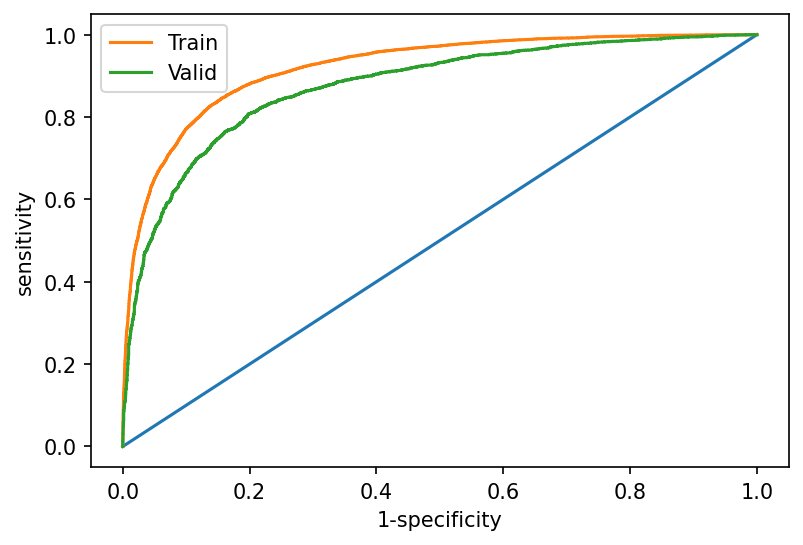

efficientnet-phospho-B-15
Fold: 2
Training on  4 GPUs!


  0%|          | 0/50 [00:00<?, ?it/s]

------------------------------------------------------------
Epoch 1/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.6897 Acc: 0.5498 Recall: 0.5663 AUC: 0.5656


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.6913 Acc: 0.6231 recall: 0.6257 AUC: 0.6682
------------------------------------------------------------

------------------------------------------------------------
Epoch 2/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.6320 Acc: 0.6629 Recall: 0.6381 AUC: 0.7123


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.6768 Acc: 0.6462 recall: 0.8038 AUC: 0.7385
------------------------------------------------------------

------------------------------------------------------------
Epoch 3/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.5876 Acc: 0.7158 Recall: 0.6717 AUC: 0.7672


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.6343 Acc: 0.7159 recall: 0.7645 AUC: 0.7809
------------------------------------------------------------

------------------------------------------------------------
Epoch 4/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.5556 Acc: 0.7385 Recall: 0.6964 AUC: 0.7954


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.5784 Acc: 0.7414 recall: 0.7641 AUC: 0.8035
------------------------------------------------------------

------------------------------------------------------------
Epoch 5/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.5342 Acc: 0.7510 Recall: 0.7191 AUC: 0.8120


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.5390 Acc: 0.7604 recall: 0.7060 AUC: 0.8186
------------------------------------------------------------

------------------------------------------------------------
Epoch 6/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.5171 Acc: 0.7619 Recall: 0.7343 AUC: 0.8265


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.5167 Acc: 0.7688 recall: 0.7489 AUC: 0.8306
------------------------------------------------------------

------------------------------------------------------------
Epoch 7/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.5040 Acc: 0.7702 Recall: 0.7475 AUC: 0.8369


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.5036 Acc: 0.7715 recall: 0.7514 AUC: 0.8381
------------------------------------------------------------

------------------------------------------------------------
Epoch 8/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.4927 Acc: 0.7755 Recall: 0.7529 AUC: 0.8455


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4937 Acc: 0.7748 recall: 0.7549 AUC: 0.8444
------------------------------------------------------------

------------------------------------------------------------
Epoch 9/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.4822 Acc: 0.7834 Recall: 0.7659 AUC: 0.8526


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4863 Acc: 0.7777 recall: 0.7590 AUC: 0.8496
------------------------------------------------------------

------------------------------------------------------------
Epoch 10/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.4732 Acc: 0.7863 Recall: 0.7713 AUC: 0.8591


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4801 Acc: 0.7784 recall: 0.7392 AUC: 0.8545
------------------------------------------------------------

------------------------------------------------------------
Epoch 11/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.4653 Acc: 0.7914 Recall: 0.7744 AUC: 0.8641


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4743 Acc: 0.7838 recall: 0.7816 AUC: 0.8577
------------------------------------------------------------

------------------------------------------------------------
Epoch 12/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.4582 Acc: 0.7935 Recall: 0.7798 AUC: 0.8686


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4683 Acc: 0.7850 recall: 0.7630 AUC: 0.8617
------------------------------------------------------------

------------------------------------------------------------
Epoch 13/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.4512 Acc: 0.7967 Recall: 0.7830 AUC: 0.8733


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4644 Acc: 0.7838 recall: 0.7737 AUC: 0.8637
------------------------------------------------------------

------------------------------------------------------------
Epoch 14/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.4445 Acc: 0.8019 Recall: 0.7909 AUC: 0.8773


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4620 Acc: 0.7847 recall: 0.7613 AUC: 0.8653
------------------------------------------------------------

------------------------------------------------------------
Epoch 15/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.4389 Acc: 0.8027 Recall: 0.7908 AUC: 0.8805


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4582 Acc: 0.7885 recall: 0.7754 AUC: 0.8675
------------------------------------------------------------

------------------------------------------------------------
Epoch 16/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.4336 Acc: 0.8072 Recall: 0.7949 AUC: 0.8836


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4548 Acc: 0.7898 recall: 0.7675 AUC: 0.8697
------------------------------------------------------------

------------------------------------------------------------
Epoch 17/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.4289 Acc: 0.8091 Recall: 0.7965 AUC: 0.8863


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4528 Acc: 0.7915 recall: 0.7771 AUC: 0.8708
------------------------------------------------------------

------------------------------------------------------------
Epoch 18/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.4275 Acc: 0.8108 Recall: 0.8008 AUC: 0.8867


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4500 Acc: 0.7943 recall: 0.7745 AUC: 0.8723
------------------------------------------------------------

------------------------------------------------------------
Epoch 19/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.4223 Acc: 0.8149 Recall: 0.8031 AUC: 0.8898


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4478 Acc: 0.7934 recall: 0.7883 AUC: 0.8734
------------------------------------------------------------

------------------------------------------------------------
Epoch 20/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.4193 Acc: 0.8130 Recall: 0.8077 AUC: 0.8914


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4472 Acc: 0.7918 recall: 0.7654 AUC: 0.8744
------------------------------------------------------------

------------------------------------------------------------
Epoch 21/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.4158 Acc: 0.8168 Recall: 0.8086 AUC: 0.8932


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4453 Acc: 0.7946 recall: 0.7834 AUC: 0.8748
------------------------------------------------------------

------------------------------------------------------------
Epoch 22/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.4107 Acc: 0.8182 Recall: 0.8091 AUC: 0.8962


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4446 Acc: 0.7951 recall: 0.7747 AUC: 0.8752
------------------------------------------------------------

------------------------------------------------------------
Epoch 23/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.4073 Acc: 0.8204 Recall: 0.8106 AUC: 0.8976


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4435 Acc: 0.7954 recall: 0.8006 AUC: 0.8762
------------------------------------------------------------

------------------------------------------------------------
Epoch 24/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.4037 Acc: 0.8238 Recall: 0.8171 AUC: 0.8999


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4445 Acc: 0.7972 recall: 0.7628 AUC: 0.8770
------------------------------------------------------------

------------------------------------------------------------
Epoch 25/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.4028 Acc: 0.8225 Recall: 0.8144 AUC: 0.9004


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4407 Acc: 0.7989 recall: 0.7799 AUC: 0.8779
------------------------------------------------------------

------------------------------------------------------------
Epoch 26/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3976 Acc: 0.8259 Recall: 0.8170 AUC: 0.9030


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4412 Acc: 0.7973 recall: 0.7942 AUC: 0.8773
------------------------------------------------------------

------------------------------------------------------------
Epoch 27/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3976 Acc: 0.8245 Recall: 0.8179 AUC: 0.9029


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4403 Acc: 0.7986 recall: 0.7882 AUC: 0.8780
------------------------------------------------------------

------------------------------------------------------------
Epoch 28/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3936 Acc: 0.8310 Recall: 0.8208 AUC: 0.9049


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4409 Acc: 0.7984 recall: 0.7707 AUC: 0.8786
------------------------------------------------------------

------------------------------------------------------------
Epoch 29/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3912 Acc: 0.8295 Recall: 0.8221 AUC: 0.9062


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4410 Acc: 0.7979 recall: 0.7725 AUC: 0.8784
------------------------------------------------------------

------------------------------------------------------------
Epoch 30/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3907 Acc: 0.8304 Recall: 0.8230 AUC: 0.9062


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4397 Acc: 0.8002 recall: 0.7798 AUC: 0.8788
------------------------------------------------------------

------------------------------------------------------------
Epoch 31/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3869 Acc: 0.8316 Recall: 0.8240 AUC: 0.9084


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4385 Acc: 0.8020 recall: 0.8107 AUC: 0.8794
------------------------------------------------------------

------------------------------------------------------------
Epoch 32/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3846 Acc: 0.8338 Recall: 0.8249 AUC: 0.9098


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4382 Acc: 0.8002 recall: 0.8025 AUC: 0.8794
------------------------------------------------------------

------------------------------------------------------------
Epoch 33/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3850 Acc: 0.8307 Recall: 0.8236 AUC: 0.9092


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4400 Acc: 0.8017 recall: 0.7764 AUC: 0.8792
------------------------------------------------------------

------------------------------------------------------------
Epoch 34/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3798 Acc: 0.8342 Recall: 0.8277 AUC: 0.9118


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4376 Acc: 0.8022 recall: 0.7993 AUC: 0.8799
------------------------------------------------------------

------------------------------------------------------------
Epoch 35/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3778 Acc: 0.8365 Recall: 0.8302 AUC: 0.9128


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4397 Acc: 0.8039 recall: 0.7884 AUC: 0.8790
------------------------------------------------------------

------------------------------------------------------------
Epoch 36/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3760 Acc: 0.8367 Recall: 0.8318 AUC: 0.9135


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4380 Acc: 0.8034 recall: 0.7959 AUC: 0.8797
------------------------------------------------------------

------------------------------------------------------------
Epoch 37/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3748 Acc: 0.8354 Recall: 0.8287 AUC: 0.9140


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4403 Acc: 0.8028 recall: 0.7719 AUC: 0.8800
------------------------------------------------------------

------------------------------------------------------------
Epoch 38/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3724 Acc: 0.8394 Recall: 0.8322 AUC: 0.9155


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4379 Acc: 0.8029 recall: 0.8082 AUC: 0.8801
------------------------------------------------------------

------------------------------------------------------------
Epoch 39/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3720 Acc: 0.8404 Recall: 0.8339 AUC: 0.9156


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4397 Acc: 0.8026 recall: 0.8155 AUC: 0.8796
------------------------------------------------------------

------------------------------------------------------------
Epoch 40/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3713 Acc: 0.8389 Recall: 0.8337 AUC: 0.9158


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4387 Acc: 0.8037 recall: 0.8087 AUC: 0.8798
------------------------------------------------------------

------------------------------------------------------------
Epoch 41/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3681 Acc: 0.8401 Recall: 0.8349 AUC: 0.9175


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4388 Acc: 0.8046 recall: 0.8125 AUC: 0.8801
------------------------------------------------------------

------------------------------------------------------------
Epoch 42/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3688 Acc: 0.8409 Recall: 0.8341 AUC: 0.9170


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4384 Acc: 0.8068 recall: 0.7973 AUC: 0.8800
------------------------------------------------------------

------------------------------------------------------------
Epoch 43/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3647 Acc: 0.8427 Recall: 0.8365 AUC: 0.9190


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4386 Acc: 0.8052 recall: 0.8215 AUC: 0.8806
------------------------------------------------------------

------------------------------------------------------------
Epoch 44/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3661 Acc: 0.8411 Recall: 0.8368 AUC: 0.9182


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4403 Acc: 0.8053 recall: 0.7899 AUC: 0.8795
------------------------------------------------------------

------------------------------------------------------------
Epoch 45/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3665 Acc: 0.8423 Recall: 0.8387 AUC: 0.9180


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4399 Acc: 0.8068 recall: 0.7843 AUC: 0.8807
------------------------------------------------------------

------------------------------------------------------------
Epoch 46/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3627 Acc: 0.8435 Recall: 0.8369 AUC: 0.9199


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4392 Acc: 0.8043 recall: 0.7835 AUC: 0.8808
------------------------------------------------------------

------------------------------------------------------------
Epoch 47/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3598 Acc: 0.8465 Recall: 0.8416 AUC: 0.9214


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4402 Acc: 0.8066 recall: 0.8182 AUC: 0.8801
------------------------------------------------------------

------------------------------------------------------------
Epoch 48/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3584 Acc: 0.8446 Recall: 0.8396 AUC: 0.9217


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4393 Acc: 0.8076 recall: 0.7941 AUC: 0.8805
------------------------------------------------------------

------------------------------------------------------------
Epoch 49/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3572 Acc: 0.8485 Recall: 0.8423 AUC: 0.9223


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4427 Acc: 0.8050 recall: 0.7736 AUC: 0.8805
------------------------------------------------------------

------------------------------------------------------------
Epoch 50/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3547 Acc: 0.8470 Recall: 0.8400 AUC: 0.9235


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4410 Acc: 0.8061 recall: 0.8055 AUC: 0.8795
------------------------------------------------------------

Training complete in 1m 34s
Best val Loss: 0.437578
Best val Acc: 0.807554


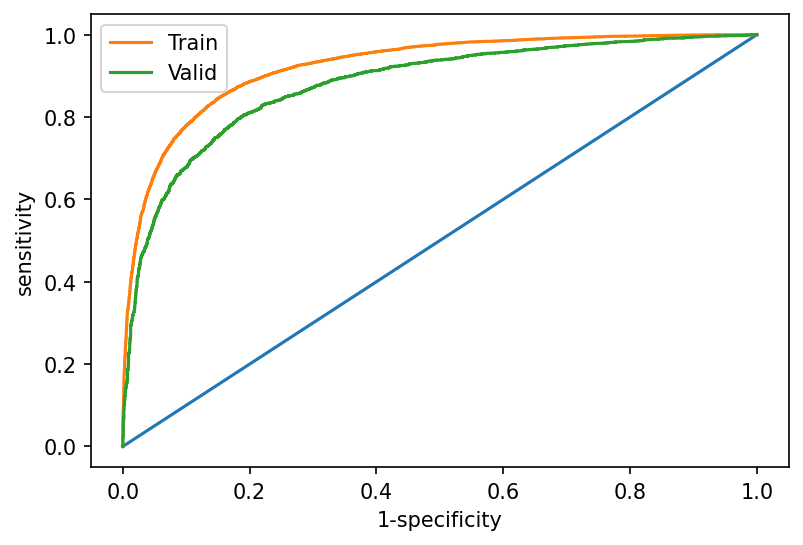

efficientnet-phospho-B-15
Fold: 3
Training on  4 GPUs!


  0%|          | 0/50 [00:00<?, ?it/s]

------------------------------------------------------------
Epoch 1/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.6868 Acc: 0.5532 Recall: 0.5052 AUC: 0.5750


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.6917 Acc: 0.5916 recall: 0.2781 AUC: 0.6609
------------------------------------------------------------

------------------------------------------------------------
Epoch 2/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.6326 Acc: 0.6556 Recall: 0.6299 AUC: 0.7068


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.6788 Acc: 0.6790 recall: 0.6283 AUC: 0.7361
------------------------------------------------------------

------------------------------------------------------------
Epoch 3/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.5898 Acc: 0.7013 Recall: 0.6633 AUC: 0.7595


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.6372 Acc: 0.7180 recall: 0.6781 AUC: 0.7745
------------------------------------------------------------

------------------------------------------------------------
Epoch 4/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.5608 Acc: 0.7268 Recall: 0.6810 AUC: 0.7875


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.5827 Acc: 0.7434 recall: 0.7393 AUC: 0.7967
------------------------------------------------------------

------------------------------------------------------------
Epoch 5/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.5421 Acc: 0.7404 Recall: 0.7081 AUC: 0.8048


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.5470 Acc: 0.7543 recall: 0.7244 AUC: 0.8093
------------------------------------------------------------

------------------------------------------------------------
Epoch 6/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.5253 Acc: 0.7563 Recall: 0.7276 AUC: 0.8194


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.5296 Acc: 0.7598 recall: 0.7544 AUC: 0.8183
------------------------------------------------------------

------------------------------------------------------------
Epoch 7/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.5123 Acc: 0.7636 Recall: 0.7373 AUC: 0.8299


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.5183 Acc: 0.7635 recall: 0.7434 AUC: 0.8257
------------------------------------------------------------

------------------------------------------------------------
Epoch 8/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.4992 Acc: 0.7691 Recall: 0.7449 AUC: 0.8406


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.5123 Acc: 0.7710 recall: 0.7304 AUC: 0.8315
------------------------------------------------------------

------------------------------------------------------------
Epoch 9/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.4888 Acc: 0.7751 Recall: 0.7565 AUC: 0.8478


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.5040 Acc: 0.7695 recall: 0.7456 AUC: 0.8365
------------------------------------------------------------

------------------------------------------------------------
Epoch 10/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.4809 Acc: 0.7826 Recall: 0.7639 AUC: 0.8537


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4983 Acc: 0.7751 recall: 0.7579 AUC: 0.8410
------------------------------------------------------------

------------------------------------------------------------
Epoch 11/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.4719 Acc: 0.7852 Recall: 0.7723 AUC: 0.8597


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4963 Acc: 0.7771 recall: 0.7280 AUC: 0.8445
------------------------------------------------------------

------------------------------------------------------------
Epoch 12/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.4637 Acc: 0.7890 Recall: 0.7745 AUC: 0.8652


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4872 Acc: 0.7783 recall: 0.7796 AUC: 0.8482
------------------------------------------------------------

------------------------------------------------------------
Epoch 13/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.4561 Acc: 0.7943 Recall: 0.7814 AUC: 0.8700


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4834 Acc: 0.7831 recall: 0.7736 AUC: 0.8511
------------------------------------------------------------

------------------------------------------------------------
Epoch 14/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.4492 Acc: 0.7990 Recall: 0.7854 AUC: 0.8743


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4792 Acc: 0.7840 recall: 0.7663 AUC: 0.8537
------------------------------------------------------------

------------------------------------------------------------
Epoch 15/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.4421 Acc: 0.8027 Recall: 0.7892 AUC: 0.8783


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4754 Acc: 0.7855 recall: 0.7942 AUC: 0.8568
------------------------------------------------------------

------------------------------------------------------------
Epoch 16/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.4358 Acc: 0.8051 Recall: 0.7945 AUC: 0.8824


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4721 Acc: 0.7879 recall: 0.7668 AUC: 0.8585
------------------------------------------------------------

------------------------------------------------------------
Epoch 17/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.4299 Acc: 0.8106 Recall: 0.7991 AUC: 0.8855


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4682 Acc: 0.7883 recall: 0.7945 AUC: 0.8612
------------------------------------------------------------

------------------------------------------------------------
Epoch 18/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.4248 Acc: 0.8116 Recall: 0.7981 AUC: 0.8886


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4649 Acc: 0.7922 recall: 0.7759 AUC: 0.8628
------------------------------------------------------------

------------------------------------------------------------
Epoch 19/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.4213 Acc: 0.8146 Recall: 0.8024 AUC: 0.8903


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4628 Acc: 0.7916 recall: 0.7795 AUC: 0.8643
------------------------------------------------------------

------------------------------------------------------------
Epoch 20/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.4161 Acc: 0.8142 Recall: 0.8011 AUC: 0.8934


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4627 Acc: 0.7891 recall: 0.8145 AUC: 0.8659
------------------------------------------------------------

------------------------------------------------------------
Epoch 21/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.4122 Acc: 0.8200 Recall: 0.8091 AUC: 0.8953


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4596 Acc: 0.7935 recall: 0.7967 AUC: 0.8666
------------------------------------------------------------

------------------------------------------------------------
Epoch 22/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.4058 Acc: 0.8182 Recall: 0.8101 AUC: 0.8989


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4571 Acc: 0.7965 recall: 0.7943 AUC: 0.8681
------------------------------------------------------------

------------------------------------------------------------
Epoch 23/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.4048 Acc: 0.8203 Recall: 0.8101 AUC: 0.8989


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4566 Acc: 0.7974 recall: 0.7975 AUC: 0.8683
------------------------------------------------------------

------------------------------------------------------------
Epoch 24/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.4005 Acc: 0.8237 Recall: 0.8137 AUC: 0.9015


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4561 Acc: 0.7970 recall: 0.7791 AUC: 0.8691
------------------------------------------------------------

------------------------------------------------------------
Epoch 25/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3994 Acc: 0.8242 Recall: 0.8152 AUC: 0.9018


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4551 Acc: 0.7975 recall: 0.8202 AUC: 0.8707
------------------------------------------------------------

------------------------------------------------------------
Epoch 26/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3942 Acc: 0.8257 Recall: 0.8153 AUC: 0.9047


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4535 Acc: 0.7981 recall: 0.8109 AUC: 0.8710
------------------------------------------------------------

------------------------------------------------------------
Epoch 27/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3909 Acc: 0.8294 Recall: 0.8202 AUC: 0.9065


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4513 Acc: 0.7999 recall: 0.7972 AUC: 0.8718
------------------------------------------------------------

------------------------------------------------------------
Epoch 28/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3886 Acc: 0.8311 Recall: 0.8220 AUC: 0.9075


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4536 Acc: 0.7983 recall: 0.8179 AUC: 0.8717
------------------------------------------------------------

------------------------------------------------------------
Epoch 29/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3859 Acc: 0.8306 Recall: 0.8215 AUC: 0.9087


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4507 Acc: 0.8007 recall: 0.7968 AUC: 0.8726
------------------------------------------------------------

------------------------------------------------------------
Epoch 30/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3820 Acc: 0.8329 Recall: 0.8263 AUC: 0.9108


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4510 Acc: 0.8006 recall: 0.8151 AUC: 0.8731
------------------------------------------------------------

------------------------------------------------------------
Epoch 31/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3797 Acc: 0.8373 Recall: 0.8309 AUC: 0.9119


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4494 Acc: 0.8008 recall: 0.8085 AUC: 0.8738
------------------------------------------------------------

------------------------------------------------------------
Epoch 32/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3795 Acc: 0.8336 Recall: 0.8233 AUC: 0.9120


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4490 Acc: 0.8005 recall: 0.8118 AUC: 0.8742
------------------------------------------------------------

------------------------------------------------------------
Epoch 33/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3767 Acc: 0.8335 Recall: 0.8248 AUC: 0.9132


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4486 Acc: 0.8038 recall: 0.8101 AUC: 0.8745
------------------------------------------------------------

------------------------------------------------------------
Epoch 34/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3737 Acc: 0.8366 Recall: 0.8286 AUC: 0.9147


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4482 Acc: 0.8034 recall: 0.8078 AUC: 0.8748
------------------------------------------------------------

------------------------------------------------------------
Epoch 35/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3716 Acc: 0.8373 Recall: 0.8303 AUC: 0.9157


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4476 Acc: 0.8047 recall: 0.7926 AUC: 0.8753
------------------------------------------------------------

------------------------------------------------------------
Epoch 36/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3707 Acc: 0.8394 Recall: 0.8313 AUC: 0.9161


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4478 Acc: 0.8041 recall: 0.8066 AUC: 0.8755
------------------------------------------------------------

------------------------------------------------------------
Epoch 37/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3677 Acc: 0.8411 Recall: 0.8313 AUC: 0.9176


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4476 Acc: 0.8040 recall: 0.8015 AUC: 0.8755
------------------------------------------------------------

------------------------------------------------------------
Epoch 38/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3662 Acc: 0.8415 Recall: 0.8343 AUC: 0.9182


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4473 Acc: 0.8021 recall: 0.7956 AUC: 0.8756
------------------------------------------------------------

------------------------------------------------------------
Epoch 39/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3643 Acc: 0.8429 Recall: 0.8355 AUC: 0.9191


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4472 Acc: 0.8038 recall: 0.8095 AUC: 0.8762
------------------------------------------------------------

------------------------------------------------------------
Epoch 40/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3629 Acc: 0.8418 Recall: 0.8341 AUC: 0.9198


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4481 Acc: 0.8016 recall: 0.8197 AUC: 0.8766
------------------------------------------------------------

------------------------------------------------------------
Epoch 41/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3613 Acc: 0.8421 Recall: 0.8340 AUC: 0.9206


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4473 Acc: 0.8029 recall: 0.8091 AUC: 0.8767
------------------------------------------------------------

------------------------------------------------------------
Epoch 42/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3579 Acc: 0.8472 Recall: 0.8392 AUC: 0.9221


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4482 Acc: 0.8030 recall: 0.8175 AUC: 0.8766
------------------------------------------------------------

------------------------------------------------------------
Epoch 43/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3584 Acc: 0.8439 Recall: 0.8350 AUC: 0.9218


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4494 Acc: 0.8064 recall: 0.7904 AUC: 0.8761
------------------------------------------------------------

------------------------------------------------------------
Epoch 44/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3547 Acc: 0.8468 Recall: 0.8403 AUC: 0.9235


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4473 Acc: 0.8031 recall: 0.8142 AUC: 0.8773
------------------------------------------------------------

------------------------------------------------------------
Epoch 45/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3528 Acc: 0.8451 Recall: 0.8395 AUC: 0.9242


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4471 Acc: 0.8032 recall: 0.8087 AUC: 0.8774
------------------------------------------------------------

------------------------------------------------------------
Epoch 46/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3507 Acc: 0.8469 Recall: 0.8405 AUC: 0.9252


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4477 Acc: 0.8053 recall: 0.8148 AUC: 0.8772
------------------------------------------------------------

------------------------------------------------------------
Epoch 47/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3507 Acc: 0.8489 Recall: 0.8430 AUC: 0.9252


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4473 Acc: 0.8079 recall: 0.7970 AUC: 0.8775
------------------------------------------------------------

------------------------------------------------------------
Epoch 48/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3484 Acc: 0.8507 Recall: 0.8437 AUC: 0.9261


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4460 Acc: 0.8075 recall: 0.8016 AUC: 0.8783
------------------------------------------------------------

------------------------------------------------------------
Epoch 49/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3480 Acc: 0.8482 Recall: 0.8408 AUC: 0.9263


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4462 Acc: 0.8055 recall: 0.8051 AUC: 0.8779
------------------------------------------------------------

------------------------------------------------------------
Epoch 50/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3477 Acc: 0.8493 Recall: 0.8430 AUC: 0.9263


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4481 Acc: 0.8022 recall: 0.8207 AUC: 0.8780
------------------------------------------------------------

Training complete in 1m 34s
Best val Loss: 0.445973
Best val Acc: 0.807874


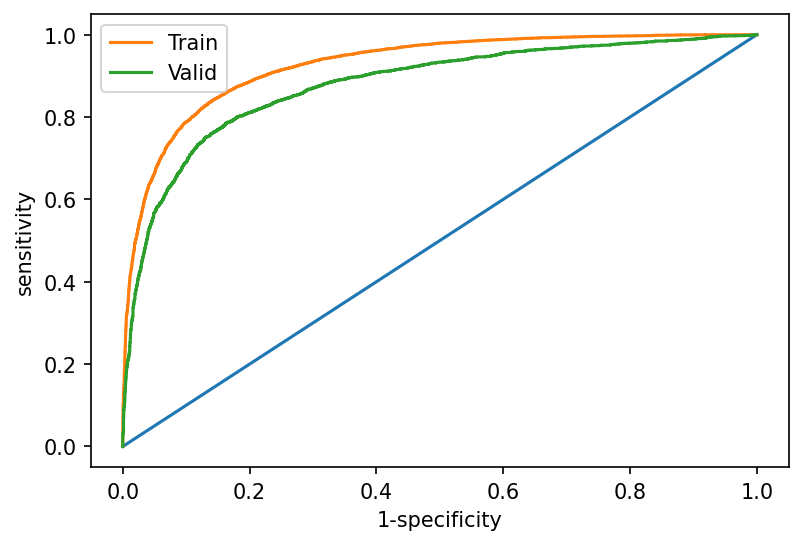

efficientnet-phospho-B-15
Fold: 4
Training on  4 GPUs!


  0%|          | 0/50 [00:00<?, ?it/s]

------------------------------------------------------------
Epoch 1/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.6960 Acc: 0.5279 Recall: 0.5066 AUC: 0.5424


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.6923 Acc: 0.5609 recall: 0.7589 AUC: 0.6228
------------------------------------------------------------

------------------------------------------------------------
Epoch 2/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.6530 Acc: 0.6255 Recall: 0.6296 AUC: 0.6702


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.6851 Acc: 0.5985 recall: 0.8509 AUC: 0.7180
------------------------------------------------------------

------------------------------------------------------------
Epoch 3/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.6135 Acc: 0.6784 Recall: 0.6629 AUC: 0.7384


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.6585 Acc: 0.6490 recall: 0.8491 AUC: 0.7658
------------------------------------------------------------

------------------------------------------------------------
Epoch 4/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.5822 Acc: 0.7118 Recall: 0.6899 AUC: 0.7725


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.6092 Acc: 0.7109 recall: 0.7923 AUC: 0.7899
------------------------------------------------------------

------------------------------------------------------------
Epoch 5/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.5566 Acc: 0.7341 Recall: 0.7127 AUC: 0.7959


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.5655 Acc: 0.7425 recall: 0.7526 AUC: 0.8035
------------------------------------------------------------

------------------------------------------------------------
Epoch 6/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.5368 Acc: 0.7473 Recall: 0.7168 AUC: 0.8115


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.5394 Acc: 0.7541 recall: 0.7187 AUC: 0.8142
------------------------------------------------------------

------------------------------------------------------------
Epoch 7/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.5221 Acc: 0.7564 Recall: 0.7318 AUC: 0.8231


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.5269 Acc: 0.7590 recall: 0.7625 AUC: 0.8230
------------------------------------------------------------

------------------------------------------------------------
Epoch 8/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.5101 Acc: 0.7597 Recall: 0.7307 AUC: 0.8322


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.5172 Acc: 0.7622 recall: 0.7724 AUC: 0.8290
------------------------------------------------------------

------------------------------------------------------------
Epoch 9/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.4977 Acc: 0.7714 Recall: 0.7466 AUC: 0.8418


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.5094 Acc: 0.7634 recall: 0.7778 AUC: 0.8347
------------------------------------------------------------

------------------------------------------------------------
Epoch 10/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.4868 Acc: 0.7763 Recall: 0.7579 AUC: 0.8496


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4996 Acc: 0.7697 recall: 0.7661 AUC: 0.8398
------------------------------------------------------------

------------------------------------------------------------
Epoch 11/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.4793 Acc: 0.7796 Recall: 0.7590 AUC: 0.8541


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4956 Acc: 0.7665 recall: 0.7805 AUC: 0.8442
------------------------------------------------------------

------------------------------------------------------------
Epoch 12/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.4709 Acc: 0.7850 Recall: 0.7668 AUC: 0.8604


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4877 Acc: 0.7721 recall: 0.7626 AUC: 0.8473
------------------------------------------------------------

------------------------------------------------------------
Epoch 13/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.4643 Acc: 0.7911 Recall: 0.7759 AUC: 0.8646


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4815 Acc: 0.7733 recall: 0.7488 AUC: 0.8513
------------------------------------------------------------

------------------------------------------------------------
Epoch 14/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.4584 Acc: 0.7917 Recall: 0.7773 AUC: 0.8683


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4782 Acc: 0.7740 recall: 0.7437 AUC: 0.8533
------------------------------------------------------------

------------------------------------------------------------
Epoch 15/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.4517 Acc: 0.7965 Recall: 0.7836 AUC: 0.8725


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4744 Acc: 0.7787 recall: 0.7534 AUC: 0.8558
------------------------------------------------------------

------------------------------------------------------------
Epoch 16/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.4475 Acc: 0.7981 Recall: 0.7852 AUC: 0.8748


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4713 Acc: 0.7792 recall: 0.7514 AUC: 0.8574
------------------------------------------------------------

------------------------------------------------------------
Epoch 17/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.4395 Acc: 0.8023 Recall: 0.7900 AUC: 0.8800


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4692 Acc: 0.7801 recall: 0.7651 AUC: 0.8593
------------------------------------------------------------

------------------------------------------------------------
Epoch 18/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.4361 Acc: 0.8042 Recall: 0.7928 AUC: 0.8821


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4665 Acc: 0.7813 recall: 0.7733 AUC: 0.8614
------------------------------------------------------------

------------------------------------------------------------
Epoch 19/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.4314 Acc: 0.8068 Recall: 0.7982 AUC: 0.8844


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4638 Acc: 0.7853 recall: 0.7522 AUC: 0.8622
------------------------------------------------------------

------------------------------------------------------------
Epoch 20/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.4275 Acc: 0.8086 Recall: 0.7986 AUC: 0.8870


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4616 Acc: 0.7859 recall: 0.7643 AUC: 0.8638
------------------------------------------------------------

------------------------------------------------------------
Epoch 21/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.4245 Acc: 0.8110 Recall: 0.8006 AUC: 0.8885


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4612 Acc: 0.7854 recall: 0.7670 AUC: 0.8640
------------------------------------------------------------

------------------------------------------------------------
Epoch 22/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.4176 Acc: 0.8149 Recall: 0.8071 AUC: 0.8925


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4593 Acc: 0.7880 recall: 0.7672 AUC: 0.8651
------------------------------------------------------------

------------------------------------------------------------
Epoch 23/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.4167 Acc: 0.8138 Recall: 0.8071 AUC: 0.8926


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4583 Acc: 0.7874 recall: 0.7667 AUC: 0.8657
------------------------------------------------------------

------------------------------------------------------------
Epoch 24/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.4126 Acc: 0.8177 Recall: 0.8084 AUC: 0.8950


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4573 Acc: 0.7909 recall: 0.7769 AUC: 0.8666
------------------------------------------------------------

------------------------------------------------------------
Epoch 25/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.4104 Acc: 0.8200 Recall: 0.8091 AUC: 0.8960


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4573 Acc: 0.7876 recall: 0.7835 AUC: 0.8670
------------------------------------------------------------

------------------------------------------------------------
Epoch 26/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.4079 Acc: 0.8199 Recall: 0.8142 AUC: 0.8974


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4559 Acc: 0.7888 recall: 0.7901 AUC: 0.8684
------------------------------------------------------------

------------------------------------------------------------
Epoch 27/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.4029 Acc: 0.8231 Recall: 0.8140 AUC: 0.9003


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4572 Acc: 0.7891 recall: 0.7976 AUC: 0.8684
------------------------------------------------------------

------------------------------------------------------------
Epoch 28/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.4021 Acc: 0.8195 Recall: 0.8116 AUC: 0.9004


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4551 Acc: 0.7897 recall: 0.7867 AUC: 0.8684
------------------------------------------------------------

------------------------------------------------------------
Epoch 29/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3978 Acc: 0.8241 Recall: 0.8163 AUC: 0.9028


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4542 Acc: 0.7912 recall: 0.7710 AUC: 0.8684
------------------------------------------------------------

------------------------------------------------------------
Epoch 30/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3960 Acc: 0.8250 Recall: 0.8180 AUC: 0.9036


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4609 Acc: 0.7898 recall: 0.8195 AUC: 0.8697
------------------------------------------------------------

------------------------------------------------------------
Epoch 31/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3952 Acc: 0.8261 Recall: 0.8208 AUC: 0.9041


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4501 Acc: 0.7957 recall: 0.7706 AUC: 0.8709
------------------------------------------------------------

------------------------------------------------------------
Epoch 32/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3902 Acc: 0.8286 Recall: 0.8241 AUC: 0.9067


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4509 Acc: 0.7939 recall: 0.7732 AUC: 0.8706
------------------------------------------------------------

------------------------------------------------------------
Epoch 33/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3898 Acc: 0.8278 Recall: 0.8201 AUC: 0.9067


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4532 Acc: 0.7927 recall: 0.7436 AUC: 0.8708
------------------------------------------------------------

------------------------------------------------------------
Epoch 34/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3871 Acc: 0.8316 Recall: 0.8263 AUC: 0.9081


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4515 Acc: 0.7941 recall: 0.7934 AUC: 0.8714
------------------------------------------------------------

------------------------------------------------------------
Epoch 35/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3858 Acc: 0.8308 Recall: 0.8244 AUC: 0.9086


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4508 Acc: 0.7927 recall: 0.7780 AUC: 0.8709
------------------------------------------------------------

------------------------------------------------------------
Epoch 36/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3803 Acc: 0.8338 Recall: 0.8273 AUC: 0.9117


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4507 Acc: 0.7931 recall: 0.7661 AUC: 0.8712
------------------------------------------------------------

------------------------------------------------------------
Epoch 37/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3794 Acc: 0.8336 Recall: 0.8292 AUC: 0.9120


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4504 Acc: 0.7959 recall: 0.7544 AUC: 0.8722
------------------------------------------------------------

------------------------------------------------------------
Epoch 38/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3794 Acc: 0.8345 Recall: 0.8293 AUC: 0.9118


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4507 Acc: 0.7970 recall: 0.7848 AUC: 0.8714
------------------------------------------------------------

------------------------------------------------------------
Epoch 39/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3763 Acc: 0.8362 Recall: 0.8277 AUC: 0.9134


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4505 Acc: 0.7951 recall: 0.7779 AUC: 0.8715
------------------------------------------------------------

------------------------------------------------------------
Epoch 40/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3750 Acc: 0.8367 Recall: 0.8327 AUC: 0.9140


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4507 Acc: 0.7943 recall: 0.7995 AUC: 0.8726
------------------------------------------------------------

------------------------------------------------------------
Epoch 41/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3730 Acc: 0.8366 Recall: 0.8333 AUC: 0.9149


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4489 Acc: 0.7962 recall: 0.7719 AUC: 0.8728
------------------------------------------------------------

------------------------------------------------------------
Epoch 42/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3711 Acc: 0.8388 Recall: 0.8325 AUC: 0.9159


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4488 Acc: 0.7960 recall: 0.7725 AUC: 0.8729
------------------------------------------------------------

------------------------------------------------------------
Epoch 43/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3682 Acc: 0.8413 Recall: 0.8380 AUC: 0.9175


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4502 Acc: 0.7969 recall: 0.8024 AUC: 0.8734
------------------------------------------------------------

------------------------------------------------------------
Epoch 44/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3675 Acc: 0.8401 Recall: 0.8359 AUC: 0.9177


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4489 Acc: 0.7957 recall: 0.7875 AUC: 0.8734
------------------------------------------------------------

------------------------------------------------------------
Epoch 45/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3652 Acc: 0.8429 Recall: 0.8388 AUC: 0.9187


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4494 Acc: 0.7983 recall: 0.7707 AUC: 0.8732
------------------------------------------------------------

------------------------------------------------------------
Epoch 46/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3650 Acc: 0.8397 Recall: 0.8347 AUC: 0.9186


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4484 Acc: 0.7966 recall: 0.7847 AUC: 0.8737
------------------------------------------------------------

------------------------------------------------------------
Epoch 47/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3649 Acc: 0.8405 Recall: 0.8364 AUC: 0.9187


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4499 Acc: 0.7981 recall: 0.7878 AUC: 0.8732
------------------------------------------------------------

------------------------------------------------------------
Epoch 48/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3607 Acc: 0.8434 Recall: 0.8395 AUC: 0.9209


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4523 Acc: 0.7981 recall: 0.8098 AUC: 0.8739
------------------------------------------------------------

------------------------------------------------------------
Epoch 49/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3617 Acc: 0.8419 Recall: 0.8384 AUC: 0.9199


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4509 Acc: 0.7963 recall: 0.7996 AUC: 0.8736
------------------------------------------------------------

------------------------------------------------------------
Epoch 50/50


  0%|          | 0/104 [00:00<?, ?it/s]

train Loss: 0.3589 Acc: 0.8453 Recall: 0.8437 AUC: 0.9215


  0%|          | 0/26 [00:00<?, ?it/s]

validation Loss: 0.4507 Acc: 0.7990 recall: 0.8029 AUC: 0.8739
------------------------------------------------------------

Training complete in 1m 35s
Best val Loss: 0.448413
Best val Acc: 0.799014


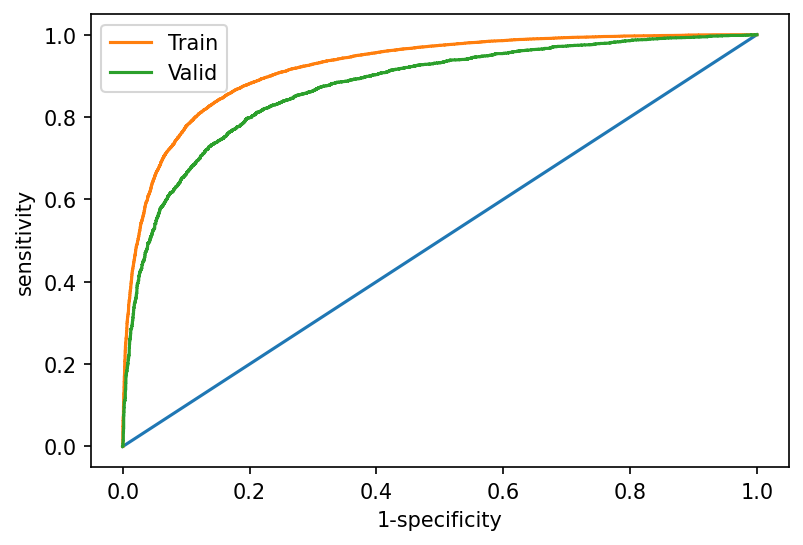

efficientnet-phospho-B-15
Kfold_cv_mean: 0.803497


In [35]:
best_acc_sum = 0
for fold, (tr_idx, val_idx) in enumerate(kf2.split(dfr2)):
    
    print('Fold: {:d}'.format(fold))
    BATCH_SIZE = 256

    train_set = data_utils.TensorDataset(torch.tensor(dfr2[tr_idx]), torch.tensor(dfl2[tr_idx]))
    valid_set = data_utils.TensorDataset(torch.tensor(dfr2[val_idx]),torch.tensor(dfl2[val_idx]))


    train_loader = data_utils.DataLoader(train_set, batch_size=BATCH_SIZE, pin_memory=True, shuffle=True)
    valid_loader = data_utils.DataLoader(valid_set, batch_size=BATCH_SIZE, shuffle=True)


    dataloaders = {'train':train_loader,'valid':valid_loader}
    dataset_sizes = {x: len(dataloaders[x]) for x in ['train', 'valid']}
    
    model = train_model(model, optimizer, scheduler, 50)
    
    plt.figure(dpi = 150)
    plt.plot([0,1],[0,1])
    plt.plot(Trainfprs, Traintprs, label= 'Train')
    plt.plot(Validfprs, Validtprs, label= 'Valid')
    plt.legend()
    plt.xlabel("1-specificity",fontsize =10)
    plt.ylabel("sensitivity",fontsize =10)
    plt.xlim()
    plt.ylim()
    plt.show()
    best_acc_sum += best_acc
    
    del model
    allele = 'phospho-B-15'
    model = EfficientNet.from_name(f'efficientnet-{allele}')
    criterion = nn.BCELoss()
    optimizer = RAdam(model.parameters())
    scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=100, gamma=0.1)
    
    save_dir = f'Weight/batch_50_SYTratiodata_randomstate{random_state}/saved_model4/Efficientnet_{fold+1}_kernel_3_ms_only_same_ratio'
    writer = SummaryWriter(save_dir)
    
    if fold == 4:
        print('Kfold_cv_mean: {:2f}'.format(best_acc_sum/(fold+1)))

Fold: 0
Training on  4 GPUs!


  0%|          | 0/30 [00:00<?, ?it/s]

------------------------------------------------------------
Epoch 1/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0096 Acc: 0.9909 F1: 0.9598 Recall: 0.9676 AUC: 0.9909


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0258 Acc: 0.9645 F1: 0.9357 recall: 0.8922 AUC: 0.9992
------------------------------------------------------------

------------------------------------------------------------
Epoch 2/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0076 Acc: 0.9929 F1: 0.9679 Recall: 0.9752 AUC: 0.9929


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0085 Acc: 0.9891 F1: 0.9718 recall: 0.9634 AUC: 0.9995
------------------------------------------------------------

------------------------------------------------------------
Epoch 3/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0065 Acc: 0.9929 F1: 0.9723 Recall: 0.9794 AUC: 0.9929


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0055 Acc: 0.9927 F1: 0.9791 recall: 0.9774 AUC: 0.9996
------------------------------------------------------------

------------------------------------------------------------
Epoch 4/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0052 Acc: 0.9950 F1: 0.9769 Recall: 0.9835 AUC: 0.9950


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0043 Acc: 0.9946 F1: 0.9820 recall: 0.9831 AUC: 0.9996
------------------------------------------------------------

------------------------------------------------------------
Epoch 5/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0045 Acc: 0.9955 F1: 0.9799 Recall: 0.9854 AUC: 0.9956


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0035 Acc: 0.9960 F1: 0.9839 recall: 0.9867 AUC: 0.9997
------------------------------------------------------------

------------------------------------------------------------
Epoch 6/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0041 Acc: 0.9957 F1: 0.9813 Recall: 0.9874 AUC: 0.9957


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0032 Acc: 0.9967 F1: 0.9862 recall: 0.9874 AUC: 0.9999
------------------------------------------------------------

------------------------------------------------------------
Epoch 7/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0036 Acc: 0.9962 F1: 0.9829 Recall: 0.9891 AUC: 0.9962


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0033 Acc: 0.9967 F1: 0.9884 recall: 0.9867 AUC: 0.9999
------------------------------------------------------------

------------------------------------------------------------
Epoch 8/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0030 Acc: 0.9969 F1: 0.9851 Recall: 0.9903 AUC: 0.9969


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0027 Acc: 0.9969 F1: 0.9895 recall: 0.9890 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 9/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0026 Acc: 0.9975 F1: 0.9858 Recall: 0.9915 AUC: 0.9975


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0026 Acc: 0.9969 F1: 0.9903 recall: 0.9891 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 10/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0022 Acc: 0.9978 F1: 0.9877 Recall: 0.9926 AUC: 0.9978


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0019 Acc: 0.9973 F1: 0.9904 recall: 0.9923 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 11/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0020 Acc: 0.9977 F1: 0.9881 Recall: 0.9934 AUC: 0.9977


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0018 Acc: 0.9976 F1: 0.9913 recall: 0.9927 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 12/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0018 Acc: 0.9983 F1: 0.9889 Recall: 0.9942 AUC: 0.9983


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0015 Acc: 0.9981 F1: 0.9915 recall: 0.9940 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 13/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0015 Acc: 0.9987 F1: 0.9903 Recall: 0.9948 AUC: 0.9987


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0014 Acc: 0.9983 F1: 0.9920 recall: 0.9943 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 14/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0015 Acc: 0.9985 F1: 0.9900 Recall: 0.9950 AUC: 0.9985


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0013 Acc: 0.9984 F1: 0.9928 recall: 0.9946 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 15/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0014 Acc: 0.9985 F1: 0.9910 Recall: 0.9956 AUC: 0.9986


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0014 Acc: 0.9985 F1: 0.9939 recall: 0.9941 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 16/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0013 Acc: 0.9986 F1: 0.9913 Recall: 0.9961 AUC: 0.9986


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0010 Acc: 0.9987 F1: 0.9932 recall: 0.9958 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 17/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0011 Acc: 0.9990 F1: 0.9923 Recall: 0.9961 AUC: 0.9990


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0011 Acc: 0.9985 F1: 0.9940 recall: 0.9956 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 18/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0010 Acc: 0.9989 F1: 0.9923 Recall: 0.9965 AUC: 0.9989


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0009 Acc: 0.9989 F1: 0.9941 recall: 0.9963 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 19/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0009 Acc: 0.9989 F1: 0.9928 Recall: 0.9969 AUC: 0.9989


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0008 Acc: 0.9990 F1: 0.9942 recall: 0.9967 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 20/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0008 Acc: 0.9991 F1: 0.9935 Recall: 0.9971 AUC: 0.9991


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0008 Acc: 0.9992 F1: 0.9938 recall: 0.9968 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 21/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0007 Acc: 0.9993 F1: 0.9938 Recall: 0.9975 AUC: 0.9993


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0008 Acc: 0.9992 F1: 0.9949 recall: 0.9968 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 22/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0007 Acc: 0.9993 F1: 0.9939 Recall: 0.9976 AUC: 0.9993


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0007 Acc: 0.9991 F1: 0.9950 recall: 0.9970 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 23/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0007 Acc: 0.9993 F1: 0.9942 Recall: 0.9975 AUC: 0.9993


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0006 Acc: 0.9992 F1: 0.9949 recall: 0.9975 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 24/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0006 Acc: 0.9994 F1: 0.9944 Recall: 0.9979 AUC: 0.9994


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0007 Acc: 0.9992 F1: 0.9959 recall: 0.9970 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 25/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0006 Acc: 0.9993 F1: 0.9949 Recall: 0.9978 AUC: 0.9993


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0006 Acc: 0.9993 F1: 0.9957 recall: 0.9975 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 26/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0006 Acc: 0.9994 F1: 0.9949 Recall: 0.9979 AUC: 0.9994


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0005 Acc: 0.9993 F1: 0.9954 recall: 0.9979 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 27/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0006 Acc: 0.9994 F1: 0.9953 Recall: 0.9981 AUC: 0.9994


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0005 Acc: 0.9996 F1: 0.9952 recall: 0.9981 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 28/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0005 Acc: 0.9994 F1: 0.9954 Recall: 0.9983 AUC: 0.9994


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0005 Acc: 0.9993 F1: 0.9961 recall: 0.9979 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 29/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0005 Acc: 0.9996 F1: 0.9957 Recall: 0.9983 AUC: 0.9996


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0005 Acc: 0.9993 F1: 0.9962 recall: 0.9979 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 30/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0004 Acc: 0.9997 F1: 0.9956 Recall: 0.9985 AUC: 0.9997


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0004 Acc: 0.9996 F1: 0.9967 recall: 0.9980 AUC: 1.0000
------------------------------------------------------------

Training complete in 4m 58s
Best val Loss: 0.000431
Best val Acc: 0.999581


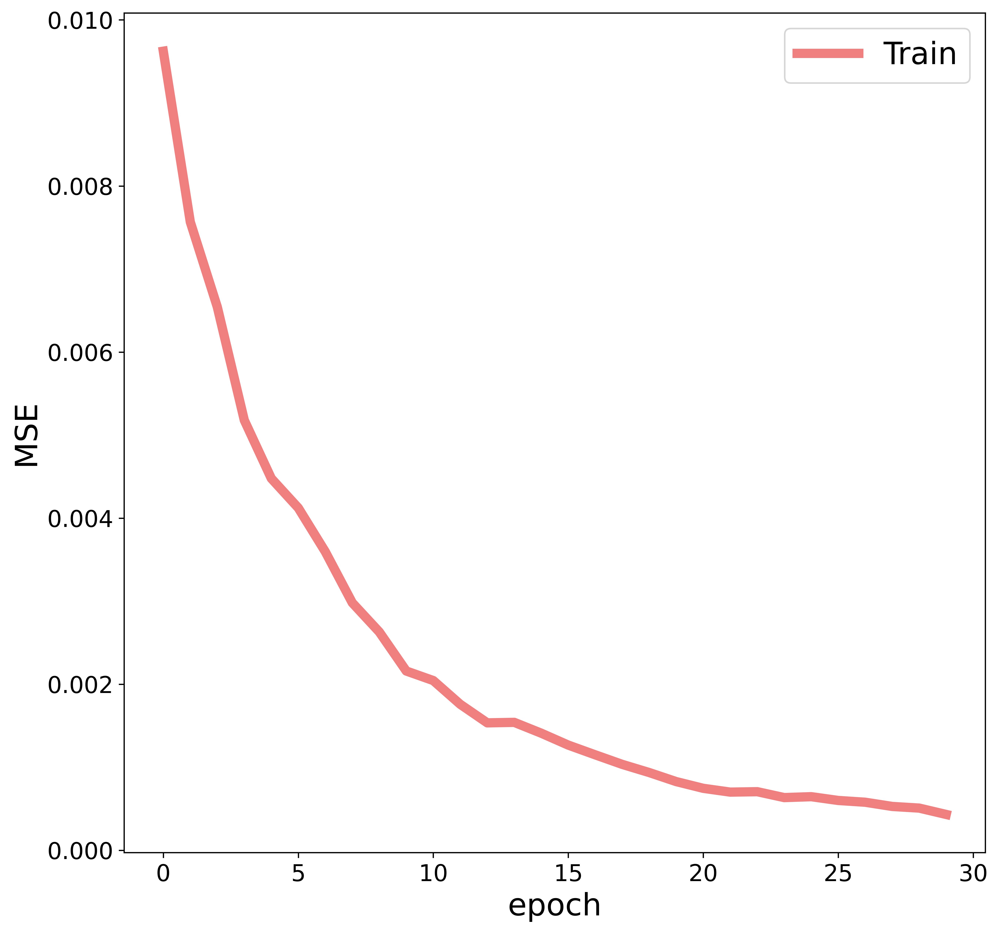

efficientnet-phospho-B-15
Fold: 1
Training on  4 GPUs!


  0%|          | 0/30 [00:00<?, ?it/s]

------------------------------------------------------------
Epoch 1/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.2208 Acc: 0.6473 F1: 0.5448 Recall: 0.5505 AUC: 0.6469


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.2520 Acc: 0.4963 F1: 0.4749 recall: 0.4492 AUC: 0.7397
------------------------------------------------------------

------------------------------------------------------------
Epoch 2/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0915 Acc: 0.9303 F1: 0.7396 Recall: 0.7491 AUC: 0.9302


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.3711 Acc: 0.4975 F1: 0.2353 recall: 0.1515 AUC: 0.8479
------------------------------------------------------------

------------------------------------------------------------
Epoch 3/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0319 Acc: 0.9746 F1: 0.8828 Recall: 0.8935 AUC: 0.9746


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.4727 Acc: 0.4967 F1: 0.0594 recall: 0.0310 AUC: 0.9629
------------------------------------------------------------

------------------------------------------------------------
Epoch 4/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0181 Acc: 0.9833 F1: 0.9302 Recall: 0.9374 AUC: 0.9833


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.4158 Acc: 0.5023 F1: 0.1756 recall: 0.0968 AUC: 0.9957
------------------------------------------------------------

------------------------------------------------------------
Epoch 5/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0126 Acc: 0.9884 F1: 0.9502 Recall: 0.9591 AUC: 0.9884


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.1286 Acc: 0.8131 F1: 0.7468 recall: 0.5993 AUC: 0.9980
------------------------------------------------------------

------------------------------------------------------------
Epoch 6/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0093 Acc: 0.9905 F1: 0.9627 Recall: 0.9692 AUC: 0.9905


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0226 Acc: 0.9706 F1: 0.9475 recall: 0.9088 AUC: 0.9988
------------------------------------------------------------

------------------------------------------------------------
Epoch 7/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0073 Acc: 0.9926 F1: 0.9703 Recall: 0.9763 AUC: 0.9926


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0079 Acc: 0.9891 F1: 0.9747 recall: 0.9674 AUC: 0.9991
------------------------------------------------------------

------------------------------------------------------------
Epoch 8/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0056 Acc: 0.9947 F1: 0.9754 Recall: 0.9818 AUC: 0.9947


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0058 Acc: 0.9925 F1: 0.9811 recall: 0.9772 AUC: 0.9995
------------------------------------------------------------

------------------------------------------------------------
Epoch 9/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0047 Acc: 0.9949 F1: 0.9789 Recall: 0.9849 AUC: 0.9949


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0045 Acc: 0.9941 F1: 0.9838 recall: 0.9819 AUC: 0.9997
------------------------------------------------------------

------------------------------------------------------------
Epoch 10/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0040 Acc: 0.9959 F1: 0.9812 Recall: 0.9871 AUC: 0.9959


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0039 Acc: 0.9947 F1: 0.9862 recall: 0.9846 AUC: 0.9998
------------------------------------------------------------

------------------------------------------------------------
Epoch 11/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0034 Acc: 0.9965 F1: 0.9836 Recall: 0.9887 AUC: 0.9965


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0025 Acc: 0.9973 F1: 0.9868 recall: 0.9900 AUC: 0.9999
------------------------------------------------------------

------------------------------------------------------------
Epoch 12/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0030 Acc: 0.9968 F1: 0.9851 Recall: 0.9905 AUC: 0.9968


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0022 Acc: 0.9970 F1: 0.9886 recall: 0.9906 AUC: 0.9999
------------------------------------------------------------

------------------------------------------------------------
Epoch 13/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0023 Acc: 0.9979 F1: 0.9864 Recall: 0.9922 AUC: 0.9979


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0017 Acc: 0.9985 F1: 0.9884 recall: 0.9933 AUC: 0.9999
------------------------------------------------------------

------------------------------------------------------------
Epoch 14/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0024 Acc: 0.9974 F1: 0.9869 Recall: 0.9927 AUC: 0.9974


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0019 Acc: 0.9973 F1: 0.9917 recall: 0.9918 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 15/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0017 Acc: 0.9982 F1: 0.9891 Recall: 0.9941 AUC: 0.9982


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0014 Acc: 0.9988 F1: 0.9913 recall: 0.9942 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 16/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0018 Acc: 0.9981 F1: 0.9894 Recall: 0.9943 AUC: 0.9981


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0011 Acc: 0.9990 F1: 0.9919 recall: 0.9955 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 17/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0014 Acc: 0.9986 F1: 0.9907 Recall: 0.9952 AUC: 0.9986


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0010 Acc: 0.9992 F1: 0.9926 recall: 0.9958 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 18/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0013 Acc: 0.9988 F1: 0.9912 Recall: 0.9958 AUC: 0.9988


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0010 Acc: 0.9990 F1: 0.9923 recall: 0.9959 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 19/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0013 Acc: 0.9988 F1: 0.9914 Recall: 0.9960 AUC: 0.9988


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0009 Acc: 0.9992 F1: 0.9935 recall: 0.9968 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 20/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0012 Acc: 0.9987 F1: 0.9920 Recall: 0.9961 AUC: 0.9987


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0009 Acc: 0.9992 F1: 0.9944 recall: 0.9965 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 21/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0011 Acc: 0.9989 F1: 0.9926 Recall: 0.9966 AUC: 0.9989


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0010 Acc: 0.9991 F1: 0.9952 recall: 0.9960 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 22/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0010 Acc: 0.9989 F1: 0.9929 Recall: 0.9969 AUC: 0.9989


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0010 Acc: 0.9990 F1: 0.9955 recall: 0.9962 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 23/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0008 Acc: 0.9992 F1: 0.9937 Recall: 0.9972 AUC: 0.9992


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0008 Acc: 0.9992 F1: 0.9955 recall: 0.9968 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 24/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0009 Acc: 0.9992 F1: 0.9941 Recall: 0.9972 AUC: 0.9992


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0006 Acc: 0.9993 F1: 0.9948 recall: 0.9976 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 25/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0008 Acc: 0.9992 F1: 0.9941 Recall: 0.9975 AUC: 0.9992


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0007 Acc: 0.9992 F1: 0.9963 recall: 0.9973 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 26/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0007 Acc: 0.9992 F1: 0.9947 Recall: 0.9976 AUC: 0.9992


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0006 Acc: 0.9993 F1: 0.9960 recall: 0.9978 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 27/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0007 Acc: 0.9994 F1: 0.9950 Recall: 0.9978 AUC: 0.9994


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0006 Acc: 0.9993 F1: 0.9960 recall: 0.9977 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 28/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0005 Acc: 0.9995 F1: 0.9951 Recall: 0.9981 AUC: 0.9995


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0005 Acc: 0.9993 F1: 0.9962 recall: 0.9980 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 29/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0006 Acc: 0.9994 F1: 0.9953 Recall: 0.9980 AUC: 0.9994


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0005 Acc: 0.9993 F1: 0.9968 recall: 0.9979 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 30/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0005 Acc: 0.9995 F1: 0.9950 Recall: 0.9983 AUC: 0.9995


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0005 Acc: 0.9993 F1: 0.9972 recall: 0.9978 AUC: 1.0000
------------------------------------------------------------

Training complete in 4m 60s
Best val Loss: 0.000502
Best val Acc: 0.999302


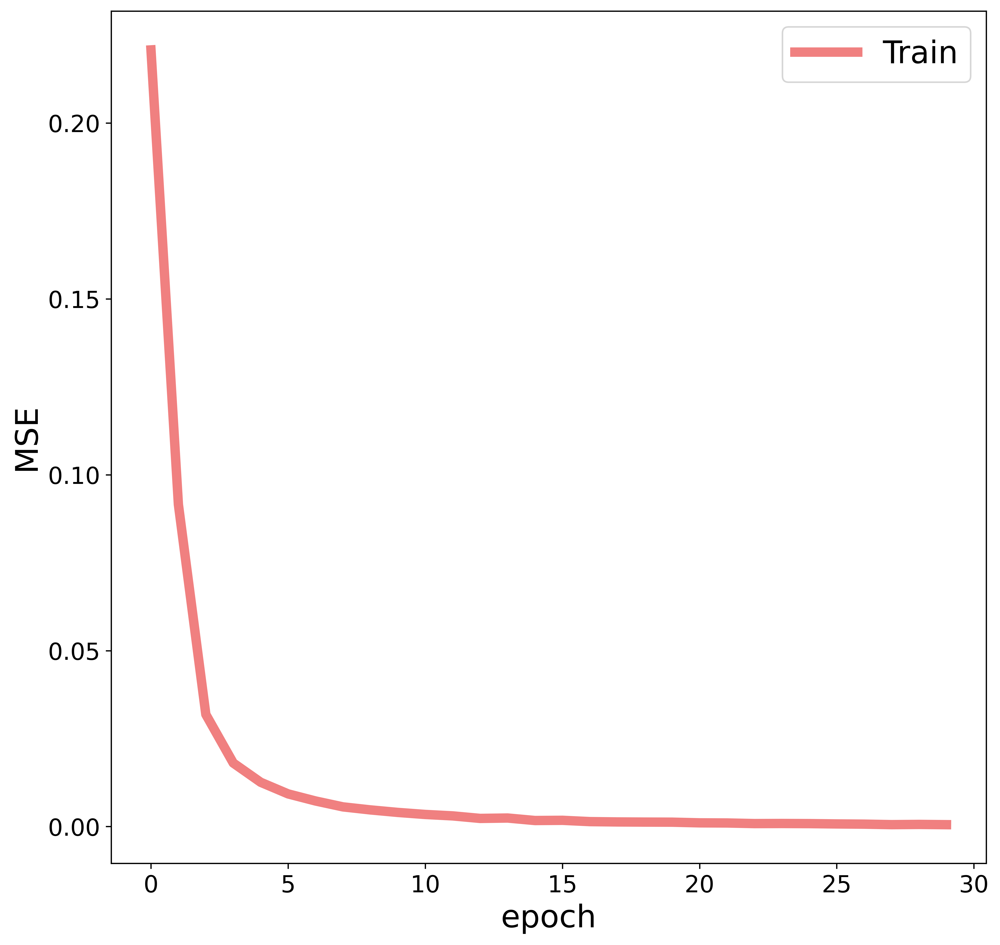

efficientnet-phospho-B-15
Fold: 2
Training on  4 GPUs!


  0%|          | 0/30 [00:00<?, ?it/s]

------------------------------------------------------------
Epoch 1/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.1971 Acc: 0.7090 F1: 0.5829 Recall: 0.5929 AUC: 0.7084


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.2545 Acc: 0.5086 F1: 0.4487 recall: 0.4115 AUC: 0.7488
------------------------------------------------------------

------------------------------------------------------------
Epoch 2/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0837 Acc: 0.9218 F1: 0.7633 Recall: 0.7682 AUC: 0.9218


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.3929 Acc: 0.5081 F1: 0.1845 recall: 0.1114 AUC: 0.8545
------------------------------------------------------------

------------------------------------------------------------
Epoch 3/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0415 Acc: 0.9630 F1: 0.8636 Recall: 0.8720 AUC: 0.9631


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.4627 Acc: 0.5090 F1: 0.0573 recall: 0.0297 AUC: 0.9492
------------------------------------------------------------

------------------------------------------------------------
Epoch 4/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0252 Acc: 0.9765 F1: 0.9102 Recall: 0.9186 AUC: 0.9767


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.3692 Acc: 0.5543 F1: 0.2743 recall: 0.1598 AUC: 0.9909
------------------------------------------------------------

------------------------------------------------------------
Epoch 5/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0178 Acc: 0.9828 F1: 0.9337 Recall: 0.9434 AUC: 0.9829


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.1396 Acc: 0.8072 F1: 0.7490 recall: 0.6018 AUC: 0.9984
------------------------------------------------------------

------------------------------------------------------------
Epoch 6/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0132 Acc: 0.9871 F1: 0.9494 Recall: 0.9570 AUC: 0.9871


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0343 Acc: 0.9508 F1: 0.9270 recall: 0.8719 AUC: 0.9991
------------------------------------------------------------

------------------------------------------------------------
Epoch 7/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0105 Acc: 0.9891 F1: 0.9583 Recall: 0.9671 AUC: 0.9892


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0131 Acc: 0.9818 F1: 0.9636 recall: 0.9431 AUC: 0.9993
------------------------------------------------------------

------------------------------------------------------------
Epoch 8/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0087 Acc: 0.9912 F1: 0.9647 Recall: 0.9726 AUC: 0.9912


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0065 Acc: 0.9924 F1: 0.9747 recall: 0.9696 AUC: 0.9994
------------------------------------------------------------

------------------------------------------------------------
Epoch 9/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0072 Acc: 0.9928 F1: 0.9694 Recall: 0.9776 AUC: 0.9928


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0054 Acc: 0.9934 F1: 0.9793 recall: 0.9750 AUC: 0.9996
------------------------------------------------------------

------------------------------------------------------------
Epoch 10/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0060 Acc: 0.9942 F1: 0.9736 Recall: 0.9812 AUC: 0.9942


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0041 Acc: 0.9955 F1: 0.9822 recall: 0.9812 AUC: 0.9996
------------------------------------------------------------

------------------------------------------------------------
Epoch 11/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0052 Acc: 0.9948 F1: 0.9769 Recall: 0.9838 AUC: 0.9948


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0035 Acc: 0.9964 F1: 0.9844 recall: 0.9846 AUC: 0.9997
------------------------------------------------------------

------------------------------------------------------------
Epoch 12/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0045 Acc: 0.9956 F1: 0.9790 Recall: 0.9859 AUC: 0.9956


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0029 Acc: 0.9968 F1: 0.9864 recall: 0.9872 AUC: 0.9997
------------------------------------------------------------

------------------------------------------------------------
Epoch 13/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0039 Acc: 0.9961 F1: 0.9810 Recall: 0.9879 AUC: 0.9961


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0029 Acc: 0.9967 F1: 0.9885 recall: 0.9872 AUC: 0.9997
------------------------------------------------------------

------------------------------------------------------------
Epoch 14/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0035 Acc: 0.9968 F1: 0.9825 Recall: 0.9892 AUC: 0.9968


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0024 Acc: 0.9972 F1: 0.9894 recall: 0.9895 AUC: 0.9998
------------------------------------------------------------

------------------------------------------------------------
Epoch 15/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0032 Acc: 0.9966 F1: 0.9843 Recall: 0.9900 AUC: 0.9966


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0019 Acc: 0.9980 F1: 0.9897 recall: 0.9921 AUC: 0.9998
------------------------------------------------------------

------------------------------------------------------------
Epoch 16/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0028 Acc: 0.9973 F1: 0.9855 Recall: 0.9913 AUC: 0.9973


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0018 Acc: 0.9980 F1: 0.9911 recall: 0.9923 AUC: 0.9998
------------------------------------------------------------

------------------------------------------------------------
Epoch 17/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0025 Acc: 0.9977 F1: 0.9864 Recall: 0.9923 AUC: 0.9977


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0016 Acc: 0.9983 F1: 0.9921 recall: 0.9933 AUC: 0.9998
------------------------------------------------------------

------------------------------------------------------------
Epoch 18/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0025 Acc: 0.9976 F1: 0.9874 Recall: 0.9924 AUC: 0.9976


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0015 Acc: 0.9983 F1: 0.9931 recall: 0.9935 AUC: 0.9998
------------------------------------------------------------

------------------------------------------------------------
Epoch 19/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0020 Acc: 0.9980 F1: 0.9887 Recall: 0.9936 AUC: 0.9980


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0012 Acc: 0.9987 F1: 0.9921 recall: 0.9954 AUC: 0.9998
------------------------------------------------------------

------------------------------------------------------------
Epoch 20/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0018 Acc: 0.9982 F1: 0.9894 Recall: 0.9943 AUC: 0.9982


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0013 Acc: 0.9986 F1: 0.9932 recall: 0.9954 AUC: 0.9999
------------------------------------------------------------

------------------------------------------------------------
Epoch 21/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0016 Acc: 0.9986 F1: 0.9900 Recall: 0.9949 AUC: 0.9986


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0012 Acc: 0.9987 F1: 0.9942 recall: 0.9955 AUC: 0.9999
------------------------------------------------------------

------------------------------------------------------------
Epoch 22/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0015 Acc: 0.9986 F1: 0.9910 Recall: 0.9952 AUC: 0.9986


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0011 Acc: 0.9987 F1: 0.9947 recall: 0.9957 AUC: 0.9999
------------------------------------------------------------

------------------------------------------------------------
Epoch 23/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0013 Acc: 0.9988 F1: 0.9917 Recall: 0.9959 AUC: 0.9988


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0010 Acc: 0.9987 F1: 0.9951 recall: 0.9963 AUC: 0.9999
------------------------------------------------------------

------------------------------------------------------------
Epoch 24/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0012 Acc: 0.9990 F1: 0.9925 Recall: 0.9962 AUC: 0.9991


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0008 Acc: 0.9990 F1: 0.9944 recall: 0.9973 AUC: 0.9999
------------------------------------------------------------

------------------------------------------------------------
Epoch 25/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0011 Acc: 0.9990 F1: 0.9932 Recall: 0.9965 AUC: 0.9990


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0008 Acc: 0.9990 F1: 0.9954 recall: 0.9972 AUC: 0.9999
------------------------------------------------------------

------------------------------------------------------------
Epoch 26/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0010 Acc: 0.9991 F1: 0.9936 Recall: 0.9968 AUC: 0.9991


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0008 Acc: 0.9990 F1: 0.9958 recall: 0.9973 AUC: 0.9999
------------------------------------------------------------

------------------------------------------------------------
Epoch 27/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0010 Acc: 0.9991 F1: 0.9938 Recall: 0.9970 AUC: 0.9991


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0007 Acc: 0.9990 F1: 0.9969 recall: 0.9973 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 28/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0009 Acc: 0.9990 F1: 0.9944 Recall: 0.9972 AUC: 0.9991


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0007 Acc: 0.9992 F1: 0.9969 recall: 0.9975 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 29/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0009 Acc: 0.9990 F1: 0.9946 Recall: 0.9974 AUC: 0.9991


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0005 Acc: 0.9992 F1: 0.9964 recall: 0.9981 AUC: 1.0000
------------------------------------------------------------

------------------------------------------------------------
Epoch 30/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0008 Acc: 0.9992 F1: 0.9945 Recall: 0.9977 AUC: 0.9992


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0004 Acc: 0.9996 F1: 0.9962 recall: 0.9984 AUC: 1.0000
------------------------------------------------------------

Training complete in 5m 19s
Best val Loss: 0.000409
Best val Acc: 0.999581


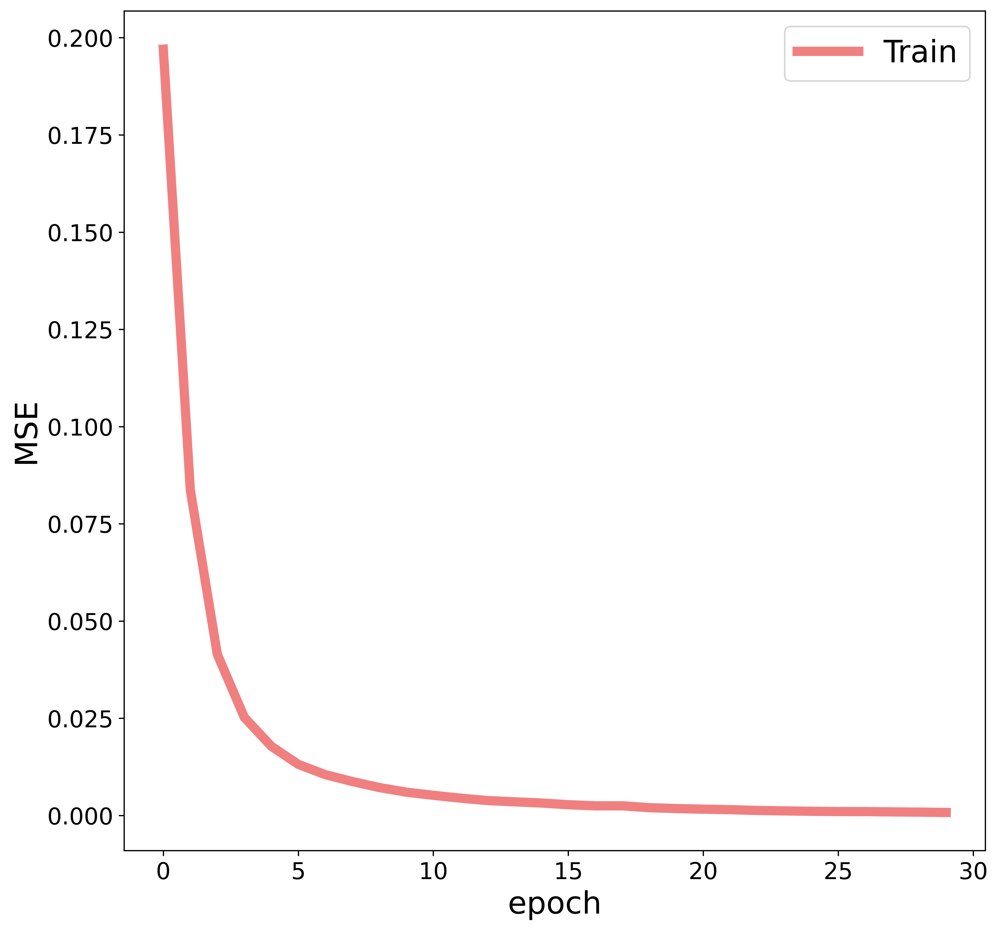

efficientnet-phospho-B-15
Fold: 3
Training on  4 GPUs!


  0%|          | 0/30 [00:00<?, ?it/s]

------------------------------------------------------------
Epoch 1/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.2020 Acc: 0.6913 F1: 0.5856 Recall: 0.6135 AUC: 0.6912


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.2584 Acc: 0.4939 F1: 0.4523 recall: 0.4090 AUC: 0.7581
------------------------------------------------------------

------------------------------------------------------------
Epoch 2/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0780 Acc: 0.9381 F1: 0.7730 Recall: 0.7914 AUC: 0.9380


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.3925 Acc: 0.4938 F1: 0.2047 recall: 0.1264 AUC: 0.8695
------------------------------------------------------------

------------------------------------------------------------
Epoch 3/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0290 Acc: 0.9771 F1: 0.8903 Recall: 0.9057 AUC: 0.9770


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.4661 Acc: 0.4941 F1: 0.0767 recall: 0.0405 AUC: 0.9707
------------------------------------------------------------

------------------------------------------------------------
Epoch 4/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0154 Acc: 0.9863 F1: 0.9344 Recall: 0.9480 AUC: 0.9863


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.3668 Acc: 0.5371 F1: 0.2902 recall: 0.1708 AUC: 0.9976
------------------------------------------------------------

------------------------------------------------------------
Epoch 5/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0098 Acc: 0.9909 F1: 0.9549 Recall: 0.9656 AUC: 0.9908


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.1028 Acc: 0.8472 F1: 0.8048 recall: 0.6775 AUC: 0.9993
------------------------------------------------------------

------------------------------------------------------------
Epoch 6/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0069 Acc: 0.9933 F1: 0.9666 Recall: 0.9759 AUC: 0.9933


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0177 Acc: 0.9767 F1: 0.9568 recall: 0.9258 AUC: 0.9995
------------------------------------------------------------

------------------------------------------------------------
Epoch 7/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0056 Acc: 0.9944 F1: 0.9724 Recall: 0.9809 AUC: 0.9944


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0074 Acc: 0.9899 F1: 0.9778 recall: 0.9687 AUC: 0.9996
------------------------------------------------------------

------------------------------------------------------------
Epoch 8/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0043 Acc: 0.9959 F1: 0.9769 Recall: 0.9853 AUC: 0.9959


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0046 Acc: 0.9941 F1: 0.9833 recall: 0.9817 AUC: 0.9997
------------------------------------------------------------

------------------------------------------------------------
Epoch 9/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0038 Acc: 0.9962 F1: 0.9800 Recall: 0.9873 AUC: 0.9962


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0035 Acc: 0.9960 F1: 0.9856 recall: 0.9866 AUC: 0.9997
------------------------------------------------------------

------------------------------------------------------------
Epoch 10/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0030 Acc: 0.9968 F1: 0.9823 Recall: 0.9899 AUC: 0.9967


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0029 Acc: 0.9968 F1: 0.9876 recall: 0.9890 AUC: 0.9998
------------------------------------------------------------

------------------------------------------------------------
Epoch 11/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0026 Acc: 0.9976 F1: 0.9844 Recall: 0.9914 AUC: 0.9976


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0026 Acc: 0.9971 F1: 0.9887 recall: 0.9904 AUC: 0.9998
------------------------------------------------------------

------------------------------------------------------------
Epoch 12/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0022 Acc: 0.9979 F1: 0.9856 Recall: 0.9925 AUC: 0.9978


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0023 Acc: 0.9973 F1: 0.9897 recall: 0.9919 AUC: 0.9998
------------------------------------------------------------

------------------------------------------------------------
Epoch 13/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0020 Acc: 0.9979 F1: 0.9869 Recall: 0.9933 AUC: 0.9979


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0020 Acc: 0.9980 F1: 0.9896 recall: 0.9934 AUC: 0.9999
------------------------------------------------------------

------------------------------------------------------------
Epoch 14/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0016 Acc: 0.9985 F1: 0.9884 Recall: 0.9946 AUC: 0.9985


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0021 Acc: 0.9976 F1: 0.9915 recall: 0.9928 AUC: 0.9999
------------------------------------------------------------

------------------------------------------------------------
Epoch 15/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0016 Acc: 0.9986 F1: 0.9891 Recall: 0.9946 AUC: 0.9986


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0019 Acc: 0.9978 F1: 0.9924 recall: 0.9936 AUC: 0.9999
------------------------------------------------------------

------------------------------------------------------------
Epoch 16/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0013 Acc: 0.9988 F1: 0.9904 Recall: 0.9956 AUC: 0.9988


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0016 Acc: 0.9982 F1: 0.9920 recall: 0.9949 AUC: 0.9999
------------------------------------------------------------

------------------------------------------------------------
Epoch 17/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0012 Acc: 0.9989 F1: 0.9908 Recall: 0.9957 AUC: 0.9989


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0015 Acc: 0.9983 F1: 0.9925 recall: 0.9955 AUC: 0.9999
------------------------------------------------------------

------------------------------------------------------------
Epoch 18/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0010 Acc: 0.9991 F1: 0.9920 Recall: 0.9965 AUC: 0.9991


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0016 Acc: 0.9982 F1: 0.9942 recall: 0.9948 AUC: 0.9999
------------------------------------------------------------

------------------------------------------------------------
Epoch 19/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0010 Acc: 0.9990 F1: 0.9921 Recall: 0.9967 AUC: 0.9990


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0014 Acc: 0.9983 F1: 0.9938 recall: 0.9958 AUC: 0.9999
------------------------------------------------------------

------------------------------------------------------------
Epoch 20/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0010 Acc: 0.9991 F1: 0.9928 Recall: 0.9967 AUC: 0.9991


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0014 Acc: 0.9985 F1: 0.9942 recall: 0.9961 AUC: 0.9999
------------------------------------------------------------

------------------------------------------------------------
Epoch 21/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0009 Acc: 0.9993 F1: 0.9929 Recall: 0.9972 AUC: 0.9993


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0013 Acc: 0.9985 F1: 0.9946 recall: 0.9960 AUC: 0.9999
------------------------------------------------------------

------------------------------------------------------------
Epoch 22/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0007 Acc: 0.9995 F1: 0.9937 Recall: 0.9976 AUC: 0.9995


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0012 Acc: 0.9987 F1: 0.9951 recall: 0.9964 AUC: 0.9999
------------------------------------------------------------

------------------------------------------------------------
Epoch 23/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0007 Acc: 0.9993 F1: 0.9947 Recall: 0.9975 AUC: 0.9993


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0012 Acc: 0.9987 F1: 0.9945 recall: 0.9965 AUC: 0.9999
------------------------------------------------------------

------------------------------------------------------------
Epoch 24/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0007 Acc: 0.9994 F1: 0.9943 Recall: 0.9978 AUC: 0.9994


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0013 Acc: 0.9987 F1: 0.9953 recall: 0.9964 AUC: 0.9999
------------------------------------------------------------

------------------------------------------------------------
Epoch 25/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0006 Acc: 0.9994 F1: 0.9946 Recall: 0.9981 AUC: 0.9994


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0011 Acc: 0.9987 F1: 0.9955 recall: 0.9967 AUC: 0.9999
------------------------------------------------------------

------------------------------------------------------------
Epoch 26/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0005 Acc: 0.9994 F1: 0.9948 Recall: 0.9982 AUC: 0.9994


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0011 Acc: 0.9987 F1: 0.9958 recall: 0.9969 AUC: 0.9999
------------------------------------------------------------

------------------------------------------------------------
Epoch 27/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0006 Acc: 0.9995 F1: 0.9949 Recall: 0.9981 AUC: 0.9995


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0012 Acc: 0.9986 F1: 0.9968 recall: 0.9965 AUC: 0.9999
------------------------------------------------------------

------------------------------------------------------------
Epoch 28/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0005 Acc: 0.9995 F1: 0.9960 Recall: 0.9983 AUC: 0.9995


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0010 Acc: 0.9986 F1: 0.9952 recall: 0.9972 AUC: 0.9999
------------------------------------------------------------

------------------------------------------------------------
Epoch 29/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0005 Acc: 0.9996 F1: 0.9952 Recall: 0.9984 AUC: 0.9996


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0009 Acc: 0.9987 F1: 0.9961 recall: 0.9973 AUC: 0.9999
------------------------------------------------------------

------------------------------------------------------------
Epoch 30/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0004 Acc: 0.9997 F1: 0.9960 Recall: 0.9985 AUC: 0.9997


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0009 Acc: 0.9987 F1: 0.9964 recall: 0.9974 AUC: 0.9999
------------------------------------------------------------

Training complete in 5m 7s
Best val Loss: 0.000939
Best val Acc: 0.998744


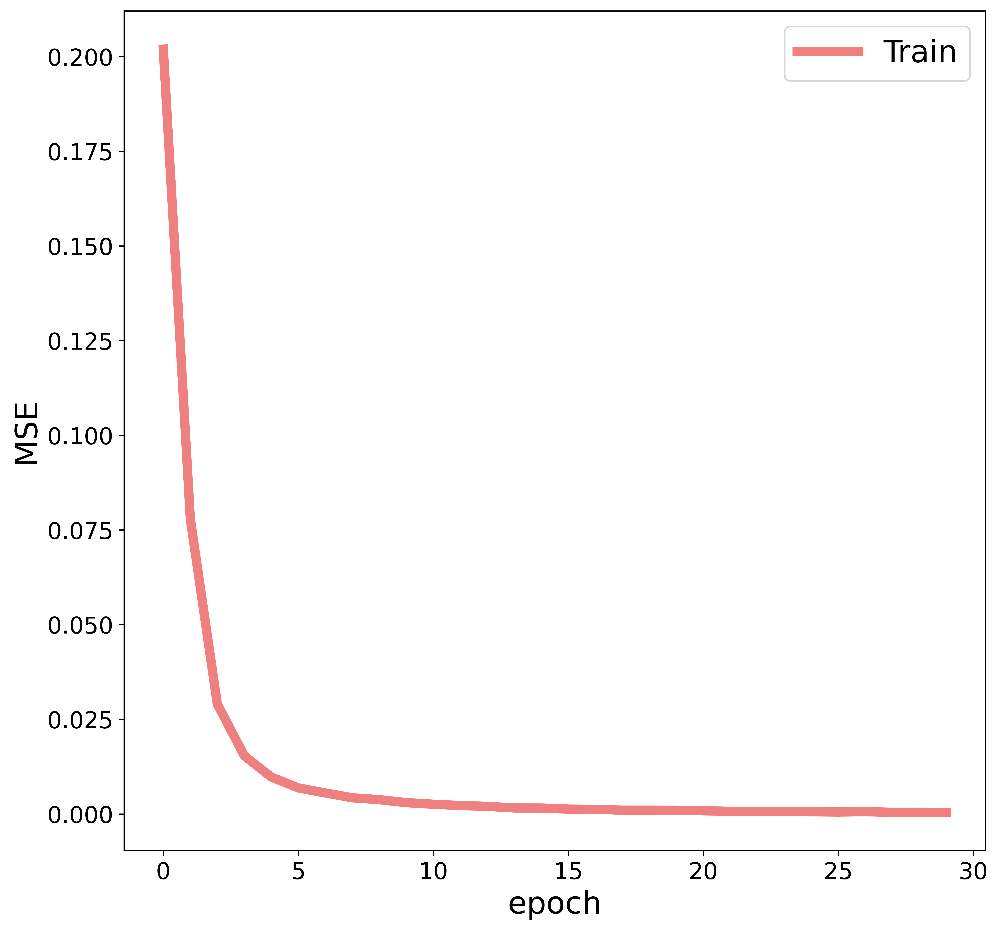

efficientnet-phospho-B-15
Fold: 4
Training on  4 GPUs!


  0%|          | 0/30 [00:00<?, ?it/s]

------------------------------------------------------------
Epoch 1/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.2032 Acc: 0.7054 F1: 0.5735 Recall: 0.5856 AUC: 0.7051


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.2606 Acc: 0.5004 F1: 0.4414 recall: 0.3958 AUC: 0.6001
------------------------------------------------------------

------------------------------------------------------------
Epoch 2/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0905 Acc: 0.9199 F1: 0.7441 Recall: 0.7507 AUC: 0.9199


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.4237 Acc: 0.5004 F1: 0.1420 recall: 0.0825 AUC: 0.8633
------------------------------------------------------------

------------------------------------------------------------
Epoch 3/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0413 Acc: 0.9642 F1: 0.8614 Recall: 0.8689 AUC: 0.9643


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.4889 Acc: 0.5005 F1: 0.0211 recall: 0.0107 AUC: 0.9867
------------------------------------------------------------

------------------------------------------------------------
Epoch 4/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0251 Acc: 0.9768 F1: 0.9114 Recall: 0.9187 AUC: 0.9768


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.4806 Acc: 0.5007 F1: 0.0375 recall: 0.0191 AUC: 0.9947
------------------------------------------------------------

------------------------------------------------------------
Epoch 5/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0173 Acc: 0.9828 F1: 0.9373 Recall: 0.9441 AUC: 0.9828


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.2499 Acc: 0.6466 F1: 0.5195 recall: 0.3523 AUC: 0.9966
------------------------------------------------------------

------------------------------------------------------------
Epoch 6/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0129 Acc: 0.9868 F1: 0.9520 Recall: 0.9588 AUC: 0.9868


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0452 Acc: 0.9388 F1: 0.9012 recall: 0.8267 AUC: 0.9973
------------------------------------------------------------

------------------------------------------------------------
Epoch 7/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0103 Acc: 0.9892 F1: 0.9616 Recall: 0.9675 AUC: 0.9892


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0145 Acc: 0.9819 F1: 0.9617 recall: 0.9406 AUC: 0.9976
------------------------------------------------------------

------------------------------------------------------------
Epoch 8/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0082 Acc: 0.9910 F1: 0.9692 Recall: 0.9737 AUC: 0.9910


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0087 Acc: 0.9901 F1: 0.9732 recall: 0.9676 AUC: 0.9980
------------------------------------------------------------

------------------------------------------------------------
Epoch 9/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0068 Acc: 0.9923 F1: 0.9729 Recall: 0.9785 AUC: 0.9923


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0070 Acc: 0.9923 F1: 0.9772 recall: 0.9752 AUC: 0.9984
------------------------------------------------------------

------------------------------------------------------------
Epoch 10/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0060 Acc: 0.9937 F1: 0.9767 Recall: 0.9817 AUC: 0.9937


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0061 Acc: 0.9929 F1: 0.9805 recall: 0.9784 AUC: 0.9987
------------------------------------------------------------

------------------------------------------------------------
Epoch 11/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0049 Acc: 0.9948 F1: 0.9800 Recall: 0.9842 AUC: 0.9948


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0054 Acc: 0.9943 F1: 0.9821 recall: 0.9820 AUC: 0.9989
------------------------------------------------------------

------------------------------------------------------------
Epoch 12/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0044 Acc: 0.9956 F1: 0.9815 Recall: 0.9862 AUC: 0.9956


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0047 Acc: 0.9948 F1: 0.9835 recall: 0.9851 AUC: 0.9990
------------------------------------------------------------

------------------------------------------------------------
Epoch 13/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0039 Acc: 0.9960 F1: 0.9835 Recall: 0.9874 AUC: 0.9960


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0042 Acc: 0.9958 F1: 0.9845 recall: 0.9873 AUC: 0.9992
------------------------------------------------------------

------------------------------------------------------------
Epoch 14/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0034 Acc: 0.9964 F1: 0.9848 Recall: 0.9895 AUC: 0.9964


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0041 Acc: 0.9953 F1: 0.9871 recall: 0.9867 AUC: 0.9994
------------------------------------------------------------

------------------------------------------------------------
Epoch 15/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0031 Acc: 0.9968 F1: 0.9861 Recall: 0.9902 AUC: 0.9968


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0037 Acc: 0.9960 F1: 0.9878 recall: 0.9884 AUC: 0.9995
------------------------------------------------------------

------------------------------------------------------------
Epoch 16/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0026 Acc: 0.9975 F1: 0.9876 Recall: 0.9915 AUC: 0.9975


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0033 Acc: 0.9968 F1: 0.9883 recall: 0.9902 AUC: 0.9995
------------------------------------------------------------

------------------------------------------------------------
Epoch 17/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0024 Acc: 0.9975 F1: 0.9884 Recall: 0.9925 AUC: 0.9975


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0033 Acc: 0.9967 F1: 0.9894 recall: 0.9893 AUC: 0.9996
------------------------------------------------------------

------------------------------------------------------------
Epoch 18/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0021 Acc: 0.9978 F1: 0.9889 Recall: 0.9932 AUC: 0.9978


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0031 Acc: 0.9968 F1: 0.9906 recall: 0.9899 AUC: 0.9996
------------------------------------------------------------

------------------------------------------------------------
Epoch 19/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0018 Acc: 0.9982 F1: 0.9899 Recall: 0.9936 AUC: 0.9982


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0027 Acc: 0.9969 F1: 0.9899 recall: 0.9918 AUC: 0.9997
------------------------------------------------------------

------------------------------------------------------------
Epoch 20/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0017 Acc: 0.9984 F1: 0.9903 Recall: 0.9942 AUC: 0.9984


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0025 Acc: 0.9969 F1: 0.9909 recall: 0.9922 AUC: 0.9997
------------------------------------------------------------

------------------------------------------------------------
Epoch 21/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0015 Acc: 0.9986 F1: 0.9909 Recall: 0.9948 AUC: 0.9986


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0023 Acc: 0.9971 F1: 0.9915 recall: 0.9927 AUC: 0.9998
------------------------------------------------------------

------------------------------------------------------------
Epoch 22/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0013 Acc: 0.9989 F1: 0.9916 Recall: 0.9953 AUC: 0.9989


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0020 Acc: 0.9979 F1: 0.9906 recall: 0.9941 AUC: 0.9998
------------------------------------------------------------

------------------------------------------------------------
Epoch 23/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0013 Acc: 0.9989 F1: 0.9917 Recall: 0.9956 AUC: 0.9989


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0019 Acc: 0.9979 F1: 0.9916 recall: 0.9944 AUC: 0.9998
------------------------------------------------------------

------------------------------------------------------------
Epoch 24/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0011 Acc: 0.9991 F1: 0.9923 Recall: 0.9962 AUC: 0.9991


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0019 Acc: 0.9978 F1: 0.9923 recall: 0.9943 AUC: 0.9998
------------------------------------------------------------

------------------------------------------------------------
Epoch 25/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0009 Acc: 0.9992 F1: 0.9929 Recall: 0.9967 AUC: 0.9992


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0018 Acc: 0.9979 F1: 0.9934 recall: 0.9943 AUC: 0.9999
------------------------------------------------------------

------------------------------------------------------------
Epoch 26/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0009 Acc: 0.9991 F1: 0.9935 Recall: 0.9967 AUC: 0.9991


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0017 Acc: 0.9980 F1: 0.9939 recall: 0.9944 AUC: 0.9999
------------------------------------------------------------

------------------------------------------------------------
Epoch 27/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0008 Acc: 0.9993 F1: 0.9936 Recall: 0.9969 AUC: 0.9993


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0016 Acc: 0.9980 F1: 0.9932 recall: 0.9953 AUC: 0.9999
------------------------------------------------------------

------------------------------------------------------------
Epoch 28/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0008 Acc: 0.9992 F1: 0.9936 Recall: 0.9972 AUC: 0.9992


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0016 Acc: 0.9980 F1: 0.9944 recall: 0.9952 AUC: 0.9999
------------------------------------------------------------

------------------------------------------------------------
Epoch 29/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0007 Acc: 0.9994 F1: 0.9941 Recall: 0.9974 AUC: 0.9994


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0015 Acc: 0.9980 F1: 0.9947 recall: 0.9954 AUC: 0.9999
------------------------------------------------------------

------------------------------------------------------------
Epoch 30/30


  0%|          | 0/111 [00:00<?, ?it/s]

train Loss: 0.0007 Acc: 0.9993 F1: 0.9949 Recall: 0.9976 AUC: 0.9993


  0%|          | 0/28 [00:00<?, ?it/s]

validation Loss: 0.0015 Acc: 0.9980 F1: 0.9950 recall: 0.9951 AUC: 0.9999
------------------------------------------------------------

Training complete in 5m 3s
Best val Loss: 0.001502
Best val Acc: 0.998047


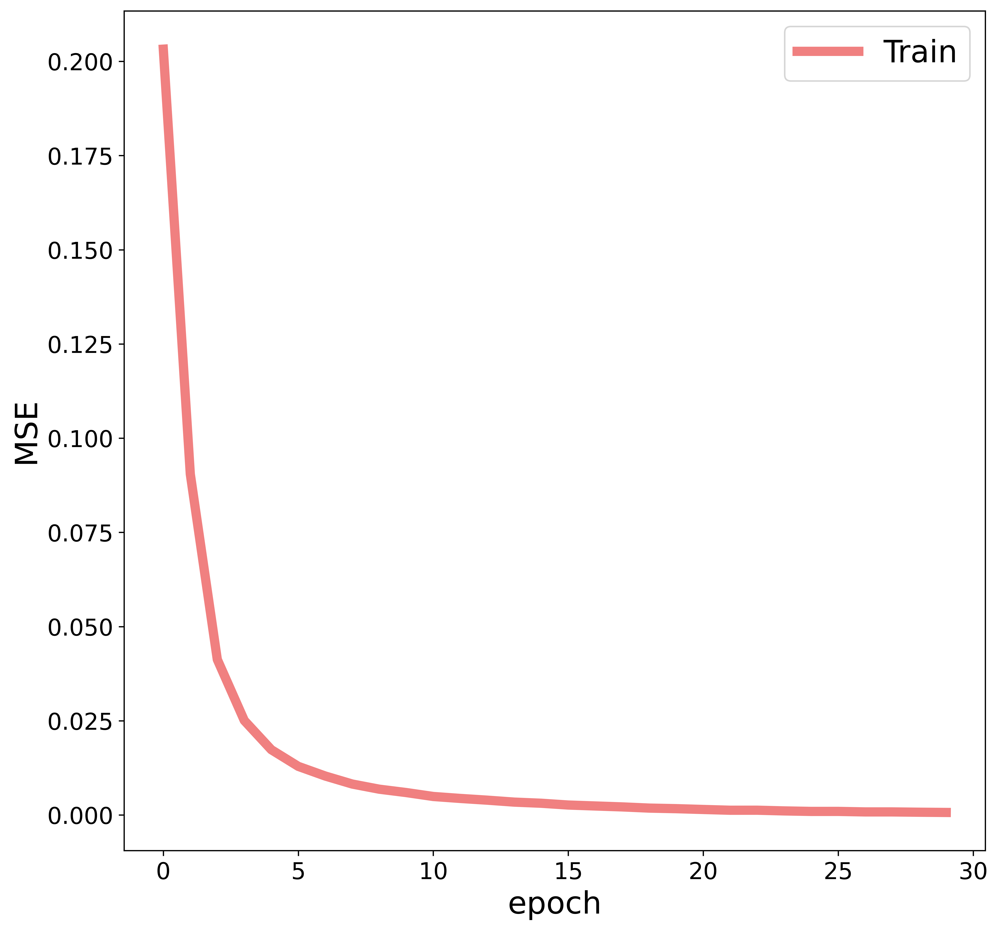

efficientnet-phospho-B-15
Kfold_cv_mean: 0.999051


In [29]:
#batch = 256 #mse계산용
best_acc_sum = 0
for fold, (tr_idx, val_idx) in enumerate(kf2.split(dfr2)):
    
    print('Fold: {:d}'.format(fold))
    BATCH_SIZE = 256

    train_set = data_utils.TensorDataset(torch.tensor(dfr2[tr_idx]), torch.tensor(dfl2[tr_idx]))
    valid_set = data_utils.TensorDataset(torch.tensor(dfr2[val_idx]),torch.tensor(dfl2[val_idx]))


    train_loader = data_utils.DataLoader(train_set, batch_size=BATCH_SIZE, pin_memory=True, shuffle=True)
    valid_loader = data_utils.DataLoader(valid_set, batch_size=BATCH_SIZE, shuffle=True)


    dataloaders = {'train':train_loader,'valid':valid_loader}
    dataset_sizes = {x: len(dataloaders[x]) for x in ['train', 'valid']}
    
    model = train_model(model, optimizer, scheduler, 20)
    
    plt.figure(figsize=[10,10],dpi = 600)
    #plt.plot(Trainfprs, Traintprs, label= 'Train')
    plt.plot(TrainLossdata, label= 'Train', color='lightcoral', linewidth = 6)
    #plt.plot([1,0],[1,0],"--")
    plt.xlabel("epoch",fontsize =20)
    plt.ylabel("MSE",fontsize =20)
    plt.rc('xtick', labelsize=15)  
    plt.rc('ytick', labelsize=15) 
    plt.legend(fontsize = 20)
    plt.xlim()
    plt.ylim()
    plt.savefig("High resoltion.png",dpi=600)
    plt.show()
    best_acc_sum += best_acc
    del model
    allele = 'phospho-B-15'
    model = EfficientNet.from_name(f'efficientnet-{allele}')
    criterion = nn.MSELoss()
    optimizer = RAdam(model.parameters())
    scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=50, gamma=0.1)
    
    save_dir = f'saved_model2/Efficientnet_{fold+1}_kernel_3_ms_only_same_ratio'
    writer = SummaryWriter(save_dir)
    
    if fold == 4:
        print('Kfold_cv_mean: {:2f}'.format(best_acc_sum/(fold+1)))

In [36]:
#batch_size=16인경우
save_dir = f'Weight/batch_50_SYTratiodata_randomstate{random_state}/saved_model5/Efficientnet_0_kernel_3_ms_only_same_ratio'
writer = SummaryWriter(save_dir)

Fold: 0
Training on  4 GPUs!


  0%|          | 0/50 [00:00<?, ?it/s]

------------------------------------------------------------
Epoch 1/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.5902 Acc: 0.6841 Recall: 0.6605 AUC: 0.7516


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.5163 Acc: 0.7612 recall: 0.7271 AUC: 0.8253
------------------------------------------------------------

------------------------------------------------------------
Epoch 2/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.4905 Acc: 0.7719 Recall: 0.7478 AUC: 0.8441


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4851 Acc: 0.7747 recall: 0.7286 AUC: 0.8508
------------------------------------------------------------

------------------------------------------------------------
Epoch 3/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.4583 Acc: 0.7924 Recall: 0.7773 AUC: 0.8663


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4746 Acc: 0.7778 recall: 0.7733 AUC: 0.8556
------------------------------------------------------------

------------------------------------------------------------
Epoch 4/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.4421 Acc: 0.8015 Recall: 0.7893 AUC: 0.8758


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4651 Acc: 0.7881 recall: 0.7728 AUC: 0.8616
------------------------------------------------------------

------------------------------------------------------------
Epoch 5/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.4270 Acc: 0.8082 Recall: 0.7947 AUC: 0.8855


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4659 Acc: 0.7857 recall: 0.7944 AUC: 0.8621
------------------------------------------------------------

------------------------------------------------------------
Epoch 6/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.4157 Acc: 0.8156 Recall: 0.8024 AUC: 0.8919


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4630 Acc: 0.7895 recall: 0.7734 AUC: 0.8640
------------------------------------------------------------

------------------------------------------------------------
Epoch 7/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.4076 Acc: 0.8194 Recall: 0.8079 AUC: 0.8963


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4584 Acc: 0.7929 recall: 0.7752 AUC: 0.8672
------------------------------------------------------------

------------------------------------------------------------
Epoch 8/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.4017 Acc: 0.8253 Recall: 0.8144 AUC: 0.9003


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4552 Acc: 0.7950 recall: 0.7827 AUC: 0.8697
------------------------------------------------------------

------------------------------------------------------------
Epoch 9/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3939 Acc: 0.8265 Recall: 0.8197 AUC: 0.9036


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4559 Acc: 0.7941 recall: 0.7690 AUC: 0.8697
------------------------------------------------------------

------------------------------------------------------------
Epoch 10/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3881 Acc: 0.8304 Recall: 0.8211 AUC: 0.9066


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4597 Acc: 0.7952 recall: 0.7505 AUC: 0.8693
------------------------------------------------------------

------------------------------------------------------------
Epoch 11/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3834 Acc: 0.8357 Recall: 0.8294 AUC: 0.9092


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4552 Acc: 0.7935 recall: 0.7571 AUC: 0.8713
------------------------------------------------------------

------------------------------------------------------------
Epoch 12/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3785 Acc: 0.8355 Recall: 0.8282 AUC: 0.9114


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4561 Acc: 0.7963 recall: 0.8124 AUC: 0.8713
------------------------------------------------------------

------------------------------------------------------------
Epoch 13/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3737 Acc: 0.8375 Recall: 0.8283 AUC: 0.9139


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4555 Acc: 0.7941 recall: 0.7879 AUC: 0.8715
------------------------------------------------------------

------------------------------------------------------------
Epoch 14/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3711 Acc: 0.8392 Recall: 0.8365 AUC: 0.9150


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4524 Acc: 0.7953 recall: 0.7767 AUC: 0.8729
------------------------------------------------------------

------------------------------------------------------------
Epoch 15/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3690 Acc: 0.8398 Recall: 0.8345 AUC: 0.9160


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4589 Acc: 0.7913 recall: 0.8079 AUC: 0.8700
------------------------------------------------------------

------------------------------------------------------------
Epoch 16/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3648 Acc: 0.8422 Recall: 0.8364 AUC: 0.9190


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4574 Acc: 0.7916 recall: 0.8019 AUC: 0.8723
------------------------------------------------------------

------------------------------------------------------------
Epoch 17/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3611 Acc: 0.8435 Recall: 0.8386 AUC: 0.9198


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4595 Acc: 0.7926 recall: 0.7921 AUC: 0.8702
------------------------------------------------------------

------------------------------------------------------------
Epoch 18/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3583 Acc: 0.8415 Recall: 0.8379 AUC: 0.9207


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4567 Acc: 0.7956 recall: 0.7906 AUC: 0.8714
------------------------------------------------------------

------------------------------------------------------------
Epoch 19/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3565 Acc: 0.8466 Recall: 0.8427 AUC: 0.9217


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4597 Acc: 0.7941 recall: 0.7690 AUC: 0.8718
------------------------------------------------------------

------------------------------------------------------------
Epoch 20/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3516 Acc: 0.8489 Recall: 0.8468 AUC: 0.9240


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4611 Acc: 0.7883 recall: 0.7904 AUC: 0.8707
------------------------------------------------------------

------------------------------------------------------------
Epoch 21/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3498 Acc: 0.8502 Recall: 0.8447 AUC: 0.9247


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4603 Acc: 0.7922 recall: 0.7726 AUC: 0.8717
------------------------------------------------------------

------------------------------------------------------------
Epoch 22/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3471 Acc: 0.8509 Recall: 0.8461 AUC: 0.9261


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4620 Acc: 0.7932 recall: 0.7555 AUC: 0.8724
------------------------------------------------------------

------------------------------------------------------------
Epoch 23/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3438 Acc: 0.8518 Recall: 0.8490 AUC: 0.9274


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4615 Acc: 0.7921 recall: 0.8117 AUC: 0.8731
------------------------------------------------------------

------------------------------------------------------------
Epoch 24/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3394 Acc: 0.8549 Recall: 0.8510 AUC: 0.9293


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4634 Acc: 0.7935 recall: 0.7837 AUC: 0.8711
------------------------------------------------------------

------------------------------------------------------------
Epoch 25/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3381 Acc: 0.8549 Recall: 0.8515 AUC: 0.9305


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4670 Acc: 0.7890 recall: 0.7838 AUC: 0.8693
------------------------------------------------------------

------------------------------------------------------------
Epoch 26/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3372 Acc: 0.8554 Recall: 0.8500 AUC: 0.9303


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4742 Acc: 0.7921 recall: 0.7487 AUC: 0.8706
------------------------------------------------------------

------------------------------------------------------------
Epoch 27/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3367 Acc: 0.8562 Recall: 0.8512 AUC: 0.9304


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4660 Acc: 0.7934 recall: 0.7859 AUC: 0.8707
------------------------------------------------------------

------------------------------------------------------------
Epoch 28/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3322 Acc: 0.8564 Recall: 0.8512 AUC: 0.9323


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4686 Acc: 0.7956 recall: 0.8003 AUC: 0.8704
------------------------------------------------------------

------------------------------------------------------------
Epoch 29/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3312 Acc: 0.8585 Recall: 0.8527 AUC: 0.9327


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4673 Acc: 0.7936 recall: 0.7925 AUC: 0.8707
------------------------------------------------------------

------------------------------------------------------------
Epoch 30/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3307 Acc: 0.8607 Recall: 0.8581 AUC: 0.9336


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4795 Acc: 0.7847 recall: 0.8295 AUC: 0.8710
------------------------------------------------------------

------------------------------------------------------------
Epoch 31/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3276 Acc: 0.8604 Recall: 0.8560 AUC: 0.9343


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4747 Acc: 0.7921 recall: 0.8107 AUC: 0.8705
------------------------------------------------------------

------------------------------------------------------------
Epoch 32/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3227 Acc: 0.8621 Recall: 0.8587 AUC: 0.9361


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4748 Acc: 0.7904 recall: 0.7913 AUC: 0.8695
------------------------------------------------------------

------------------------------------------------------------
Epoch 33/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3246 Acc: 0.8594 Recall: 0.8544 AUC: 0.9354


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4745 Acc: 0.7892 recall: 0.7949 AUC: 0.8688
------------------------------------------------------------

------------------------------------------------------------
Epoch 34/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3226 Acc: 0.8620 Recall: 0.8579 AUC: 0.9362


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4755 Acc: 0.7940 recall: 0.7826 AUC: 0.8693
------------------------------------------------------------

------------------------------------------------------------
Epoch 35/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3217 Acc: 0.8619 Recall: 0.8565 AUC: 0.9365


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4741 Acc: 0.7967 recall: 0.7932 AUC: 0.8712
------------------------------------------------------------

------------------------------------------------------------
Epoch 36/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3200 Acc: 0.8629 Recall: 0.8609 AUC: 0.9374


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4741 Acc: 0.7915 recall: 0.7869 AUC: 0.8709
------------------------------------------------------------

------------------------------------------------------------
Epoch 37/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3171 Acc: 0.8669 Recall: 0.8643 AUC: 0.9386


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4852 Acc: 0.7897 recall: 0.8137 AUC: 0.8688
------------------------------------------------------------

------------------------------------------------------------
Epoch 38/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3121 Acc: 0.8673 Recall: 0.8630 AUC: 0.9403


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4799 Acc: 0.7916 recall: 0.7748 AUC: 0.8694
------------------------------------------------------------

------------------------------------------------------------
Epoch 39/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3138 Acc: 0.8665 Recall: 0.8641 AUC: 0.9397


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4831 Acc: 0.7901 recall: 0.7565 AUC: 0.8697
------------------------------------------------------------

------------------------------------------------------------
Epoch 40/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3114 Acc: 0.8685 Recall: 0.8649 AUC: 0.9407


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4882 Acc: 0.7920 recall: 0.7656 AUC: 0.8688
------------------------------------------------------------

------------------------------------------------------------
Epoch 41/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3139 Acc: 0.8664 Recall: 0.8605 AUC: 0.9401


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4808 Acc: 0.7936 recall: 0.7936 AUC: 0.8688
------------------------------------------------------------

------------------------------------------------------------
Epoch 42/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3104 Acc: 0.8693 Recall: 0.8653 AUC: 0.9410


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4824 Acc: 0.7948 recall: 0.8058 AUC: 0.8696
------------------------------------------------------------

------------------------------------------------------------
Epoch 43/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3107 Acc: 0.8679 Recall: 0.8641 AUC: 0.9409


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4866 Acc: 0.7886 recall: 0.7697 AUC: 0.8676
------------------------------------------------------------

------------------------------------------------------------
Epoch 44/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3089 Acc: 0.8684 Recall: 0.8648 AUC: 0.9417


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4863 Acc: 0.7907 recall: 0.7653 AUC: 0.8673
------------------------------------------------------------

------------------------------------------------------------
Epoch 45/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3048 Acc: 0.8715 Recall: 0.8670 AUC: 0.9432


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4883 Acc: 0.7907 recall: 0.7977 AUC: 0.8689
------------------------------------------------------------

------------------------------------------------------------
Epoch 46/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3048 Acc: 0.8701 Recall: 0.8668 AUC: 0.9432


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4801 Acc: 0.7918 recall: 0.7961 AUC: 0.8701
------------------------------------------------------------

------------------------------------------------------------
Epoch 47/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3022 Acc: 0.8718 Recall: 0.8706 AUC: 0.9442


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4908 Acc: 0.7931 recall: 0.7664 AUC: 0.8688
------------------------------------------------------------

------------------------------------------------------------
Epoch 48/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3055 Acc: 0.8724 Recall: 0.8668 AUC: 0.9430


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4900 Acc: 0.7915 recall: 0.7717 AUC: 0.8683
------------------------------------------------------------

------------------------------------------------------------
Epoch 49/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3015 Acc: 0.8722 Recall: 0.8685 AUC: 0.9445


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4920 Acc: 0.7896 recall: 0.7597 AUC: 0.8678
------------------------------------------------------------

------------------------------------------------------------
Epoch 50/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3013 Acc: 0.8723 Recall: 0.8686 AUC: 0.9446


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4844 Acc: 0.7941 recall: 0.7989 AUC: 0.8692
------------------------------------------------------------

Training complete in 17m 50s
Best val Loss: 0.452385
Best val Acc: 0.796702


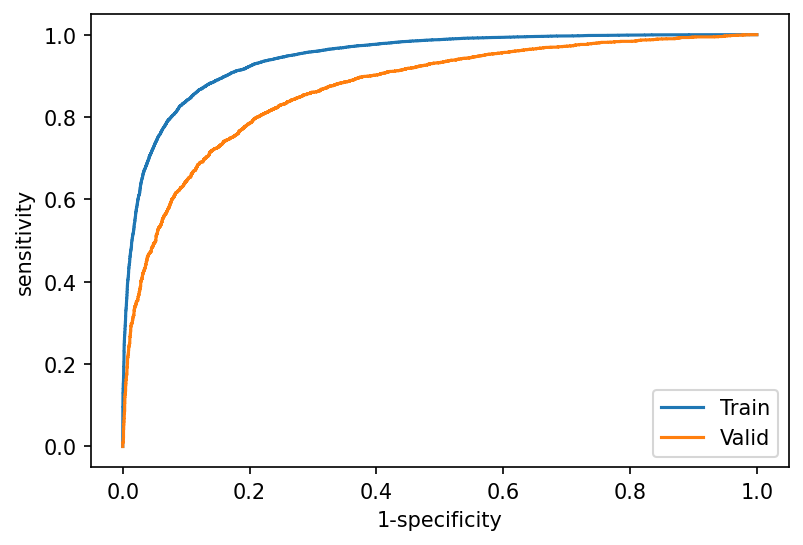

efficientnet-phospho-B-15
Fold: 1
Training on  4 GPUs!


  0%|          | 0/50 [00:00<?, ?it/s]

------------------------------------------------------------
Epoch 1/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.5913 Acc: 0.6874 Recall: 0.6784 AUC: 0.7525


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.5346 Acc: 0.7521 recall: 0.7685 AUC: 0.8160
------------------------------------------------------------

------------------------------------------------------------
Epoch 2/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.4961 Acc: 0.7683 Recall: 0.7530 AUC: 0.8400


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4893 Acc: 0.7763 recall: 0.8107 AUC: 0.8496
------------------------------------------------------------

------------------------------------------------------------
Epoch 3/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.4631 Acc: 0.7876 Recall: 0.7747 AUC: 0.8634


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4749 Acc: 0.7813 recall: 0.8010 AUC: 0.8574
------------------------------------------------------------

------------------------------------------------------------
Epoch 4/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.4419 Acc: 0.7993 Recall: 0.7886 AUC: 0.8765


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4623 Acc: 0.7878 recall: 0.7659 AUC: 0.8635
------------------------------------------------------------

------------------------------------------------------------
Epoch 5/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.4313 Acc: 0.8065 Recall: 0.7963 AUC: 0.8827


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4622 Acc: 0.7848 recall: 0.8160 AUC: 0.8656
------------------------------------------------------------

------------------------------------------------------------
Epoch 6/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.4201 Acc: 0.8133 Recall: 0.8054 AUC: 0.8893


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4549 Acc: 0.7901 recall: 0.7779 AUC: 0.8680
------------------------------------------------------------

------------------------------------------------------------
Epoch 7/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.4099 Acc: 0.8157 Recall: 0.8074 AUC: 0.8947


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4542 Acc: 0.7955 recall: 0.7856 AUC: 0.8691
------------------------------------------------------------

------------------------------------------------------------
Epoch 8/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.4047 Acc: 0.8201 Recall: 0.8129 AUC: 0.8983


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4520 Acc: 0.7937 recall: 0.7895 AUC: 0.8706
------------------------------------------------------------

------------------------------------------------------------
Epoch 9/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3966 Acc: 0.8235 Recall: 0.8131 AUC: 0.9025


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4537 Acc: 0.7937 recall: 0.7564 AUC: 0.8710
------------------------------------------------------------

------------------------------------------------------------
Epoch 10/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3924 Acc: 0.8264 Recall: 0.8182 AUC: 0.9043


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4533 Acc: 0.7871 recall: 0.7930 AUC: 0.8705
------------------------------------------------------------

------------------------------------------------------------
Epoch 11/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3846 Acc: 0.8318 Recall: 0.8260 AUC: 0.9081


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4560 Acc: 0.7915 recall: 0.7785 AUC: 0.8700
------------------------------------------------------------

------------------------------------------------------------
Epoch 12/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3819 Acc: 0.8326 Recall: 0.8250 AUC: 0.9095


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4520 Acc: 0.7960 recall: 0.7820 AUC: 0.8723
------------------------------------------------------------

------------------------------------------------------------
Epoch 13/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3776 Acc: 0.8348 Recall: 0.8283 AUC: 0.9116


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4589 Acc: 0.7976 recall: 0.7667 AUC: 0.8696
------------------------------------------------------------

------------------------------------------------------------
Epoch 14/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3723 Acc: 0.8375 Recall: 0.8325 AUC: 0.9146


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4593 Acc: 0.7931 recall: 0.7579 AUC: 0.8707
------------------------------------------------------------

------------------------------------------------------------
Epoch 15/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3710 Acc: 0.8383 Recall: 0.8328 AUC: 0.9150


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4615 Acc: 0.7932 recall: 0.7496 AUC: 0.8718
------------------------------------------------------------

------------------------------------------------------------
Epoch 16/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3672 Acc: 0.8417 Recall: 0.8371 AUC: 0.9173


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4586 Acc: 0.7927 recall: 0.7602 AUC: 0.8723
------------------------------------------------------------

------------------------------------------------------------
Epoch 17/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3656 Acc: 0.8401 Recall: 0.8338 AUC: 0.9174


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4596 Acc: 0.7921 recall: 0.7568 AUC: 0.8716
------------------------------------------------------------

------------------------------------------------------------
Epoch 18/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3607 Acc: 0.8446 Recall: 0.8399 AUC: 0.9197


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4631 Acc: 0.7914 recall: 0.8170 AUC: 0.8713
------------------------------------------------------------

------------------------------------------------------------
Epoch 19/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3567 Acc: 0.8446 Recall: 0.8394 AUC: 0.9216


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4606 Acc: 0.7927 recall: 0.7850 AUC: 0.8710
------------------------------------------------------------

------------------------------------------------------------
Epoch 20/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3549 Acc: 0.8467 Recall: 0.8395 AUC: 0.9224


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4632 Acc: 0.7930 recall: 0.7665 AUC: 0.8718
------------------------------------------------------------

------------------------------------------------------------
Epoch 21/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3506 Acc: 0.8495 Recall: 0.8478 AUC: 0.9245


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4595 Acc: 0.7970 recall: 0.7916 AUC: 0.8722
------------------------------------------------------------

------------------------------------------------------------
Epoch 22/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3485 Acc: 0.8480 Recall: 0.8454 AUC: 0.9253


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4571 Acc: 0.7946 recall: 0.7969 AUC: 0.8731
------------------------------------------------------------

------------------------------------------------------------
Epoch 23/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3489 Acc: 0.8472 Recall: 0.8418 AUC: 0.9251


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4594 Acc: 0.7958 recall: 0.7792 AUC: 0.8722
------------------------------------------------------------

------------------------------------------------------------
Epoch 24/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3465 Acc: 0.8506 Recall: 0.8460 AUC: 0.9262


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4730 Acc: 0.7908 recall: 0.7505 AUC: 0.8705
------------------------------------------------------------

------------------------------------------------------------
Epoch 25/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3431 Acc: 0.8507 Recall: 0.8453 AUC: 0.9276


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4633 Acc: 0.7956 recall: 0.7902 AUC: 0.8709
------------------------------------------------------------

------------------------------------------------------------
Epoch 26/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3409 Acc: 0.8543 Recall: 0.8520 AUC: 0.9288


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4635 Acc: 0.7964 recall: 0.8054 AUC: 0.8720
------------------------------------------------------------

------------------------------------------------------------
Epoch 27/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3416 Acc: 0.8544 Recall: 0.8507 AUC: 0.9283


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4657 Acc: 0.7972 recall: 0.8372 AUC: 0.8732
------------------------------------------------------------

------------------------------------------------------------
Epoch 28/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3377 Acc: 0.8548 Recall: 0.8507 AUC: 0.9300


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4809 Acc: 0.7914 recall: 0.8368 AUC: 0.8717
------------------------------------------------------------

------------------------------------------------------------
Epoch 29/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3359 Acc: 0.8570 Recall: 0.8556 AUC: 0.9310


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4739 Acc: 0.7952 recall: 0.7947 AUC: 0.8704
------------------------------------------------------------

------------------------------------------------------------
Epoch 30/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3345 Acc: 0.8558 Recall: 0.8516 AUC: 0.9312


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4663 Acc: 0.7960 recall: 0.7918 AUC: 0.8718
------------------------------------------------------------

------------------------------------------------------------
Epoch 31/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3358 Acc: 0.8554 Recall: 0.8508 AUC: 0.9311


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4684 Acc: 0.7992 recall: 0.7946 AUC: 0.8720
------------------------------------------------------------

------------------------------------------------------------
Epoch 32/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3301 Acc: 0.8558 Recall: 0.8528 AUC: 0.9332


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4712 Acc: 0.7991 recall: 0.8025 AUC: 0.8711
------------------------------------------------------------

------------------------------------------------------------
Epoch 33/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3311 Acc: 0.8567 Recall: 0.8547 AUC: 0.9333


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4734 Acc: 0.7942 recall: 0.7790 AUC: 0.8709
------------------------------------------------------------

------------------------------------------------------------
Epoch 34/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3271 Acc: 0.8596 Recall: 0.8528 AUC: 0.9345


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4659 Acc: 0.7969 recall: 0.7997 AUC: 0.8729
------------------------------------------------------------

------------------------------------------------------------
Epoch 35/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3246 Acc: 0.8614 Recall: 0.8623 AUC: 0.9353


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4711 Acc: 0.7954 recall: 0.7875 AUC: 0.8722
------------------------------------------------------------

------------------------------------------------------------
Epoch 36/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3262 Acc: 0.8587 Recall: 0.8542 AUC: 0.9348


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4683 Acc: 0.7977 recall: 0.8015 AUC: 0.8714
------------------------------------------------------------

------------------------------------------------------------
Epoch 37/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3222 Acc: 0.8626 Recall: 0.8608 AUC: 0.9365


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4750 Acc: 0.7948 recall: 0.8134 AUC: 0.8705
------------------------------------------------------------

------------------------------------------------------------
Epoch 38/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3190 Acc: 0.8637 Recall: 0.8608 AUC: 0.9377


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4757 Acc: 0.7965 recall: 0.8013 AUC: 0.8710
------------------------------------------------------------

------------------------------------------------------------
Epoch 39/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3224 Acc: 0.8605 Recall: 0.8568 AUC: 0.9363


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4731 Acc: 0.7973 recall: 0.7977 AUC: 0.8717
------------------------------------------------------------

------------------------------------------------------------
Epoch 40/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3163 Acc: 0.8639 Recall: 0.8609 AUC: 0.9388


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4714 Acc: 0.7973 recall: 0.7985 AUC: 0.8708
------------------------------------------------------------

------------------------------------------------------------
Epoch 41/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3182 Acc: 0.8625 Recall: 0.8581 AUC: 0.9381


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4798 Acc: 0.7965 recall: 0.7850 AUC: 0.8706
------------------------------------------------------------

------------------------------------------------------------
Epoch 42/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3182 Acc: 0.8633 Recall: 0.8613 AUC: 0.9380


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4776 Acc: 0.7953 recall: 0.7895 AUC: 0.8698
------------------------------------------------------------

------------------------------------------------------------
Epoch 43/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3190 Acc: 0.8611 Recall: 0.8569 AUC: 0.9376


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4807 Acc: 0.7967 recall: 0.7575 AUC: 0.8714
------------------------------------------------------------

------------------------------------------------------------
Epoch 44/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3172 Acc: 0.8636 Recall: 0.8635 AUC: 0.9390


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4836 Acc: 0.7927 recall: 0.8016 AUC: 0.8697
------------------------------------------------------------

------------------------------------------------------------
Epoch 45/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3134 Acc: 0.8664 Recall: 0.8652 AUC: 0.9398


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4751 Acc: 0.7975 recall: 0.8169 AUC: 0.8713
------------------------------------------------------------

------------------------------------------------------------
Epoch 46/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3113 Acc: 0.8680 Recall: 0.8661 AUC: 0.9407


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4751 Acc: 0.8006 recall: 0.8015 AUC: 0.8703
------------------------------------------------------------

------------------------------------------------------------
Epoch 47/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3116 Acc: 0.8657 Recall: 0.8649 AUC: 0.9406


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4874 Acc: 0.7989 recall: 0.8066 AUC: 0.8706
------------------------------------------------------------

------------------------------------------------------------
Epoch 48/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3114 Acc: 0.8659 Recall: 0.8643 AUC: 0.9405


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4866 Acc: 0.7954 recall: 0.7920 AUC: 0.8679
------------------------------------------------------------

------------------------------------------------------------
Epoch 49/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3100 Acc: 0.8645 Recall: 0.8603 AUC: 0.9410


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4800 Acc: 0.7990 recall: 0.7889 AUC: 0.8728
------------------------------------------------------------

------------------------------------------------------------
Epoch 50/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3081 Acc: 0.8665 Recall: 0.8639 AUC: 0.9419


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4793 Acc: 0.8001 recall: 0.8029 AUC: 0.8718
------------------------------------------------------------

Training complete in 17m 53s
Best val Loss: 0.451993
Best val Acc: 0.800596


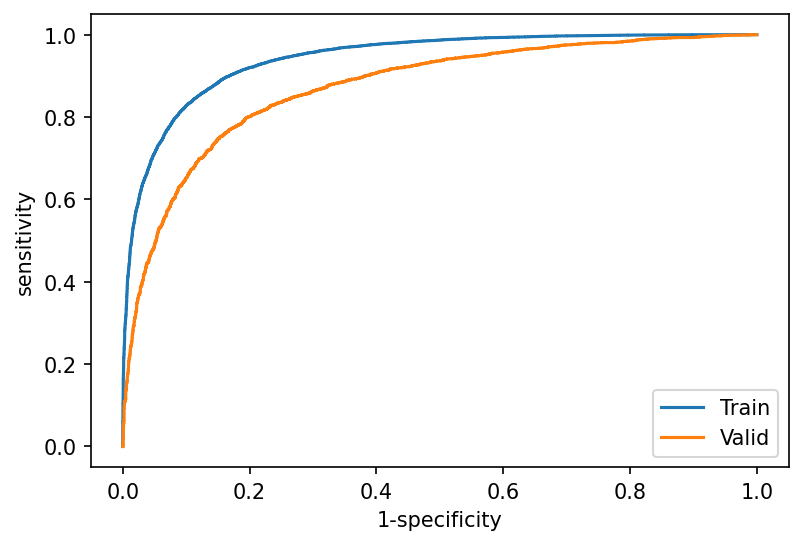

efficientnet-phospho-B-15
Fold: 2
Training on  4 GPUs!


  0%|          | 0/50 [00:00<?, ?it/s]

------------------------------------------------------------
Epoch 1/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.5895 Acc: 0.6927 Recall: 0.6703 AUC: 0.7550


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.5313 Acc: 0.7511 recall: 0.8069 AUC: 0.8207
------------------------------------------------------------

------------------------------------------------------------
Epoch 2/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.4998 Acc: 0.7681 Recall: 0.7540 AUC: 0.8378


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4851 Acc: 0.7741 recall: 0.8083 AUC: 0.8520
------------------------------------------------------------

------------------------------------------------------------
Epoch 3/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.4653 Acc: 0.7889 Recall: 0.7778 AUC: 0.8624


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4739 Acc: 0.7870 recall: 0.7120 AUC: 0.8643
------------------------------------------------------------

------------------------------------------------------------
Epoch 4/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.4406 Acc: 0.8012 Recall: 0.7898 AUC: 0.8771


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4580 Acc: 0.7904 recall: 0.7871 AUC: 0.8668
------------------------------------------------------------

------------------------------------------------------------
Epoch 5/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.4274 Acc: 0.8117 Recall: 0.8011 AUC: 0.8852


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4596 Acc: 0.7920 recall: 0.7318 AUC: 0.8710
------------------------------------------------------------

------------------------------------------------------------
Epoch 6/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.4162 Acc: 0.8150 Recall: 0.8059 AUC: 0.8914


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4499 Acc: 0.8011 recall: 0.7917 AUC: 0.8717
------------------------------------------------------------

------------------------------------------------------------
Epoch 7/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.4064 Acc: 0.8235 Recall: 0.8146 AUC: 0.8967


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4471 Acc: 0.8047 recall: 0.8079 AUC: 0.8736
------------------------------------------------------------

------------------------------------------------------------
Epoch 8/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3983 Acc: 0.8242 Recall: 0.8177 AUC: 0.9014


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4478 Acc: 0.8028 recall: 0.7773 AUC: 0.8745
------------------------------------------------------------

------------------------------------------------------------
Epoch 9/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3936 Acc: 0.8278 Recall: 0.8198 AUC: 0.9039


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4477 Acc: 0.8019 recall: 0.8094 AUC: 0.8747
------------------------------------------------------------

------------------------------------------------------------
Epoch 10/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3859 Acc: 0.8337 Recall: 0.8236 AUC: 0.9076


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4644 Acc: 0.7901 recall: 0.8628 AUC: 0.8754
------------------------------------------------------------

------------------------------------------------------------
Epoch 11/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3819 Acc: 0.8329 Recall: 0.8238 AUC: 0.9097


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4465 Acc: 0.8066 recall: 0.8010 AUC: 0.8765
------------------------------------------------------------

------------------------------------------------------------
Epoch 12/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3754 Acc: 0.8377 Recall: 0.8285 AUC: 0.9129


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4498 Acc: 0.8024 recall: 0.8218 AUC: 0.8752
------------------------------------------------------------

------------------------------------------------------------
Epoch 13/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3687 Acc: 0.8382 Recall: 0.8321 AUC: 0.9162


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4504 Acc: 0.8027 recall: 0.7764 AUC: 0.8759
------------------------------------------------------------

------------------------------------------------------------
Epoch 14/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3670 Acc: 0.8401 Recall: 0.8335 AUC: 0.9167


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4486 Acc: 0.8026 recall: 0.7897 AUC: 0.8761
------------------------------------------------------------

------------------------------------------------------------
Epoch 15/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3636 Acc: 0.8427 Recall: 0.8317 AUC: 0.9185


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4526 Acc: 0.8038 recall: 0.8245 AUC: 0.8762
------------------------------------------------------------

------------------------------------------------------------
Epoch 16/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3604 Acc: 0.8443 Recall: 0.8374 AUC: 0.9200


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4493 Acc: 0.8033 recall: 0.8078 AUC: 0.8768
------------------------------------------------------------

------------------------------------------------------------
Epoch 17/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3553 Acc: 0.8470 Recall: 0.8433 AUC: 0.9225


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4529 Acc: 0.8060 recall: 0.7926 AUC: 0.8756
------------------------------------------------------------

------------------------------------------------------------
Epoch 18/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3515 Acc: 0.8491 Recall: 0.8441 AUC: 0.9242


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4545 Acc: 0.8063 recall: 0.7993 AUC: 0.8749
------------------------------------------------------------

------------------------------------------------------------
Epoch 19/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3521 Acc: 0.8465 Recall: 0.8446 AUC: 0.9238


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4559 Acc: 0.8044 recall: 0.8253 AUC: 0.8748
------------------------------------------------------------

------------------------------------------------------------
Epoch 20/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3452 Acc: 0.8523 Recall: 0.8460 AUC: 0.9268


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4685 Acc: 0.8016 recall: 0.7411 AUC: 0.8761
------------------------------------------------------------

------------------------------------------------------------
Epoch 21/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3409 Acc: 0.8521 Recall: 0.8484 AUC: 0.9289


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4616 Acc: 0.8050 recall: 0.7548 AUC: 0.8762
------------------------------------------------------------

------------------------------------------------------------
Epoch 22/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3396 Acc: 0.8533 Recall: 0.8484 AUC: 0.9292


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4611 Acc: 0.8075 recall: 0.7997 AUC: 0.8746
------------------------------------------------------------

------------------------------------------------------------
Epoch 23/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3382 Acc: 0.8543 Recall: 0.8493 AUC: 0.9299


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4638 Acc: 0.8049 recall: 0.7747 AUC: 0.8762
------------------------------------------------------------

------------------------------------------------------------
Epoch 24/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3367 Acc: 0.8546 Recall: 0.8491 AUC: 0.9303


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4596 Acc: 0.8036 recall: 0.8202 AUC: 0.8768
------------------------------------------------------------

------------------------------------------------------------
Epoch 25/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3343 Acc: 0.8544 Recall: 0.8518 AUC: 0.9313


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4592 Acc: 0.8049 recall: 0.7990 AUC: 0.8756
------------------------------------------------------------

------------------------------------------------------------
Epoch 26/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3307 Acc: 0.8575 Recall: 0.8541 AUC: 0.9330


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4592 Acc: 0.8088 recall: 0.8041 AUC: 0.8771
------------------------------------------------------------

------------------------------------------------------------
Epoch 27/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3290 Acc: 0.8588 Recall: 0.8537 AUC: 0.9337


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4603 Acc: 0.8067 recall: 0.7921 AUC: 0.8762
------------------------------------------------------------

------------------------------------------------------------
Epoch 28/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3258 Acc: 0.8602 Recall: 0.8541 AUC: 0.9349


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4699 Acc: 0.8071 recall: 0.7704 AUC: 0.8763
------------------------------------------------------------

------------------------------------------------------------
Epoch 29/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3272 Acc: 0.8595 Recall: 0.8563 AUC: 0.9344


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4621 Acc: 0.8047 recall: 0.7873 AUC: 0.8752
------------------------------------------------------------

------------------------------------------------------------
Epoch 30/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3242 Acc: 0.8608 Recall: 0.8567 AUC: 0.9356


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4731 Acc: 0.8061 recall: 0.7951 AUC: 0.8747
------------------------------------------------------------

------------------------------------------------------------
Epoch 31/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3251 Acc: 0.8594 Recall: 0.8550 AUC: 0.9354


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4674 Acc: 0.8056 recall: 0.7847 AUC: 0.8750
------------------------------------------------------------

------------------------------------------------------------
Epoch 32/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3232 Acc: 0.8615 Recall: 0.8558 AUC: 0.9364


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4687 Acc: 0.8072 recall: 0.7917 AUC: 0.8747
------------------------------------------------------------

------------------------------------------------------------
Epoch 33/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3200 Acc: 0.8641 Recall: 0.8633 AUC: 0.9374


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4692 Acc: 0.8046 recall: 0.8147 AUC: 0.8752
------------------------------------------------------------

------------------------------------------------------------
Epoch 34/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3171 Acc: 0.8626 Recall: 0.8619 AUC: 0.9386


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4783 Acc: 0.8042 recall: 0.7629 AUC: 0.8754
------------------------------------------------------------

------------------------------------------------------------
Epoch 35/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3135 Acc: 0.8653 Recall: 0.8610 AUC: 0.9399


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4755 Acc: 0.8021 recall: 0.7824 AUC: 0.8739
------------------------------------------------------------

------------------------------------------------------------
Epoch 36/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3120 Acc: 0.8646 Recall: 0.8614 AUC: 0.9404


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4868 Acc: 0.8040 recall: 0.7755 AUC: 0.8746
------------------------------------------------------------

------------------------------------------------------------
Epoch 37/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3128 Acc: 0.8657 Recall: 0.8598 AUC: 0.9402


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4818 Acc: 0.8029 recall: 0.7965 AUC: 0.8735
------------------------------------------------------------

------------------------------------------------------------
Epoch 38/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3097 Acc: 0.8658 Recall: 0.8633 AUC: 0.9412


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4804 Acc: 0.8043 recall: 0.7969 AUC: 0.8726
------------------------------------------------------------

------------------------------------------------------------
Epoch 39/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3073 Acc: 0.8690 Recall: 0.8649 AUC: 0.9423


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4863 Acc: 0.8065 recall: 0.7886 AUC: 0.8724
------------------------------------------------------------

------------------------------------------------------------
Epoch 40/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3112 Acc: 0.8667 Recall: 0.8637 AUC: 0.9407


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4790 Acc: 0.8053 recall: 0.7959 AUC: 0.8734
------------------------------------------------------------

------------------------------------------------------------
Epoch 41/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3040 Acc: 0.8700 Recall: 0.8666 AUC: 0.9436


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4851 Acc: 0.8009 recall: 0.8113 AUC: 0.8721
------------------------------------------------------------

------------------------------------------------------------
Epoch 42/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3069 Acc: 0.8685 Recall: 0.8659 AUC: 0.9424


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4805 Acc: 0.8008 recall: 0.8196 AUC: 0.8735
------------------------------------------------------------

------------------------------------------------------------
Epoch 43/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3047 Acc: 0.8715 Recall: 0.8712 AUC: 0.9432


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4810 Acc: 0.8048 recall: 0.7852 AUC: 0.8725
------------------------------------------------------------

------------------------------------------------------------
Epoch 44/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3034 Acc: 0.8705 Recall: 0.8675 AUC: 0.9437


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4748 Acc: 0.8040 recall: 0.8197 AUC: 0.8752
------------------------------------------------------------

------------------------------------------------------------
Epoch 45/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3042 Acc: 0.8722 Recall: 0.8706 AUC: 0.9434


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4782 Acc: 0.8048 recall: 0.7793 AUC: 0.8740
------------------------------------------------------------

------------------------------------------------------------
Epoch 46/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3007 Acc: 0.8711 Recall: 0.8708 AUC: 0.9447


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4832 Acc: 0.8065 recall: 0.7957 AUC: 0.8741
------------------------------------------------------------

------------------------------------------------------------
Epoch 47/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.2996 Acc: 0.8727 Recall: 0.8712 AUC: 0.9451


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4889 Acc: 0.8060 recall: 0.7821 AUC: 0.8746
------------------------------------------------------------

------------------------------------------------------------
Epoch 48/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.2968 Acc: 0.8735 Recall: 0.8714 AUC: 0.9464


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4821 Acc: 0.8043 recall: 0.8083 AUC: 0.8727
------------------------------------------------------------

------------------------------------------------------------
Epoch 49/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.2963 Acc: 0.8733 Recall: 0.8719 AUC: 0.9464


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4868 Acc: 0.8042 recall: 0.7842 AUC: 0.8724
------------------------------------------------------------

------------------------------------------------------------
Epoch 50/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.2948 Acc: 0.8758 Recall: 0.8744 AUC: 0.9469


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4887 Acc: 0.7996 recall: 0.8274 AUC: 0.8728
------------------------------------------------------------

Training complete in 17m 51s
Best val Loss: 0.446475
Best val Acc: 0.808844


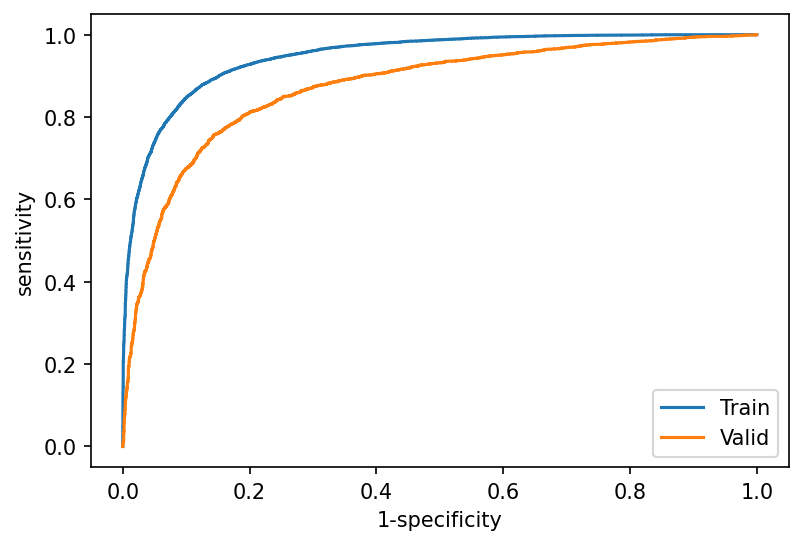

efficientnet-phospho-B-15
Fold: 3
Training on  4 GPUs!


  0%|          | 0/50 [00:00<?, ?it/s]

------------------------------------------------------------
Epoch 1/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.5998 Acc: 0.6748 Recall: 0.6461 AUC: 0.7414


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.5376 Acc: 0.7489 recall: 0.6627 AUC: 0.8145
------------------------------------------------------------

------------------------------------------------------------
Epoch 2/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.5068 Acc: 0.7625 Recall: 0.7420 AUC: 0.8328


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4877 Acc: 0.7774 recall: 0.7838 AUC: 0.8483
------------------------------------------------------------

------------------------------------------------------------
Epoch 3/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.4686 Acc: 0.7855 Recall: 0.7722 AUC: 0.8596


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4766 Acc: 0.7835 recall: 0.7781 AUC: 0.8540
------------------------------------------------------------

------------------------------------------------------------
Epoch 4/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.4458 Acc: 0.7992 Recall: 0.7878 AUC: 0.8742


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4660 Acc: 0.7891 recall: 0.7708 AUC: 0.8626
------------------------------------------------------------

------------------------------------------------------------
Epoch 5/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.4316 Acc: 0.8068 Recall: 0.7998 AUC: 0.8829


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4620 Acc: 0.7951 recall: 0.7444 AUC: 0.8677
------------------------------------------------------------

------------------------------------------------------------
Epoch 6/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.4183 Acc: 0.8142 Recall: 0.8018 AUC: 0.8908


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4539 Acc: 0.7976 recall: 0.8102 AUC: 0.8705
------------------------------------------------------------

------------------------------------------------------------
Epoch 7/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.4088 Acc: 0.8163 Recall: 0.8082 AUC: 0.8955


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4660 Acc: 0.7841 recall: 0.8347 AUC: 0.8696
------------------------------------------------------------

------------------------------------------------------------
Epoch 8/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.4032 Acc: 0.8225 Recall: 0.8147 AUC: 0.8985


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4499 Acc: 0.7973 recall: 0.7842 AUC: 0.8731
------------------------------------------------------------

------------------------------------------------------------
Epoch 9/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3942 Acc: 0.8305 Recall: 0.8263 AUC: 0.9035


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4525 Acc: 0.8007 recall: 0.7618 AUC: 0.8736
------------------------------------------------------------

------------------------------------------------------------
Epoch 10/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3864 Acc: 0.8305 Recall: 0.8216 AUC: 0.9074


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4563 Acc: 0.7999 recall: 0.7819 AUC: 0.8720
------------------------------------------------------------

------------------------------------------------------------
Epoch 11/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3842 Acc: 0.8308 Recall: 0.8246 AUC: 0.9086


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4567 Acc: 0.7956 recall: 0.8317 AUC: 0.8734
------------------------------------------------------------

------------------------------------------------------------
Epoch 12/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3769 Acc: 0.8361 Recall: 0.8293 AUC: 0.9123


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4490 Acc: 0.8054 recall: 0.8086 AUC: 0.8749
------------------------------------------------------------

------------------------------------------------------------
Epoch 13/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3739 Acc: 0.8373 Recall: 0.8311 AUC: 0.9138


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4498 Acc: 0.8017 recall: 0.8085 AUC: 0.8755
------------------------------------------------------------

------------------------------------------------------------
Epoch 14/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3701 Acc: 0.8372 Recall: 0.8304 AUC: 0.9152


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4560 Acc: 0.7980 recall: 0.8213 AUC: 0.8741
------------------------------------------------------------

------------------------------------------------------------
Epoch 15/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3678 Acc: 0.8392 Recall: 0.8352 AUC: 0.9162


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4552 Acc: 0.7981 recall: 0.8102 AUC: 0.8750
------------------------------------------------------------

------------------------------------------------------------
Epoch 16/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3601 Acc: 0.8423 Recall: 0.8372 AUC: 0.9200


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4552 Acc: 0.7995 recall: 0.8232 AUC: 0.8757
------------------------------------------------------------

------------------------------------------------------------
Epoch 17/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3595 Acc: 0.8444 Recall: 0.8388 AUC: 0.9203


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4525 Acc: 0.7991 recall: 0.8273 AUC: 0.8777
------------------------------------------------------------

------------------------------------------------------------
Epoch 18/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3536 Acc: 0.8452 Recall: 0.8407 AUC: 0.9231


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4516 Acc: 0.8025 recall: 0.8034 AUC: 0.8766
------------------------------------------------------------

------------------------------------------------------------
Epoch 19/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3519 Acc: 0.8474 Recall: 0.8411 AUC: 0.9236


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4536 Acc: 0.8025 recall: 0.8221 AUC: 0.8769
------------------------------------------------------------

------------------------------------------------------------
Epoch 20/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3517 Acc: 0.8484 Recall: 0.8437 AUC: 0.9236


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4550 Acc: 0.8033 recall: 0.8064 AUC: 0.8758
------------------------------------------------------------

------------------------------------------------------------
Epoch 21/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3479 Acc: 0.8459 Recall: 0.8410 AUC: 0.9253


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4517 Acc: 0.8037 recall: 0.7843 AUC: 0.8784
------------------------------------------------------------

------------------------------------------------------------
Epoch 22/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3462 Acc: 0.8507 Recall: 0.8479 AUC: 0.9264


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4625 Acc: 0.7950 recall: 0.8371 AUC: 0.8763
------------------------------------------------------------

------------------------------------------------------------
Epoch 23/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3446 Acc: 0.8497 Recall: 0.8446 AUC: 0.9271


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4553 Acc: 0.8029 recall: 0.7912 AUC: 0.8775
------------------------------------------------------------

------------------------------------------------------------
Epoch 24/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3387 Acc: 0.8527 Recall: 0.8496 AUC: 0.9295


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4608 Acc: 0.8005 recall: 0.8148 AUC: 0.8750
------------------------------------------------------------

------------------------------------------------------------
Epoch 25/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3395 Acc: 0.8520 Recall: 0.8471 AUC: 0.9291


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4528 Acc: 0.8037 recall: 0.8003 AUC: 0.8779
------------------------------------------------------------

------------------------------------------------------------
Epoch 26/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3373 Acc: 0.8552 Recall: 0.8501 AUC: 0.9301


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4612 Acc: 0.8037 recall: 0.7931 AUC: 0.8758
------------------------------------------------------------

------------------------------------------------------------
Epoch 27/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3362 Acc: 0.8540 Recall: 0.8522 AUC: 0.9308


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4598 Acc: 0.8002 recall: 0.8184 AUC: 0.8769
------------------------------------------------------------

------------------------------------------------------------
Epoch 28/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3318 Acc: 0.8564 Recall: 0.8546 AUC: 0.9324


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4628 Acc: 0.8005 recall: 0.8162 AUC: 0.8762
------------------------------------------------------------

------------------------------------------------------------
Epoch 29/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3249 Acc: 0.8611 Recall: 0.8596 AUC: 0.9353


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4629 Acc: 0.8055 recall: 0.7895 AUC: 0.8751
------------------------------------------------------------

------------------------------------------------------------
Epoch 30/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3291 Acc: 0.8563 Recall: 0.8541 AUC: 0.9334


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4633 Acc: 0.8018 recall: 0.8034 AUC: 0.8752
------------------------------------------------------------

------------------------------------------------------------
Epoch 31/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3228 Acc: 0.8620 Recall: 0.8618 AUC: 0.9363


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4615 Acc: 0.8003 recall: 0.8171 AUC: 0.8758
------------------------------------------------------------

------------------------------------------------------------
Epoch 32/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3239 Acc: 0.8614 Recall: 0.8588 AUC: 0.9357


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4649 Acc: 0.8023 recall: 0.8000 AUC: 0.8762
------------------------------------------------------------

------------------------------------------------------------
Epoch 33/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3229 Acc: 0.8602 Recall: 0.8554 AUC: 0.9365


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4631 Acc: 0.8005 recall: 0.8021 AUC: 0.8766
------------------------------------------------------------

------------------------------------------------------------
Epoch 34/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3189 Acc: 0.8633 Recall: 0.8608 AUC: 0.9377


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4618 Acc: 0.8057 recall: 0.8107 AUC: 0.8765
------------------------------------------------------------

------------------------------------------------------------
Epoch 35/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3190 Acc: 0.8631 Recall: 0.8593 AUC: 0.9377


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4651 Acc: 0.8030 recall: 0.8116 AUC: 0.8757
------------------------------------------------------------

------------------------------------------------------------
Epoch 36/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3169 Acc: 0.8630 Recall: 0.8613 AUC: 0.9385


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4787 Acc: 0.8036 recall: 0.7734 AUC: 0.8749
------------------------------------------------------------

------------------------------------------------------------
Epoch 37/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3155 Acc: 0.8648 Recall: 0.8599 AUC: 0.9391


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4643 Acc: 0.8028 recall: 0.7939 AUC: 0.8771
------------------------------------------------------------

------------------------------------------------------------
Epoch 38/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3121 Acc: 0.8659 Recall: 0.8635 AUC: 0.9404


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4678 Acc: 0.8023 recall: 0.7987 AUC: 0.8758
------------------------------------------------------------

------------------------------------------------------------
Epoch 39/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3108 Acc: 0.8670 Recall: 0.8657 AUC: 0.9409


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4722 Acc: 0.8006 recall: 0.8088 AUC: 0.8757
------------------------------------------------------------

------------------------------------------------------------
Epoch 40/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3109 Acc: 0.8663 Recall: 0.8639 AUC: 0.9408


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4722 Acc: 0.8007 recall: 0.8166 AUC: 0.8746
------------------------------------------------------------

------------------------------------------------------------
Epoch 41/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3101 Acc: 0.8659 Recall: 0.8624 AUC: 0.9412


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4731 Acc: 0.7965 recall: 0.8206 AUC: 0.8736
------------------------------------------------------------

------------------------------------------------------------
Epoch 42/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3100 Acc: 0.8679 Recall: 0.8678 AUC: 0.9412


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4731 Acc: 0.8065 recall: 0.7877 AUC: 0.8757
------------------------------------------------------------

------------------------------------------------------------
Epoch 43/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3066 Acc: 0.8693 Recall: 0.8670 AUC: 0.9425


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4743 Acc: 0.8014 recall: 0.8007 AUC: 0.8750
------------------------------------------------------------

------------------------------------------------------------
Epoch 44/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3089 Acc: 0.8675 Recall: 0.8639 AUC: 0.9416


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4789 Acc: 0.7952 recall: 0.8181 AUC: 0.8742
------------------------------------------------------------

------------------------------------------------------------
Epoch 45/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3029 Acc: 0.8693 Recall: 0.8687 AUC: 0.9440


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4768 Acc: 0.7973 recall: 0.8196 AUC: 0.8743
------------------------------------------------------------

------------------------------------------------------------
Epoch 46/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3051 Acc: 0.8692 Recall: 0.8652 AUC: 0.9433


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4764 Acc: 0.7986 recall: 0.8112 AUC: 0.8753
------------------------------------------------------------

------------------------------------------------------------
Epoch 47/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3044 Acc: 0.8702 Recall: 0.8681 AUC: 0.9433


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4914 Acc: 0.7998 recall: 0.7675 AUC: 0.8731
------------------------------------------------------------

------------------------------------------------------------
Epoch 48/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3009 Acc: 0.8709 Recall: 0.8687 AUC: 0.9446


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4843 Acc: 0.8005 recall: 0.8092 AUC: 0.8736
------------------------------------------------------------

------------------------------------------------------------
Epoch 49/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.2992 Acc: 0.8730 Recall: 0.8731 AUC: 0.9453


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4814 Acc: 0.8013 recall: 0.8169 AUC: 0.8743
------------------------------------------------------------

------------------------------------------------------------
Epoch 50/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.2969 Acc: 0.8739 Recall: 0.8714 AUC: 0.9462


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4818 Acc: 0.7988 recall: 0.8083 AUC: 0.8749
------------------------------------------------------------

Training complete in 17m 60s
Best val Loss: 0.449036
Best val Acc: 0.806540


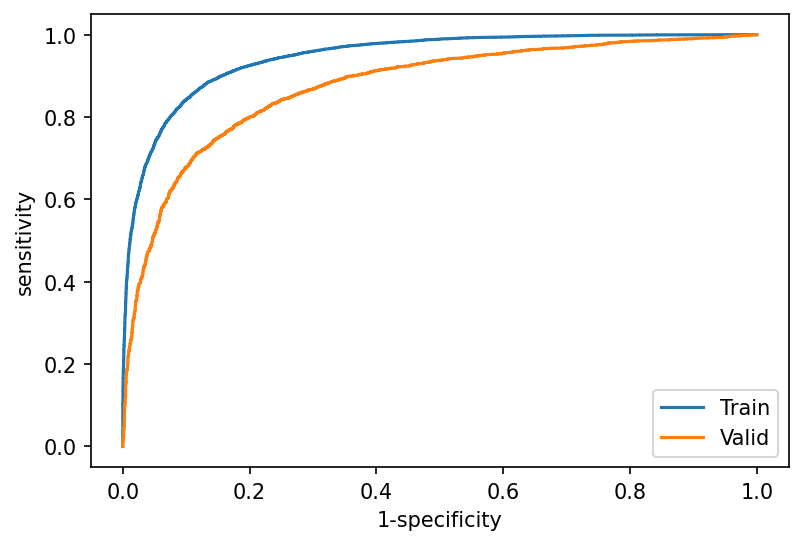

efficientnet-phospho-B-15
Fold: 4
Training on  4 GPUs!


  0%|          | 0/50 [00:00<?, ?it/s]

------------------------------------------------------------
Epoch 1/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.5876 Acc: 0.6907 Recall: 0.6713 AUC: 0.7566


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.5303 Acc: 0.7544 recall: 0.7684 AUC: 0.8181
------------------------------------------------------------

------------------------------------------------------------
Epoch 2/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.4995 Acc: 0.7680 Recall: 0.7500 AUC: 0.8381


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4863 Acc: 0.7778 recall: 0.7813 AUC: 0.8490
------------------------------------------------------------

------------------------------------------------------------
Epoch 3/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.4649 Acc: 0.7862 Recall: 0.7760 AUC: 0.8626


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4731 Acc: 0.7816 recall: 0.8124 AUC: 0.8607
------------------------------------------------------------

------------------------------------------------------------
Epoch 4/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.4411 Acc: 0.8030 Recall: 0.7959 AUC: 0.8773


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4631 Acc: 0.7836 recall: 0.7608 AUC: 0.8626
------------------------------------------------------------

------------------------------------------------------------
Epoch 5/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.4287 Acc: 0.8059 Recall: 0.7967 AUC: 0.8846


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4541 Acc: 0.7916 recall: 0.7829 AUC: 0.8688
------------------------------------------------------------

------------------------------------------------------------
Epoch 6/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.4149 Acc: 0.8142 Recall: 0.8059 AUC: 0.8925


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4563 Acc: 0.7950 recall: 0.7450 AUC: 0.8684
------------------------------------------------------------

------------------------------------------------------------
Epoch 7/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.4051 Acc: 0.8191 Recall: 0.8146 AUC: 0.8979


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4582 Acc: 0.7901 recall: 0.8147 AUC: 0.8712
------------------------------------------------------------

------------------------------------------------------------
Epoch 8/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3976 Acc: 0.8240 Recall: 0.8170 AUC: 0.9014


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4517 Acc: 0.7932 recall: 0.7976 AUC: 0.8718
------------------------------------------------------------

------------------------------------------------------------
Epoch 9/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3908 Acc: 0.8290 Recall: 0.8249 AUC: 0.9052


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4481 Acc: 0.7994 recall: 0.7715 AUC: 0.8735
------------------------------------------------------------

------------------------------------------------------------
Epoch 10/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3837 Acc: 0.8314 Recall: 0.8258 AUC: 0.9090


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4539 Acc: 0.7945 recall: 0.8128 AUC: 0.8731
------------------------------------------------------------

------------------------------------------------------------
Epoch 11/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3779 Acc: 0.8352 Recall: 0.8331 AUC: 0.9117


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4522 Acc: 0.7952 recall: 0.7767 AUC: 0.8720
------------------------------------------------------------

------------------------------------------------------------
Epoch 12/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3735 Acc: 0.8371 Recall: 0.8321 AUC: 0.9135


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4495 Acc: 0.7959 recall: 0.7771 AUC: 0.8738
------------------------------------------------------------

------------------------------------------------------------
Epoch 13/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3688 Acc: 0.8377 Recall: 0.8323 AUC: 0.9159


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4506 Acc: 0.8022 recall: 0.7702 AUC: 0.8737
------------------------------------------------------------

------------------------------------------------------------
Epoch 14/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3648 Acc: 0.8422 Recall: 0.8386 AUC: 0.9178


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4582 Acc: 0.7908 recall: 0.8101 AUC: 0.8728
------------------------------------------------------------

------------------------------------------------------------
Epoch 15/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3610 Acc: 0.8435 Recall: 0.8405 AUC: 0.9198


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4534 Acc: 0.7937 recall: 0.7771 AUC: 0.8723
------------------------------------------------------------

------------------------------------------------------------
Epoch 16/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3589 Acc: 0.8440 Recall: 0.8407 AUC: 0.9208


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4599 Acc: 0.8022 recall: 0.7498 AUC: 0.8716
------------------------------------------------------------

------------------------------------------------------------
Epoch 17/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3548 Acc: 0.8451 Recall: 0.8431 AUC: 0.9228


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4629 Acc: 0.7984 recall: 0.7450 AUC: 0.8715
------------------------------------------------------------

------------------------------------------------------------
Epoch 18/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3537 Acc: 0.8469 Recall: 0.8444 AUC: 0.9231


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4584 Acc: 0.7971 recall: 0.7675 AUC: 0.8710
------------------------------------------------------------

------------------------------------------------------------
Epoch 19/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3497 Acc: 0.8478 Recall: 0.8441 AUC: 0.9251


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4559 Acc: 0.7986 recall: 0.7917 AUC: 0.8733
------------------------------------------------------------

------------------------------------------------------------
Epoch 20/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3467 Acc: 0.8479 Recall: 0.8411 AUC: 0.9260


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4566 Acc: 0.7953 recall: 0.7994 AUC: 0.8741
------------------------------------------------------------

------------------------------------------------------------
Epoch 21/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3407 Acc: 0.8530 Recall: 0.8474 AUC: 0.9287


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4569 Acc: 0.7962 recall: 0.7919 AUC: 0.8738
------------------------------------------------------------

------------------------------------------------------------
Epoch 22/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3403 Acc: 0.8528 Recall: 0.8507 AUC: 0.9288


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4600 Acc: 0.7983 recall: 0.7841 AUC: 0.8733
------------------------------------------------------------

------------------------------------------------------------
Epoch 23/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3383 Acc: 0.8533 Recall: 0.8496 AUC: 0.9299


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4547 Acc: 0.7998 recall: 0.7969 AUC: 0.8750
------------------------------------------------------------

------------------------------------------------------------
Epoch 24/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3333 Acc: 0.8571 Recall: 0.8561 AUC: 0.9320


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4657 Acc: 0.8005 recall: 0.7692 AUC: 0.8726
------------------------------------------------------------

------------------------------------------------------------
Epoch 25/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3371 Acc: 0.8549 Recall: 0.8499 AUC: 0.9301


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4687 Acc: 0.8002 recall: 0.7686 AUC: 0.8714
------------------------------------------------------------

------------------------------------------------------------
Epoch 26/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3299 Acc: 0.8587 Recall: 0.8560 AUC: 0.9333


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4632 Acc: 0.7986 recall: 0.7918 AUC: 0.8730
------------------------------------------------------------

------------------------------------------------------------
Epoch 27/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3273 Acc: 0.8587 Recall: 0.8571 AUC: 0.9343


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4627 Acc: 0.8013 recall: 0.7945 AUC: 0.8737
------------------------------------------------------------

------------------------------------------------------------
Epoch 28/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3249 Acc: 0.8604 Recall: 0.8573 AUC: 0.9354


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4642 Acc: 0.8003 recall: 0.7717 AUC: 0.8727
------------------------------------------------------------

------------------------------------------------------------
Epoch 29/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3263 Acc: 0.8595 Recall: 0.8596 AUC: 0.9347


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4663 Acc: 0.8019 recall: 0.7831 AUC: 0.8734
------------------------------------------------------------

------------------------------------------------------------
Epoch 30/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3217 Acc: 0.8628 Recall: 0.8610 AUC: 0.9366


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4671 Acc: 0.7965 recall: 0.8025 AUC: 0.8726
------------------------------------------------------------

------------------------------------------------------------
Epoch 31/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3232 Acc: 0.8619 Recall: 0.8613 AUC: 0.9363


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4725 Acc: 0.7975 recall: 0.7754 AUC: 0.8721
------------------------------------------------------------

------------------------------------------------------------
Epoch 32/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3194 Acc: 0.8623 Recall: 0.8593 AUC: 0.9374


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4724 Acc: 0.7990 recall: 0.7901 AUC: 0.8711
------------------------------------------------------------

------------------------------------------------------------
Epoch 33/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3175 Acc: 0.8633 Recall: 0.8619 AUC: 0.9384


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4750 Acc: 0.8051 recall: 0.7576 AUC: 0.8730
------------------------------------------------------------

------------------------------------------------------------
Epoch 34/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3158 Acc: 0.8643 Recall: 0.8614 AUC: 0.9389


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4752 Acc: 0.7943 recall: 0.8194 AUC: 0.8706
------------------------------------------------------------

------------------------------------------------------------
Epoch 35/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3133 Acc: 0.8660 Recall: 0.8684 AUC: 0.9400


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4729 Acc: 0.7982 recall: 0.7788 AUC: 0.8711
------------------------------------------------------------

------------------------------------------------------------
Epoch 36/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3113 Acc: 0.8668 Recall: 0.8655 AUC: 0.9407


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4830 Acc: 0.7934 recall: 0.8156 AUC: 0.8709
------------------------------------------------------------

------------------------------------------------------------
Epoch 37/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3117 Acc: 0.8667 Recall: 0.8640 AUC: 0.9405


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4802 Acc: 0.7957 recall: 0.8053 AUC: 0.8697
------------------------------------------------------------

------------------------------------------------------------
Epoch 38/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3126 Acc: 0.8660 Recall: 0.8664 AUC: 0.9403


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4799 Acc: 0.7997 recall: 0.7831 AUC: 0.8706
------------------------------------------------------------

------------------------------------------------------------
Epoch 39/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3079 Acc: 0.8691 Recall: 0.8680 AUC: 0.9424


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4790 Acc: 0.7990 recall: 0.7891 AUC: 0.8702
------------------------------------------------------------

------------------------------------------------------------
Epoch 40/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3110 Acc: 0.8646 Recall: 0.8616 AUC: 0.9409


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4791 Acc: 0.7926 recall: 0.8077 AUC: 0.8707
------------------------------------------------------------

------------------------------------------------------------
Epoch 41/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3032 Acc: 0.8700 Recall: 0.8720 AUC: 0.9440


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4797 Acc: 0.7971 recall: 0.7786 AUC: 0.8704
------------------------------------------------------------

------------------------------------------------------------
Epoch 42/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3013 Acc: 0.8712 Recall: 0.8732 AUC: 0.9445


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4837 Acc: 0.7994 recall: 0.7969 AUC: 0.8710
------------------------------------------------------------

------------------------------------------------------------
Epoch 43/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3007 Acc: 0.8707 Recall: 0.8688 AUC: 0.9448


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4828 Acc: 0.8005 recall: 0.8127 AUC: 0.8715
------------------------------------------------------------

------------------------------------------------------------
Epoch 44/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3006 Acc: 0.8724 Recall: 0.8742 AUC: 0.9448


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4867 Acc: 0.7993 recall: 0.7808 AUC: 0.8678
------------------------------------------------------------

------------------------------------------------------------
Epoch 45/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.2987 Acc: 0.8711 Recall: 0.8729 AUC: 0.9457


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4875 Acc: 0.7972 recall: 0.7658 AUC: 0.8690
------------------------------------------------------------

------------------------------------------------------------
Epoch 46/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.3002 Acc: 0.8704 Recall: 0.8712 AUC: 0.9451


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4917 Acc: 0.7936 recall: 0.7876 AUC: 0.8690
------------------------------------------------------------

------------------------------------------------------------
Epoch 47/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.2983 Acc: 0.8726 Recall: 0.8743 AUC: 0.9456


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4917 Acc: 0.7949 recall: 0.7878 AUC: 0.8682
------------------------------------------------------------

------------------------------------------------------------
Epoch 48/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.2970 Acc: 0.8721 Recall: 0.8714 AUC: 0.9461


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4964 Acc: 0.7948 recall: 0.7762 AUC: 0.8677
------------------------------------------------------------

------------------------------------------------------------
Epoch 49/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.2957 Acc: 0.8742 Recall: 0.8752 AUC: 0.9467


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4956 Acc: 0.7926 recall: 0.7885 AUC: 0.8673
------------------------------------------------------------

------------------------------------------------------------
Epoch 50/50


  0%|          | 0/1664 [00:00<?, ?it/s]

train Loss: 0.2932 Acc: 0.8741 Recall: 0.8753 AUC: 0.9475


  0%|          | 0/416 [00:00<?, ?it/s]

validation Loss: 0.4923 Acc: 0.7953 recall: 0.7807 AUC: 0.8679
------------------------------------------------------------

Training complete in 18m 7s
Best val Loss: 0.448096
Best val Acc: 0.805138


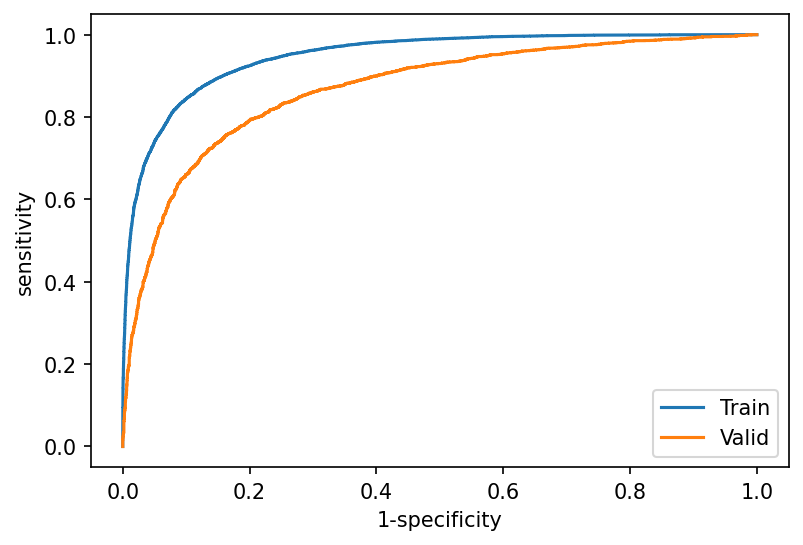

efficientnet-phospho-B-15
Kfold_cv_mean: 0.803564


In [37]:
best_acc_sum = 0
for fold, (tr_idx, val_idx) in enumerate(kf2.split(dfr2)):
    
    print('Fold: {:d}'.format(fold))
    BATCH_SIZE = 16

    train_set = data_utils.TensorDataset(torch.tensor(dfr2[tr_idx]), torch.tensor(dfl2[tr_idx]))
    valid_set = data_utils.TensorDataset(torch.tensor(dfr2[val_idx]),torch.tensor(dfl2[val_idx]))


    train_loader = data_utils.DataLoader(train_set, batch_size=BATCH_SIZE, pin_memory=True, shuffle=True)
    valid_loader = data_utils.DataLoader(valid_set, batch_size=BATCH_SIZE, shuffle=True)


    dataloaders = {'train':train_loader,'valid':valid_loader}
    dataset_sizes = {x: len(dataloaders[x]) for x in ['train', 'valid']}
    
    model = train_model(model, optimizer, scheduler, 50)
    
    plt.figure(dpi = 150)
    plt.plot(Trainfprs, Traintprs, label= 'Train')
    plt.plot(Validfprs, Validtprs, label= 'Valid')
    #plt.plot(TrainLossdata, label= 'Train', color='lightcoral', linewidth = 4)
    plt.xlabel("1-specificity",fontsize =10)
    plt.ylabel("sensitivity",fontsize =10)
    plt.legend(fontsize = 10)
    plt.xlim()
    plt.ylim()
    plt.show()
    best_acc_sum += best_acc
    del model
    allele = 'phospho-B-15'
    model = EfficientNet.from_name(f'efficientnet-{allele}')
    criterion = nn.BCELoss()
    optimizer = RAdam(model.parameters())
    scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=100, gamma=0.1)
    
    save_dir = f'Weight/batch_50_SYTratiodata_randomstate{random_state}/saved_model5/Efficientnet_{fold+1}_kernel_3_ms_only_same_ratio'
    writer = SummaryWriter(save_dir)
    
    if fold == 4:
        print('Kfold_cv_mean: {:2f}'.format(best_acc_sum/(fold+1)))

In [ ]:
results = results[:32613]

In [ ]:
results = []

for out in outputs:
    results.append(int(out.cpu().detach()))

In [ ]:
dfl2[tr_idx]

In [ ]:
np.bincount(dfl2[tr_idx])

In [ ]:
#위가 마지막 train작업 이제 test돌리면 됨

In [26]:
# allele = 'phospho-B-15'
# model = EfficientNet.from_name(f'efficientnet-{allele}')
# model = nn.DataParallel(model)
# model.load_state_dict(torch.load('/home/geonwon/Code'
#                                  '/saved_model2'
#                                  '/Efficientnet_1_kernel_3_ms_only_same_ratio/best_16.pth')['state_dict'])
# model.eval()

efficientnet-phospho-B-15


DataParallel(
  (module): EfficientNet(
    (_conv_stem): Conv2dStaticSamePadding(
      1, 8, kernel_size=(3, 3), stride=(2, 2), bias=False
      (static_padding): ZeroPad2d(padding=(1, 1, 0, 1), value=0.0)
    )
    (_bn0): BatchNorm2d(8, eps=0.001, momentum=0.010000000000000009, affine=True, track_running_stats=True)
    (_blocks): ModuleList(
      (0): MBConvBlock(
        (_depthwise_conv): Conv2dStaticSamePadding(
          8, 8, kernel_size=(3, 3), stride=[1, 1], groups=8, bias=False
          (static_padding): ZeroPad2d(padding=(1, 1, 1, 1), value=0.0)
        )
        (_bn1): BatchNorm2d(8, eps=0.001, momentum=0.010000000000000009, affine=True, track_running_stats=True)
        (_se_reduce): Conv2dStaticSamePadding(
          8, 2, kernel_size=(3, 3), stride=(1, 1)
          (static_padding): ZeroPad2d(padding=(1, 1, 1, 1), value=0.0)
        )
        (_se_expand): Conv2dStaticSamePadding(
          2, 8, kernel_size=(3, 3), stride=(1, 1)
          (static_padding): ZeroPad

In [27]:
# criterion = nn.BCELoss()
# optimizer = RAdam(model.parameters())
# scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=200, gamma=0.1)

# #Writer will output to ./runs/ directory by default
# save_dir = f'saved_test_model/Efficientnet_{allele}_kernel_3_ms_only_same_ratio'
# writer = SummaryWriter(save_dir)

In [28]:
# def test_model(model, optimizer, scheduler, num_epochs=200):
    
    
#     device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
#     since = time.time()

#     #best_model_wts = model.state_dict()
#     model.load_state_dict(torch.load('/home/geonwon/Code'
#                                  '/saved_model_EfficientNet_training(Train21266+Val7089+Test7089)preproesssing3'
#                                  '/Efficientnet_phospho-B-15_kernel_3_ms_only_same_ratio/best_49.pth')['state_dict'])
#     best_loss = 1000.0
    
#     if torch.cuda.device_count() > 1:
#         print("Testing on ", torch.cuda.device_count(), "GPUs!")
#         #model = nn.DataParallel(model)

#     model.to(device)
#     #criterion.to(device)
#     #model.eval()
    
#     for epoch in tqdm(range(num_epochs)):
#         print('-' * 60)
#         print('Epoch {}/{}'.format(epoch+1, num_epochs))  
        
#         # Test step
#         test_loss = 0.0
#         test_corrects = 0.0
#         test_precision, test_recall, test_f1 = 0.0, 0.0, 0.0
        
#         for data in tqdm(dataloaders['test']):
#              # get the inputs
#             inputs, labels = data
#             inputs = Variable(inputs.to(device, dtype=torch.float))
#             labels = Variable(labels.to(device))
            
#             # zero the parameter gradients
#             optimizer.zero_grad()

#             # forward
#             outputs = model(inputs)
#             preds = (outputs>=0.5).float()
#             #_, preds = torch.max(outputs.data, 1)
#             #loss = F.binary_cross_entropy(outputs, labels.float().view(-1,1)).to(device)
#             #loss = F1_Loss(labels.float().view(-1,1).cpu(), outputs.cpu())
#             precision, recall, f1 = precision_recall(labels.float().view(-1,1).cpu(), outputs.cpu())
#             loss = criterion(outputs, labels.float().view(-1,1)).to(device)



#             # statistics
#             test_loss += loss.data
#             test_precision += precision.data
#             test_recall += recall.data
#             test_f1 += f1.data
#             test_corrects += accuracy_score(labels.cpu(), preds.cpu())

#         epoch_test_loss = test_loss / dataset_sizes['test']
#         epoch_test_precision = test_precision / dataset_sizes['test']
#         epoch_test_recall = test_recall / dataset_sizes['test']
#         epoch_test_f1 = test_f1 / dataset_sizes['test']
#         epoch_test_acc = test_corrects / dataset_sizes['test']


#         writer.add_scalars('Loss' , {'test':epoch_test_loss}, epoch)
#         writer.add_scalars('Accuracy' , {'test':epoch_test_acc},  epoch)
#         writer.add_scalars('F1' , {'test':epoch_test_f1},  epoch)
#         writer.add_scalars('precision' , {'test':epoch_test_precision},  epoch)
#         writer.add_scalars('recall' , {'test':epoch_test_recall},  epoch)



#         print('{} Loss: {:.4f} Acc: {:.4f} F1: {:.4f} recall: {:.4f}'.format(
#             'test', epoch_test_loss, epoch_test_acc, epoch_test_f1,epoch_test_recall ))

#         # deep copy the model
#         if  epoch_test_loss < best_loss:
#             best_loss = epoch_test_loss
#             best_model_wts = model.state_dict()
#             # save
#             checkpoint = {'model': model,
#                       #'state_dict': model.module.state_dict(),
#                           'state_dict': model.state_dict(),
#                       'optimizer' : optimizer.state_dict()}

#             savePath = "{}/best_{}.pth".format(save_dir, epoch+1)
#             torch.save(checkpoint, savePath)
#         else:
#             # save
#             checkpoint = {'model': model,
#                       #'state_dict': model.module.state_dict(),
#                           'state_dict': model.state_dict(),
#                       'optimizer' : optimizer.state_dict()}

#             savePath = "{}/{}.pth".format(save_dir, epoch+1)
#             torch.save(checkpoint, savePath)


#         print('-' * 60)
#         print()         

#     time_elapsed = time.time() - since
#     print('Test complete in {:.0f}m {:.0f}s'.format(
#         time_elapsed // 60, time_elapsed % 60))
#     print('Best test Loss: {:4f}'.format(best_loss))
#     # load best model weights
#     #model.load_state_dict(best_model_wts)
#     return model

In [29]:
# BATCH_SIZE = 1

# test_set = data_utils.TensorDataset(torch.tensor(xTest),torch.tensor(yTest))


# test_loader = data_utils.DataLoader(test_set, batch_size=BATCH_SIZE,shuffle= False, pin_memory = True)


# dataloaders = {'test':test_loader}
# dataset_sizes = {x: len(dataloaders[x]) for x in ['test']}
# #custom dataloaders로 불러올때마다 sampling 다르게해서 추출하기

NameError: name 'xTest' is not defined

In [ ]:
# model = test_model(model, optimizer, scheduler, 10)

In [35]:
# summary(model, input_size=(1, 336, 15))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
         ZeroPad2d-1           [-1, 1, 337, 17]               0
Conv2dStaticSamePadding-2            [-1, 8, 168, 8]              72
       BatchNorm2d-3            [-1, 8, 168, 8]              16
              Mish-4            [-1, 8, 168, 8]               0
         ZeroPad2d-5           [-1, 8, 170, 10]               0
Conv2dStaticSamePadding-6            [-1, 8, 168, 8]              72
       BatchNorm2d-7            [-1, 8, 168, 8]              16
              Mish-8            [-1, 8, 168, 8]               0
         ZeroPad2d-9              [-1, 8, 3, 3]               0
Conv2dStaticSamePadding-10              [-1, 2, 1, 1]             146
             Mish-11              [-1, 2, 1, 1]               0
        ZeroPad2d-12              [-1, 2, 3, 3]               0
Conv2dStaticSamePadding-13              [-1, 8, 1, 1]             152
        ZeroPad2d

In [ ]:
# roc_auc_score(ValidTruedata, ValidScoredata)